# General Notes 
when importing strax / straxen utilix DB initialization times out every time due to a known prolbem, this takes 2 minutes, it is safe to interrupt the kernel in this time, it will kill the waiting process only and then continue as if the kernel was never interrupted

If i gave you krypton data it has to go into the path:

/Code/processed_data/new_Kr or ./processed_data/new_Kr where . is the main git dir 

Before running cells collapse every header and figure out what you want to run

Other relevant files for replication are:

MC_AnodeMesh.ipynb : Did some plotting there + the small MC simulations for the anode mesh 

# On server:


midway3 (adjust ram as needed running everything in sequence in this cell is not possible due to tf leaving a lot of dead memory)

./start_jupyter.sh --ram 163848 --partition caslake --tag 2024.03.1 --max_hours 12 

pattern_map_data can not be downlaoded in the container and I cant figure out how to find the cached version and have straxen on server recognize it so instead I save it explicitly and copy it over with rsync

Note that a number of packages need to be installed for all of this to work, since messing with custom singularity images is not something I want to do, simply clone THE SPECIFIC VERSION (there is no leeway here, the import order should also not be changed) in the path specified below  

# on Docker use my dockerfile

go into the main directory (directory where docker-compose lives) and run 

docker-compose up 

or equivalently if docker-compose is not available 

docker build -t straxen . && docker run -it --name straxen --workdir /Code -v ./:/Code -p 8887:8887 straxen /bin/bash -c "source /opt/XENONnT/anaconda/bin/activate && conda activate XENONnT_el9.2024.10.4 && jupyter notebook --port 8887 --ip=0.0.0.0 --no-browser --allow-root --NotebookApp.token='None'"

The jupyter notebook for either method will be available at : http://127.0.0.1:8887/tree?token=None

Extra packages are installed with %pip install as I did not want to do Dockerfiles and wanted to mirror the structure of the workable server version, either way this should not be a problem with the limiting factor for reproducibility being pips dependency solver, should at any point this stop working due to pip misunderstanding the dependencies simply clone the packages as done for the server version and hope that the docker image hosted on docker hub did not change. Specifically tensorflow-probability will fail should this have changed


#### This entire section needs to be run first

For replication the following needs changing:
- The first cell run as you see fit - I used it to not clog up all of my cores, but it can be safely left out (or adjusted to less than your maximum number of cores)
- The second cell checks Midway vs local : Needs to be modified 

At the end of this section the following line is executed

data_path = "/Code/processed_data/new_Kr"

Overwriting the previously defined data_path - this is for Krypton data loading and if you received data from me the data needs to be extracted to this location

In [38]:
"""
Limit thread count to actually be able to use the device will running code
"""


import os
os.environ["OMP_NUM_THREADS"]  = "21"
os.environ["MKL_NUM_THREADS"]  = "21"
os.environ["OPENBLAS_NUM_THREADS"] = "21"
os.environ["NUMEXPR_NUM_THREADS"]  = "21"
os.sched_setaffinity(0, set(range(21))) 

import tensorflow as tf

tf.config.threading.set_intra_op_parallelism_threads(20)
tf.config.threading.set_inter_op_parallelism_threads(20)

In [39]:
"""
Here i dispatch server vs local specifically in regards to the way paths are mounted in container vs server

If you run on server the username needs changing otherwise this will work 
"""

username = 'fsemler'

import os
print(os.getcwd())
import socket
import sys
# We add this either way - doesnt make a difference for the docker env
print(socket.gethostname())
EXTRACTED_DIR = "/scratch/midway3/"+username+"/monotonic-nn-0.3.5"
sys.path.append(EXTRACTED_DIR)
# Change dir
if '/Code' in os.getcwd():
    os.chdir('/Code/ActualThesisWork')
    # Change default xenon config path - dont think it makes a difference 
    os.environ["XENON_CONFIG"] = "/Code/xenon.config"
    pass
else:
    os.chdir('/scratch/midway3/'+username)
print(os.getcwd())
print(os.listdir(os.getcwd()))

/Code/ActualThesisWork
db30aa633f3c
False
/Code/ActualThesisWork
['CurveFitEntirerLCE.ipynb', 'layer_reimplementation_np.py', 'misc.ipynb', 'MiscPlotting.ipynb', 'reimplementation_verification.ipynb', 'biased_model_full_trained.h5', '__pycache__', 'Train_GCN.ipynb', 'strax_data', 'test_rLCE+MiscComponents.ipynb', 'PMT_calibration.ipynb', 'filtering_data.ipynb', 'Replicate.sync-conflict-20241019-125336-66OAXDZ.ipynb', 'test_rLCE_against_NN.ipynb', 'tpc_structure.ipynb', 'ownMCS2EmissionPlots', 'data', 'NotesOnServer', 'models', 'ShenyangSR2_RadialLCE.ipynb', 'MC_AnodeMesh.ipynb', 'Irrelevant', 'layer_definitions.py', 'README.md', 'CurveFit_FirstBiased.ipynb', 'CurveFit_FirstBiased.sync-conflict-20250429-115302-FF7LCQH.ipynb', 'data.npy', 'process_raw_local.ipynb', 'retrieving_data.ipynb', 'Anode_To_Gate.ipynb', 'NewLoss_NN.ipynb', 'layer_reimplementations_jax.py', 'CurveFitLCEJax.ipynb', 'GeoemetricAndGeneralInvestigation.ipynb', 'functions.py', 'OfficialLCEs.ipynb', 'Old', 's2_map.pkl'

In [40]:
"""Only in local Docker env not on server -- didnt want to write a docker file as this adds complexity the below should be as reproducible as pip can be 

This has to be the order by the  way otherwise there will be a dependency conflict
"""
if '/Code' not in os.getcwd():
    raise Exception("This cell is only run in local env, ons erver clone these repos with the specific versioning")

%pip install monotonic-nn==0.3.5 # Just cloned it into a dir 
%pip install tensorflow_probability==0.23 # Comes with 04.03.24
%pip install tensorflow_addons==0.23.0
%pip install tensorflow==2.15

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [41]:
import sys, os
#import straxen raises an error something like PID not found for tornado 
import numpy as np
import tensorflow as tf
#tf.config.run_functions_eagerly(True)

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
# Monotonically inc/dec Dense Layer 
from airt.keras.layers import MonoDense


"""
Import the custom written functions 
"""
sys.path.append(os.getcwd())
from functions import *
# Note some things are dualy defined layer definitions has the up to date
from layer_definitions import *

"""
Below is some outdated code, I used to have one dead pmt in fitting that was removed, 
I still have it in here to define some variables in case this error appears so i can index it out (missing_dead_not_dead_idx)
"""

# Its refusing to download it so i just pasted it from a kernel where it could
pmt_pos_top = np.array([[-1.38753e+01, -6.40872e+01],[-2.08129e+01, -6.00818e+01],[-2.77506e+01, -5.60763e+01],[-3.46882e+01, -5.20709e+01],[-4.16259e+01, -4.80654e+01],[-4.85635e+01, -4.40600e+01],[-1.67313e-05, -6.40872e+01],[-6.93766e+00, -6.00818e+01],[-1.38753e+01, -5.60763e+01],[-2.08129e+01, -5.20709e+01],[-2.77506e+01, -4.80654e+01],[-3.46882e+01, -4.40600e+01],[-4.16259e+01, -4.00545e+01],[-4.85635e+01, -3.60491e+01],[-5.55012e+01, -3.20436e+01],[ 1.38753e+01, -6.40872e+01],[ 6.93763e+00, -6.00818e+01],[-1.46399e-05, -5.60763e+01],[-6.93766e+00, -5.20709e+01],[-1.38753e+01, -4.80654e+01],[-2.08129e+01, -4.40600e+01],[-2.77506e+01, -4.00545e+01],[-3.46882e+01, -3.60491e+01],[-4.16259e+01, -3.20436e+01],[-4.85635e+01, -2.80382e+01],[-5.55012e+01, -2.40327e+01],[-6.24388e+01, -2.00273e+01],[ 2.08129e+01, -6.00818e+01],[ 1.38753e+01, -5.60763e+01],[ 6.93763e+00, -5.20709e+01],[-1.25485e-05, -4.80654e+01],[-6.93766e+00, -4.40600e+01],[-1.38753e+01, -4.00545e+01],[-2.08129e+01, -3.60491e+01],[-2.77506e+01, -3.20436e+01],[-3.46882e+01, -2.80382e+01],[-4.16259e+01, -2.40327e+01],[-4.85635e+01, -2.00273e+01],[-5.55012e+01, -1.60218e+01],[-6.24388e+01, -1.20164e+01],[ 2.77506e+01, -5.60763e+01],[ 2.08129e+01, -5.20709e+01],[ 1.38753e+01, -4.80654e+01],[ 6.93763e+00, -4.40600e+01],[-1.04571e-05, -4.00545e+01],[-6.93765e+00, -3.60491e+01],[-1.38753e+01, -3.20436e+01],[-2.08129e+01, -2.80382e+01],[-2.77506e+01, -2.40327e+01],[-3.46882e+01, -2.00273e+01],[-4.16259e+01, -1.60218e+01],[-4.85635e+01, -1.20164e+01],[-5.55012e+01, -8.01092e+00],[-6.24388e+01, -4.00547e+00],[ 3.46882e+01, -5.20709e+01],[ 2.77506e+01, -4.80654e+01],[ 2.08129e+01, -4.40600e+01],[ 1.38753e+01, -4.00545e+01],[ 6.93763e+00, -3.60491e+01],[-8.36565e-06, -3.20436e+01],[-6.93765e+00, -2.80382e+01],[-1.38753e+01, -2.40327e+01],[-2.08129e+01, -2.00273e+01],[-2.77506e+01, -1.60218e+01],[-3.46882e+01, -1.20164e+01],[-4.16259e+01, -8.01091e+00],[-4.85635e+01, -4.00546e+00],[-5.55012e+01, -1.44897e-05],[-6.24388e+01,  4.00544e+00],[ 4.16259e+01, -4.80654e+01],[ 3.46882e+01, -4.40600e+01],[ 2.77506e+01, -4.00545e+01],[ 2.08129e+01, -3.60491e+01],[ 1.38753e+01, -3.20436e+01],[ 6.93764e+00, -2.80382e+01],[-6.27423e-06, -2.40327e+01],[-6.93765e+00, -2.00273e+01],[-1.38753e+01, -1.60218e+01],[-2.08129e+01, -1.20164e+01],[-2.77506e+01, -8.01091e+00],[-3.46882e+01, -4.00546e+00],[-4.16259e+01, -1.08673e-05],[-4.85635e+01,  4.00544e+00],[-5.55011e+01,  8.01089e+00],[-6.24388e+01,  1.20163e+01],[ 4.85635e+01, -4.40600e+01],[ 4.16259e+01, -4.00545e+01],[ 3.46882e+01, -3.60491e+01],[ 2.77506e+01, -3.20436e+01],[ 2.08129e+01, -2.80382e+01],[ 1.38753e+01, -2.40327e+01],[ 6.93764e+00, -2.00273e+01],[-4.18282e-06, -1.60218e+01],[-6.93765e+00, -1.20164e+01],[-1.38753e+01, -8.01091e+00],[-2.08129e+01, -4.00546e+00],[-2.77506e+01, -7.24486e-06],[-3.46882e+01,  4.00544e+00],[-4.16259e+01,  8.01089e+00],[-4.85635e+01,  1.20163e+01],[-5.55011e+01,  1.60218e+01],[-6.24388e+01,  2.00272e+01],[ 4.85635e+01, -3.60491e+01],[ 4.16259e+01, -3.20436e+01],[ 3.46882e+01, -2.80382e+01],[ 2.77506e+01, -2.40327e+01],[ 2.08129e+01, -2.00273e+01],[ 1.38753e+01, -1.60218e+01],[ 6.93764e+00, -1.20164e+01],[-2.09141e-06, -8.01090e+00],[-6.93764e+00, -4.00545e+00],[-1.38753e+01, -3.62243e-06],[-2.08129e+01,  4.00545e+00],[-2.77506e+01,  8.01090e+00],[-3.46882e+01,  1.20163e+01],[-4.16259e+01,  1.60218e+01],[-4.85635e+01,  2.00272e+01],[-5.55011e+01,  2.40327e+01],[ 5.55011e+01, -3.20436e+01],[ 4.85635e+01, -2.80382e+01],[ 4.16259e+01, -2.40327e+01],[ 3.46882e+01, -2.00273e+01],[ 2.77506e+01, -1.60218e+01],[ 2.08129e+01, -1.20163e+01],[ 1.38753e+01, -8.01090e+00],[ 6.93764e+00, -4.00545e+00],[-0.00000e+00,  0.00000e+00],[-6.93764e+00,  4.00545e+00],[-1.38753e+01,  8.01090e+00],[-2.08129e+01,  1.20164e+01],[-2.77506e+01,  1.60218e+01],[-3.46882e+01,  2.00273e+01],[-4.16259e+01,  2.40327e+01],[-4.85635e+01,  2.80382e+01],[-5.55011e+01,  3.20436e+01],[ 5.55011e+01, -2.40327e+01],[ 4.85635e+01, -2.00272e+01],[ 4.16259e+01, -1.60218e+01],[ 3.46882e+01, -1.20163e+01],[ 2.77506e+01, -8.01090e+00],[ 2.08129e+01, -4.00545e+00],[ 1.38753e+01,  3.62243e-06],[ 6.93764e+00,  4.00545e+00],[ 2.09141e-06,  8.01090e+00],[-6.93764e+00,  1.20164e+01],[-1.38753e+01,  1.60218e+01],[-2.08129e+01,  2.00273e+01],[-2.77506e+01,  2.40327e+01],[-3.46882e+01,  2.80382e+01],[-4.16259e+01,  3.20436e+01],[-4.85635e+01,  3.60491e+01],[ 6.24388e+01, -2.00272e+01],[ 5.55011e+01, -1.60218e+01],[ 4.85635e+01, -1.20163e+01],[ 4.16259e+01, -8.01089e+00],[ 3.46882e+01, -4.00544e+00],[ 2.77506e+01,  7.24486e-06],[ 2.08129e+01,  4.00546e+00],[ 1.38753e+01,  8.01091e+00],[ 6.93765e+00,  1.20164e+01],[ 4.18282e-06,  1.60218e+01],[-6.93764e+00,  2.00273e+01],[-1.38753e+01,  2.40327e+01],[-2.08129e+01,  2.80382e+01],[-2.77506e+01,  3.20436e+01],[-3.46882e+01,  3.60491e+01],[-4.16259e+01,  4.00545e+01],[-4.85635e+01,  4.40600e+01],[ 6.24388e+01, -1.20163e+01],[ 5.55011e+01, -8.01089e+00],[ 4.85635e+01, -4.00544e+00],[ 4.16259e+01,  1.08673e-05],[ 3.46882e+01,  4.00546e+00],[ 2.77506e+01,  8.01091e+00],[ 2.08129e+01,  1.20164e+01],[ 1.38753e+01,  1.60218e+01],[ 6.93765e+00,  2.00273e+01],[ 6.27423e-06,  2.40327e+01],[-6.93764e+00,  2.80382e+01],[-1.38753e+01,  3.20436e+01],[-2.08129e+01,  3.60491e+01],[-2.77506e+01,  4.00545e+01],[-3.46882e+01,  4.40600e+01],[-4.16259e+01,  4.80654e+01],[ 6.24388e+01, -4.00544e+00],[ 5.55012e+01,  1.44897e-05],[ 4.85635e+01,  4.00546e+00],[ 4.16259e+01,  8.01091e+00],[ 3.46882e+01,  1.20164e+01],[ 2.77506e+01,  1.60218e+01],[ 2.08129e+01,  2.00273e+01],[ 1.38753e+01,  2.40327e+01],[ 6.93765e+00,  2.80382e+01],[ 8.36565e-06,  3.20436e+01],[-6.93763e+00,  3.60491e+01],[-1.38753e+01,  4.00545e+01],[-2.08129e+01,  4.40600e+01],[-2.77506e+01,  4.80654e+01],[-3.46882e+01,  5.20709e+01],[ 6.24388e+01,  4.00547e+00],[ 5.55012e+01,  8.01092e+00],[ 4.85635e+01,  1.20164e+01],[ 4.16259e+01,  1.60218e+01],[ 3.46882e+01,  2.00273e+01],[ 2.77506e+01,  2.40327e+01],[ 2.08129e+01,  2.80382e+01],[ 1.38753e+01,  3.20436e+01],[ 6.93765e+00,  3.60491e+01],[ 1.04571e-05,  4.00545e+01],[-6.93763e+00,  4.40600e+01],[-1.38753e+01,  4.80654e+01],[-2.08129e+01,  5.20709e+01],[-2.77506e+01,  5.60763e+01],[ 6.24388e+01,  1.20164e+01],[ 5.55012e+01,  1.60218e+01],[ 4.85635e+01,  2.00273e+01],[ 4.16259e+01,  2.40327e+01],[ 3.46882e+01,  2.80382e+01],[ 2.77506e+01,  3.20436e+01],[ 2.08129e+01,  3.60491e+01],[ 1.38753e+01,  4.00545e+01],[ 6.93766e+00,  4.40600e+01],[ 1.25485e-05,  4.80654e+01],[-6.93763e+00,  5.20709e+01],[-1.38753e+01,  5.60763e+01],[-2.08129e+01,  6.00818e+01],[ 6.24388e+01,  2.00273e+01],[ 5.55012e+01,  2.40327e+01],[ 4.85635e+01,  2.80382e+01],[ 4.16259e+01,  3.20436e+01],[ 3.46882e+01,  3.60491e+01],[ 2.77506e+01,  4.00545e+01],[ 2.08129e+01,  4.40600e+01],[ 1.38753e+01,  4.80654e+01],[ 6.93766e+00,  5.20709e+01],[ 1.46399e-05,  5.60763e+01],[-6.93763e+00,  6.00818e+01],[-1.38753e+01,  6.40872e+01],[ 5.55012e+01,  3.20436e+01],[ 4.85635e+01,  3.60491e+01],[ 4.16259e+01,  4.00545e+01],[ 3.46882e+01,  4.40600e+01],[ 2.77506e+01,  4.80654e+01],[ 2.08129e+01,  5.20709e+01],[ 1.38753e+01,  5.60763e+01],[ 6.93766e+00,  6.00818e+01],[ 1.67313e-05,  6.40872e+01],[ 4.85635e+01,  4.40600e+01],[ 4.16259e+01,  4.80654e+01],[ 3.46882e+01,  5.20709e+01],[ 2.77506e+01,  5.60763e+01],[ 2.08129e+01,  6.00818e+01],[ 1.38753e+01,  6.40872e+01]]) 
pmt_pos_top = pmt_pos_top.astype('float32')
#pmt_pos_top = straxen.pmt_positions()[straxen.pmt_positions()['array'] == 'top'].loc[:,['x','y']].to_numpy().astype('float32')
pmt_positions = pmt_pos_top[:,0:2]
not_dead_pmts = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 157, 158, 159, 160, 161, 162, 163, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252]
dead_pmts = [28, 108, 121, 144, 156, 164, 177] 
missing_dead_og_indx = [174]
missing_dead_not_dead_idx = np.argwhere(np.array(not_dead_pmts) == 174)[0]

not_dead_pmts = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 157, 158, 159, 160, 161, 162, 163, 165, 166, 167, 168, 169, 170, 171, 172, 173, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252]
dead_pmts = [28, 108, 121, 144, 156, 164, 177, 174]

n_alive_pmts = len(not_dead_pmts)
n_pmts = len(not_dead_pmts)+len(dead_pmts)
angle_model_path = 'angle_model.keras'
curr_path = os.getcwd()

In [42]:

class AdvCoordTransform(tf.keras.layers.Layer):
    """Convert (batch, pos) positions to (batch, pmt, r) coordinates, where

    :param X: (m, n_pmts, 2), positions in detector's (x,y) cartesian coords / tpc_r.
    :returns: (m, n_pmts, 2), positions in (de, di)

    Taken from Shenyang Shi see: https://xe1t-wiki.lngs.infn.it/doku.php?id=shenyang:s2_pattern_likelihood
    """
    def __init__(self, pmt_positions, tpc_r,  **kwargs):
        super().__init__(**kwargs)
        self.pmt_pos = tf.constant(pmt_positions, dtype=tf.float32, name="pmt_pos")
        self.tpc_r = tf.constant(tpc_r, dtype=tf.float32, name="tpc_r")

    def build(self, input_shape):
        super().build(input_shape)

    def call(self, x):
        # Event position
        xx_abs, yy_abs = x[:, :, 0], x[:, :, 1]
        xx, yy = xx_abs / self.tpc_r, yy_abs / self.tpc_r
        rr = (xx**2 + yy**2) ** 0.5
        ww = 1 - rr  # to wall position

        zz = x - self.pmt_pos
        xp, yp = zz[:, :, 0] / self.tpc_r, zz[:, :, 1] / self.tpc_r
        rp = (xp**2 + yp**2) ** 0.5

        qp = norm_angle(
            tf.atan2(yp, xp) + np.pi / 2 - tf.atan2(self.pmt_pos[:, 1], self.pmt_pos[:, 0])
        )

        z1 = x * 0 + self.pmt_pos

        # To supporting wire position

        wr1 = (
            tf.math.abs(tf.math.sqrt(3.0) * xx_abs - yy_abs - 26.30)
            / tf.math.sqrt(1 + (tf.math.sqrt(3.0)) ** 2)
            / self.tpc_r
        )
        wr2 = (
            tf.math.abs(tf.math.sqrt(3.0) * xx_abs - yy_abs + 26.30)
            / tf.math.sqrt(1 + (tf.math.sqrt(3.0)) ** 2)
            / self.tpc_r
        )

        # rotated to horizontal plane
        angle = -math.pi / 3
        xx_rotated = xx_abs * tf.math.cos(angle) - yy_abs * tf.math.sin(angle)
        yy_rotated = yy_abs * tf.math.sin(angle) + yy_abs * tf.math.cos(angle)
        to_anode = (
            tf.math.minimum(
                xx_rotated - (xx_rotated // 0.5) * 0.5,
                0.5 - (xx_rotated - (xx_rotated // 0.5) * 0.5),
            )
            / self.tpc_r
        )

        xx_rotated = xx_rotated / self.tpc_r
        yy_rotated = yy_rotated / self.tpc_r

        return tf.stack(
            [
                rp,
                sym_angle(qp) * rp**0.5,
                sym_angle(qp + np.pi / 2) * rp**0.5,
                xx_rotated,
                yy_rotated,
                to_anode,
                rr,
                ww,
                z1[:, :, 0],
                z1[:, :, 1],
                wr1,
                wr2,
            ],
            axis=2,
        )


In [43]:
# Function Definitions 
### --------------------- Position Updates --------------------- ###

def do_grid_search(pos, pattern, model, min_resolution, use_mean = True, start_factor = 0):
    new_pos = pos.copy()
    floss = model.predict({'xy':new_pos, 'pattern':pattern})
    if use_mean:
        floss = np.mean(floss, axis=-1)
    factor = start_factor
    while (1/(2**factor)) >= min_resolution:
        step = (2 ** factor)
        print("Resolution {} : Factor {}".format(1 / step, factor))
        for i in [-1,0,1]:
            for j in [-1,0,1]:
                if i == 0 and j == 0:
                    continue
                offset = np.array([i, j], dtype=new_pos.dtype) / step
                loss = model.predict({'xy':new_pos+offset, 'pattern':pattern})
                if use_mean:
                    loss = np.mean(loss, axis=-1)
                bmap = loss < floss
                if np.any(bmap):
                    new_pos[bmap] += offset
                    floss[bmap] = loss[bmap]
        factor += 1
    return new_pos


def make_encoder(model, x, y):
    n_to_update = len(x)
    input_x = keras.layers.Input(shape=(1,))
    # Position embedding
    m = keras.layers.Embedding(n_to_update, 2, input_length = 1, name='embed_pos')(input_x)
    # Pattern Embedding
    pat = keras.layers.Embedding(n_to_update, n_alive_pmts, input_length = 1, name='embed_pat')(input_x)
    m = keras.layers.Flatten()(m)
    pat = keras.layers.Flatten()(pat)
    m = model({'xy': m, 'pattern':pat})
    rlce_encoder = keras.models.Model(inputs= input_x, outputs=m, name="Position_Updater")
    # radial mc 
    rlce_encoder.layers[-1].trainable = False
    rlce_encoder.get_layer('embed_pos').set_weights([x])
    rlce_encoder.get_layer('embed_pat').set_weights([y])
    rlce_encoder.get_layer('embed_pat').trainable = False
    return rlce_encoder


# -------------------------------- Generate Parametrized Models ----------------------------------------------#
def gen_direct_detect_model(activation_funcs = ['tanh', 'tanh', 'exponential'], dense_units = [2**6, 2**6], monodense=True, biased_in = False, large_direct=True, x2y2 = True, dropout = True):
    # Generate submodels to easily extract them later
    input_1 = tf.keras.layers.Input(shape=(2,), name='xy_1', dtype=tf.float32)
    # Compute Inpute
    pmt_dim1 = tf.keras.layers.RepeatVector(n_alive_pmts, name='Repeat_to_n_pmts')(input_1)
    norm = 66.4
    if not biased_in:
        if not x2y2:
            get_radius = GetRadius((n_alive_pmts, 1), keras.backend.variable(pmt_positions[not_dead_pmts], dtype='float32'), name='Event_PMT_distance')
            get_radius.trainable = False
            mono_indicator = [1]
            event_PMT_Dist = get_radius(pmt_dim1)
            in_dim = 1
            x_PMT_dist = keras.layers.Reshape((n_alive_pmts,in_dim), name="Radial_Reshape")(event_PMT_Dist)
        else:
            get_radius = GetX2Y2(keras.backend.variable(pmt_positions[not_dead_pmts], dtype='float32'), name='Event_PMT_distance')
            get_radius.trainable = False
            mono_indicator = [1,1]
            event_PMT_Dist = get_radius(pmt_dim1)
            x_PMT_dist = event_PMT_Dist
            norm = 66.4**2

    else:
        # I broke this brancgh i am not sure how it was meant to go anymore but not used in any final results
        get_radius = BiasedDirectIn(pmt_positions[not_dead_pmts], pmt_r = 7.62/2,  name='Event_PMT_distance_WithAnodeShadow')
        get_radius.trainable = True
        in_dim = 2
        x_PMT_dist = event_PMT_Dist
        event_PMT_Dist = get_radius(pmt_dim1)
        # Opposite of what we expect the behavior to be (final layer inverts)
        # x_dist, y_dist, x_rot_coord
        mono_indicator = [1,1]
    #x_PMT_dist = keras.layers.Reshape((n_alive_pmts,in_dim), name="Radial_Reshape")(x_PMT_dist)
    #x_PMT_dist = keras.layers.BatchNormalization(name='Direct_batch_norm')(x_PMT_dist)
    x_PMT_dist = keras.layers.Rescaling(1./(norm), name='Direct_batch_norm')(x_PMT_dist)
    # Do Network
    if monodense:
        x_PMT_dist = MonoDense(dense_units[0], 
                                #activation='tanh', 
                                #kernel_initializer=tf.keras.initializers.GlorotUniform(),
                                #is_convex = False, 
                                #is_concave = False, 
                                activation="elu",
                                kernel_initializer="glorot_uniform",
                                monotonicity_indicator = mono_indicator,# 1 increasing, -1 non increasing, 0 non monotonic
                                name="PMT_dist_dense_1")(x_PMT_dist)
        if large_direct:
            x_PMT_dist = MonoDense(dense_units[0], 
                                #activation='tanh', 
                                #kernel_initializer=tf.keras.initializers.GlorotUniform(),
                                #is_convex = False, 
                                #is_concave = False, 
                                activation="elu",
                                kernel_initializer="glorot_uniform",
                                monotonicity_indicator = [1],# 1 increasing, -1 non increasing, 0 non monotonic
                                name="PMT_dist_dense_1_1")(x_PMT_dist)
            x_PMT_dist = MonoDense(dense_units[0], 
                                #activation='tanh', 
                                #kernel_initializer=tf.keras.initializers.GlorotUniform(),
                                #is_convex = False, 
                                #is_concave = False, 
                                activation="elu",
                                kernel_initializer="glorot_uniform",
                                monotonicity_indicator = [1],# 1 increasing, -1 non increasing, 0 non monotonic
                                name="PMT_dist_dense_1_2")(x_PMT_dist)
        if dropout: x_PMT_dist = keras.layers.Dropout(0.2, name='Direct_Dropout')(x_PMT_dist)
        x_PMT_dist = MonoDense(dense_units[1], 
                                #activation='tanh', 
                                #kernel_initializer=tf.keras.initializers.GlorotUniform(),
                                #is_convex = False, 
                                #is_concave = False,
                                activation="elu",
                                kernel_initializer="glorot_uniform",
                                monotonicity_indicator = [1],# 1 increasing, -1 non increasing, 0 non monotonic
                                name="PMT_dist_dense_2")(x_PMT_dist)
        """x_PMT_dist = MonoDense(1, 
                                activation='exponential', 
                                kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.01), # Small so that it starts off around exp(0)
                                is_convex = True, 
                                is_concave = False, 
                                monotonicity_indicator = [-1],# 1 increasing, -1 non increasing, 0 non monotonic
                                name="PMT_dist_dense_3")(x_PMT_dist)"""
        x_PMT_dist = MonoDense(
                                1,
                                activation='softplus',
                                kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.01),
                                is_convex=True,
                                is_concave=False,
                                monotonicity_indicator=[-1],
                                name="PMT_dist_dense_3"
                            )(x_PMT_dist)
    else:# Same thing using normal dense layers
        x_PMT_dist = keras.layers.Dense(dense_units[0], 
                                activation="elu",
                                kernel_initializer="glorot_uniform",
                                name="PMT_dist_dense_1")(x_PMT_dist)
        x_PMT_dist = keras.layers.Dense(dense_units[1], 
                                activation="elu",
                                kernel_initializer="glorot_uniform",
                                name="PMT_dist_dense_2")(x_PMT_dist)
        if dropout: x_PMT_dist = keras.layers.Dropout(0.2, name='Direct_Dropout')(x_PMT_dist)
        x_PMT_dist = keras.layers.Dense(
                                1,
                                activation='softplus',
                                kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.01),
                                name="PMT_dist_dense_3"
                            )(x_PMT_dist)
    # Reshape And Normalize
    #x_PMT_dist = ReshapeArray(n_alive_pmts, name='PMTDist_Reshape')(x_PMT_dist)
    x_PMT_dist = keras.layers.Reshape((n_alive_pmts,), name="Radial_Reshape2")(x_PMT_dist)
    x_PMT_dist = NormalizationLayer(name='PMT_dist_norm')(x_PMT_dist)
    # Need to differentiate the name
    if not biased_in:
        name = "PMTDistance_Pattern_Response"
    else:
        name = "PMTDistance_Pattern_Response_WithAnodeShadow"

    model_PMT_Dist = tf.keras.Model(inputs=input_1, outputs=x_PMT_dist, name=name)
    return model_PMT_Dist

def gen_radialLCE(n_groups, group_slices, guess):
    # Input layer
    input_1 = tf.keras.layers.Input(shape=(2,), name='xy_1', dtype=tf.float32)
    # Get distance
    pmt_dim1 = tf.keras.layers.RepeatVector(n_alive_pmts, name='Repeat_to_n_pmts')(input_1)
    get_radius = GetRadius((n_alive_pmts, 1), keras.backend.variable(pmt_positions[not_dead_pmts], dtype='float32'), name='Event_PMT_distance')
    get_radius.trainable = False
    event_PMT_Dist = get_radius(pmt_dim1)
    # Apply radial lce 
    m = RadialLCELayer(name='radial_lce',guess= guess, n_groups=n_groups, group_slices=group_slices)(event_PMT_Dist)
    # Normalization Layer 
    m = NormalizationLayer(name='Normalization')(m)
    return keras.models.Model(inputs=input_1, outputs=m, name="Radial_LCE")

def gen_reflection_model(activation_funcs = ['tanh', 'tanh', 'exponential'], dense_units = [2**6, 2**6], monodense=True):
    input_2 = tf.keras.layers.Input(shape=(2,), name='xy_2', dtype=tf.float32)
    # Compute Input
    #get_wall_dist = GetWallDist((int(n_alive_pmts)+1, 1), keras.backend.variable(pmt_positions[not_dead_pmts], dtype='float32'), tpc_r= keras.backend.variable(66.4 , dtype='float32'),  name='Event_Wall_distance')
    get_wall_dist = GetWallDistPredictive(angle_model=lambda x: x, 
                                          model_path=angle_model_path, 
                                          pmt_positions=pmt_pos_top[not_dead_pmts], 
                                          tpc_r=66.4, 
                                          name='Event_Wall_distance')
    get_wall_dist.set_mode('optimize', max_iter =100, tol=1e-1)
    get_wall_dist.trainable = False
    x_Wall_dist = get_wall_dist(input_2)
    #x_Wall_dist = keras.layers.BatchNormalization(name='reflect_batch_norm')(x_Wall_dist)
    x_Wall_dist = keras.layers.Rescaling(1./66.4, name='reflect_batch_norm')(x_Wall_dist)
    # Do Network
    if monodense:
        x_Wall_dist = MonoDense(dense_units[0], 
                                activation="elu",
                                kernel_initializer="glorot_uniform",
                                monotonicity_indicator = [-1,-1],# 1 increasing, -1 non increasing, 0 non monotonic
                                name="PMT_wall_dense_1")(x_Wall_dist)
        x_Wall_dist = MonoDense(dense_units[1], 
                                activation="elu",
                                kernel_initializer="glorot_uniform",
                                monotonicity_indicator = [1],# 1 increasing, -1 non increasing, 0 non monotonic
                                name="PMT_wall_dense_2")(x_Wall_dist)
        x_Wall_dist = MonoDense(1, 
                                activation='softplus',
                                kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.01),
                                is_convex=True,
                                is_concave=False,
                                monotonicity_indicator=[1],
                                name="PMT_wall_dense_3")(x_Wall_dist)
    else:
        raise Exception("Not Implemented Error")
    # Reshape And Normalize
    x_Wall_dist = keras.layers.Reshape((n_alive_pmts,), name="Wall_Reshape")(x_Wall_dist)
    #x_Wall_dist = NormalizationLayer(name='Wall_dist_norm')(x_Wall_dist) 
    #x_Wall_dist = keras.layers.Lambda(lambda X: X/(tf.reduce_mean(X, axis=1, keepdims=True)+1e-9))(x_Wall_dist)
    model_Wall_Dist = tf.keras.Model(inputs=input_2, outputs=x_Wall_dist, name="Wall_Reflection_Pattern_Response")
    return model_Wall_Dist

def gen_perp_model(activation_funcs = ['relu', 'relu', 'sigmoid'], dense_units = [2**4, 2**4]):
    input_3 = tf.keras.layers.Input(shape=(2,), name='xy_3', dtype=tf.float32)
    # Compute Input (batch, n_pmts)
    get_perp_inputs = PerpendicularWire_Parametrization(pmt_pos_top[not_dead_pmts], pmt_r=7.62 / 2 , name='Perp_Parametrization')
    get_perp_inputs.trainable = False
    anode_in = get_perp_inputs(input_3)
    x_anode = keras.layers.BatchNormalization(name='Perp_batch_norm')(anode_in)
    # Do Network
    x_anode = tf.keras.layers.Dropout(0.2)(x_anode)
    x_anode = MonoDense(dense_units[0], 
                            activation='elu', 
                            kernel_initializer="glorot_uniform",#tf.keras.initializers.he_normal(),
                            monotonicity_indicator = [1],# 1 increasing, -1 non increasing, 0 non monotonic
                            name="perp_dense_1")(x_anode)
    x_anode = MonoDense(dense_units[1], 
                            activation='elu', 
                            kernel_initializer="glorot_uniform",#tf.keras.initializers.he_normal(),
                            monotonicity_indicator = [1],# 1 increasing, -1 non increasing, 0 non monotonic
                            name="perp_dense_2")(x_anode)
    x_anode = MonoDense(1, 
                            activation='tanh',
                            kernel_initializer=tf.keras.initializers.RandomNormal(0,1e-3),
                            bias_initializer=tf.keras.initializers.RandomNormal(0,1e-3),
                            is_convex=False,
                            is_concave=False,
                            monotonicity_indicator = [-1],# 1 increasing, -1 non increasing, 0 non monotonic
                            name="perp_dense_3")(x_anode)
    x_anode = tf.keras.layers.Lambda(lambda t: t + 1.0, name="anode_offset")(x_anode)
    x_anode = keras.layers.Reshape((245,), name="Perp_Reshape")(x_anode)
    model_anode = tf.keras.Model(inputs=input_3, outputs=x_anode, name="PerpendicularWire_Pattern_Response")
    return model_anode

def gen_anode_model(activation_funcs = ['relu', 'relu', 'sigmoid'], dense_units = [2**4, 2**4], anode_no_angle=True):
    input_3 = tf.keras.layers.Input(shape=(2,), name='xy_4', dtype=tf.float32)
    # Compute Input (batch, n_pmts)
    get_anode_inputs = Anode_Parametrization(pmt_pos=pmt_pos_top[not_dead_pmts], 
                                             pmt_r=7.62 / 2 , 
                                             anode_no_angle=anode_no_angle, 
                                             name='Anode_Parametrization')
    get_anode_inputs.trainable = False
    anode_in = get_anode_inputs(input_3)
    #anode_in = input_3
    #anode_in = keras.layers.LayerNormalization(name='anode_batch_norm')(anode_in)
    # Do Network
    x_anode = tf.keras.layers.Dropout(0.2)(anode_in)
    init_indicator = [1]
    if not anode_no_angle:
        init_indicator = [1, 0]
    x_anode = MonoDense(dense_units[0], 
                            activation='elu', 
                            kernel_initializer="glorot_uniform",#tf.keras.initializers.he_normal(),
                            # Inputs are:
                            # N wires in way, And angle relative to the wires (0->90 deg) I am not sure if this crosses more but baseds on simulation there should be maximal wire in way however, there might be weird behavior so no monotonicity
                            # For now we do monotoniclly increasing (inverse of what we want the output to be)
                            # So more wires in way incresing output, less angle increasing output and we invert in the end
                            monotonicity_indicator = init_indicator,# 1 increasing, -1 non increasing, 0 non monotonic
                            name="anode_dense_1")(x_anode)
    x_anode = MonoDense(dense_units[1], 
                            activation='elu', 
                            kernel_initializer="glorot_uniform",#tf.keras.initializers.he_normal(),
                            monotonicity_indicator = [1],# 1 increasing, -1 non increasing, 0 non monotonic
                            name="anode_dense_2")(x_anode)
    x_anode = MonoDense(1, 
                            activation="tanh",
                            kernel_initializer=tf.keras.initializers.RandomNormal(0,1e-3),
                            bias_initializer=tf.keras.initializers.RandomNormal(0,1e-3),
                            is_convex=False,
                            is_concave=False,
                            monotonicity_indicator = [-1],# 1 increasing, -1 non increasing, 0 non monotonic
                            name="anode_dense_3")(x_anode)
    x_anode = tf.keras.layers.Lambda(lambda t: t + 1.0, name="anode_offset")(x_anode)
    #x_anode = ReshapeArray(n_alive_pmts, name='Anode_Reshape')(x_anode)
    #x_anode = keras.layers.Lambda(lambda X: X/(tf.reduce_mean(X, axis=-1, keepdims=True)+1e-9))(x_anode)
    x_anode = keras.layers.Reshape((245,), name="Anode_Reshape")(x_anode)
    model_anode = tf.keras.Model(inputs=input_3, outputs=x_anode, name="Anode_Pattern_Response")
    return model_anode

def gen_anode_shadowing_bias():
    input_4 = tf.keras.layers.Input(shape=(2,), name='xy_idkWhatindexImOn', dtype=tf.float32)
    shadowing_bias = Anode_ShadowingBias(pmt_pos=pmt_pos_top[not_dead_pmts], 
                                             pmt_r=7.62 / 2,
                                             name='Anode_ShadowingBias')
    shadowing_bias.trainable = False
    x_anode = shadowing_bias(input_4)
    # Inputs in order are PMT event dist [x,y] and rot_coords [x,y]
    # I am unsure if this will even be monotonic so we just use no restraints
    init_indicator = [0,0,0,0]
    dense_units = [2**6, 2**6]
    x_anode = keras.layers.Dense(
        dense_units[0],
        activation='elu',
        kernel_initializer='glorot_uniform',
        name="anodeshadowing_dense_1"
    )(x_anode)

    # Second dense layer
    x_anode = keras.layers.Dense(
        dense_units[1],
        activation='elu',
        kernel_initializer='glorot_uniform',
        name="anodeshadowing_dense_2"
    )(x_anode)

    # Final dense layer
    x_anode = keras.layers.Dense(
        1,
        activation='tanh',
        kernel_initializer=tf.keras.initializers.RandomNormal(0, 1e-3),
        bias_initializer=tf.keras.initializers.RandomNormal(0, 1e-3),
        name="anodeshadowing_dense_3"
    )(x_anode)
    x_anode = tf.keras.layers.Lambda(lambda t: t + 1.0, name="anodeShadowing_offset")(x_anode)
    #x_anode = ReshapeArray(n_alive_pmts, name='Anode_Reshape')(x_anode)
    #x_anode = keras.layers.Lambda(lambda X: X/(tf.reduce_mean(X, axis=-1, keepdims=True)+1e-9))(x_anode)
    x_anode = keras.layers.Reshape((245,), name="AnodeShadowingBias_Reshape")(x_anode)
    model_anodeshadow = tf.keras.Model(inputs=input_4, outputs=x_anode, name="AnodeShadowingBias_Pattern_Response")
    return model_anodeshadow

def check_layer_exists(model, layer_name):
    for layer in model.layers:
        if layer.name == layer_name:
            return True
    return False


def gen_model(seed=0, # Seed for tf -> Not great for reproducibility in this form as i also randomize model loading -> Results are failry consistent so good enough
              starting_model=None, # Some starting model to source weights from (only works if model/layer names exactly align)
              include_wall = False, # Include wall reflection
              include_perp = False, # Include perpendicular wire parametrization
              include_anode = False,  #Incldue the anode parametrization
              anode_no_angle = False,# Angle in anode parametrization yay or nay
              stds=None, # In case one wants to incldue stds prior to lut computation 
              multiplication_layers = False, # Replace addition layers with multiplication layers
              radialLCE = False,# Wheter to use (Mono)Dense or Radial LCE 
              rLCE_groups = 1, # Number of groups if the radial LCE is used
              monodense = True, # If using MonoDense layers or using Dense 
              use_estimator = False, # If the chi^2 estimator for exact is used - never true - waste of computing power 
              biased_layer = False,# Wheter to add a biasing layer at the end of the model before norm
              anode_shadowing_bias = False, # Wheter to use a biasing layer for anode shadowing (applied after wall reflection - not sure what the difference to below is anymore)
              direct_bias = False, # Wheter to adda  biasing layer inside direct detection
              large_direct = True, # Wheter to use [64,64,1] or [64,64,64,64,1] for direct
              x2y2 = True, # Wheter to use two inputs x^2 and y^2 in rot frame for Direct Detection
              dropout = True # Wheter to use dropout in direct (not used anywhere other than a plot i made for my presentation)
              ):
    """
    Generates all models in every possible Configuration

    Most options are not used for the final models presented

    Defaults to a monodense direct detection model with xy input and exact eval mode on the loss function

    To generate the final parametrized model presented wall_reflection should be True its tolerance needs to be  manually increased to 1e-2 with .get_layer(..).set_call_mode('optimize', tol=1e-2)
    include_perp is technically on in the final parametrized deliverable however predicts constant so can be safely left as false achieving the same results (barring numerical error)
    """

    # Set Seed
    tf.keras.utils.set_random_seed(seed)

    # Inputs  
    input_xy = tf.keras.layers.Input(shape=(2,), name='xy', dtype=tf.float32)
    input_pattern = tf.keras.layers.Input(shape=(245,), name='pattern', dtype=tf.float32)

    # Direct Detection
    if not radialLCE and not direct_bias:
        x_PMT_dist_ =  gen_direct_detect_model(activation_funcs = ['tanh', 'tanh', 'exponential'], dense_units = [2**6, 2**6], monodense=monodense, biased_in = False, large_direct=large_direct, x2y2= x2y2)
        layer_name = 'PMTDistance_Pattern_Response'
    elif radialLCE:
        if rLCE_groups ==1:
            group_slices = np.arange(len(not_dead_pmts))
        else:
            group_slices = np.arange(len(not_dead_pmts)).reshape(-1,1)
        x_PMT_dist_ = gen_radialLCE(n_groups=rLCE_groups, group_slices=group_slices, guess=[1.6266745e+00,  9.4918861e+00, -4.2176653e-05,  7.7804564e-03,])
        layer_name = 'Radial_LCE'
    elif direct_bias:
        x_PMT_dist_ =  gen_direct_detect_model(activation_funcs = ['tanh', 'tanh', 'exponential'], dense_units = [2**6, 2**6], monodense=monodense, biased_in = True, dropout = dropout)
        layer_name = 'PMTDistance_Pattern_Response_WithAnodeShadow'
    if starting_model is not None:
        if check_layer_exists(starting_model, layer_name):
            x_PMT_dist_.set_weights(starting_model.get_layer(layer_name).get_weights())

    out = x_PMT_dist_(input_xy)

    # Anode SHadowing bias 
    if anode_shadowing_bias:
        x_anodeShadowin_ = gen_anode_shadowing_bias()
        if starting_model is not None:
            if check_layer_exists(starting_model, 'AnodeShadowingBias_Pattern_Response'):
                x_anodeShadowin_.set_weights(starting_model.get_layer('AnodeShadowingBias_Pattern_Response').get_weights())
        multip_anodeShadowBias = tf.keras.layers.Multiply( name='AnodeShadowingBias_Multip')
        out = multip_anodeShadowBias([out, x_anodeShadowin_(input_xy)])

    # Reflection
    if include_wall:
        x_Wall_dist_ = gen_reflection_model(activation_funcs = ['tanh', 'tanh', 'exponential'], dense_units = [2**6, 2**6],monodense = monodense)
        if starting_model is not None:
            if check_layer_exists(starting_model, 'Wall_Reflection_Pattern_Response'):
                x_Wall_dist_.set_weights(starting_model.get_layer('Wall_Reflection_Pattern_Response').get_weights())
        wall_addition = AdditionLayer((245, ), name='AddReflectionContribution')

        if starting_model is not None:
            if check_layer_exists(starting_model, 'AddReflectionContribution'):
                wall_addition.set_weights(starting_model.get_layer('AddReflectionContribution').get_weights())
        out = wall_addition([out, x_Wall_dist_(input_xy)])

    # Perpendicular
    if include_perp:
        x_perp_ = gen_perp_model(activation_funcs = ['relu', 'relu', 'sigmoid'], dense_units = [2**6, 2**6])
        if starting_model is not None:
            if check_layer_exists(starting_model, 'PerpendicularWire_Pattern_Response'):
                x_perp_.set_weights(starting_model.get_layer('PerpendicularWire_Pattern_Response').get_weights())
        if multiplication_layers:
            perp_addition = tf.keras.layers.Multiply( name='MulPerpContribution')
        else:
            perp_addition = AdditionLayer((245, ), name='AddPerpContribution')
        if starting_model is not None:
            if check_layer_exists(starting_model, 'AddPerpContribution'):
                perp_addition.set_weights(starting_model.get_layer('AddPerpContribution').get_weights())
        out= perp_addition([out, x_perp_(input_xy)])

    # Anode
    if include_anode:
        x_anode_ = gen_anode_model(activation_funcs = ['relu', 'relu', 'sigmoid'], dense_units = [2**6, 2**6], anode_no_angle=anode_no_angle)
        if starting_model is not None:
            if check_layer_exists(starting_model, 'Anode_Pattern_Response'):
                x_anode_.set_weights(starting_model.get_layer('Anode_Pattern_Response').get_weights())
        if multiplication_layers:
            anode_addition = tf.keras.layers.Multiply( name='MulAnodeContribution')
        else:
            anode_addition = AdditionLayer((245, ), name='AddAnodeContribution')
        if starting_model is not None:
            if check_layer_exists(starting_model, 'AddAnodeContribution'):
                anode_addition.set_weights(starting_model.get_layer('AddAnodeContribution').get_weights())
        out = anode_addition([out, x_anode_(input_xy)])

    # Bias Layer
    if biased_layer:
        C = 0.8
        logit_C = np.log(C/(1-C))
        pattern_adjuster = keras.Sequential([
            tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector'),
            AdvCoordTransform(pmt_positions=pmt_pos_top[not_dead_pmts], tpc_r=66.4),
            keras.layers.Dense(
                64, activation='relu',
                kernel_initializer=tensorflow.keras.initializers.RandomNormal(mean=0., stddev=1e-3),
                bias_initializer=tensorflow.keras.initializers.RandomNormal(mean=0., stddev=1e-3),
                name="BiasDense1"
            ),
            keras.layers.Dense(
                64, activation='relu',
                kernel_initializer=tensorflow.keras.initializers.RandomNormal(mean=0., stddev=1e-3),
                bias_initializer=tensorflow.keras.initializers.RandomNormal(mean=0., stddev=1e-3),
                name="BiasDense2"
            ),
            keras.layers.Dense(
                1, activation='sigmoid',
                kernel_initializer=tensorflow.keras.initializers.RandomNormal(mean=0., stddev=1e-3),
                bias_initializer=tensorflow.keras.initializers.Constant(logit_C),
                name="BiasDense3"
            ),
            keras.layers.Reshape((n_alive_pmts,), name="reshape"),
        ], name="PatternAdjuster")

        if starting_model is not None:
            if check_layer_exists(starting_model, 'PatternAdjuster'):
                pattern_adjuster.set_weights(starting_model.get_layer('PatternAdjuster').get_weights())
                
        combine = tf.keras.layers.Multiply( name='MulBiasContribution')
        out = combine([out, pattern_adjuster(input_xy)])


    # I0 Layer
    i0 = I0Layer(245, init_val=1, name='i0')
    if starting_model is not None:
        if check_layer_exists(starting_model, 'i0'):
            i0.set_weights(starting_model.get_layer('i0').get_weights())
            
    pattern = i0(out)
    pattern = NormalizationLayer(name='normalization')(pattern)

    # Add Loss layer
    if use_estimator: 
        mle_estimator =os.path.join(curr_path, 'models', "MLE_model.keras") 
    else:
        mle_estimator = None 
    loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.05, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=20, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=5, # x & mu integer subdivisions
                                    name="LossLayer",
                                    mle_estimator=mle_estimator)
    #if (starting_model is not None):
    #    if check_layer_exists(starting_model, 'LossLayer'):
    #        loss_layer.set_weights(starting_model.get_layer('LossLayer').get_weights())
    if stds is not None:
        loss_layer.set_std(stds)
            
    loss_layer.set_call_mode("exact")
    res = loss_layer(pattern,input_pattern)
    
    model = tf.keras.Model(inputs=(input_xy, input_pattern), outputs=res)


    return model 


@keras.saving.register_keras_serializable()
class InputPreprocessor(tf.keras.layers.Layer):
    def __init__(self, mean_r_event, mean_r_pmt, std_r_event, std_r_pmt, **kwargs):
        super().__init__(**kwargs)
        self.mean_r_event_val = mean_r_event
        self.mean_r_pmt_val = mean_r_pmt
        self.std_r_event_val = std_r_event
        self.std_r_pmt_val = std_r_pmt


    def build(self, input_shape):
        # Convert stored values to tensors (ensures they are included in model graph)
        self.mean_r_event = tf.constant(self.mean_r_event_val, dtype=tf.float32, name='mean_r_event')
        self.mean_r_pmt = tf.constant(self.mean_r_pmt_val, dtype=tf.float32, name='mean_r_pmt')
        self.std_r_event = tf.constant(self.std_r_event_val, dtype=tf.float32, name='std_r_event')
        self.std_r_pmt = tf.constant(self.std_r_pmt_val, dtype=tf.float32, name='std_r_pmt')
        super().build(input_shape)

    def call(self, inputs):
        # inputs: (N * M, 4) = [x_event, y_event, x_pmt, y_pmt]
        x_event, y_event, x_pmt, y_pmt = tf.split(inputs, 4, axis=1)

        # Event radius and angle
        r_event = tf.sqrt(tf.square(x_event) + tf.square(y_event)) - self.mean_r_event
        r_event = r_event / self.std_r_event
        theta_event = tf.atan2(y_event, x_event)

        # PMT radius and angle
        r_pmt = tf.sqrt(tf.square(x_pmt) + tf.square(y_pmt)) - self.mean_r_pmt
        r_pmt = r_pmt / self.std_r_pmt
        theta_pmt = tf.atan2(y_pmt, x_pmt)

        # Encode angles
        event_cos = tf.cos(theta_event)
        event_sin = tf.sin(theta_event)
        pmt_cos = tf.cos(theta_pmt)
        pmt_sin = tf.sin(theta_pmt)

        return tf.concat([r_event, event_cos, event_sin, r_pmt, pmt_cos, pmt_sin], axis=1)

    def get_config(self):
        config = super().get_config()
        config.update({
            "mean_r_event": self.mean_r_event_val,
            "mean_r_pmt": self.mean_r_pmt_val,
            "std_r_event": self.std_r_event_val,
            "std_r_pmt": self.std_r_pmt_val
        })
        return config



In [45]:
# ----------------------------- Folder Layout ----------------------------------------------#
curr_path = os.getcwd()
data_path = os.path.join(curr_path, 'data')
model_path = os.path.join(curr_path, 'models')
if not os.path.exists(model_path): os.makedirs(model_path)
pos_refit_path = os.path.join(data_path, 'pos_refit')
if not os.path.exists(pos_refit_path): os.makedirs(pos_refit_path)
# For grid search
# We want fine enough for anode shadow to be resolved so at least 0.025 cm 
# -> Using 0.015625
min_resolution = (1/2)**6 # Total 1 + 6 iter

In [46]:
import pickle
import straxen, strax

if os.path.isfile('s2_map.pkl'):
    with open('s2_map.pkl', 'rb') as handle:
        pattern_map_data = pickle.load(handle)
else:
    # This may only run on server - I am not 100% sure anymore 
    pattern_map_data = straxen.common.get_resource('XENONnT_s2_xy_patterns_LCE_corrected_qes_MCva43fa9b_wires.pkl', fmt='pkl')

if 'compressed' in pattern_map_data:
    compressor, dtype, shape = pattern_map_data['compressed']
    pattern_map_data['map'] = np.frombuffer(
        strax.io.COMPRESSORS[compressor]['decompress'](pattern_map_data['map']),
                                                       dtype=dtype).reshape(*shape)
    del pattern_map_data['compressed']
if 'quantized' in pattern_map_data:
    pattern_map_data['map'] = pattern_map_data['quantized'] * pattern_map_data['map'].astype(np.float32)
    del pattern_map_data['quantized']

pattern_map_data['map'] = pattern_map_data['map'].reshape((-1, pattern_map_data['map'].shape[-1]))
vmap = pattern_map_data['map'][:, not_dead_pmts]
vmap.shape

csys = pattern_map_data['coordinate_system']
grid = [np.linspace(left, right, points)
        for _, (left, right, points) in csys]
csys = np.array(np.meshgrid(*grid, indexing='ij'))
axes = np.roll(np.arange(len(grid) + 1), -1)
csys = np.transpose(csys, axes)
csys = np.array(csys).reshape((-1, len(grid)))
csys.shape

@tf.function
def knn_itp(csys, vmap, pos, k_t):

    dx = tf.reshape(csys[:, 0], (-1, 1)) - pos[:, 0]  # (coor_idx, batch)
    dy = tf.reshape(csys[:, 1], (-1, 1)) - pos[:, 1]  # (coor_idx, batch)

    dr = - (dx ** 2 + dy ** 2) ** 0.5  # (coor_idx, batch)
    dr = tf.transpose(dr, [1, 0])  # (batch, coor_idx)

    dis, indx = tf.math.top_k(dr, k_t)  # (batch, coor_idx[0:4])

    wits = 1.0 / tf.clip_by_value(-dis, 1e-6, float('inf'))
    vals = tf.transpose(tf.gather(vmap, indx,), (2, 0, 1))  # (pmt, batch, coor_idx[0:4])

    vals = tf.divide(tf.math.reduce_sum(tf.multiply(vals, wits), -1),
                     tf.math.reduce_sum(wits, -1))  # (pmt, batch)
    vals = tf.transpose(vals, (1, 0)) # (batch, pmt)

    return vals

def make_mcMap_model():
    input_x = tf.keras.layers.Input(shape=(2,), name='xy', dtype=tf.float32)
    class InferMC(tf.keras.layers.Layer):
        def build(self, input_shape):
            self.csys = tf.convert_to_tensor(csys, tf.float32)
            self.vmap = tf.convert_to_tensor(vmap, tf.float32)
            super().build(input_shape)
        
        def call(self, inputs):
            pos = inputs
            mc = knn_itp(self.csys, self.vmap, pos, 4)
            mc = mc / tf.reshape(tf.reduce_sum(mc, axis=1), (-1, 1))
            return mc

    x = InferMC(name='infer_mc')(input_x)
    model = keras.models.Model(inputs = input_x, outputs = x)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
    return model

class InferMC(tf.keras.layers.Layer):
    def build(self, input_shape):
        self.csys = tf.convert_to_tensor(csys, tf.float32)
        self.vmap = tf.convert_to_tensor(vmap, tf.float32)
        super().build(input_shape)
    
    def call(self, inputs):
        pos, output = inputs[0], inputs[1]
        mc = knn_itp(self.csys, self.vmap, pos, 4)
        mc = mc / tf.reshape(tf.reduce_sum(mc, axis=1), (-1, 1))
        mc.set_shape(output.get_shape())
        return mc

"""
Shenyangs architecture with replaced likelihood function 
"""
def gen_mod_Shenayang(weight_path=None):
    from tensorflow.keras.initializers import HeNormal, Zeros, Constant
    input_x = tf.keras.layers.Input(shape=(2,), name='xy', dtype=tf.float32)
    x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
    x = AdvCoordTransform(pmt_positions=pmt_pos_top[not_dead_pmts], tpc_r=66.4)(x)
    x = tf.keras.layers.Conv1D(filters=96, kernel_size=1, activation='relu', name='conv_1d_0')(x)
    x = tf.keras.layers.Conv1D(filters=48, kernel_size=1, activation='relu', name='conv_1d_1')(x)
    x = tf.keras.layers.Conv1D(filters=24, kernel_size=1, activation='relu', name='conv_1d_2')(x)
    x = tf.keras.layers.Conv1D(filters=12, kernel_size=1, activation='relu', name='conv_1d_3')(x)
    x = tf.keras.layers.Conv1D(filters=1, kernel_size=1, activation='sigmoid', name='conv_1d_4')(x)
    x = tf.keras.layers.Flatten(name='flatten')(x)
    # Get pattern
    x = I0Layer(245, name='i0')(x)
    mc = InferMC(name='infer_mc')([input_x, x])
    x = tf.keras.layers.multiply([x, mc], name='multiply')
    pattern = NormalizationLayer(name='normalization')(x)
    
    input_pattern = tf.keras.layers.Input(shape=(245,), name='pattern', dtype=tf.float32)
    # Construct it to use Guassian Approximation for now 
    loss_layer = LikelihoodRatio( n_pmts=n_alive_pmts, 
                            switching_signal=40, 
                            n_sigma=5, # Sigma range for Poisson and Binom sums
                            sigma_min = 0.05, # Minimum std
                            sigma_max = 1.0, # Maximum std
                            m = 10, # x & mu integer subdivisions
                            z=20, # Number of std steps
                            p_dpe=0.2, 
                            nan_safe=True, # replaces nan inputs with high loss
                            nan_safe_value = 1e5, 
                            name="LossLayer")
    #loss_layer = LikelihoodRatioLUT(n_pmts=n_alive_pmts,name="LossLayer")
    loss = loss_layer(pattern,input_pattern)
    model = keras.models.Model(inputs = [input_x, input_pattern], outputs = loss)
    # Load the weights
    if weight_path is not None:
        model.load_weights(weight_path,by_name=True, skip_mismatch=True)
    # Set the model to the correct mode
    #model.get_layer("LossLayer").set_call_mode("LUT_untrainable_std")

    return model


if not os.path.isfile('s2_map.pkl'):
    # Save the pattern map data to a file
    with open('s2_map.pkl', 'wb') as f:
        pickle.dump(pattern_map_data, f)

In [48]:
def get_callback():
    #https://stackoverflow.com/questions/52227286/reducelronplateau-fallback-to-the-previous-weights-with-the-minimum-acc-loss
    from tensorflow.python.keras.callbacks import ReduceLROnPlateau
    from tensorflow.python.platform import tf_logging as logging
    import tensorflow as tf

    class ReduceLRBacktrack(ReduceLROnPlateau):
        def __init__(self, best_path, train_set =None, *args, **kwargs):
            super(ReduceLRBacktrack, self).__init__(*args, **kwargs)
            self.best_path = best_path


        def on_epoch_end(self, epoch, logs=None):
            current = logs.get(self.monitor)
            lr = float(tf.keras.backend.get_value(self.model.optimizer.lr))

            if current is None:
                logging.warning('Reduce LR on plateau conditioned on metric `%s` '
                                'which is not available. Available metrics are: %s',
                                self.monitor, ','.join(list(logs.keys())))
            if not self.monitor_op(current, self.best): # not new best
                if not self.in_cooldown(): # and we're not in cooldown
                    if self.wait+1 >= self.patience: # going to reduce lr
                        # load best model so far
                        print("Backtracking to best model before reducting LR")
                        self.model.load_weights(self.best_path)
            super().on_epoch_end(epoch, logs)

        def on_epoch_begin(self, epoch, logs=None):
            lr = float(tf.keras.backend.get_value(self.model.optimizer.lr))
            super().on_epoch_begin(epoch, logs)
    return ReduceLRBacktrack
ReduceLRBacktrack = get_callback()

################# UNUSED #########################################################################################
# -------------------------------------------- Training Loops and misc --------------------------------------------
def train_cnn(identifier, pos, patterns, train_split, val_split, base_weights=None, lr_scale=1):
    
    biased_model = gen_mod_Shenayang()

    reduce_lr = keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.2,
            patience=2,
            min_lr=1e-10,
            verbose=1
        )

    bs = 2**13
    # Train Model
    biased_model.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
    if base_weights is not None:
        biased_model.load_weights(base_weights, by_name=True, skip_mismatch=True)
    biased_model.compile(optimizer=keras.optimizers.AdamW(learning_rate=0.001*lr_scale, clipnorm=1))
    path = os.path.join(model_path,"biased_model_trained_{identifier}.h5".format(identifier=identifier))
    if not os.path.exists(path):
        biased_model.fit( x = {'xy':pos[train_split], 'pattern':patterns[train_split]}, 
                                y = None,callbacks=[reduce_lr], 
                                validation_data = ({'xy':pos[val_split], 'pattern':patterns[val_split]}, None),   
                                epochs = 30, batch_size = bs,
                                verbose = 1)#callbacks=[reduce_lr, early_stopping], 
        biased_model.save(path)
    else:
        print("Skipping training ", path)
        biased_model.load_weights(path)
    
    print("Train Variances")
    # Train Variances
    for layer in biased_model.layers:
        layer.trainable = False
    biased_model.get_layer('LossLayer').set_call_mode("LUT_trainable_std", return_ratio = False)
    biased_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001*lr_scale))
    path = os.path.join(model_path,"biased_model_trained_var_{identifier}.h5".format(identifier=identifier))
    if not os.path.exists(path):
        biased_model.fit( x = {'xy':pos[train_split], 'pattern':patterns[train_split]}, 
                                y = patterns[train_split],
                                validation_data = ({'xy':pos[val_split], 'pattern':patterns[val_split]}, None),   
                                epochs = 10, batch_size = bs,callbacks=[reduce_lr], 
                                verbose = 1)
        biased_model.save(path)
    else:
        print("Skipping training ", path)
        biased_model.load_weights(path)

    for layer in biased_model.layers:
        layer.trainable = True 
    biased_model.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
    # Train Model drop on plateou
    
    biased_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001*lr_scale))
    path = os.path.join(model_path,"biased_model_trained_var_trained_{identifier}.h5".format(identifier=identifier))
    biased_model.fit( x = {'xy':pos[train_split], 'pattern':patterns[train_split]}, 
                            y = None,
                            validation_data = ({'xy':pos[val_split], 'pattern':patterns[val_split]}, None),   
                            epochs = 30, batch_size = bs,
                            callbacks=[reduce_lr], verbose = 1)
    biased_model.save(path)

    return biased_model

class TeacherStudentModel(tensorflow.keras.Model):
    def __init__(self, teacher, student, temperature=1.0):
        """
        Args:
            teacher: A Keras Model that generates the target pattern.
            student: A Keras Model that tries to mimic the teacher.
            temperature: A parameter for softening distributions (if needed).
        """
        super(TeacherStudentModel, self).__init__()
        self.teacher = teacher
        self.student = student
        self.temperature = temperature
        # Freeze the teacher's weights.
        self.teacher.trainable = False

    def compile(self, optimizer, distillation_loss, **kwargs):
        """
        Args:
            optimizer: Optimizer for updating student weights.
            distillation_loss: Loss function comparing teacher and student predictions.
        """
        super(TeacherStudentModel, self).compile(**kwargs)
        self.optimizer = optimizer
        self.distillation_loss = distillation_loss

    def train_step(self, x):
        # x is provided directly; no dummy labels are needed.
        teacher_preds = self.teacher(x, training=False)
        
        with tf.GradientTape() as tape:
            student_preds = self.student(x, training=True)
            loss = self.distillation_loss(teacher_preds, student_preds)

        gradients = tape.gradient(loss, self.student.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.student.trainable_variables))
        return {"loss": loss}

    def test_step(self, x):
        teacher_preds = self.teacher(x, training=False)
        student_preds = self.student(x, training=False)
        loss = self.distillation_loss(teacher_preds, student_preds)
        return {"loss": loss}
    
def train_on_teacher(weight_path =None, teacher =None,n_points = 25_000):
    # Do teacher student training
    if teacher is None:
        teacher_superset = gen_mod_Shenayang(weight_path="biased_model_trained_var_trained_0.h5")
        teacher = tf.keras.Model(inputs = teacher_superset.get_layer("xy").input, outputs=teacher_superset.get_layer("normalization").output)
    seed = np.random.randint(0, 100000)
    print(seed)
    student = gen_model(seed=seed, starting_model=None, include_wall = True, include_perp = True, include_anode = True)
    student = tf.keras.Model(inputs = student.get_layer("xy").input, outputs=student.get_layer("normalization").output)

    ts_model = TeacherStudentModel(teacher, student)


    mse_loss = tf.keras.losses.MeanSquaredError()
    def mspe(y_true, y_pred):
        return mse_loss(y_true*100, y_pred*100)

    def mpe(y_true, y_pred):
        return tf.math.reduce_mean(tf.math.abs(y_true*100-y_pred*100))

    theta = 2 * np.pi * np.random.rand(n_points)
    r = np.sqrt(np.random.rand(n_points)) * 66.4
    X_dummy = np.column_stack((r * np.cos(theta), r * np.sin(theta)))  # Dummy input data
    ts_dataset = tf.data.Dataset.from_tensor_slices(X_dummy).batch(32)

    ts_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), distillation_loss=mspe)
    ts_model.fit(ts_dataset, epochs=4)

    ts_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), distillation_loss=mpe)
    ts_model.fit(ts_dataset, epochs=5)

    # New dummy set
    theta = 2 * np.pi * np.random.rand(n_points)
    r = np.sqrt(np.random.rand(n_points)) * 66.4
    X_dummy = np.column_stack((r * np.cos(theta), r * np.sin(theta)))  # Dummy input data
    ts_dataset = tf.data.Dataset.from_tensor_slices(X_dummy).batch(32)

    ts_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001), distillation_loss=mpe)
    ts_model.fit(ts_dataset, epochs=3)

    # Inspect Anode and Perp contributions
    print("Addition Layer Weight Contribution")
    for i in ts_model.student.layers:
        if "Add" in i.name:
            print(i.name)
            print(i.get_weights())
            print("")
    return ts_model.student

def plot_response_components(test_model, coord = [0,0]):
    direct_model = test_model.get_layer("PMTDistance_Pattern_Response")
    reflection_model = test_model.get_layer("Wall_Reflection_Pattern_Response")
    perp_model = test_model.get_layer("PerpendicularWire_Pattern_Response")
    anode_model = test_model.get_layer("Anode_Pattern_Response")
    # make 2x2 plot of prediction for x=0,0
    fig, ax = plt.subplots(2, 2, figsize=(15, 15))
    ax = ax.flatten()
    for i, model in enumerate((direct_model, reflection_model, perp_model, anode_model)):
        res = np.zeros(len(not_dead_pmts)+len(dead_pmts))
        res[not_dead_pmts] = model.predict([coord])[0]
        plot_pmt_response(pmt_pos=pmt_pos_top, response=res, ax=ax[i], mark_spot=coord, dead_pmts=dead_pmts, title=model.name)

In [49]:
# -------------------------------- Load Data ----------------------------------------------#
def tmp(path):
    # SR2 Processed data 
    tmp = []
    for i in os.listdir(path):
        if not os.path.isdir(os.path.join(path, i)):
            tmp +=  [np.load(os.path.join(path, i))['arr_0']]
    tmp = np.concatenate(tmp)
    # Return all top pmt entries
    return np.column_stack([tmp['s2_x_cnf'], tmp['s2_y_cnf']]), tmp['s2_area_per_channel'][:,:np.maximum(np.max(not_dead_pmts), np.max(dead_pmts))+1]

seed = np.random.randint(0, 100000)


data_path = "/Code/processed_data/new_Kr"#os.path.join(data_path)
pos_cnf, patterns_real = tmp(data_path)

# Reconstruct with gcn - I do not know why source code does max rather than norm scaling
patterns_real = patterns_real[:, not_dead_pmts]

points = len(pos_cnf)
ns = np.arange(points)

np.random.seed(seed)
np.random.shuffle(ns)

split = 0.7
train_split = ns[:int(split*len(ns))]
val_split = ns[int(split*len(ns)):]

# 245  - 
print(seed)

identifier = 0

47021


In [50]:
import tensorflow_addons as tfa

### Some plotting and misc for report

These may not run sequentially but might - I havent tried takes too long, just respond to the errors (ctrl+F for whatever varaible is wrong / missing)

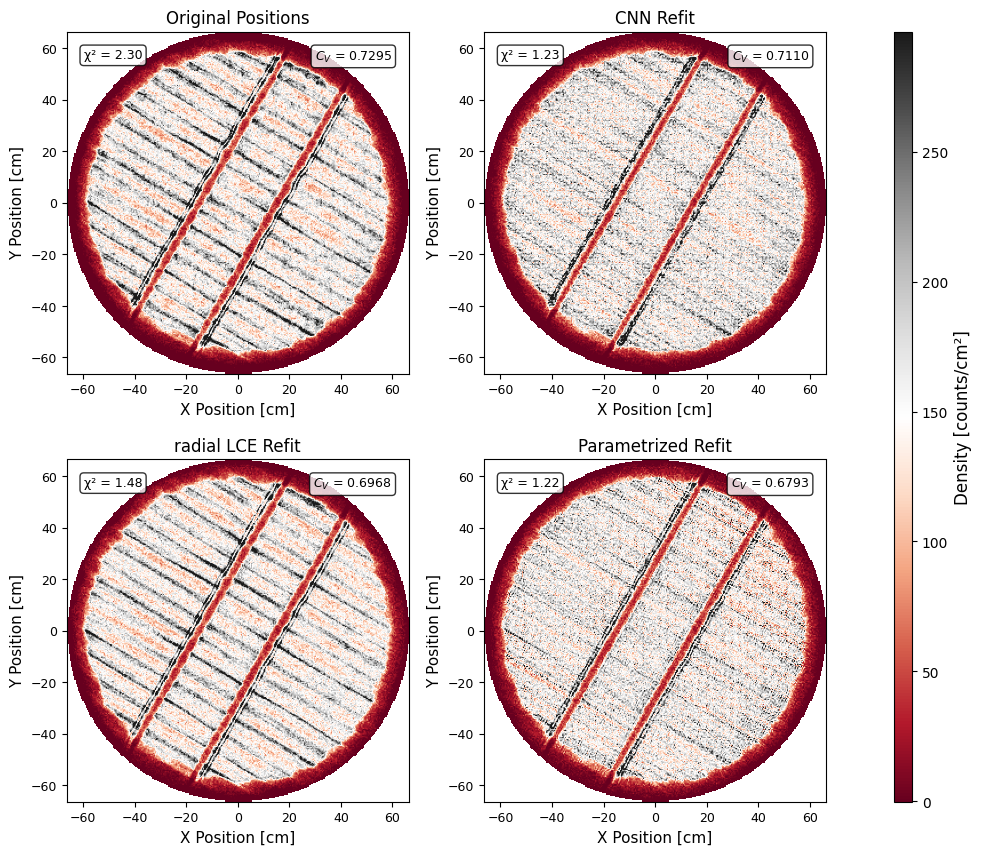

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.stats import entropy
import os
from matplotlib.colors import TwoSlopeNorm
import matplotlib.cm as cm
# Shared parameters
bins = 300
radius = 66.4

x_edges = y_edges = np.linspace(-radius, radius, bins + 1)
bin_width = (2 * radius) / bins
bin_area = bin_width ** 2

# Calculate densities for all plots
pos_list = [pos_cnf]
pos_list.append(np.load(os.path.join(pos_refit_path, "cnn_encoder.npz"))['arr_0'])
pos_list.append(np.load(os.path.join(pos_refit_path, "rLCE_encoder.npz"))['arr_0'])
pos_list.append(np.load(os.path.join(pos_refit_path, "iterative_encoder_search_2.npz"))['arr_0'])


all_densities = []

# Set density to NaN where R > 66.4
x_centers = (x_edges[:-1] + x_edges[1:]) / 2
y_centers = (y_edges[:-1] + y_edges[1:]) / 2
X_grid, Y_grid = np.meshgrid(x_centers, y_centers, indexing='ij')
bmap = np.sqrt(X_grid**2 + Y_grid**2) > 66.4
    

for pos in pos_list:
    hist, _, _ = np.histogram2d(pos[:, 0], pos[:, 1], bins=[x_edges, y_edges])
    density = hist / bin_area
    density[bmap] = np.nan
    all_densities.append(density)



all_density_values = np.concatenate([d.flatten() for d in all_densities])
all_density_values = all_density_values[all_density_values > 0]  # Remove zeros
median_density = np.nanmedian(all_density_values)



# Find global min/max for shared colorbar
vmin = min(np.min(d[d > 0]) for d in all_densities if np.any(d > 0))  # Minimum non-zero
vmax = max(np.max(d) for d in all_densities)

# Create diverging normalization centered on median
norm = TwoSlopeNorm(vmin=vmin, vcenter=median_density, vmax=vmax)


def do_density_plot(ax, pos, title='', bins=300, radius=66.4, chi2_value=None, vmin=None, vmax=None, shannon_entropy = None):
    """Enhanced density plot with shared grid and metrics"""
    
    # Fixed grid for all plots
    x_edges = y_edges = np.linspace(-radius, radius, bins + 1)
    bin_width = (2 * radius) / bins  # cm per bin
    bin_area = bin_width ** 2  # cm² per bin
    
    # Create histogram
    hist, xedges, yedges = np.histogram2d(pos[:, 0], pos[:, 1], bins=[x_edges, y_edges])
    
    # Convert to density per cm²
    density = hist / bin_area
    density[bmap] = np.nan
    
    # Plot with shared colorbar limits
    im = ax.imshow(density.T, origin='lower', extent=[-radius, radius, -radius, radius], 
                   cmap='RdGy', aspect='equal', norm = norm)
    
    # Labels and title
    ax.set_xlabel('X Position [cm]', fontsize=11)
    ax.set_ylabel('Y Position [cm]', fontsize=11)
    ax.set_title(title, fontsize=12)
    ax.tick_params(labelsize=9)
    
    # Shannon entropy text box (top right)
    entropy_text = rf'$C_V$ = {shannon_entropy:.4f}'
    ax.text(0.95, 0.95, entropy_text, transform=ax.transAxes, 
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8),
            verticalalignment='top', horizontalalignment='right', fontsize=9)
    
    # Chi² text box (top left) - placeholder for user input
    if chi2_value is not None:
        chi2_text = f'χ² = {chi2_value:.2f}'
        ax.text(0.05, 0.95, chi2_text, transform=ax.transAxes,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8),
                verticalalignment='top', horizontalalignment='left', fontsize=9)
    else:
        # Placeholder text box
        ax.text(0.05, 0.95, 'χ² = ?', transform=ax.transAxes,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='lightgray', alpha=0.8),
                verticalalignment='top', horizontalalignment='left', fontsize=9)
    
    return ax, density, im

# Create figure with custom gridspec for shared colorbar
fig = plt.figure(figsize=(11, 10))
gs = gridspec.GridSpec(2,3, width_ratios=[1, 1, 0.05], hspace=0.25, wspace=0.25)

# Create subplots
ax = [fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[0, 1]), 
      fig.add_subplot(gs[1, 0]), fig.add_subplot(gs[1, 1])]


# Plot with shared colorbar limits
titles = ['Original Positions', 'CNN Refit', 'radial LCE Refit', 'Parametrized Refit']
entropies = {'Original Positions':0.7295, 'CNN Refit':0.7110, 'radial LCE Refit':0.6968, 'Parametrized Refit':0.6793}
chi2 = {'Original Positions':2.301, 'CNN Refit':1.225, 'radial LCE Refit':1.478, 'Parametrized Refit':1.223}
ims = []

for i, (pos, title) in enumerate(zip(pos_list, titles)):
    _, density, im = do_density_plot(ax[i], pos, bins=bins, radius=radius, 
                                                 title=title, vmin=vmin, vmax=vmax, shannon_entropy= entropies[title], chi2_value=chi2[title])
    ims.append(im)
    
    # Set axis limits
    ax[i].set_xlim(-radius, radius)
    ax[i].set_ylim(-radius, radius)

# Add shared colorbar in the third row
cax = fig.add_subplot(gs[:, 2])  # Spans both columns of the third row
cbar = plt.colorbar(ims[0], cax=cax, orientation='vertical')
cbar.set_label('Density [counts/cm²]', fontsize=12)
cbar.ax.tick_params(labelsize=10)

plt.show()

# Example of how to add chi² values (replace with your actual calculations)
# chi2_values = [your_chi2_function(pos_cnf), your_chi2_function(cnn_pos), 
#                your_chi2_function(rlce_pos), your_chi2_function(param_pos)]
# Then pass chi2_value=chi2_values[i] to each do_density_plot call

/tmp/ipykernel_459/1681582421.py:118: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


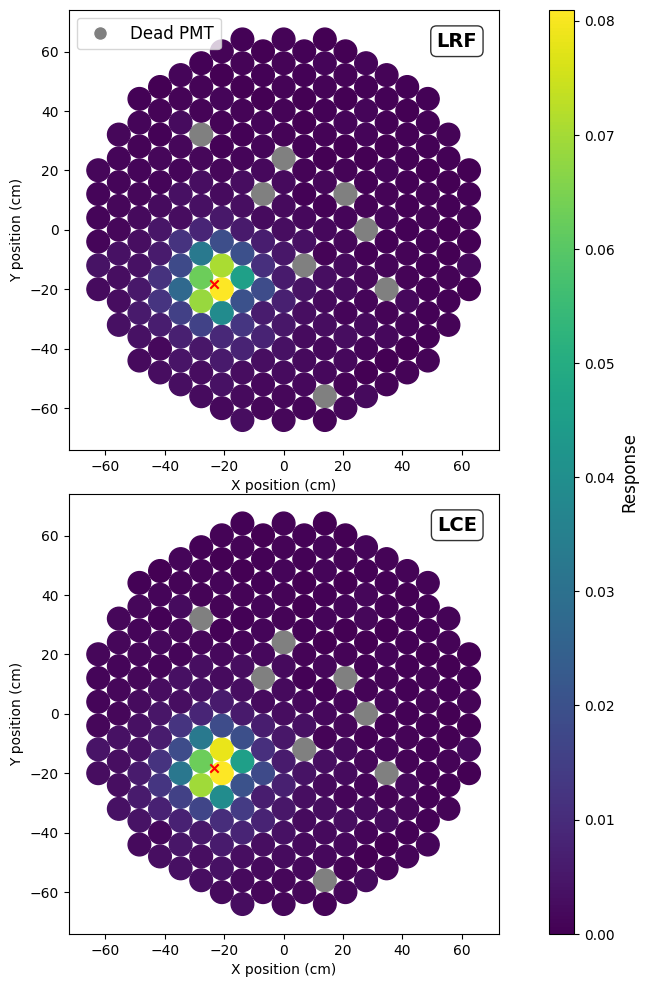

<Figure size 1000x1000 with 0 Axes>

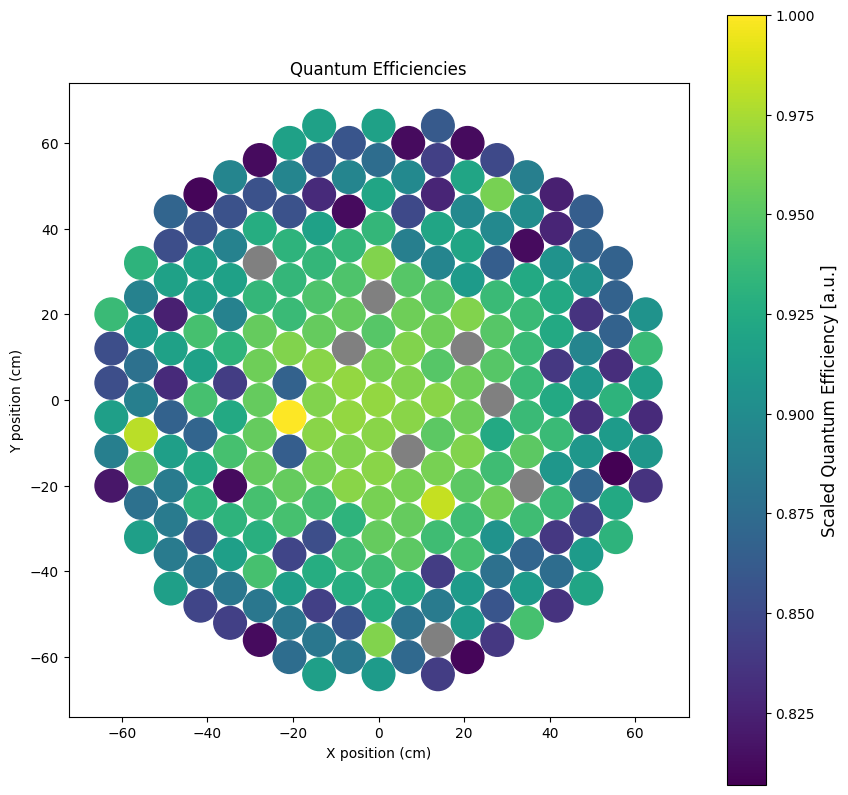

In [145]:
# LRF vs LCE

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Circle, Wedge
import matplotlib

def plot_pmt_response_no_cbar(pmt_pos, response, ax, vmin=None, vmax=None, logscale=False, dead_pmts=None, mark_spot=None, cmap=plt.cm.viridis):
    """Modified version of plot_pmt_response without colorbar for shared colorbar plots"""
    # Misc
    radius = 3 * 2.54 / 2
    if isinstance(pmt_pos, pd.DataFrame):
        _pmt_pos = pmt_pos.to_numpy()
    else:
        _pmt_pos = pmt_pos

    # Primary response normalization
    if not logscale:
        primary_normalizer = plt.Normalize
        _response = response
    else:
        primary_normalizer = matplotlib.colors.LogNorm
        _response = response.copy()
        _response[_response < 1] = vmin if vmin is not None else 1
    
    # Plot dead PMTs and remove them from the list
    if dead_pmts is not None:
        for i in dead_pmts:
            circle = plt.Circle((_pmt_pos[i, -2], _pmt_pos[i, -1]), radius, color='grey', fill=True)
            ax.add_artist(circle)
        mask = np.ones(pmt_pos.shape[0], dtype=bool)
        mask[dead_pmts] = False
        _pmt_pos = _pmt_pos[mask]
        _response = _response[mask]

    primary_norm = primary_normalizer(vmin=_response.min() if vmin is None else vmin,
                                     vmax=_response.max() if vmax is None else vmax)
    
    # Plot circles with response
    for i in range(len(_pmt_pos)):
        # Primary response color
        primary_response_color = cmap(primary_norm(_response[i]))
        # Full circle for primary response
        circle = plt.Circle((_pmt_pos[i, -2], _pmt_pos[i, -1]), radius, color=primary_response_color, fill=True)
        ax.add_artist(circle)

    ax.set_aspect('equal', 'box')
    ax.set_xlabel('X position (cm)')
    ax.set_ylabel('Y position (cm)')
    ax.set_xlim([_pmt_pos[:, -2].min() - 10, _pmt_pos[:, -2].max() + 10])
    ax.set_ylim([_pmt_pos[:, -1].min() - 10, _pmt_pos[:, -1].max() + 10])
    
    if mark_spot is not None:
        ax.scatter(mark_spot[0], mark_spot[1], c='r', marker='x')

    return ax, primary_norm

# Data setup
act_qes = [32.2,30.8,28.6,29.7,29.8,32.2,32.1,31.1,31.1,31.1,31.1,31.1,31.1,31.2,32.2,29.6,30.7,33.9,30.2,29.7,32.2,33.2,32.2,30.0,31.2,30.9,28.8,28.5,32.1,31.0,32.6,32.6,32.6,29.8,32.7,32.8,32.8,31.2,33.6,31.3,29.5,32.1,31.2,32.6,33.1,33.1,30.0,33.2,33.2,28.6,32.5,32.2,34.5,32.2,33.2,30.2,32.1,29.6,33.5,33.6,32.8,33.2,33.6,33.6,33.2,30.6,30.5,31.3,30.0,29.4,32.1,30.9,33.2,33.1,33.6,33.8,34.0,33.8,30.4,33.6,32.5,33.2,29.2,30.9,30.0,32.4,30.8,30.6,31.9,33.1,34.6,33.8,34.0,33.9,34.0,35.2,33.6,29.6,32.3,32.3,32.1,33.0,32.1,29.5,33.1,33.7,33.5,33.8,33.9,34.0,34.1,33.9,30.5,33.7,32.8,33.2,29.0,31.4,32.8,29.7,33.0,32.5,33.1,33.9,33.5,34.0,34.1,34.1,34.0,33.9,33.6,31.4,32.2,32.3,32.8,32.5,30.6,32.0,33.5,32.5,33.7,34.0,33.9,33.8,34.0,33.6,33.0,32.9,32.3,32.3,30.0,29.4,28.4,32.0,33.0,33.0,33.6,33.7,33.4,33.9,33.4,33.6,33.3,32.9,31.4,31.4,30.1,30.6,32.0,32.1,29.3,32.5,33.0,33.4,33.7,33.7,33.7,33.2,33.3,32.9,32.8,32.6,30.1,28.5,29.2,32.8,32.0,29.5,33.0,33.4,33.9,33.4,33.4,33.9,32.9,32.3,30.1,30.1,31.5,32.2,29.3,31.5,32.5,33.0,33.0,32.1,31.5,31.3,32.9,28.6,29.2,31.5,28.6,33.0,30.5,29.4,32.5,32.5,30.4,32.4,32.4,29.9,32.4,31.5,30.2,32.3,31.9,30.5,31.9,31.9,28.6,31.6,31.6,29.1,31.6,30.8,30.2,32.3,30.5,30.5,29.1,31.7,33.8,32.4,29.7,28.6,32.3,30.4,29.0,31.3,29.9,28.6,30.3]
act_qes = np.array(act_qes)
act_qes /= act_qes.max()

idx = 122579
hitpattern = np.zeros(len(pmt_pos_top))
hitpattern[not_dead_pmts] = patterns_real[idx]

# Calculate responses
lrf_response = hitpattern / np.sum(hitpattern, axis=-1)
lce_response = hitpattern / act_qes / np.sum(hitpattern / act_qes)

# Combined figure for LRF and LCE with shared colorbar
fig = plt.figure(figsize=(7, 12))
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 0.05], hspace=0.1, wspace=0.05)

# Top subplot - LRF
ax1 = fig.add_subplot(gs[0, 0])
ax1, norm1 = plot_pmt_response_no_cbar(pmt_pos_top, response=lrf_response, ax=ax1, dead_pmts=dead_pmts, mark_spot=pos_cnf[idx])

# Add LRF label in top right
ax1.text(0.95, 0.95, 'LRF', transform=ax1.transAxes, 
         fontweight='bold', fontsize=14, ha='right', va='top',
         bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

from matplotlib.lines import Line2D

dead_pmt_marker = Line2D([], [], color="white", marker='o', markerfacecolor="grey", 
                        markersize=10, label='Dead PMT')
ax1.legend(handles=[dead_pmt_marker], loc='upper left', fontsize=12, numpoints=1)
# Optional: Make the legend symbol larger and more circular
#legend.legendHandles[0]._sizes = [100]  # Increase size if needed

# Bottom subplot - LCE  
ax2 = fig.add_subplot(gs[1, 0])
ax2, norm2 = plot_pmt_response_no_cbar(pmt_pos_top, response=lce_response, ax=ax2, dead_pmts=dead_pmts, mark_spot=pos_cnf[idx])

# Add LCE label in top right
ax2.text(0.95, 0.95, 'LCE', transform=ax2.transAxes, 
         fontweight='bold', fontsize=14, ha='right', va='top',
         bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

# Find shared colorbar limits
all_responses = np.concatenate([lrf_response[~np.isnan(lrf_response)], 
                               lce_response[~np.isnan(lce_response)]])
vmin_shared = all_responses.min()
vmax_shared = all_responses.max()

# Update both plots with shared normalization
shared_norm = plt.Normalize(vmin=vmin_shared, vmax=vmax_shared)

# Shared colorbar
cax = fig.add_subplot(gs[:, 1])
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=shared_norm)
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax)
cbar.set_label('Response', fontsize=12)

plt.tight_layout()
plt.show()

# Separate figure for Quantum Efficiencies
fig_qe = plt.figure(figsize=(10, 10))
ax_qe = plot_pmt_response(pmt_pos_top, response=act_qes, dead_pmts=dead_pmts, title='Quantum Efficiencies')

# Modify the colorbar label to show arbitrary units
cbar_qe = ax_qe.figure.axes[-1]  # Get the colorbar axis
cbar_qe.set_ylabel('Scaled Quantum Efficiency [a.u.]', fontsize=12)



plt.show()

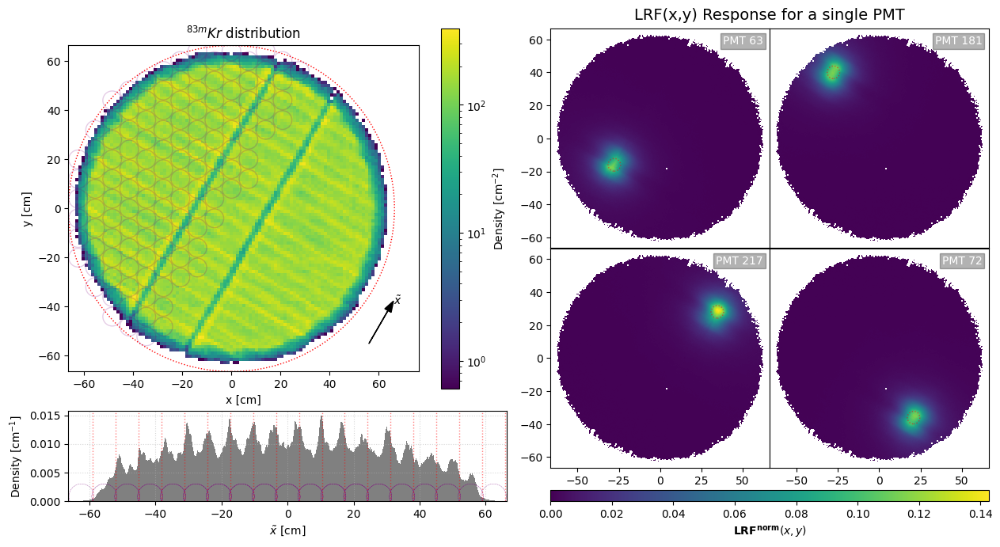

In [15]:
from matplotlib.colors import LogNorm, Normalize
import matplotlib.patches as patches
import numpy as np
θ = np.pi/3

fig = plt.figure(figsize=(15, 7.75))
outer = fig.add_gridspec(
    nrows=2, ncols=2,
    width_ratios=[3, 3],    # right column narrower than left
    height_ratios=[4, 1],   # same as your existing height ratios
    wspace=0.1, hspace=0.1
)

# 3) place your existing axes
ax  = fig.add_subplot(outer[0, 0])
ax2 = fig.add_subplot(outer[1, 0])

# Main Density Plot with proper density scaling
radius = np.abs(np.max(pos_cnf))
bins = 100
x_edges = y_edges = np.linspace(-radius, radius, bins)
hist, xedges, yedges = np.histogram2d(pos_cnf[:, 0], pos_cnf[:, 1], bins=[x_edges, y_edges])

# Calculate bin area and convert to density per cm^2
bin_width = x_edges[1] - x_edges[0]  # cm
bin_area = bin_width ** 2  # cm^2
density = hist / bin_area  # events per cm^2

# Plot with proper density scaling
im = ax.imshow(density.T, origin='lower', extent=[-radius, radius, -radius, radius], 
               cmap='viridis', norm=LogNorm())
plt.colorbar(im, label=r'Density [cm$^{-2}$]', ax=ax)
ax.set_title(r"$^{83m}Kr$ distribution")

# Plot a circle 
circle = plt.Circle((0, 0), 66.4, color='red', linestyle= ':', fill=False)
ax.add_artist(circle)
ax.set_xlim(-66.4, 86.4)
ax.set_ylim(-66.4, 66.4)

rot_y = -pmt_pos_top[:,0]*np.sin(θ) + pmt_pos_top[:,1]*np.cos(θ)
mask = rot_y > 0

plot_pmt_circles(ax, pmt_pos_top[mask], [], alpha=0.2, color='purple')
ax.set_xlabel('x [cm]')
ax.set_ylabel('y [cm]')

# Indicate new coordinate system 
ox, oy = 56, -55
L = 20   # arrow length
# unit‐vectors in the rotated frame
dx, dy = np.cos(θ)*L, np.sin(θ)*L
ax.arrow(ox, oy, dx, dy,
         head_width=3, length_includes_head=True,
         color='k')
ax.text(ox+dx, oy+dy, r"$\tilde{x}$",
        ha='left', va='center')
ax.set_xlim(-66.4, 76.4)

# — new thin 1D‐histogram of x̃ below with proper density units —
tilde_x = pos_cnf[:,0]*np.cos(θ) + pos_cnf[:,1]*np.sin(θ)

# Create histogram with proper density units (per cm)
counts, bins, hist_patches = ax2.hist(tilde_x, bins=500, density=True, color='gray', alpha=1)

# Update ylabel to show proper units
ax2.set_ylabel(r'Density [cm$^{-1}$]')
ax2.set_xlabel(r'$\tilde x$ [cm]')
ax2.grid(True, linestyle=':', alpha=0.5)

# ---- Indicate PMT extent in ax2 ------------
# 1) compute each PMT's rotated-x
rot_x = (
    pmt_pos_top[:,0]*np.cos(θ)
  + pmt_pos_top[:,1]*np.sin(θ)
)

# 2) figure out the diameter as a fraction of the x‐axis span
ax2.set_xlim(-66.4, 66.4)
xmin, xmax = ax2.get_xlim()
r = 3 * 2.54 / 2            # cm
dia_frac = 2*r / (xmax - xmin)    # fraction of axis width

# 3) convert that to a fraction of axis height so screen size is equal
fig_obj = ax2.figure
bb_inches = ax2.get_window_extent().transformed(fig_obj.dpi_scale_trans.inverted())
w_ax, h_ax = bb_inches.width, bb_inches.height
ht_frac = dia_frac * (w_ax/h_ax)

# 4) pick a fixed vertical spot in axes coords (say 5% up)
y_frac = 0.05

for xi in rot_x:
    fx = (xi - xmin) / (xmax - xmin)
    circ = patches.Ellipse(
        (fx, y_frac),
        width = dia_frac,   # axes‐fraction of full width
        height= ht_frac,    # axes‐fraction of full height
        transform = ax2.transAxes,
        alpha     = 0.2,
        linewidth = 0.2,
        linestyle = '-.',
        edgecolor = 'purple',
        fill = False
    )
    ax2.add_patch(circ)
# --------------------------------------------------
ux = np.unique(np.round(rot_x, 2))
d  = ux[2] - ux[1]
for i in range(len(ux)):
    mid = ux[i] + d/2

    # draw dotted line at the center of the overlap
    ax2.axvline(mid,
                linestyle=':',
                alpha= 0.5,
                color='r',
                linewidth=1)

# Now we do the 2x2 and cbar to the right 
# 4) carve the right column into a 3×2 sub‐gridspec:
#    - first 2 rows → the 2×2 grid
#    - last row   → the colorbar
right = outer[:, 1].subgridspec(
    nrows=4, ncols=2,
    height_ratios=[1, 1,0.1, 0.05],   # two big rows + a small one for cbar
    width_ratios =[1, 1],       # two equal‐width heatmap columns
    wspace=0, hspace=0          # no gaps between the 2×2
)

ax00 = fig.add_subplot(right[0, 0])
ax01 = fig.add_subplot(right[0, 1], sharey=ax00)
ax10 = fig.add_subplot(right[1, 0], sharex=ax00, sharey=ax00)
ax11 = fig.add_subplot(right[1, 1], sharex=ax01, sharey=ax01)
# 6) the narrow colorbar axis below (spanning both columns)
cax = fig.add_subplot(right[3, :])

ax01.get_yaxis().set_visible(False)
ax00.get_xaxis().set_visible(False)
ax01.get_xaxis().set_visible(False)

# bottom‐right outer cell for the shared colorbar

def compute_stat(patterns_real, pos_cnf, channel_idx,
                        radius=66.4, grid_N=300):
    from scipy.stats import binned_statistic_2d
    # 1) Sum-normalize each pattern (row) along axis=1
    patterns_norm = patterns_real / patterns_real.sum(axis=1, keepdims=True)

    # 2) Extract positions and values for the chosen channel
    x = pos_cnf[:, 0]
    y = pos_cnf[:, 1]
    vals = patterns_norm[:, channel_idx]

    # 3) Define bin edges
    x_edges = np.linspace(-radius, radius, grid_N+1, dtype=np.float32)
    y_edges = np.linspace(-radius, radius, grid_N+1, dtype=np.float32)

    # 4) Compute the 2D binned statistic (mean per cell)
    stat, _, _, _ = binned_statistic_2d(
        x, y, vals,
        statistic='mean',
        bins=[x_edges, y_edges]
    )  # stat.shape == (grid_N, grid_N)

    # 5) Mask cells whose center lies outside the circle
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    Xc, Yc   = np.meshgrid(x_centers, y_centers, indexing='xy')
    mask = (Xc**2 + Yc**2) > radius**2
    stat[mask] = np.nan
    return stat

# PMT numbers to plot 
chs = [62,173, 209, 71] 
stats = [compute_stat(patterns_real, pos_cnf, ch) for ch in chs]
circles = [plt.Circle((pmt_pos_top[not_dead_pmts][ch]), 3 * 2.54 / 2 , color='red', linestyle= ':', fill=False, alpha=0.5) for ch in chs]
vmin = np.nanmin(stats)
vmax = np.nanmax(stats)
norm = Normalize(vmin=vmin, vmax=vmax)
radius = 66.4
im00 = ax00.imshow(stats[0].T, origin='lower',
                   extent=[-radius, radius, -radius, radius],
                   aspect='equal', cmap='viridis', norm=norm)
ax00.add_artist(circles[0])

im01 = ax01.imshow(stats[1].T, origin='lower',
                   extent=[-radius, radius, -radius, radius],
                   aspect='equal', cmap='viridis', norm=norm)
ax01.add_artist(circles[1])
                   
im10 = ax10.imshow(stats[2].T,  origin='lower',
                   extent=[-radius, radius, -radius, radius],
                   aspect='equal', cmap='viridis', norm=norm)
ax10.add_artist(circles[2])
ax11.get_yaxis().set_visible(False)
im11 = ax11.imshow(stats[3].T,  origin='lower',
                   extent=[-radius, radius, -radius, radius],
                   aspect='equal', cmap='viridis', norm=norm)
ax11.add_artist(circles[3])

# Apply colorbar at the bottom 
fig.colorbar(im00, cax=cax, orientation='horizontal', label=r'$\mathbf{LRF}^{\mathbf{norm}}(x,y)$')

axes = [ax00, ax01, ax10, ax11]
for ax, ch in zip(axes, chs):
    ax.text(
        0.97, 0.97,            # 95% over, 95% up in axis coords
        f"PMT {not_dead_pmts[ch]}",           # your label
        transform=ax.transAxes,
        ha="right", va="top",
        color="white",         # or "k"/"black" depending on background
        fontsize=10,
        bbox=dict(facecolor="black", alpha=0.3, pad=2)  # optional halo
    )

pos00 = ax00.get_position()   # Bbox of top-left heatmap
pos11 = ax11.get_position()   # Bbox of top-right heatmap
# compute centre x and a little bit above their top edge
x_center = (pos00.x0 + pos11.x1) / 2
y_top    = pos00.y1 + 0.01    # tweak 0.01 up/down to move it
fig.text(
    x_center, y_top,
    "LRF(x,y) Response for a single PMT",  # your group title
    ha="center", va="bottom",
    fontsize=14
)



plt.show()

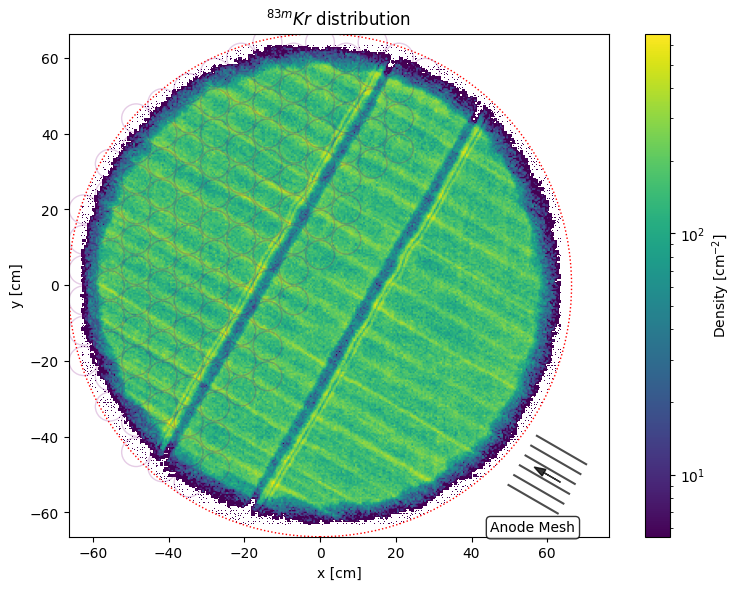

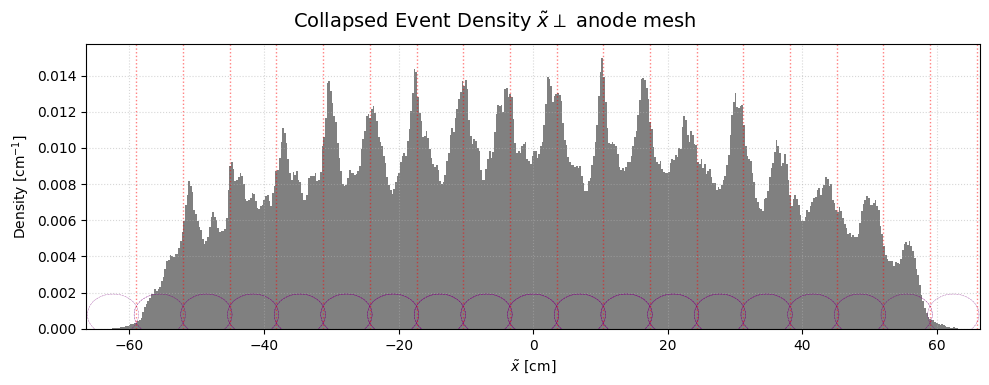

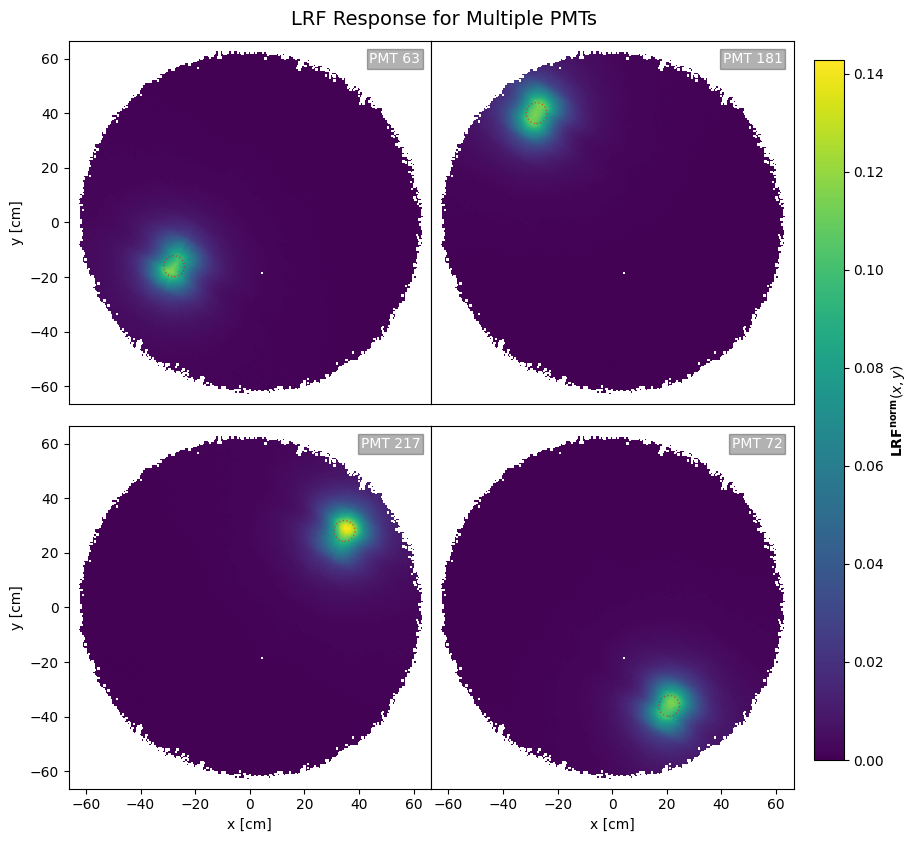

(<Figure size 800x600 with 2 Axes>,
 <Figure size 1000x400 with 1 Axes>,
 <Figure size 1000x1000 with 5 Axes>)

In [151]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, Normalize
import matplotlib.patches as patches
from scipy.stats import binned_statistic_2d

def plot_main_density_with_pmts(pos_cnf, pmt_pos_top, do_density_plot, figsize=(8, 6)):
    """
    Create the main density plot with PMT positions and coordinate system
    """
    θ = np.pi/3
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create density plot with proper cm^-2 units
    radius = np.abs(np.max(pos_cnf))
    bins = 300
    x_edges = y_edges = np.linspace(-radius, radius, bins)
    hist, xedges, yedges = np.histogram2d(pos_cnf[:, 0], pos_cnf[:, 1], bins=[x_edges, y_edges])
    
    # Calculate bin area and convert to density per cm^2
    bin_width = x_edges[1] - x_edges[0]  # cm
    bin_area = bin_width ** 2  # cm^2
    density = hist / bin_area  # events per cm^2
    
    # Mask out events at R > 66.4 cm
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    X_grid, Y_grid = np.meshgrid(x_centers, y_centers, indexing='ij')
    R_grid = np.sqrt(X_grid**2 + Y_grid**2)
    density[R_grid > 66.4] = np.nan
    
    # Plot with proper density scaling
    im = ax.imshow(density.T, origin='lower', extent=[-radius, radius, -radius, radius],
                   cmap='viridis', norm=LogNorm())
    plt.colorbar(im, label=r'Density [cm$^{-2}$]', ax=ax)
    ax.set_title(r"$^{83m}Kr$ distribution")
    
    # Plot a circle
    circle = plt.Circle((0, 0), 66.4, color='red', linestyle=':', fill=False)
    ax.add_artist(circle)
    ax.set_xlim(-66.4, 86.4)
    ax.set_ylim(-66.4, 66.4)
    
    rot_y = -pmt_pos_top[:,0]*np.sin(θ) + pmt_pos_top[:,1]*np.cos(θ)
    mask = rot_y > 0
    plot_pmt_circles(ax, pmt_pos_top[mask], [], alpha=0.2, color='purple')
    
    ax.set_xlabel('x [cm]')
    ax.set_ylabel('y [cm]')
    
    # Anode mesh lines indication in bottom right
    grid_x, grid_y = 60, -50  # Bottom right position
    grid_size = 15  # Size of the grid area
    n_lines = 6  # Number of mesh lines
    
    # Direction perpendicular to x_tilde (anode mesh wire direction)
    mesh_angle = θ + np.pi/2  # Perpendicular to x_tilde
    
    # Create mesh lines perpendicular to x_tilde direction (parallel wires)
    for i in range(n_lines):
        # Lines parallel to the mesh wires (perpendicular to x_tilde)
        offset = (i - (n_lines-1)/2) * (grid_size/(n_lines-1))
        
        # Start and end points for mesh wires
        start_x = grid_x + offset * np.cos(θ) - grid_size/2 * np.cos(mesh_angle)
        start_y = grid_y + offset * np.sin(θ) - grid_size/2 * np.sin(mesh_angle)
        end_x = grid_x + offset * np.cos(θ) + grid_size/2 * np.cos(mesh_angle)
        end_y = grid_y + offset * np.sin(θ) + grid_size/2 * np.sin(mesh_angle)
        
        ax.plot([start_x, end_x], [start_y, end_y], 'k-', alpha=0.7, linewidth=1.5)
    
    # Label for anode mesh direction
    label_x = grid_x + grid_size/2 * np.cos(mesh_angle)
    label_y = grid_y + grid_size/2 * np.sin(mesh_angle)
    
    ax.text(45, -64, 'Anode Mesh', 
            ha='left', va='center', fontsize=10, 
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))
    
    # Small arrow indicating mesh direction
    arrow_length = 8
    ax.arrow(grid_x - arrow_length/2 * np.cos(mesh_angle), 
             grid_y - arrow_length/2 * np.sin(mesh_angle),
             arrow_length * np.cos(mesh_angle), 
             arrow_length * np.sin(mesh_angle),
             head_width=2, length_includes_head=True, color='k', alpha=0.8)
    
    ax.set_xlim(-66.4, 76.4)
    plt.tight_layout()
    return fig, ax
    
def plot_rotated_histogram(pos_cnf, pmt_pos_top, figsize=(10, 4)):
    """
    Create the 1D histogram of rotated x coordinates with PMT positions
    """
    θ = np.pi/3
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Calculate rotated x coordinates
    tilde_x = pos_cnf[:,0]*np.cos(θ) + pos_cnf[:,1]*np.sin(θ)
    
    # Create histogram with proper density units (per cm)
    counts, bins, hist_patches = ax.hist(tilde_x, bins=500, density=True, color='gray', alpha=1)
    
    # Calculate bin width for proper units
    bin_width = bins[1] - bins[0]  # cm
    
    ax.set_ylabel(r'Density [cm$^{-1}$]')
    ax.set_xlabel(r'$\tilde x$ [cm]')
    ax.grid(True, linestyle=':', alpha=0.5)

    # Indicate PMT extent
    rot_x = (pmt_pos_top[:,0]*np.cos(θ) + pmt_pos_top[:,1]*np.sin(θ))
    
    ax.set_xlim(-66.4, 66.4)
    xmin, xmax = ax.get_xlim()
    r = 3 * 2.54 / 2  # cm
    dia_frac = 2*r / (xmax - xmin)  # fraction of axis width

    # Convert to fraction of axis height for equal screen size
    fig_obj = ax.figure
    bb_inches = ax.get_window_extent().transformed(fig_obj.dpi_scale_trans.inverted())
    w_ax, h_ax = bb_inches.width, bb_inches.height
    ht_frac = dia_frac * (w_ax/h_ax)

    # Fixed vertical position (5% up)
    y_frac = 0.05

    for xi in rot_x:
        fx = (xi - xmin) / (xmax - xmin)
        circ = patches.Ellipse(
            (fx, y_frac),
            width=dia_frac,   # axes‐fraction of full width
            height=ht_frac,   # axes‐fraction of full height
            transform=ax.transAxes,
            alpha=0.2,
            linewidth=0.2,
            linestyle='-.',
            edgecolor='purple',
            fill=False
        )
        ax.add_patch(circ)

    # Add overlap indicators
    ux = np.unique(np.round(rot_x, 2))
    d = ux[2] - ux[1]
    for i in range(len(ux)):
        mid = ux[i] + d/2
        ax.axvline(mid, linestyle=':', alpha=0.5, color='r', linewidth=1)
    
    fig.suptitle(r'Collapsed Event Density $\tilde{x}\perp$ anode mesh', fontsize=14, y=0.95)
    plt.tight_layout()
    return fig, ax

def compute_stat(patterns_real, pos_cnf, channel_idx, radius=66.4, grid_N=300):
    """
    Compute 2D binned statistic for LRF analysis (same as original - no spatial units)
    """
    # Sum-normalize each pattern (row) along axis=1
    patterns_norm = patterns_real / patterns_real.sum(axis=1, keepdims=True)

    # Extract positions and values for the chosen channel
    x = pos_cnf[:, 0]
    y = pos_cnf[:, 1]
    vals = patterns_norm[:, channel_idx]

    # Define bin edges
    x_edges = np.linspace(-radius, radius, grid_N+1, dtype=np.float32)
    y_edges = np.linspace(-radius, radius, grid_N+1, dtype=np.float32)

    # Compute the 2D binned statistic (mean per cell)
    stat, _, _, _ = binned_statistic_2d(
        x, y, vals,
        statistic='mean',
        bins=[x_edges, y_edges]
    )

    # Mask cells whose center lies outside the circle
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    Xc, Yc = np.meshgrid(x_centers, y_centers, indexing='xy')
    mask = (Xc**2 + Yc**2) > radius**2
    stat[mask] = np.nan
    
    # Return as-is (no spatial unit conversion - it's already normalized)
    return stat

def plot_single_lrf_heatmap(patterns_real, pos_cnf, pmt_pos_top, not_dead_pmts, 
                           channel_idx, pmt_number=None, figsize=(6, 6)):
    """
    Create a single LRF heatmap for one PMT (no spatial units - already normalized)
    """
    fig, ax = plt.subplots(figsize=figsize)
    
    # Compute statistics (no spatial units)
    stat = compute_stat(patterns_real, pos_cnf, channel_idx)
    
    radius = 66.4
    
    # Create the heatmap
    im = ax.imshow(stat.T, origin='lower',
                   extent=[-radius, radius, -radius, radius],
                   aspect='equal', cmap='viridis')
    
    # Add PMT circle
    circle = plt.Circle(pmt_pos_top[not_dead_pmts][channel_idx], 
                       3 * 2.54 / 2, 
                       color='red', linestyle=':', fill=False, alpha=0.5)
    ax.add_artist(circle)
    
    # Add colorbar with same label as original
    cbar = plt.colorbar(im, ax=ax, label=r'$\mathbf{LRF}^{\mathbf{norm}}(x,y)$')
    
    # Add PMT label
    if pmt_number is None:
        pmt_number = not_dead_pmts[channel_idx]
    
    ax.text(0.97, 0.97, f"PMT {pmt_number}",
            transform=ax.transAxes,
            ha="right", va="top",
            color="white",
            fontsize=12,
            bbox=dict(facecolor="black", alpha=0.5, pad=2))
    
    ax.set_xlabel('x [cm]')
    ax.set_ylabel('y [cm]')
    ax.set_title(f'LRF Response for PMT {pmt_number}')
    
    plt.tight_layout()
    return fig, ax

def plot_lrf_grid(patterns_real, pos_cnf, pmt_pos_top, not_dead_pmts,
                  channels=[62, 173, 209, 71], figsize=(10, 10)):
    """
    Create a 2x2 grid of LRF heatmaps with shared colorbar (touching plots, shared axes)
    """
    # Create figure and subplots with shared axes (like original)
    fig, axes = plt.subplots(2, 2, figsize=figsize,
                            sharex=True, sharey=True,
                            gridspec_kw={'wspace': 0, 'hspace': 0})
    
    # Compute all statistics first to get consistent normalization
    stats = [compute_stat(patterns_real, pos_cnf, ch) for ch in channels]
    
    # Create circles for each PMT
    circles = [plt.Circle(pmt_pos_top[not_dead_pmts][ch], 3 * 2.54 / 2,
                         color='red', linestyle=':', fill=False, alpha=0.5) for ch in channels]
    
    # Find global min/max for consistent colorbar
    vmin = np.nanmin([np.nanmin(stat) for stat in stats])
    vmax = np.nanmax([np.nanmax(stat) for stat in stats])
    norm = Normalize(vmin=vmin, vmax=vmax)
    
    radius = 66.4
    
    # Create each subplot - use the 2D indexing properly
    ims = []
    for i, ch in enumerate(channels):
        row = i // 2
        col = i % 2
        ax = axes[row, col]
        stat = stats[i]
        
        im = ax.imshow(stat.T, origin='lower',
                       extent=[-radius, radius, -radius, radius],
                       aspect='equal', cmap='viridis', norm=norm)
        ims.append(im)
        
        # Add PMT circle
        ax.add_artist(circles[i])
        
        # Add PMT label
        ax.text(0.97, 0.97, f"PMT {not_dead_pmts[ch]}",
                transform=ax.transAxes,
                ha="right", va="top",
                color="white",
                fontsize=10,
                bbox=dict(facecolor="black", alpha=0.3, pad=2))
    
    # Hide internal tick labels (like original)
    axes[0, 1].get_yaxis().set_visible(False)  # top right
    axes[0, 0].get_xaxis().set_visible(False)  # top left
    axes[0, 1].get_xaxis().set_visible(False)  # top right
    axes[1, 1].get_yaxis().set_visible(False)  # bottom right
    
    # Set labels only for visible axes
    axes[1, 0].set_xlabel('x [cm]')  # bottom left
    axes[1, 1].set_xlabel('x [cm]')  # bottom right
    axes[0, 0].set_ylabel('y [cm]')  # top left
    axes[1, 0].set_ylabel('y [cm]')  # bottom left
    
    # Add shared colorbar on the right side
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.87, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(ims[0], cax=cbar_ax, orientation='vertical',
                       label=r'$\mathbf{LRF}^{\mathbf{norm}}(x,y)$')
    
    # Add overall title
    fig.suptitle('LRF Response for Multiple PMTs', fontsize=14, y=0.90)
    
    return fig, axes

def create_all_separate_plots(pos_cnf, pmt_pos_top, patterns_real, not_dead_pmts, 
                             do_density_plot, ):
    """
    Create all plots as separate figures
    """
    # 1. Main density plot with PMTs
    fig1, ax1 = plot_main_density_with_pmts(pos_cnf, pmt_pos_top, do_density_plot)
    plt.show()
    
    # 2. Rotated histogram
    fig2, ax2 = plot_rotated_histogram(pos_cnf, pmt_pos_top)
    plt.show()
    
    
    # 4. LRF grid
    fig4, axes4 = plot_lrf_grid(patterns_real, pos_cnf, pmt_pos_top, not_dead_pmts)
    plt.show()
    
    return fig1, fig2, fig4

create_all_separate_plots(pos_cnf, pmt_pos_top, patterns_real, not_dead_pmts, 
                             do_density_plot, )

In [149]:
# Get formated runid table

ctr = []
for i in os.listdir(data_path):
    if not os.path.isdir(os.path.join(data_path, i)):
        ctr += [i.split('.')[0]]
print(', '.join(ctr))

st = straxen.contexts.xenonnt_online()

runs = st.select_runs()

057674, 058435, 058458, 058490, 058608, 058072, 058472, 058087, 058102, 058635, 057695, 057705, 057680, 058429, 057690, 057672, 058068, 057664, 058425, 057733, 057707, 057648, 058418, 058638, 058121, 058510, 058465, 058127, 058614, 058624, 057675, 058632, 058074, 058080, 058451, 058088, 058502, 057691, 058444, 057660, 058509, 058607, 058476, 058460, 057681, 058433, 058112, 058081, 057719, 057653, 058107, 057665, 058601, 057700, 058461, 058600, 057726, 058621, 058066, 058421, 058427, 058651, 057720, 058076, 057661, 058609, 057667, 058099, 058134, 058494, 058430, 058652, 058645, 058113, 057669, 058497, 058030, 058628, 058459, 057688, 058091, 058106, 057652, 058437, 057704, 058640, 058120, 057736
You specified _auto_append_rucio_local=True and you are not on dali compute nodes, so we will add the following rucio local path: /project/lgrandi/rucio/


Checking data availability:   0%|          | 0/2 [00:00<?, ?it/s]

In [159]:
# Select items from runs whose name is in ctr
runs_sub = runs[runs['name'].isin(ctr)]
runs_sub.drop(columns=['event_basics_available', 'peak_basics_available', 'tags', 'number'], inplace=True)


/tmp/ipykernel_79/600072127.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  runs_sub.drop(columns=['event_basics_available', 'peak_basics_available', 'tags', 'number'], inplace=True)


In [165]:
from tabulate import tabulate

print(tabulate(
    runs_sub,
    headers="keys",
    tablefmt="latex_longtable",
    showindex=False,
    floatfmt=".2f"
))

\begin{longtable}{rlllll}
\hline
   name & mode      & end                        & start                      & source   & livetime               \\
\hline
\endhead
 058652 & tpc\_kr83m & 2024-01-31 11:09:09.840000 & 2024-01-31 10:39:06.420000 & kr-83m   & 0 days 00:30:03.420000 \\
 058651 & tpc\_kr83m & 2024-01-31 10:38:15.402000 & 2024-01-31 10:08:12.331000 & kr-83m   & 0 days 00:30:03.071000 \\
 058645 & tpc\_kr83m & 2024-01-31 09:05:32.617000 & 2024-01-31 08:35:29.223000 & kr-83m   & 0 days 00:30:03.394000 \\
 058640 & tpc\_kr83m & 2024-01-31 08:34:38.839000 & 2024-01-31 08:04:35.713000 & kr-83m   & 0 days 00:30:03.126000 \\
 058638 & tpc\_kr83m & 2024-01-31 07:32:50.851000 & 2024-01-31 07:02:47.648000 & kr-83m   & 0 days 00:30:03.203000 \\
 058635 & tpc\_kr83m & 2024-01-31 06:00:09.266000 & 2024-01-31 05:30:06.354000 & kr-83m   & 0 days 00:30:02.912000 \\
 058632 & tpc\_kr83m & 2024-01-31 05:29:15.824000 & 2024-01-31 04:59:12.464000 & kr-83m   & 0 days 00:30:03.360000 \\
 058628 

In [154]:
weights.keys(), 

dict_keys(['radial_lce/lce_params:0', 'I_0:0', 'GaussianStandardDeviation:0', 'n_pmts_LikelihoodFunction:0', 'switching_signal_LikelihoodFunction:0', 'return_ratio_LikelihoodFunction:0', 'n_sigma_LikelihoodFunction:0', 'p_dpe_LikelihoodFunction:0', 'nan_safe_LikelihoodFunction:0', 'nan_safe_value_LikelihoodFunction:0', 'tile_std_indices_LikelihoodFunction:0', 'm_LikelihoodFunction:0', 'z_LikelihoodFunction:0', 'sigma_min_LikelihoodFunction:0', 'sigma_max_LikelihoodFunction:0', 'radial_lce/radial_lce/lce_params:0', 'i0/I_0:0', 'LossLayer/GaussianStandardDeviation:0', 'LossLayer/n_pmts_LikelihoodFunction:0', 'LossLayer/switching_signal_LikelihoodFunction:0', 'LossLayer/return_ratio_LikelihoodFunction:0', 'LossLayer/n_sigma_LikelihoodFunction:0', 'LossLayer/p_dpe_LikelihoodFunction:0', 'LossLayer/nan_safe_LikelihoodFunction:0', 'LossLayer/nan_safe_value_LikelihoodFunction:0', 'LossLayer/tile_std_indices_LikelihoodFunction:0', 'LossLayer/m_LikelihoodFunction:0', 'LossLayer/z_LikelihoodFunc

In [191]:
rLCE_base.get_layer('Radial_LCE').summary()

Model: "Radial_LCE"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xy_1 (InputLayer)           [(None, 2)]               0         
                                                                 
 Repeat_to_n_pmts (RepeatVe  (None, 245, 2)            0         
 ctor)                                                           
                                                                 
 Event_PMT_distance (GetRad  (None, 245)               0         
 ius)                                                            
                                                                 
 radial_lce (RadialLCELayer  (None, 245)               4         
 )                                                               
                                                                 
 Normalization (Normalizati  (None, 245)               0         
 onLayer)                                               

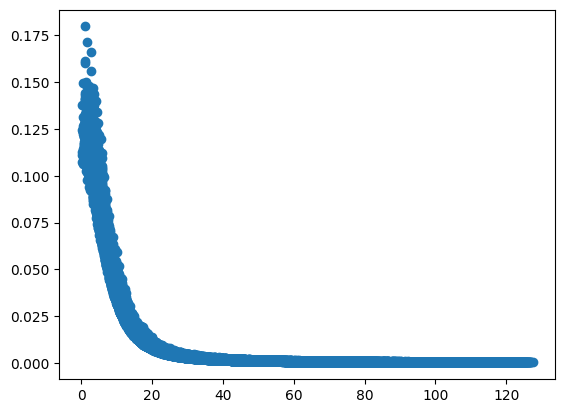

In [215]:
# Plot of response vs dist
patterns_lce = patterns_real / np.sum(patterns_real, axis =-1 , keepdims = True)
angle = -np.pi/ 3
rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)],
                           [np.sin(angle),  np.cos(angle)]])
per_pmt_dist = (pos_cnf[:,None, :2] - pmt_pos_top[None, not_dead_pmts, :2]) @ rotation_matrix.T

radial_dist = np.linalg.norm(per_pmt_dist, axis= -1)

# Create 2D histogram
H, xedges, yedges = np.histogram2d(radial_dist.ravel(), patterns_lce.ravel(), 
                                  bins=200, density=True)


rLCE_base = gen_model(seed=0, 
              starting_model=None, 
              include_wall = False, 
              include_perp = False, 
              include_anode = False, 
              anode_no_angle = False,
              stds=None, 
              multiplication_layers = False,
              radialLCE = True, # This and below are the only ones that matter here
              rLCE_groups = 1,
              monodense = False, 
              use_estimator = False, 
              biased_layer = False,
              anode_shadowing_bias = False,
              direct_bias = False,
)
"""
For some reason passing radial dist directly to the Radial_LCE layer does not work and I dont understand why 
-> But using the below method and plotting with precompute radial dist works just fine 
"""
load_weights_from_dict(rLCE_base, os.path.join(model_path, 'rLCE_base_model.json'))
sub1 = tf.keras.Model(rLCE_base.get_layer('Radial_LCE').get_layer('xy_1').input,rLCE_base.get_layer('Radial_LCE').get_layer('Normalization').output) 
res_no_i0  = sub1(pos_cnf[:1000])
res = rLCE_base.get_layer('i0')(res_no_i0)

# Clip to get rid of the noisy points 
H[H < 1e-5] = 0
H_log = H
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from scipy.stats import binned_statistic

# Your existing code
load_weights_from_dict(rLCE_base, os.path.join(model_path, 'rLCE_base_model.json'))
sub1 = tf.keras.Model(rLCE_base.get_layer('Radial_LCE').get_layer('xy_1').input,
                      rLCE_base.get_layer('Radial_LCE').get_layer('Normalization').output)
res_no_i0 = sub1(pos_cnf[:1000])
res = rLCE_base.get_layer('i0')(res_no_i0)

# Clip to get rid of the noisy points


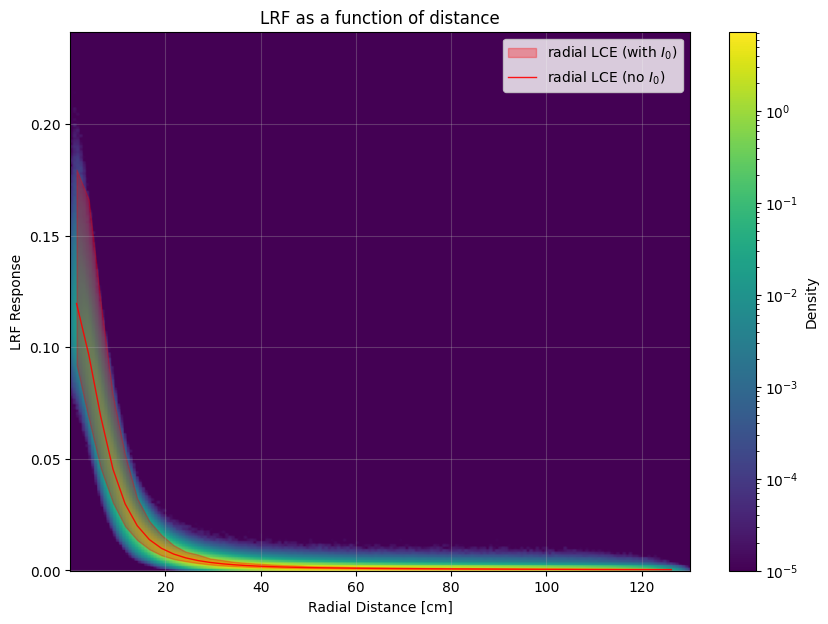

In [ ]:
H = np.maximum(H, 1e-5)
H_log = H

# Prepare data for error band calculation
radial_flat = radial_dist[:1000].ravel()
res_no_i0_flat = res_no_i0.numpy().ravel()
res_flat = res.numpy().ravel()

# Create bins for the error band calculation
n_bins = 50  # Adjust for smoothness vs detail
bin_edges = np.linspace(radial_flat.min(), radial_flat.max(), n_bins + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Calculate statistics in each bin
mean_no_i0, _, _ = binned_statistic(radial_flat, res_no_i0_flat, statistic='mean', bins=bin_edges)

# Calculate full data spread (min/max range)
min_res, _, _ = binned_statistic(radial_flat, res_flat, statistic='min', bins=bin_edges)
max_res, _, _ = binned_statistic(radial_flat, res_flat, statistic='max', bins=bin_edges)

# Remove NaN values for plotting
valid_mask = ~(np.isnan(mean_no_i0) | np.isnan(min_res) | np.isnan(max_res))
bin_centers_clean = bin_centers[valid_mask]
mean_no_i0_clean = mean_no_i0[valid_mask]
min_res_clean = min_res[valid_mask]
max_res_clean = max_res[valid_mask]

# Plot with log scaling
plt.figure(figsize=(10, 7))

# Background density plot
plt.imshow(H_log.T, origin='lower', aspect='auto', cmap='viridis',
           extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
           norm=LogNorm(), alpha=1)

# Add full data spread as error band
plt.fill_between(bin_centers_clean, min_res_clean, max_res_clean,
                 color='red', alpha=0.3, label=r'radial LCE (with $I_0$)')

# Plot the thin functional fit line
plt.plot(bin_centers_clean, mean_no_i0_clean, 'r-', linewidth=1, alpha=0.9, 
         label='radial LCE (no $I_0$)')

plt.colorbar(label='Density')
plt.xlabel('Radial Distance : R : [cm]')
plt.ylabel('LRF Response')
plt.title('LRF(R)')
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)
plt.show()

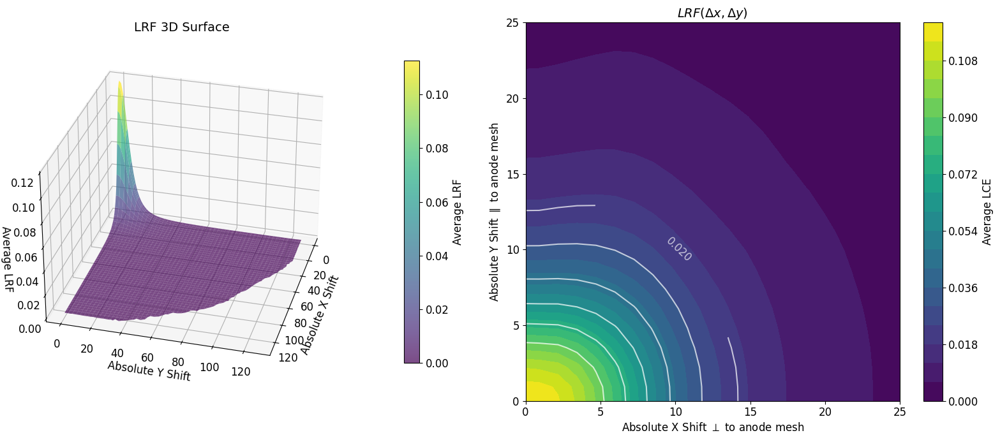

In [36]:
# Extract x and y shifts from per_pmt_dist
x_shifts = np.abs(per_pmt_dist[:, :, 0].ravel())  # x component
y_shifts = np.abs(per_pmt_dist[:, :, 1].ravel())  # y component
lce_values = patterns_lce.ravel()

# Create 2D histogram to get averaged values in bins
x_max, y_max = x_shifts.max(), y_shifts.max()
bins = 100
x_bins = np.linspace(-1, x_max, bins+1)
y_bins = np.linspace(-1, y_max, bins+1)

# Use the SAME bin specification for both histograms
H, x_edges, y_edges = np.histogram2d(x_shifts, y_shifts, bins=[x_bins, y_bins])
sum_lce, _, _ = np.histogram2d(x_shifts, y_shifts, bins=[x_bins, y_bins], weights=lce_values)

# Calculate average LCE in each bin
avg_lce = np.full_like(sum_lce, np.nan)
mask = H > 0  # More explicit condition
avg_lce[mask] = sum_lce[mask] / H[mask]

# Create coordinate grids
x_centers = (x_edges[:-1] + x_edges[1:]) / 2
y_centers = (y_edges[:-1] + y_edges[1:]) / 2
X_grid, Y_grid = np.meshgrid(x_centers, y_centers)

# Create side-by-side plots with fixes
fig = plt.figure(figsize=(16, 7))

# First subplot - 3D surface
ax1 = fig.add_subplot(121, projection='3d')
surf = ax1.plot_surface(X_grid, Y_grid, avg_lce.T, cmap='viridis', alpha=0.7)

ax1.set_xlabel('Absolute X Shift', fontsize=12)
ax1.set_ylabel('Absolute Y Shift', fontsize=12)
ax1.set_zlabel('Average LRF', fontsize=12)
ax1.set_title('LRF 3D Surface', fontsize=14)
ax1.tick_params(axis='both', which='major', labelsize=12)

# Fix 3: Rotate the 3D plot more clockwise when viewed from above
ax1.view_init(elev=30, azim=15)  # azim controls rotation (0=front, 45=more clockwise)

# Fix 2: Better colorbar alignment for 3D plot
cbar1 = plt.colorbar(surf, ax=ax1, shrink=0.8, aspect=20, pad=0.1)  # pad controls spacing
cbar1.ax.tick_params(labelsize=12)
cbar1.set_label('Average LRF', fontsize=12)

# Second subplot - 2D contour
ax2 = fig.add_subplot(122)
contour = ax2.contourf(X_grid, Y_grid, avg_lce.T, levels=20, cmap='viridis')

# Create custom contour levels excluding 0.015
custom_levels = [0.02, 0.03, 0.045, 0.06, 0.075, 0.09]  # Skip 0.015
contour_lines = ax2.contour(X_grid, Y_grid, avg_lce.T, levels=custom_levels, colors='white', alpha=0.7)

# Fix 1: Remove the 0.015 label by using custom levels
ax2.clabel(contour_lines, inline=True, fontsize=12, fmt='%.3f')

ax2.set_xlabel(r'Absolute X Shift $\perp$ to anode mesh', fontsize=12)
ax2.set_ylabel(r'Absolute Y Shift $\parallel$ to anode mesh', fontsize=12)
ax2.set_title(r'$LRF(\Delta x, \Delta y)$', fontsize=14)
ax2.set_xlim(0, 25)
ax2.set_ylim(0, 25)
ax2.tick_params(axis='both', which='major', labelsize=12)

# Add colorbar for 2D plot
cbar2 = plt.colorbar(contour, ax=ax2)
cbar2.ax.tick_params(labelsize=12)
cbar2.set_label('Average LCE', fontsize=12)

plt.tight_layout()
plt.show()

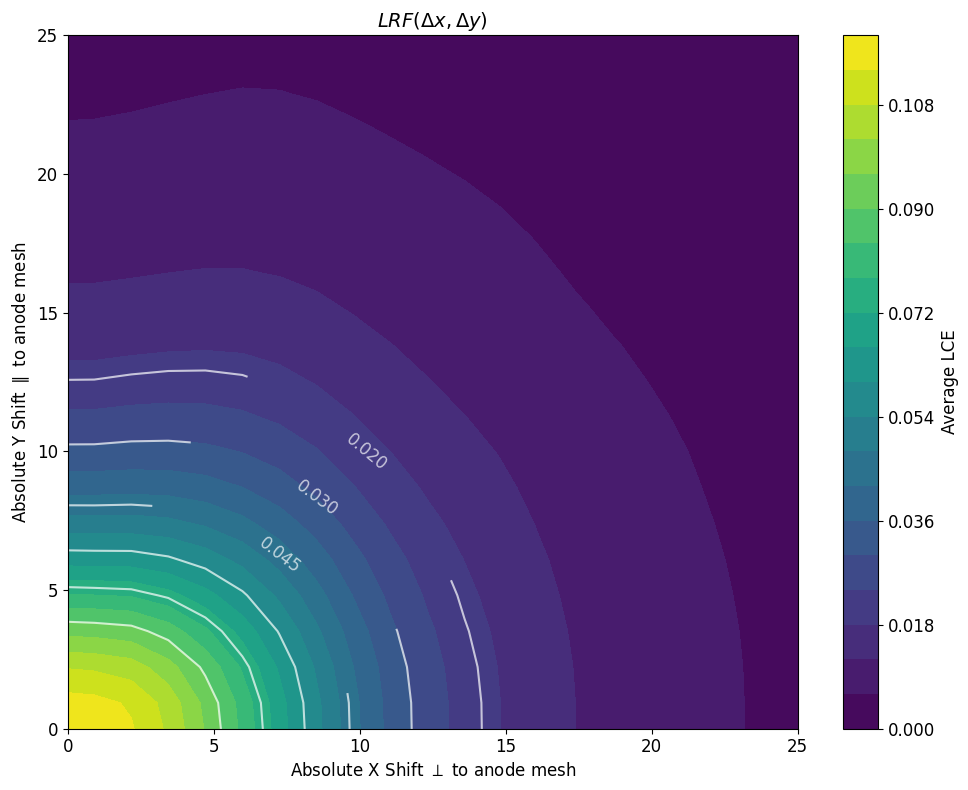

In [110]:
# Extract x and y shifts from per_pmt_dist
x_shifts = np.abs(per_pmt_dist[:, :, 0].ravel())  # x component
y_shifts = np.abs(per_pmt_dist[:, :, 1].ravel())  # y component
lce_values = patterns_lce.ravel()

# Create 2D histogram to get averaged values in bins
x_max, y_max = x_shifts.max(), y_shifts.max()
bins = 100
x_bins = np.linspace(-1, x_max, bins+1)
y_bins = np.linspace(-1, y_max, bins+1)

# Use the SAME bin specification for both histograms
H, x_edges, y_edges = np.histogram2d(x_shifts, y_shifts, bins=[x_bins, y_bins])
sum_lce, _, _ = np.histogram2d(x_shifts, y_shifts, bins=[x_bins, y_bins], weights=lce_values)

# Calculate average LCE in each bin
avg_lce = np.full_like(sum_lce, np.nan)
mask = H > 0  # More explicit condition
avg_lce[mask] = sum_lce[mask] / H[mask]

# Create coordinate grids
x_centers = (x_edges[:-1] + x_edges[1:]) / 2
y_centers = (y_edges[:-1] + y_edges[1:]) / 2
X_grid, Y_grid = np.meshgrid(x_centers, y_centers)

# Create single 2D contour plot
fig, ax = plt.subplots(figsize=(10, 8))

# 2D contour plot
contour = ax.contourf(X_grid, Y_grid, avg_lce.T, levels=20, cmap='viridis')

# Create custom contour levels excluding 0.015
custom_levels = [0.02, 0.03, 0.045, 0.06, 0.075, 0.09]  # Skip 0.015
contour_lines = ax.contour(X_grid, Y_grid, avg_lce.T, levels=custom_levels, colors='white', alpha=0.7)

# Add contour labels
ax.clabel(contour_lines, inline=True, fontsize=12, fmt='%.3f')

# Labels and formatting
ax.set_xlabel(r'Absolute X Shift $\perp$ to anode mesh', fontsize=12)
ax.set_ylabel(r'Absolute Y Shift $\parallel$ to anode mesh', fontsize=12)
ax.set_title(r'$LRF(\Delta x, \Delta y)$', fontsize=14)
ax.set_xlim(0, 25)
ax.set_ylim(0, 25)
ax.tick_params(axis='both', which='major', labelsize=12)

# Add colorbar
cbar = plt.colorbar(contour, ax=ax)
cbar.ax.tick_params(labelsize=12)
cbar.set_label('Average LCE', fontsize=12)

plt.tight_layout()
plt.show()

### Loss Func Eval

- CHeck behavior of LUT vs exact on pseudo MC data

- Compare Shenyang, Poisson, and Full chi^2 (not reduced) distributions

In [32]:
# Generate Signal based on MC LCE and expected variation 

p_dpe = 0.2
std_gauss = 0.5
def gen_signal(expectation):
    # Poisson
    signal = np.random.poisson(expectation, size=expectation.shape)
    # Binom
    signal += np.random.binomial(n=signal, p=p_dpe, size=expectation.shape)
    # Add noise to signal
    signal = np.random.normal(loc=signal, scale=std_gauss*np.sqrt(signal), size=signal.shape)
    return signal

n_events = 10_000
theta = np.random.uniform(0, 2*np.pi, size=(n_events,))
r = np.sqrt(np.random.uniform(0, 1, size=(n_events,))) * 66.4
pos_sim = np.column_stack((r * np.cos(theta), r * np.sin(theta)))
split = 0.7
ns = np.arange(n_events)
np.random.shuffle(ns)
train_split_sim = ns[:int(split*n_events)]
val_split_sim = ns[int(split*n_events):]

expected_tot_photons = np.random.normal(loc=5_000, scale=950, size=(n_events,))

patterns_sim = make_mcMap_model().predict(pos_sim)
patterns_sim = patterns_sim / patterns_sim.sum(axis=-1,keepdims = True) 
patterns_obs = patterns_sim * expected_tot_photons.reshape(-1, 1)
# Add the noise component
patterns_obs = gen_signal(patterns_obs)

313/313 [==============================] - 1s 2ms/step


In [33]:
# Compare likelihood errors

loss_layer = LikelihoodRatio(       n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=10, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=10, # x & mu integer subdivisions
                                    mle_estimator=os.path.join(curr_path, 'models', "MLE_model.keras"),
                                    name="LossLayer")
loss_layer.set_call_mode("exact", return_ratio = False)
input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = loss_layer(input_pattern1, input_pattern2)
loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))
loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
loss_exaact = loss_model.predict({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]},)

loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=10, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=10, # x & mu integer subdivisions
                                    name="LossLayer")
loss_layer.set_call_mode("LUT_untrainable_std", return_ratio = False)
input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = loss_layer(input_pattern1, input_pattern2)
loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))
loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
loss_LUT = loss_model.predict({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]},)

print("Exact",np.mean(loss_exaact))
print("Exact median", np.median(np.mean(loss_exaact, axis=-1)))
print("LUT",np.mean(loss_LUT))
print("LUT median", np.median(np.mean(loss_LUT, axis=-1)))

print("RMS deviation (reduced) ", np.sqrt(np.mean((np.nanmean(loss_exaact, axis=-1) - np.nanmean(loss_LUT, axis=-1))**2)))


Loading MLE estimator from file:  /Code/ActualThesisWork/models/MLE_model.keras
94/94 [==============================] - 0s 2ms/step
Exact 2.539835
Exact median 2.6427946
LUT 2.5263114
LUT median 2.629219
RMS deviation (reduced)  0.039904542


In [36]:
loss_layer = LikelihoodRatio(       n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=10, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=10, # x & mu integer subdivisions
                                    mle_estimator=os.path.join(curr_path, 'models', "MLE_model.keras"),
                                    name="LossLayer")
loss_layer.set_call_mode("exact", return_ratio = True)
input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = loss_layer(input_pattern1, input_pattern2)
loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))
loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
loss_exaact = loss_model.predict({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]},)

loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=20, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=50, # x & mu integer subdivisions
                                    name="LossLayer")
loss_layer.set_call_mode("LUT_trainable_std", return_ratio = True)
input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = loss_layer(input_pattern1, input_pattern2)
loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))
loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
loss_var_LUT = loss_model.predict({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]},)
print("Trainable var LUT",np.mean(loss_var_LUT))
print("Trainable var LUT median", np.median(np.mean(loss_var_LUT, axis=-1)))
loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=10, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=10, # x & mu integer subdivisions
                                    name="LossLayer")
loss_layer.set_call_mode("LUT_untrainable_std", return_ratio = True)
input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = loss_layer(input_pattern1, input_pattern2)
loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))
loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
loss_LUT = loss_model.predict({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]},)

print("Exact",np.mean(loss_exaact))
print("Exact median", np.median(np.mean(loss_exaact, axis=-1)))
print("LUT",np.mean(loss_LUT))
print("LUT median", np.median(np.mean(loss_LUT, axis=-1)))


Loading MLE estimator from file:  /Code/ActualThesisWork/models/MLE_model.keras
94/94 [==============================] - 0s 2ms/step
Trainable var LUT 1.1820022
Trainable var LUT median 1.1791488
94/94 [==============================] - 0s 1ms/step
Exact 1.1754992
Exact median 1.1721475
LUT 1.1809613
LUT median 1.1774354


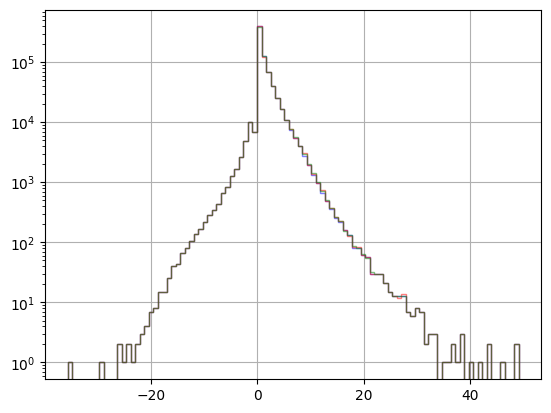

In [37]:
plt.hist(loss_exaact.flatten(), bins=100, alpha=0.5, label='Exact', color='blue', histtype='step')
plt.hist(loss_LUT.flatten(), bins=100, alpha=0.5, label='Exact', color='red', histtype='step')
plt.hist(loss_var_LUT.flatten(), bins=100, alpha=0.5, label='Exact', color='green', histtype='step')
plt.yscale('log')
plt.grid()
plt.show()


Gaussian Component
0.66706735 0.66706735
0.66706735 0.66706735
Non-Gaussian Component
1.2195661 1.2195661
1.2255017 1.2255017


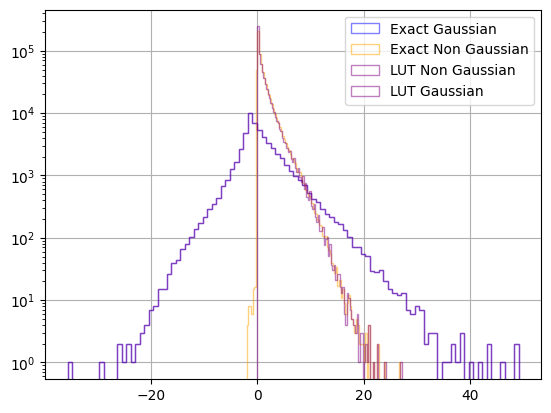

In [43]:
bmap = patterns_obs[val_split_sim]>40

plt.hist(loss_exaact[bmap].flatten(), bins=100, alpha=0.5, label='Exact Gaussian', color='blue', histtype='step')
print("Gaussian Component")
print(np.mean(loss_exaact[bmap].flatten()), np.median(np.mean((loss_exaact[bmap]), axis=-1)))
print(np.mean(loss_LUT[bmap].flatten()), np.median(np.mean((loss_LUT[bmap]), axis=-1)))
plt.hist(loss_exaact[~bmap].flatten(), bins=100, alpha=0.5, label='Exact Non Gaussian', color='Orange', histtype='step')
plt.hist(loss_LUT[~bmap].flatten(), bins=100, alpha=0.5, label='LUT Non Gaussian', color='purple', histtype='step')
plt.hist(loss_LUT[bmap].flatten(), bins=100, alpha=0.5, label='LUT Gaussian', color='purple', histtype='step')
print("Non-Gaussian Component")
print(np.mean(loss_exaact[~bmap].flatten()), np.median(np.mean((loss_exaact[~bmap]), axis=-1)))
print(np.mean(loss_LUT[~bmap].flatten()), np.median(np.mean((loss_LUT[~bmap]), axis=-1)))
plt.yscale('log')
plt.grid()
plt.legend()
plt.show()

In [44]:
"""
Comparison between LUT, Poisson and Shenyang losses on simulated data

Compare sum curves and what not
"""
loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=20, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=50, # x & mu integer subdivisions
                                    name="LossLayer")
loss_layer.set_call_mode("LUT_trainable_std", return_ratio = True)
input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = loss_layer(input_pattern1, input_pattern2)
full_loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))

# Poisson NLLR
def poisson(x, mu):
    x = np.clip(x, 1e-10, None)
    mu = np.clip(mu, 1e-10, None)
    mu *= x.sum(axis=-1, keepdims=True)
    return mu - x + x * np.log(x / mu)

# Shenyang - needs to be trained on data first 
class LikelihoodShenyang(tf.keras.layers.Layer):
    def build(self, input_shape):
        self.sigma = self.add_weight(
            shape=(n_alive_pmts, ), dtype=tf.float32, name='sigma',
            initializer=tf.keras.initializers.Ones(),
            trainable=True)
        self.power = self.add_weight(
            shape=(n_alive_pmts, ), dtype=tf.float32, name='power',
            initializer=tf.keras.initializers.Ones(),
            trainable=True)
        super().build(input_shape)

    def call(self, inputs):
        
        cex, cob = inputs[0], inputs[1]
        c = tf.reduce_sum(cob, axis=-1)
        c = tf.reshape(c, (-1, 1))
        cex = cex * c # aex/aob is [events*pmtsize tensor]
#         cex = tf.clip_by_value(cex, 1e-3, float('inf'))
#         cob = tf.clip_by_value(cob, 1e-3, float('inf'))
        broaden = 1.2
        cons= 0.1
        y = - (
            ((cob * tf.math.log(cex) -tf.math.lgamma(cob + 1)) - 
                (cex * tf.math.log(cex) - tf.math.lgamma(cex + 1)) 
            )
        * cex / (broaden * cex + (0.1* self.sigma * cex**self.power) ** 2 + cons)
        - 0.5 * tf.math.log(2 * math.pi * ( broaden * cex + (0.1 * self.sigma * cex**self.power) **2 + cons)))
        
        chi2 = - 2 * (
            ((cob * tf.math.log(cex) -tf.math.lgamma(cob + 1)) - 
                (cex * tf.math.log(cex) - tf.math.lgamma(cex + 1)) 
            )
        * cex / (broaden * cex + (0.1* self.sigma * cex**self.power) ** 2 + cons)
        )
        # register loss NOTE: I modified this to register the loss EVAL WILL NOT RETURN CHI2
        self.add_loss(tf.reduce_mean(y))

        return tf.reduce_sum(chi2, axis=1)

def custom_loss(y_true, y_pred):
    # Custom loss function for the model
    return tf.reduce_mean(y_pred)

input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = LikelihoodShenyang()([input_pattern1, input_pattern2])
shenyang_loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))
shenyang_loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))


In [45]:
shenyang_loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
shenyang_loss_model.fit({'pattern1':patterns_sim[train_split_sim], 'pattern2':patterns_obs[train_split_sim]},
                        validation_data = ({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]}, None),
                            epochs=200, batch_size=512, verbose=1)
shenyang_loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001))
shenyang_loss_model.fit({'pattern1':patterns_sim[train_split_sim], 'pattern2':patterns_obs[train_split_sim]},
                        validation_data = ({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]}, None),
                            epochs=200, batch_size=512, verbose=1)
shenyang_loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.00001))
shenyang_loss_model.fit({'pattern1':patterns_sim[train_split_sim], 'pattern2':patterns_obs[train_split_sim]},
                        validation_data = ({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]}, None),
                            epochs=200, batch_size=512, verbose=1)

Epoch 1/200
14/14 [==============================] - 0s 9ms/step - loss: 2.6823 - val_loss: 2.6799
Epoch 2/200
14/14 [==============================] - 0s 3ms/step - loss: 2.6813 - val_loss: 2.6789
Epoch 3/200
14/14 [==============================] - 0s 4ms/step - loss: 2.6802 - val_loss: 2.6780
Epoch 4/200
14/14 [==============================] - 0s 4ms/step - loss: 2.6794 - val_loss: 2.6774
Epoch 5/200
14/14 [==============================] - 0s 4ms/step - loss: 2.6789 - val_loss: 2.6769
Epoch 6/200
14/14 [==============================] - 0s 4ms/step - loss: 2.6782 - val_loss: 2.6765
Epoch 7/200
14/14 [==============================] - 0s 3ms/step - loss: 2.6780 - val_loss: 2.6762
Epoch 8/200
14/14 [==============================] - 0s 4ms/step - loss: 2.6781 - val_loss: 2.6760
Epoch 9/200
14/14 [==============================] - 0s 4ms/step - loss: 2.6776 - val_loss: 2.6758
Epoch 10/200
14/14 [==============================] - 0s 4ms/step - loss: 2.6776 - val_loss: 2.6757
Epoch 11/

In [46]:
loss_dist_shenyang = shenyang_loss_model.predict({'pattern1':patterns_sim, 'pattern2':patterns_obs},)
full_loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
loss_dist_full = full_loss_model.predict({'pattern1':patterns_sim, 'pattern2':patterns_obs},)
poisson_loss = poisson(patterns_obs, patterns_sim)

313/313 [==============================] - 1s 2ms/step


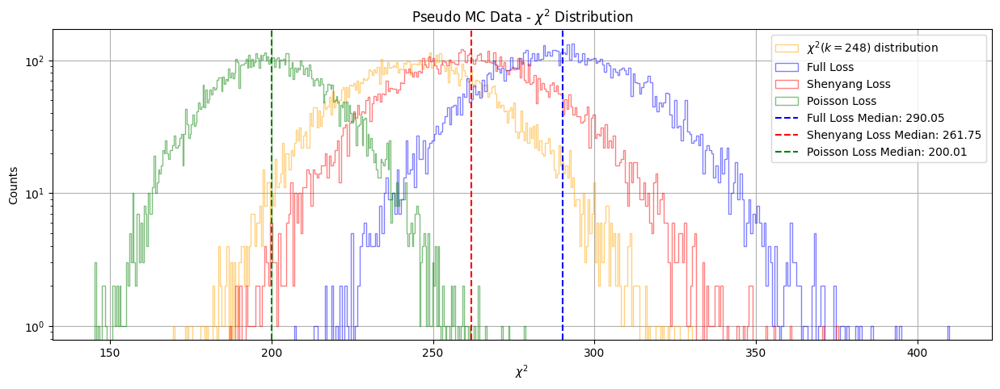

In [47]:
bins = 300

fig = plt.figure(figsize=(15, 5))

from scipy.stats import chi2
plt.hist(np.random.chisquare(df=n_alive_pmts, size=len(loss_dist_full)), bins=bins, density=False, alpha=0.5, label=r'$\chi^2(k=248)$ distribution', color='orange', histtype='step')


plt.hist(np.sum(loss_dist_full,axis=-1).flatten(), bins=bins, alpha=0.5, label='Full Loss', color='blue', histtype='step')
plt.hist(loss_dist_shenyang.flatten(), bins=bins, alpha=0.5, label='Shenyang Loss', color='red', histtype='step')
plt.hist(np.sum(poisson_loss, axis=-1).flatten(), bins=bins, alpha=0.5, label='Poisson Loss', color='green', histtype='step')

# Plot median lines for each 
val =np.median(np.sum(loss_dist_full,axis=-1))
plt.axvline(val, color='blue', linestyle='--', label='Full Loss Median: {:.2f}'.format(val))
val = np.median(loss_dist_shenyang)
plt.axvline(val, color='red', linestyle='--', label='Shenyang Loss Median: {:.2f}'.format(val))
val = np.median(np.sum(poisson_loss, axis=-1))
plt.axvline(val, color='green', linestyle='--', label='Poisson Loss Median: {:.2f}'.format(val))

# Plot an actual chi^2 distribution of degree 1 with as many points 
plt.title(r"Pseudo MC Data - $\chi^2$ Distribution")
plt.legend()
plt.xlabel(r"$\chi^2$")
plt.ylabel("Counts")
plt.yscale('log')
plt.grid()


Full Loss: fitted dof/n_alive_pmts = 286.55/246 = 1.165, median/n_alive_pmts = 290.05/246 = 1.179
Shenyang Loss: fitted dof/n_alive_pmts = 232.02/246 = 0.943, median/n_alive_pmts = 261.75/246 = 1.064
Poisson Loss: fitted dof/n_alive_pmts = 259.46/246 = 1.055, median/n_alive_pmts = 200.01/246 = 0.813


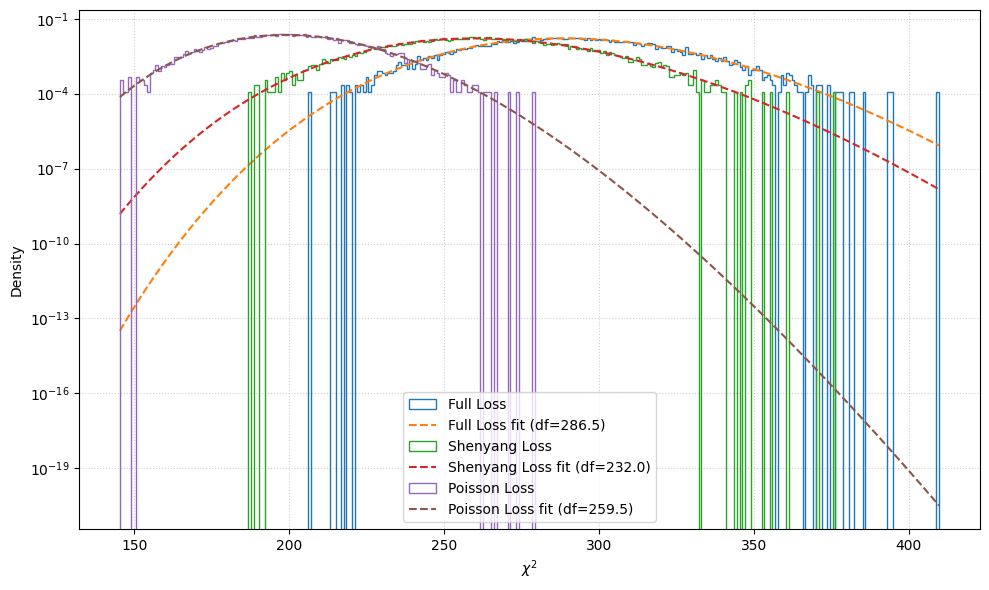

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2

# your number of PMTs
# prepare the three loss arrays
losses = {
    'Full Loss':     np.sum(loss_dist_full, axis=-1).flatten(),
    'Shenyang Loss': loss_dist_shenyang.flatten(),
    'Poisson Loss':  np.sum(poisson_loss, axis=-1).flatten(),
}

# make common bins
bins = 300
all_data = np.concatenate(list(losses.values()))
edges = np.linspace(all_data.min(), all_data.max(), bins+1)

fig, ax = plt.subplots(figsize=(10,6))

for label, data in losses.items():
    # 1) fit χ² with loc=0
    df_est, loc_est, scale_est = chi2.fit(data, floc=0)
    # 2) compute median
    med = np.median(data)
    # 3) print normalized stats
    print(f"{label}: fitted dof/n_alive_pmts = {df_est:.2f}/{n_alive_pmts} "
          f"= {df_est/n_alive_pmts:.3f}, "
          f"median/n_alive_pmts = {med:.2f}/{n_alive_pmts} "
          f"= {med/n_alive_pmts:.3f}")
    
    # 4) plot histogram (density)
    ax.hist(data, bins=edges, density=True, histtype='step', label=label)
    
    # 5) overplot fitted χ² PDF
    x = np.linspace(edges[0], edges[-1], 1000)
    pdf = chi2.pdf(x, df_est, loc=0, scale=scale_est)
    ax.plot(x, pdf, '--', label=f"{label} fit (df={df_est:.1f})")

ax.set_yscale('log')
ax.set_xlabel(r"$\chi^2$")
ax.set_ylabel("Density")
ax.legend()
ax.grid(True, linestyle=':', alpha=0.6)
plt.tight_layout()
plt.show()


In [281]:
# Load Loss functions SR1 trained weights

def _logl_loss(patterns, likelihood):
    return likelihood[0]
import sys
with tf.keras.utils.custom_object_scope({'_logl_loss': _logl_loss}):
    model_SR1_Shenyang = tf.keras.models.load_model("/Code/LCE_SR1/LCE_Neural_SR1")

In [286]:
# Evaluate loss using MC as pattern generator and real data
mc_patterns = make_mcMap_model().predict(pos_cnf)
# Evaluate with eaach likelihood funciton
shenyang_loss_model.layers[-1].set_weights(model_SR1_Shenyang.layers[-1].get_weights())
loss_dist_shenyang = shenyang_loss_model.predict({'pattern1':mc_patterns, 'pattern2':patterns_real},)
full_loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
loss_dist_full = full_loss_model.predict({'pattern1':mc_patterns, 'pattern2':patterns_real},)
poisson_loss = poisson(patterns_real, mc_patterns)

56191/56191 [==============================] - 97s 2ms/step


In [287]:
np.mean(poisson_loss), np.mean(loss_dist_full), np.mean(loss_dist_shenyang)

(1.6946101, 2.3007627, 415.54446)

In [293]:
model_SR1_Shenyang.summary()

Model: "neural_mc"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 xx (InputLayer)             [(None, 2)]                  0         []                            
                                                                                                  
 repeat_vector (RepeatVecto  (None, 246, 2)               0         ['xx[0][0]']                  
 r)                                                                                               
                                                                                                  
 adv_coord_transform (AdvCo  (None, 246, 12)              0         ['repeat_vector[0][0]']       
 ordTransform)                                                                                    
                                                                                          

In [297]:
model_SR1_Shenyang.summary()

Model: "neural_mc"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 xx (InputLayer)             [(None, 2)]                  0         []                            
                                                                                                  
 repeat_vector (RepeatVecto  (None, 246, 2)               0         ['xx[0][0]']                  
 r)                                                                                               
                                                                                                  
 adv_coord_transform (AdvCo  (None, 246, 12)              0         ['repeat_vector[0][0]']       
 ordTransform)                                                                                    
                                                                                          

In [299]:
"""
Eval for SR1 trained model 
"""
def tmp():
    patterns_real_padded = np.zeros((patterns_real.shape[0], n_pmts))
    patterns_real_padded[:, not_dead_pmts] = patterns_real

    def _logl_loss(patterns, likelihood):
        return likelihood[0]
    import sys
    with tf.keras.utils.custom_object_scope({'_logl_loss': _logl_loss}):
        model_SR1_Shenyang = tf.keras.models.load_model("/Code/LCE_SR1/LCE_Neural_SR1")

    print(np.median(model_SR1_Shenyang.predict({'xx':pos_cnf, 'yy':patterns_real_padded})))
tmp()

56191/56191 [==============================] - 138s 2ms/step
2.669768


### Training MLE

- Train Maximum Likelihood Estimator for exact method

- FIXME : Needs to come before loss func eval

In [43]:
loss_layer = LikelihoodRatio(       n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=1, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=10, # x & mu integer subdivisions
                                    name="LossLayer")
loss_layer.set_call_mode("LUT_untrainable_std", return_ratio = False)
input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = loss_layer(input_pattern1, input_pattern2)
loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))
loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))


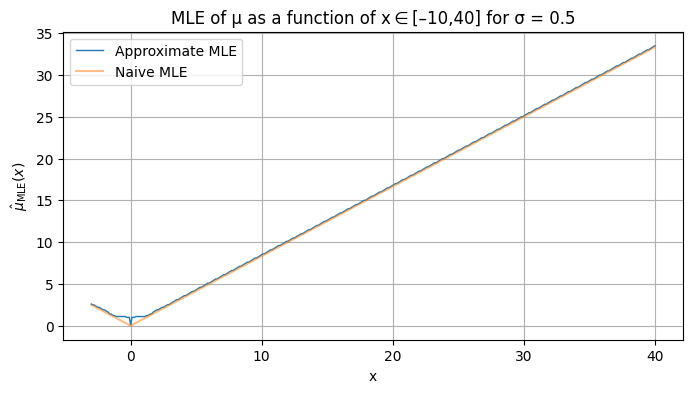

In [48]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# 1) Grab your LossLayer
loss_layer = loss_model.get_layer("LossLayer")

# All entries in last dim are the same
LL = loss_layer.L_table[:,:,0]

# 7) Argmax over μ
mu_mle_idx = np.argmax(LL, axis=0)
mu_mle     = loss_layer.mu_domain.numpy()[mu_mle_idx]
x_vals = loss_layer.x_domain
# 8) Plot μ̂(x)
plt.figure(figsize=(8,4))
plt.plot(x_vals, mu_mle, linewidth=1, label='Approximate MLE')
plt.xlabel('x')
plt.ylabel(r'$\hat\mu_{\mathrm{MLE}}(x)$')
plt.title('MLE of μ as a function of x ∈ [–10,40] for σ = 0.5')

plt.plot(x_vals, np.abs(x_vals)/1.2, alpha=0.5, label="Naive MLE")
plt.grid(True)
plt.legend()
plt.show()


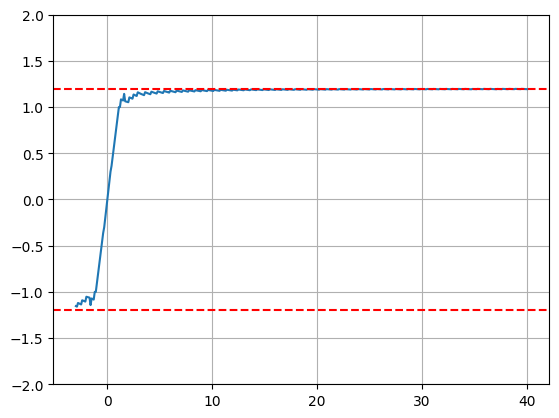

In [50]:
plt.plot(x_vals, x_vals/mu_mle)
plt.ylim(-2,2)
plt.axhline(1.2, color='r', linestyle='--')
plt.axhline(-1.2, color='r', linestyle='--')
plt.grid()

In [167]:
loss_layer = LikelihoodRatio(       n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=1, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=10, # x & mu integer subdivisions
                                    name="LossLayer")
loss_layer.set_call_mode("exact", return_ratio = False)

xs   = np.linspace(-3, 40, 430+1)
sigs = np.linspace(0.05, 1, 100)
mu_batch = np.linspace(0, 40, 300)
true_mles = []
for std in sigs:
    for x in xs:
        x_batch   = np.full_like(mu_batch, x)
        std_batch   = np.full_like(mu_batch, std)
        L = loss_layer.exact_likelihood(
                x_batch, 
                mu_batch, 
                std_batch
            ).numpy() 
        mu_mle = mu_batch[np.argmax(L)]
        true_mles.append([x, std, mu_mle])
data = np.array(true_mles, dtype=np.float32)# shape (N_x*N_σ, 3)
X, S, M = data[:,0], data[:,1], data[:,2]

In [301]:
#X_train = np.stack([X, S], axis=1)    # shape [N_samples,2]

w = 0.5

# rebuild training data with the extra feature
X_feat = []
for (x, σ, μ_mle) in zip(X, S, M):
    X_feat.append([ x,
                    σ,
                    np.exp(-(x**2)/(2*w*w)) ])
X_feat = np.array(X_feat, dtype=np.float32)  # shape [N,3]

y_train = M                           # shape [N_samples]

# 2) define & fit a tiny MLP
mlp = tf.keras.Sequential([
    tf.keras.layers.Input(3),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1),        # output μ̂
])
mlp.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='MSE')

ckpt_path = '/tmp/checkpoint'
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=ckpt_path,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
)


mlp.fit(X_feat, y_train, epochs=300, batch_size=512, verbose=1)

mlp.load_weights(ckpt_path)

mlp.save(os.path.join(model_path, "MLE_model.keras"))

Epoch 1/300
85/85 [==============================] - 0s 882us/step - loss: 27.5293
Epoch 2/300
85/85 [==============================] - 0s 2ms/step - loss: 0.0268
Epoch 3/300
85/85 [==============================] - 0s 664us/step - loss: 0.0197
Epoch 4/300
85/85 [==============================] - 0s 793us/step - loss: 0.0160
Epoch 5/300
85/85 [==============================] - 0s 792us/step - loss: 0.0136
Epoch 6/300
85/85 [==============================] - 0s 764us/step - loss: 0.0116
Epoch 7/300
85/85 [==============================] - 0s 719us/step - loss: 0.0105
Epoch 8/300
85/85 [==============================] - 0s 777us/step - loss: 0.0097
Epoch 9/300
85/85 [==============================] - 0s 735us/step - loss: 0.0091
Epoch 10/300
85/85 [==============================] - 0s 682us/step - loss: 0.0091
Epoch 11/300
85/85 [==============================] - 0s 788us/step - loss: 0.0086
Epoch 12/300
85/85 [==============================] - 0s 953us/step - loss: 0.0081
Epoch 13/300
8

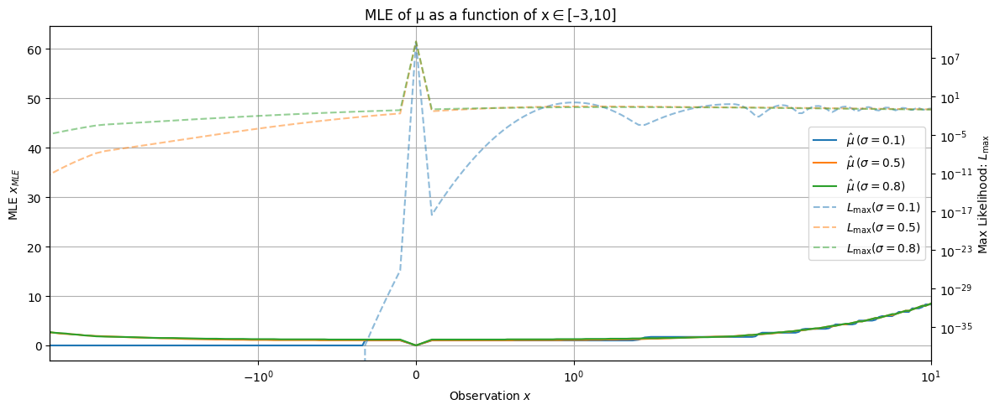

In [202]:
# Plot The MLE values for a few sigmas on left y, on right y plot the associated likelihood value 

import numpy as np
import matplotlib.pyplot as plt

# pick a few σ‐values to illustrate
selected_sigs = [0.1, 0.5, 0.8]

xs   = np.linspace(-3, 40, 430+1)
xs = np.concatenate([-np.logspace(-1, np.log(3), 100)[::-1],np.array([0]), np.logspace(-1, np.log(40), 401)])
mu_batch = np.logspace(-5, np.log(40), 600)


fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()

for σ in selected_sigs:
    mu_mles = []
    L_maxs  = []
    for x in xs:
        # make constant‐length batches of x and σ
        x_b   = np.full_like(mu_batch, x)
        σ_b   = np.full_like(mu_batch, σ)
        # evaluate likelihoods
        L = loss_layer.exact_likelihood(x_b, mu_batch, σ_b).numpy()
        # find the MLE and its likelihood
        idx       = np.argmax(L)
        mu_mles.append(mu_batch[idx])
        L_maxs .append(L[idx])
    # plot μ̂(x) on the left y
    ax1.plot(xs, mu_mles, label=fr"$\hat\mu\,(σ={σ})$")
    # plot L_max(x) on the right y
    ax2.plot(xs, L_maxs, linestyle="--", label=fr"$L_{{\max}}(σ={σ})$", alpha=0.5)

ax1.set_xlabel("Observation $x$")
ax1.set_ylabel("MLE $x_{MLE}$")
ax2.set_ylabel("Max Likelihood: $L_{\\max}$")

ax1.set_xscale('symlog')
ax1.set_xlim(-3, 10)
ax2.set_yscale('log')

# combine legends from both axes
lines1, labs1 = ax1.get_legend_handles_labels()
lines2, labs2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labs1 + labs2, loc="center right")

plt.title("MLE of μ as a function of x ∈ [–3,10]")

ax1.grid()
plt.tight_layout()
plt.show()


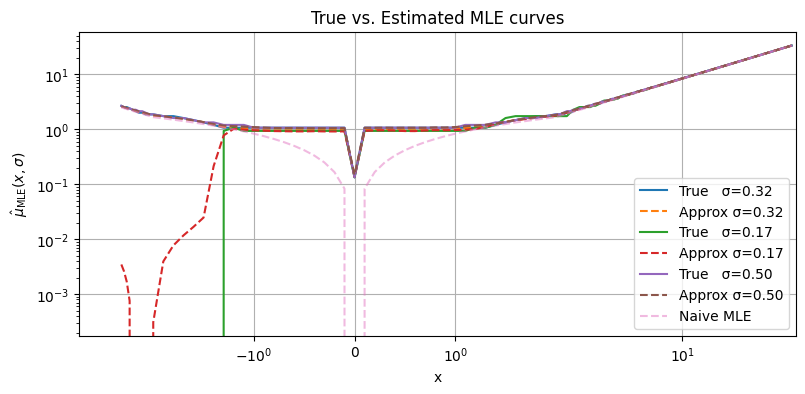

In [170]:
w = 0.5
mlp = tf.keras.Sequential([
    tf.keras.layers.Input(3),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1),        # output μ̂
])
mlp.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001), loss='MSE')
mlp.load_weights(os.path.join(model_path, "MLE_model.keras"))


def mle_estimator(x, σ):
    # x, σ are 1D tf.float32 tensors of the same length
    # e.g. piecewise-linear or RBF or mlp-based code goes here
    return mlp(np.stack([x, σ], axis=1))
def mle_estimator(x, σ):
    # x,σ are tf tensors of shape [N]
    bump = tf.exp(-(x**2)/(2*w*w))
    inp  = tf.stack([x, σ, bump], axis=1)    # now [N,3]
    return tf.squeeze(mlp(inp), axis=1)

choice_idx = np.array(np.random.randint(0, len(sigs), 2).tolist() + [np.abs(sigs - 0.5).argmin()])
choice = sigs[choice_idx]

approx_mles = {}
for σ in choice:
    x_tf  = tf.constant(xs, dtype=tf.float32)
    σ_tf  = tf.constant(np.full_like(xs, σ), dtype=tf.float32)
    approx_mles[σ] = mle_estimator(x_tf, σ_tf).numpy()

# Plot
plt.figure(figsize=(8,4))
for σ in choice:
    # mask out the true MLEs for this σ
    mask       = np.isclose(S, σ)
    true_curve = M[mask]          # same order as xs
    approx     = approx_mles[σ]

    plt.plot(xs, true_curve,  label=f'True   σ={σ:.2f}')
    plt.plot(xs, approx,      '--',  label=f'Approx σ={σ:.2f}')

plt.xlabel('x')
plt.ylabel(r'$\hat\mu_{\mathrm{MLE}}(x,\sigma)$')
plt.plot(xs, np.abs(xs)/1.2, '--', alpha=0.5, label='Naive MLE')
plt.title('True vs. Estimated MLE curves')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.xscale('symlog')
plt.yscale('log')
plt.show()


### Training Radial LCE

In [21]:
# Generate Radial LCE base model (there is wayyy to many options in this function )
rLCE_base = gen_model(seed=0, 
              starting_model=None, 
              include_wall = False, 
              include_perp = False, 
              include_anode = False, 
              anode_no_angle = False,
              stds=None, 
              multiplication_layers = False,
              radialLCE = True, # This and below are the only ones that matter here
              rLCE_groups = 1,
              monodense = False, 
              use_estimator = False, 
              biased_layer = False,
              anode_shadowing_bias = False,
              direct_bias = False,
)
rLCE_base.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
rLCE_base.get_layer('LossLayer').trainable = True

# Higher lr makes it go nan -> ALso not really needed since we are only training 6 parameters + i0 + variances
def sched(epoch, lr):
    return 0.0001 * (0.1 ** (epoch))

lr_cb = tf.keras.callbacks.LearningRateScheduler(sched)

rLCE_base.get_layer('LossLayer').trainable = True

rLCE_base.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))

rLCE_base.fit(   {'xy':pos_cnf[train_split][::], 'pattern':patterns_real[train_split][::]},
            None,
            validation_data = ({'xy':pos_cnf[val_split], 'pattern':patterns_real[val_split]}, None),  
            epochs = 3, batch_size = 2**10, #  14
            callbacks=[lr_cb], verbose = 1)
# 6 runs so 1e-2 * 0.1^6 = 1e-8

save_weights_to_dict(rLCE_base, os.path.join(model_path, "rLCE_base_model.json"))

Epoch 1/3
1230/1230 [==============================] - 2042s 2s/step - loss: 2.0289 - val_loss: 1.9951 - lr: 1.0000e-04
Epoch 2/3
1230/1230 [==============================] - 2039s 2s/step - loss: 1.9938 - val_loss: 1.9933 - lr: 1.0000e-05
Epoch 3/3
1230/1230 [==============================] - 2039s 2s/step - loss: 1.9928 - val_loss: 1.9931 - lr: 1.0000e-06


In [22]:
rLCE_base = gen_model(seed=0, 
              starting_model=None, 
              include_wall = False, 
              include_perp = False, 
              include_anode = False, 
              anode_no_angle = False,
              stds=None, 
              multiplication_layers = False,
              radialLCE = True, # This and below are the only ones that matter here
              rLCE_groups = 1,
              monodense = False, 
              use_estimator = False, 
              biased_layer = False,
              anode_shadowing_bias = False,
              direct_bias = False,
)
rLCE_base.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
rLCE_base.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))

refit_1 = do_grid_search(pos_cnf, patterns_real, rLCE_base, min_resolution, use_mean=True, start_factor=0)

np.savez(os.path.join(pos_refit_path, "rLCE_grid.npz"), refit_1)

56191/56191 [==============================] - 75s 1ms/step
Resolution 1.0 : Factor 0
56191/56191 [==============================] - 76s 1ms/step
Resolution 0.5 : Factor 1
56191/56191 [==============================] - 75s 1ms/step
Resolution 0.25 : Factor 2
56191/56191 [==============================] - 74s 1ms/step
Resolution 0.125 : Factor 3
56191/56191 [==============================] - 73s 1ms/step
Resolution 0.0625 : Factor 4
56191/56191 [==============================] - 73s 1ms/step
Resolution 0.03125 : Factor 5
56191/56191 [==============================] - 73s 1ms/step
Resolution 0.015625 : Factor 6
56191/56191 [==============================] - 73s 1ms/step


In [24]:
def scheduler(epoch, lr):
    return lr * 0.5

def tmp(encoder_model, positions, loss, min_resolution):
    n_tot = len(positions)
    new_pos = tensorflow.identity(positions)
    print("Starting Likelihood")
    print(tf.math.reduce_mean(loss))
    for i in range(5):
        print("Jagged iter {}".format(i))
        # Random pos shift in range [-1, 1) cm then reshifted to rnge min_resolution*2
        noise_pos = tensorflow.identity(positions) + (np.random.rand(*new_pos.numpy().shape) - 0.5)*2 * (2*min_resolution)
        # Update and fit encoder model positions
        encoder_model.get_layer('embed_pos').set_weights([noise_pos])
        # Compile and fit
        encoder_model.compile(optimizer = keras.optimizers.AdamW(learning_rate=1e-3))

        lr_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
        encoder_model.fit(x = np.arange(n_tot), 
                        epochs = 2, batch_size = 2**8,
                        callbacks=[lr_callback], verbose = 1) 
        noise_pos = encoder_model.get_layer('embed_pos').get_weights()[0]
        # Check result of new pos
        jittered_loss = tf.reduce_mean(encoder_model.predict(np.arange(n_tot)), axis=-1)

        better = jittered_loss < loss
        print("Fraction Better: {}".format(np.sum(better)/len(better)))
        loss =    tensorflow.where(better, jittered_loss, loss) 
        print("New Likelihood")
        print(tf.math.reduce_mean(loss))
        new_pos = tensorflow.where(tensorflow.expand_dims(better, axis=-1), noise_pos, new_pos) 
    
    return new_pos
loss = np.mean(rLCE_base.predict({'xy':refit_1, 'pattern':patterns_real}), axis=-1)
encoder_model = make_encoder(rLCE_base, refit_1, patterns_real)
encoder_poss = tmp(encoder_model, refit_1, loss, min_resolution)
np.savez(os.path.join(pos_refit_path, "rLCE_encoder.npz"), encoder_poss)


56191/56191 [==============================] - 71s 1ms/step
Starting Likelihood
tf.Tensor(1.4778347, shape=(), dtype=float32)
Jagged iter 0
Epoch 1/2
7024/7024 [==============================] - 94s 13ms/step - loss: 1.4912 - lr: 5.0000e-04
Epoch 2/2
56191/56191 [==============================] - 70s 1ms/step
Fraction Better: 0.00045547901209438594
New Likelihood
tf.Tensor(1.4778324, shape=(), dtype=float32)
Jagged iter 1
Epoch 1/2
7024/7024 [==============================] - 95s 13ms/step - loss: 1.4912 - lr: 5.0000e-04
Epoch 2/2
56191/56191 [==============================] - 71s 1ms/step
Fraction Better: 0.00038596145835592655
New Likelihood
tf.Tensor(1.477832, shape=(), dtype=float32)
Jagged iter 2
Epoch 1/2
7024/7024 [==============================] - 95s 13ms/step - loss: 1.4912 - lr: 5.0000e-04
Epoch 2/2
56191/56191 [==============================] - 71s 1ms/step
Fraction Better: 0.0003220053089165439
New Likelihood
tf.Tensor(1.4778317, shape=(), dtype=float32)
Jagged iter 3
Epoc

In [35]:
pos = np.load(os.path.join(pos_refit_path, "rLCE_encoder.npz"))['arr_0']
print('pos_refit: ', np.mean(rLCE_base.predict({'xy':pos, 'pattern':patterns_real})))
print('pos_cnf: ', np.mean(rLCE_base.predict({'xy':pos_cnf, 'pattern':patterns_real})))

56191/56191 [==============================] - 80s 1ms/step
pos_refit:  1.4778385
56191/56191 [==============================] - 79s 1ms/step
pos_cnf:  1.4942094


##### Miscellaneous Monotonic Trials

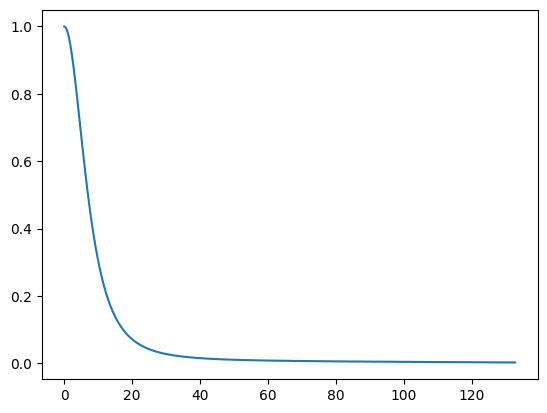

In [15]:
rLCE_base = gen_model(seed=0, 
              starting_model=None, 
              include_wall = False, 
              include_perp = False, 
              include_anode = False, 
              anode_no_angle = False,
              stds=None, 
              multiplication_layers = False,
              radialLCE = True, # This and below are the only ones that matter here
              rLCE_groups = 1,
              monodense = False, 
              use_estimator = False, 
              biased_layer = False,
              anode_shadowing_bias = False,
              direct_bias = False,
)

load_weights_from_dict(rLCE_base, os.path.join(model_path, "rLCE_base_model.json"))

rlce_layer = rLCE_base.get_layer('Radial_LCE').get_layer('radial_lce')

x = np.linspace(0, 66.4*2, 10000 // 246 * 246).reshape(-1 , 246)

res = rlce_layer(x)

plt.plot(np.array(x).flatten(), np.array(res).flatten())

In [16]:
# Flatten the array
flattened_res = res.numpy().flatten()

# Check if the array is monotonically decreasing
is_monotonically_decreasing = all(flattened_res[i] >= flattened_res[i + 1] for i in range(len(flattened_res) - 1))

print("monotonically decreasing?", is_monotonically_decreasing)

monotonically decreasing? True


In [19]:
# Check if monoDense can fit this 
rLCE_mono = gen_model(seed=0, 
              starting_model=None, 
              include_wall = False, 
              include_perp = False, 
              include_anode = False, 
              anode_no_angle = False,
              stds=None, 
              multiplication_layers = False,
              radialLCE = False, # This and below are the only ones that matter here
              rLCE_groups = 1,
              monodense = False, 
              use_estimator = False, 
              biased_layer = False,
              anode_shadowing_bias = False,
              direct_bias = False,
)

rLCE_mono = keras.Model(inputs = rLCE_mono.get_layer('PMTDistance_Pattern_Response').get_layer('Radial_Reshape').input, 
              outputs = rLCE_mono.get_layer('PMTDistance_Pattern_Response').get_layer('Radial_Reshape2').output)

# Train on x and res 




x = np.linspace(0, 66.4, 1000000 // 245 * 245)
n = np.arange(len(x))
np.random.shuffle(n)
x = x[n].reshape(-1 , 245)
res = rlce_layer(x)

rLCE_mono.compile(optimizer=keras.optimizers.AdamW(learning_rate=0.001), loss = 'mae')

rLCE_mono.fit(x, res, epochs=100, batch_size=8, verbose=1)

x = np.linspace(0, 2*66.4, 1000000 // 245 * 245)
n = np.arange(len(x))
np.random.shuffle(n)
x = x[n].reshape(-1 , 245)
res = rlce_layer(x)

rLCE_mono.compile(optimizer=keras.optimizers.AdamW(learning_rate=0.0001), loss = 'mae')

rLCE_mono.fit(x, res, epochs=100, batch_size=8, verbose=1)

x = np.linspace(0, 2*66.4, 1000000 // 245 * 245)
n = np.arange(len(x))
np.random.shuffle(n)
x = x[n].reshape(-1 , 245)
res = rlce_layer(x)

rLCE_mono.compile(optimizer=keras.optimizers.AdamW(learning_rate=0.00001), loss = 'mae')

rLCE_mono.fit(x, res, epochs=100, batch_size=8, verbose=1)

Epoch 1/100
511/511 [==============================] - 1s 2ms/step - loss: 0.0678
Epoch 2/100
511/511 [==============================] - 1s 2ms/step - loss: 0.0127
Epoch 3/100
511/511 [==============================] - 1s 2ms/step - loss: 0.0120
Epoch 4/100
511/511 [==============================] - 1s 2ms/step - loss: 0.0116
Epoch 5/100
511/511 [==============================] - 1s 2ms/step - loss: 0.0112
Epoch 6/100
511/511 [==============================] - 2s 4ms/step - loss: 0.0109
Epoch 7/100
511/511 [==============================] - 2s 3ms/step - loss: 0.0106
Epoch 8/100
511/511 [==============================] - 2s 3ms/step - loss: 0.0101
Epoch 9/100
511/511 [==============================] - 2s 3ms/step - loss: 0.0097
Epoch 10/100
511/511 [==============================] - 2s 4ms/step - loss: 0.0091
Epoch 11/100
511/511 [==============================] - 2s 3ms/step - loss: 0.0084
Epoch 12/100
511/511 [==============================] - 1s 2ms/step - loss: 0.0077
Epoch 13/100


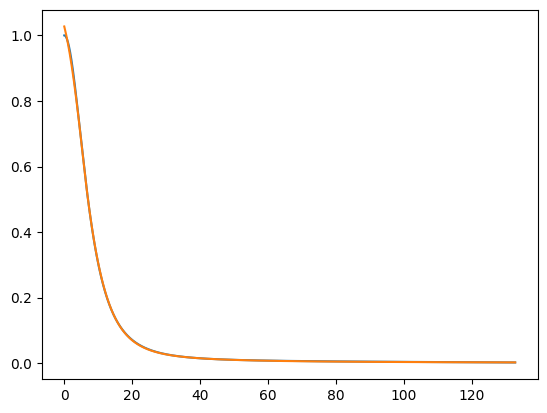

In [21]:
x = np.linspace(0, 66.4*2, 10000 // 245 * 245).reshape(-1 , 245)

res = rlce_layer(x)

plt.plot(np.array(x).flatten(), np.array(res).flatten())

res = rLCE_mono(x)

plt.plot(np.array(x).flatten(), np.array(res).flatten())

### Training Pseudo MC Start

- Train on fake monte carlo data to generate baseline model  (needs first cell of Loss Func Eval to be run prior)

In [39]:
"""
Train on the Pseudo MC Data, 
start 1 epoch on Direct Detection so that the model has a starting point then introduce all the layers (whose contribution orignally defaults to null)

Current constraints: 

LCE = (D + c_W * W) * A * P 

D : Decreases with increasing R
0 <= c_W <= 1
W : Decreases with increasing Wall event and WAll PMT distance
A : increase in n_wires decreases output and angle is unconstrained
P : Increase in n_wires decreases output

"""

model_checkpoint_path = "/tmp/checkpoint"
c1 = keras.callbacks.ModelCheckpoint(model_checkpoint_path, 
                            save_best_only=True,
                            monitor='val_loss',
                            save_weights_only=True,
                            save_freq="epoch")
c2 = ReduceLRBacktrack( best_path=model_checkpoint_path, 
                        monitor="val_loss",
                        factor=0.2,
                        patience=3,
                        min_lr=1e-10,
                        verbose=1)

test = gen_model(seed=0, starting_model=None, 
                 include_wall = False, include_perp = False, include_anode = False, 
                 multiplication_layers=True, radialLCE=False, monodense=True, use_estimator=False)

test.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
test.get_layer('LossLayer').trainable = False

test.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))

test.fit(   {'xy':pos_sim[train_split_sim][::], 'pattern':patterns_obs[train_split_sim][::]},
            None,
            validation_data = ({'xy':pos_sim[val_split_sim], 'pattern':patterns_obs[val_split_sim]}, None),  
            epochs = 1, batch_size = 2**4, #  14
            callbacks=[c1, c2], verbose = 1)

test = gen_model(seed=0, starting_model=test, 
                 include_wall = True, include_perp = True, include_anode = False, 
                 multiplication_layers=True, radialLCE=False, monodense=True)

test.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
test.get_layer('LossLayer').trainable = False

test.compile(optimizer=tfa.optimizers.LAMB(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))

test.fit(   {'xy':pos_sim[train_split_sim][::], 'pattern':patterns_obs[train_split_sim][::]},
            None,
            validation_data = ({'xy':pos_sim[val_split_sim], 'pattern':patterns_obs[val_split_sim]}, None),  
            epochs = 40, batch_size = 2**4, #  14
            callbacks=[c1, c2], verbose = 1)

test.load_weights(model_checkpoint_path)


save_weights_to_dict(test, os.path.join(model_path, "PseudoMCDatTrain.json"))

438/438 [==============================] - 11s 22ms/step - loss: 12.9690 - val_loss: 4.4366 - lr: 0.0010
Epoch 1/40
438/438 [==============================] - 16s 30ms/step - loss: 3.3310 - val_loss: 2.6974 - lr: 0.0010
Epoch 2/40
438/438 [==============================] - 12s 27ms/step - loss: 2.7755 - val_loss: 2.6273 - lr: 0.0010
Epoch 3/40
438/438 [==============================] - 12s 27ms/step - loss: 2.7037 - val_loss: 2.6158 - lr: 0.0010
Epoch 4/40
438/438 [==============================] - 12s 27ms/step - loss: 2.6784 - val_loss: 2.6123 - lr: 0.0010
Epoch 5/40
438/438 [==============================] - 12s 27ms/step - loss: 2.6662 - val_loss: 2.6081 - lr: 0.0010
Epoch 6/40
438/438 [==============================] - 12s 27ms/step - loss: 2.6540 - val_loss: 2.5961 - lr: 0.0010
Epoch 7/40
438/438 [==============================] - 12s 28ms/step - loss: 2.6429 - val_loss: 2.5904 - lr: 0.0010
Epoch 8/40
438/438 [==============================] - 12s 27ms/step - loss: 2.6385 - val_l

In [40]:
w_saved = test.get_weights()

In [38]:
tmp = gen_model(seed=0, starting_model=None,
                    include_wall = True, include_perp = True, include_anode = False, 
                    multiplication_layers=True, radialLCE=False, monodense=True)
w1 = test.get_weights()
w2 = w_saved#test2.get_weights()

if len(w1) != len(w2):
    print(f"Different number of weight arrays: {len(w1)} vs {len(w2)}")
else:
    all_same = True
    for i, (a, b) in enumerate(zip(w1, w2)):
        if not np.allclose(a, b, atol=1e-5):
            diff = np.max(np.abs(a - b))
            print(f"Weight #{i} (shape {a.shape}) max‐abs‐diff = {diff:.3e}")
            all_same = False
    if all_same:
        print("All weight arrays match within tolerance.")



Different number of weight arrays: 38 vs 74


In [41]:
# Eval on Real Data 2.17 old baseline
test2 = gen_model(seed=0, starting_model=None,
                    include_wall = True, include_perp = True, include_anode = False, 
                    multiplication_layers=True, radialLCE=False, monodense=True)
test2.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = False)
load_weights_from_dict(test2, os.path.join(model_path, "PseudoMCDatTrain.json"))
test2.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))
print("CNF Pos")
test2.evaluate({'xy':pos_cnf[val_split][::], 'pattern':patterns_real[val_split][::]},
            None,
            batch_size = 2**10, #  14
            verbose = 1)
print("Train Pos")
test2.evaluate({'xy':pos_sim[val_split_sim][::], 'pattern':patterns_obs[val_split_sim][::]},
            None,
            batch_size = 2**10, #  14
            verbose = 1)

CNF Pos
527/527 [==============================] - 80s 151ms/step - loss: 2.3807
Train Pos
3/3 [==============================] - 0s 146ms/step - loss: 2.5369


2.536895751953125

In [42]:
# Eval on Real Data 2.17 old baseline
test2 = gen_model(seed=0, starting_model=None,
                    include_wall = True, include_perp = True, include_anode = False, 
                    multiplication_layers=True, radialLCE=False, monodense=True)
test2.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
load_weights_from_dict(test2, os.path.join(model_path, "PseudoMCDatTrain.json"))
test2.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))
print("CNF Pos")
test2.evaluate({'xy':pos_cnf[val_split][:100:], 'pattern':patterns_real[val_split][:100:]},
            None,
            batch_size = 2**10, #  14
            verbose = 1)
print("Train Pos")
test2.evaluate({'xy':pos_sim[val_split_sim][::], 'pattern':patterns_obs[val_split_sim][::]},
            None,
            batch_size = 2**10, #  14
            verbose = 1)

CNF Pos
1/1 [==============================] - 0s 496ms/step - loss: 2.3751
Train Pos
3/3 [==============================] - 2s 705ms/step - loss: 2.5621


2.5621347427368164

In [43]:
# Eval on Real Data 2.17 old baseline
test3 = gen_model(seed=0, starting_model=None,
                    include_wall = True, include_perp = True, include_anode = False, 
                    multiplication_layers=True, radialLCE=False, monodense=True)
test3.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
load_weights_from_dict(test3, os.path.join(model_path, "PseudoMCDatTrain.json"))
test3.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))
print("CNF Pos")
test3.evaluate({'xy':pos_cnf[val_split][::], 'pattern':patterns_real[val_split][::]},
            None,
            batch_size = 2**10, #  14
            verbose = 1)
test3.evaluate({'xy':pos_sim[val_split_sim][::], 'pattern':patterns_obs[val_split_sim][::]},
            None,
            batch_size = 2**10, #  14
            verbose = 1)

CNF Pos
3/3 [==============================] - 0s 148ms/step - loss: 1.2255


1.2255101203918457

### Real Data Coevolve Strategy

- Main training Section

In [44]:
"""


Train base model without anode mesh 


"""


# Make a mask for good loss events 
n_points =2**8 *10 * 5

test = gen_model(seed=0, starting_model=None, 
                 include_wall = True, include_perp = True, include_anode = False,
                 multiplication_layers=True, radialLCE=False, monodense=True)
load_weights_from_dict(test, os.path.join(model_path, "PseudoMCDatTrain.json"))
test = gen_model(seed=0, starting_model=test, 
                 include_wall = True, include_perp = True, include_anode = False,
                 multiplication_layers=True, radialLCE=False, monodense=True)

test.get_layer('LossLayer').set_call_mode("LUT_trainable_std", return_ratio = True)
test.get_layer('LossLayer').trainable = True
test.compile(optimizer=tfa.optimizers.LAMB(learning_rate = 0.001))

base_loss = np.mean(test.predict({'xy':pos_cnf, 'pattern':patterns_real},batch_size=2**10),axis=-1)
# Only the elemnt at n_points is sorted correctly, everything before is only constrained ot be smaller and behind larger but no explicit order
# Ie choose best n_points : achieved chi2 = 2.022 on final set  
#idx = np.argpartition(base_loss, n_points)[:n_points] 

# Select points around median value  : achieved chi2 = 1.753 on final set 
idx = np.argpartition(np.abs(base_loss - np.median(base_loss)), n_points)[:n_points]
#idx = np.concatenate([idx, np.argpartition(np.abs(base_loss - np.median(base_loss)), n_points)[:n_points]])

# Select the points less than the 99.7th percentile ( < 3\sigma ): achieved chi2 = 1.7526
#th = np.percentile(base_loss, 99.7)
# 2. sort all indices by loss
#sorted_idx = np.argsort(base_loss)
#sorted_vals = base_loss[sorted_idx]
# 3. find the first position ≥ th
#pos = np.searchsorted(sorted_vals, th, side='left')
# 4. take n_points immediately below that position
#idx = sorted_idx[max(0, pos - n_points):pos]
#idx = np.concatenate([idx, sorted_idx[max(0, pos - n_points):pos]])
#n_points = 3*n_points
np.random.shuffle(idx)
print(np.mean(base_loss[idx]))
del base_loss

1756/1756 [==============================] - 263s 150ms/step
2.1469223


In [46]:
test = gen_model(seed=0, starting_model=None, 
                 include_wall = True, include_perp = True, include_anode = False, 
                 multiplication_layers=True, radialLCE=False, monodense=True)

# Use retrain from below 
load_weights_from_dict(test, os.path.join(model_path, "PseudoMCDatTrain.json"))
test = gen_model(seed=0, starting_model=test, 
                 include_wall = True, include_perp = True, include_anode = False, 
                 multiplication_layers=True, radialLCE=False, monodense=True)

test.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
test.get_layer('LossLayer').trainable = True

# Build the encoder model
encoder_model = make_encoder(test, pos_cnf[idx], patterns_real[idx])
# Make the base model trainable 
encoder_model.layers[-1].trainable = True
# Callbacks
model_checkpoint_path = "/tmp/checkpoint"
c1 = keras.callbacks.ModelCheckpoint(model_checkpoint_path, 
                            save_best_only=True,
                            monitor='loss',
                            save_weights_only=True,
                            save_freq="epoch")
c2 = ReduceLRBacktrack( best_path=model_checkpoint_path, 
                        monitor="loss",
                        factor=0.5,
                        patience=10,
                        min_lr=1e-6,
                        verbose=1)

#### Train alongside positions
encoder_model.get_layer("embed_pos").trainable = True
encoder_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))

encoder_model.fit(  np.arange(n_points),
                    None,
                    epochs = 100, batch_size = 2**8, #  14
                    callbacks=[c1, c2], verbose = 1)

save_weights_to_dict(encoder_model.layers[-1], os.path.join(model_path, 'FullSimultaneousTrain.json'))


Epoch 1/100
50/50 [==============================] - 24s 440ms/step - loss: 2.1431 - lr: 0.0010
Epoch 2/100
50/50 [==============================] - 22s 447ms/step - loss: 2.0761 - lr: 0.0010
Epoch 3/100
50/50 [==============================] - 21s 423ms/step - loss: 1.9995 - lr: 0.0010
Epoch 4/100
50/50 [==============================] - 22s 435ms/step - loss: 2.0181 - lr: 0.0010
Epoch 5/100
50/50 [==============================] - 22s 436ms/step - loss: 1.9980 - lr: 0.0010
Epoch 6/100
50/50 [==============================] - 21s 415ms/step - loss: 2.0049 - lr: 0.0010
Epoch 7/100
50/50 [==============================] - 21s 415ms/step - loss: 1.9975 - lr: 0.0010
Epoch 8/100
50/50 [==============================] - 21s 415ms/step - loss: 1.9991 - lr: 0.0010
Epoch 9/100
50/50 [==============================] - 21s 415ms/step - loss: 1.9967 - lr: 0.0010
Epoch 10/100
50/50 [==============================] - 21s 414ms/step - loss: 1.9973 - lr: 0.0010
Epoch 11/100
50/50 [===================

KeyboardInterrupt: 

In [47]:
save_weights_to_dict(encoder_model.layers[-1], os.path.join(model_path, 'FullSimultaneousTrain.json'))


In [49]:
# 1.39 last run
eval_model = gen_model(seed=0, starting_model=encoder_model.layers[-1], 
                 include_wall = True, include_perp = True, include_anode = False, anode_no_angle= True,
                 multiplication_layers=True, radialLCE=False, monodense=True)
eval_model.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
eval_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))
eval_model.evaluate({'xy':pos_cnf, 'pattern':patterns_real},)


56191/56191 [==============================] - 563s 10ms/step - loss: 1.3619


1.3619089126586914

In [50]:
pos_ref_model = gen_model(seed=0, starting_model=encoder_model.layers[-1], 
                 include_wall = True, include_perp = True, include_anode = False, anode_no_angle= True,
                 multiplication_layers=True, radialLCE=False, monodense=True)
pos_ref_model.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
pos_ref_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))

refit_1 = do_grid_search(pos_cnf, patterns_real, pos_ref_model, min_resolution, use_mean=True, start_factor=0)

np.savez(os.path.join(pos_refit_path, "refit_1_simul_train.npz"), refit_1)

56191/56191 [==============================] - 506s 9ms/step
Resolution 1.0 : Factor 0
56191/56191 [==============================] - 449s 8ms/step
Resolution 0.5 : Factor 1
56191/56191 [==============================] - 446s 8ms/step
Resolution 0.25 : Factor 2
56191/56191 [==============================] - 450s 8ms/step
Resolution 0.125 : Factor 3
56191/56191 [==============================] - 489s 9ms/step
Resolution 0.0625 : Factor 4
56191/56191 [==============================] - 489s 9ms/step
Resolution 0.03125 : Factor 5
56191/56191 [==============================] - 488s 9ms/step
Resolution 0.015625 : Factor 6
56191/56191 [==============================] - 489s 9ms/step


In [51]:
pos_ref_model.evaluate({'xy':refit_1, 'pattern':patterns_real}, 
                       batch_size = 2**10, verbose = 1)

1756/1756 [==============================] - 266s 151ms/step - loss: 1.3371


1.3371288776397705

<Axes: xlabel='X Position', ylabel='Y Position'>

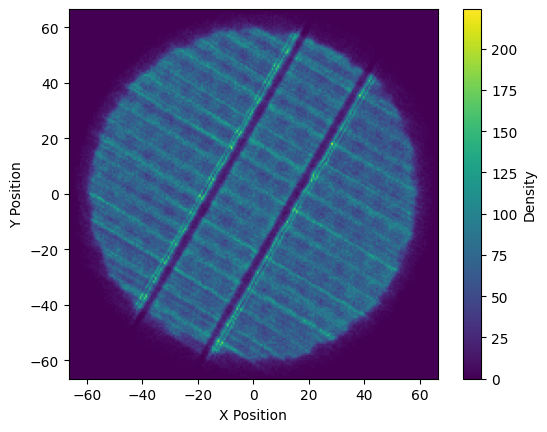

In [52]:
do_density_plot(plt.gca(), refit_1, bins=200)

In [53]:
# NExt full encoder
pos_ref_model = gen_model(seed=0, starting_model=encoder_model.layers[-1], 
                 include_wall = True, include_perp = True, include_anode = False, anode_no_angle= True,
                 multiplication_layers=True, radialLCE=False, monodense=True)
pos_ref_model.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = False)
load_weights_from_dict(pos_ref_model, os.path.join(model_path, "FullSimultaneousTrain.json"))

encoder_model = make_encoder(pos_ref_model, pos_cnf, patterns_real)

for layer in encoder_model.layers:
    if layer.name != "embed_pos":
        layer.trainable = False
    else:
        layer.trainable = True

encoder_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))


def tmp():
    n_tot = len(refit_1)
    loss    = tf.reduce_mean(encoder_model.predict(np.arange(n_tot)), axis=-1)
    return loss

base_loss =tmp()

56191/56191 [==============================] - 998s 18ms/step


In [54]:

def scheduler(epoch, lr):
    return lr * 0.5

def tmp(encoder_model, positions, loss, min_resolution):
    n_tot = len(positions)
    new_pos = tensorflow.identity(positions)
    print("Starting Likelihood")
    print(tf.math.reduce_mean(loss))
    for i in range(5):
        print("Jagged iter {}".format(i))
        # Random pos shift in range [-1, 1) cm then reshifted to rnge min_resolution*2
        noise_pos = tensorflow.identity(positions) + (np.random.rand(*new_pos.numpy().shape) - 0.5)*2 * (2*min_resolution)
        # Update and fit encoder model positions
        encoder_model.get_layer('embed_pos').set_weights([noise_pos])
        # Compile and fit
        encoder_model.compile(optimizer = keras.optimizers.AdamW(learning_rate=1e-3))

        lr_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
        encoder_model.fit(x = np.arange(n_tot), 
                        epochs = 2, batch_size = 2**8,
                        callbacks=[lr_callback], verbose = 1) 
        noise_pos = encoder_model.get_layer('embed_pos').get_weights()[0]
        # Check result of new pos
        jittered_loss = tf.reduce_mean(encoder_model.predict(np.arange(n_tot)), axis=-1)

        better = jittered_loss < loss
        print("Fraction Better: {}".format(np.sum(better)/len(better)))
        loss =    tensorflow.where(better, jittered_loss, loss) 
        print("New Likelihood")
        print(tf.math.reduce_mean(loss))
        new_pos = tensorflow.where(tensorflow.expand_dims(better, axis=-1), noise_pos, new_pos) 
    
    return new_pos

encoder_pos = tmp(encoder_model, refit_1, base_loss, min_resolution)
np.savez(os.path.join(pos_refit_path, "refit_1_encoder_simul_train.npz"), encoder_pos)

Starting Likelihood
tf.Tensor(1.9692537, shape=(), dtype=float32)
Jagged iter 0
Epoch 1/2
7024/7024 [==============================] - 527s 75ms/step - loss: 1.9917 - lr: 5.0000e-04
Epoch 2/2
56191/56191 [==============================] - 1019s 18ms/step
Fraction Better: 0.10338817434112653
New Likelihood
tf.Tensor(1.9677758, shape=(), dtype=float32)
Jagged iter 1
Epoch 1/2
7024/7024 [==============================] - 528s 75ms/step - loss: 1.9917 - lr: 5.0000e-04
Epoch 2/2
56191/56191 [==============================] - 895s 16ms/step
Fraction Better: 0.05485657972523326
New Likelihood
tf.Tensor(1.967723, shape=(), dtype=float32)
Jagged iter 2
Epoch 1/2
7024/7024 [==============================] - 526s 75ms/step - loss: 1.9917 - lr: 5.0000e-04
Epoch 2/2
56191/56191 [==============================] - 888s 16ms/step
Fraction Better: 0.03758953165745976
New Likelihood
tf.Tensor(1.9676956, shape=(), dtype=float32)
Jagged iter 3
Epoch 1/2
7024/7024 [==============================] - 527s 75

In [90]:
"""
Below I started using encoder only so the pos updatess werent great
- Start from iteration 2 again and let it evolve for a while 

Coevolve 1 completed nothing else ran 
"""

def get_model(path, ):
    model = gen_model(seed=0, starting_model=None, 
                 include_wall = True, include_perp = True, include_anode = False, anode_no_angle= True,
                 multiplication_layers=True, radialLCE=False, monodense=True, large_direct=True)
    model.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
    load_weights_from_dict(model, path)
    model = gen_model(seed=0, starting_model=model, 
                 include_wall = True, include_perp = True, include_anode = False, anode_no_angle= True,
                 multiplication_layers=True, radialLCE=False, monodense=True, large_direct=True)
    return model
def get_loss_dist(path, pos, n_points = 2**8 * 10 * 5):
    model = get_model(path)
    model.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
    model.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))
    loss_dist = np.mean(model.predict({'xy':pos, 'pattern':patterns_real}, batch_size=2**10), axis=-1)
    print("Mean chi^2: ", np.mean(loss_dist))
    print("Median chi^2: ", np.median(loss_dist))
    idx = np.argpartition(np.abs(loss_dist - np.median(loss_dist)), n_points)[:n_points]
    return idx
def encoder_refine(encoder_model, positions, loss, min_resolution):
    def scheduler(epoch, lr):
        return lr * 0.5
    n_tot = len(positions)
    new_pos = tensorflow.identity(positions)
    print("Starting Likelihood")
    print(tf.math.reduce_mean(loss))
    for i in range(3):
        print("Jagged iter {}".format(i))
        # Random pos shift in range [-1, 1) cm then reshifted to rnge min_resolution*2
        noise_pos = tensorflow.identity(positions) + (np.random.rand(*new_pos.numpy().shape) - 0.5)*2 * (2*min_resolution)
        # Update and fit encoder model positions
        encoder_model.get_layer('embed_pos').set_weights([noise_pos])
        # Compile and fit
        encoder_model.compile(optimizer = keras.optimizers.AdamW(learning_rate=1e-3))

        lr_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
        encoder_model.fit(x = np.arange(n_tot), 
                        epochs = 1, batch_size = 2**8,
                        callbacks=[lr_callback], verbose = 1) 
        noise_pos = encoder_model.get_layer('embed_pos').get_weights()[0]
        # Check result of new pos
        jittered_loss = tf.reduce_mean(encoder_model.predict(np.arange(n_tot)), axis=-1)

        better = jittered_loss < loss
        print("Fraction Better: {}".format(np.sum(better)/len(better)))
        loss =    tensorflow.where(better, jittered_loss, loss) 
        print("New Likelihood")
        print(tf.math.reduce_mean(loss))
        new_pos = tensorflow.where(tensorflow.expand_dims(better, axis=-1), noise_pos, new_pos) 
    
    return new_pos

# Callbacks
model_checkpoint_path = "/tmp/checkpoint"
c1 = keras.callbacks.ModelCheckpoint(model_checkpoint_path, 
                            save_best_only=True,
                            monitor='loss',
                            save_weights_only=True,
                            save_freq="epoch")
c2 = ReduceLRBacktrack( best_path=model_checkpoint_path, 
                        monitor="loss",
                        factor=0.5,
                        patience=10,
                        min_lr=1e-6,
                        verbose=1)

curr_path = os.path.join(model_path, "FullSimultaneousTrain.json")
model = get_model(curr_path)
model.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
model.get_layer('LossLayer').trainable = True
model.get_layer("Wall_Reflection_Pattern_Response").get_layer("Event_Wall_distance").set_mode('optimize', tol=1e-2, max_iter = 100)
pos_path = os.path.join(pos_refit_path, "refit_1_encoder_simul_train.npz")
pos = np.load(pos_path)['arr_0']

# One pretrain as we changed a bunch of parameters
# We train on pos_cnf to facilitate not picking up the bias induced by the last refit, everything else relative to the refit
model.compile(optimizer = tfa.optimizers.LAMB(lr=1e-2), )
model.fit(
    {'xy':pos_cnf[train_split][::3], 'pattern':patterns_real[train_split][::3]},
    None,
    validation_data = {'xy':pos[val_split][::3], 'pattern':patterns_real[val_split][::3]},
    epochs = 1,
    verbose = 1,
)
model.compile(optimizer = tfa.optimizers.LAMB(lr=1e-3), )
model.fit(
    {'xy':pos_cnf[train_split][::2], 'pattern':patterns_real[train_split][::2]},
    None,
    validation_data = {'xy':pos[val_split][::2], 'pattern':patterns_real[val_split][::2]},
    epochs = 1,
    verbose = 1,
)
save_weights_to_dict(model, os.path.join(model_path, 'PreLoopRetrainHighRes.json'))
# Reload and repeat
curr_path = os.path.join(model_path, "PreLoopRetrainHighRes.json")
model = get_model(curr_path)

n_points = 2**8 * 50
for i in range(3):
    ##### Coevolve
    # Build the encoder model
    if i!= 0: # Quick interruption I placed the wrong model in the grid search originally
        idx = get_loss_dist(curr_path, pos, n_points = n_points)
        model.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
        model.get_layer('LossLayer').trainable = True
        model.get_layer("Wall_Reflection_Pattern_Response").get_layer("Event_Wall_distance").set_mode('optimize', tol=1e-2, max_iter = 100)

        encoder_model = make_encoder(model, pos[idx], patterns_real[idx])
        # Make the base model trainable 
        encoder_model.layers[-1].trainable = True
        
        print("Coevolve ", i)
        #### Train alongside positions
        encoder_model.get_layer("embed_pos").trainable = True

        encoder_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))

        encoder_model.fit(  np.arange(n_points),
                            None,
                            epochs = 50, batch_size = 2**8, #  14
                            callbacks=[c1, c2], verbose = 1)

        save_weights_to_dict(encoder_model.layers[-1], os.path.join(model_path, "Final_weights_{}.json".format(i)))
        curr_path = os.path.join(model_path, "Final_weights_{}.json".format(i))
        import json
        with open(os.path.join(model_path, "Final_weights_{}.json".format(i))) as f:
            weights = json.load(f)
        print(weights['LossLayer/GaussianStandardDeviation:0'])

    print("Grid Search ", i)
    ##### Position Refit 
    model = get_model(curr_path)
    model.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
    model.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))
    pos = do_grid_search(pos, patterns_real, model, min_resolution, use_mean=True, start_factor=4)
    np.savez(os.path.join(pos_refit_path, "iterative_grid_search_{}.npz".format(i)), pos)

    print("Encoder ", i)
    # Do Encoder
    encoder_model = make_encoder(model, pos, patterns_real)
    encoder_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))
    loss = tf.reduce_mean(encoder_model.predict(np.arange(len(pos))), axis=-1)
    print("Pre Encoder Loss ", np.mean(loss))
    pos = encoder_refine(encoder_model, pos, loss, min_resolution).numpy()
    np.savez(os.path.join(pos_refit_path, "iterative_encoder_search_{}.npz".format(i)), pos)
    
    # reload Model and repeat
    model = get_model(curr_path)

Grid Search  0
56191/56191 [==============================] - 528s 9ms/step
Resolution 0.0625 : Factor 4
56191/56191 [==============================] - 527s 9ms/step
Resolution 0.03125 : Factor 5
56191/56191 [==============================] - 542s 10ms/step
Resolution 0.015625 : Factor 6
56191/56191 [==============================] - 538s 10ms/step
Encoder  0
56191/56191 [==============================] - 546s 10ms/step
Pre Encoder Loss  1.3033247
Starting Likelihood
tf.Tensor(1.3033248, shape=(), dtype=float32)
Jagged iter 0
56191/56191 [==============================] - 523s 9ms/step
Fraction Better: 0.004704391896589024
New Likelihood
tf.Tensor(1.3032968, shape=(), dtype=float32)
Jagged iter 1
56191/56191 [==============================] - 534s 9ms/step
Fraction Better: 0.00289693549938908
New Likelihood
tf.Tensor(1.3032935, shape=(), dtype=float32)
Jagged iter 2
56191/56191 [==============================] - 532s 9ms/step
Fraction Better: 0.002172284519219379
New Likelihood
tf.Tens

In [ ]:
"""
We now add the biasing compontent (extra mulitplicative layer at the very end) component and see what happens
"""
pos = np.load(os.path.join(pos_refit_path, "iterative_encoder_search_2.npz"))['arr_0']
#pos = pos_cnf
# Get starting model 
model = get_model(os.path.join(model_path, "Final_weights_2.json"))
# Get model with anodeshadowing bias
model = gen_model(seed=0, starting_model=model, 
                 include_wall = True, include_perp = True, include_anode = False, anode_no_angle= True,
                 multiplication_layers=True, radialLCE=False, monodense=True, large_direct=True, biased_layer=True)


# Compile Loss and misc
model.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
model.get_layer('LossLayer').trainable = True
model.get_layer("Wall_Reflection_Pattern_Response").get_layer("Event_Wall_distance").set_mode('optimize', tol=1e-2, max_iter = 100)


# Set all submodels to untrainable except for the shadowin
for i in range(len(model.layers)):
    if ("PatternAdjuster" in model.layers[i].name) or ("i0" in model.layers[i].name):
        model.layers[i].trainable = True
    else:
        model.layers[i].trainable = False

optimizer = tfa.optimizers.LAMB(learning_rate=1e-2)
model.compile(optimizer=optimizer)

# Store the optimizer weights separately
optimizer_weights = None

for epoch in range(3):
    # Update learning rate manually
    new_lr = 1e-2 * 0.1**epoch
    optimizer.learning_rate.assign(new_lr)

    # Save optimizer weights before recompiling
    if optimizer_weights is not None:
        optimizer.set_weights(optimizer_weights)

    # Recompile to refresh optimizer state if needed
    model.compile(optimizer=optimizer)

    # Run one epoch
    model.fit({'xy': pos, 'pattern': patterns_real},
              None,
              epochs=1, batch_size=2**8,
              verbose=1)
              

    # Store optimizer weights after the epoch
    optimizer_weights = optimizer.get_weights()


save_weights_to_dict(model, os.path.join(model_path, "Final_with_bias.json"))

"""
And the winner is : Final_weights_0
Check the plots and tables at the end of this section

"""

7024/7024 [==============================] - 2262s 322ms/step - loss: 1.9507


In [ ]:
"""
This concludes Model Training
"""

In [ ]:
model = gen_model(seed=0, starting_model=None, 
                 include_wall = True, include_perp = True, include_anode = False, anode_no_angle= True,
                 multiplication_layers=True, radialLCE=False, monodense=True, large_direct=True, biased_layer=True)
load_weights_from_dict(model, os.path.join(model_path, "Final_with_bias.json")) # PatternAdjuster
pos = np.load(os.path.join(pos_refit_path, "iterative_encoder_search_2.npz"))['arr_0']

In [18]:
# The model doesnt predict anything 
(model.get_layer("PatternAdjuster").predict(pos) ==1).all()

56191/56191 [==============================] - 79s 1ms/step


True

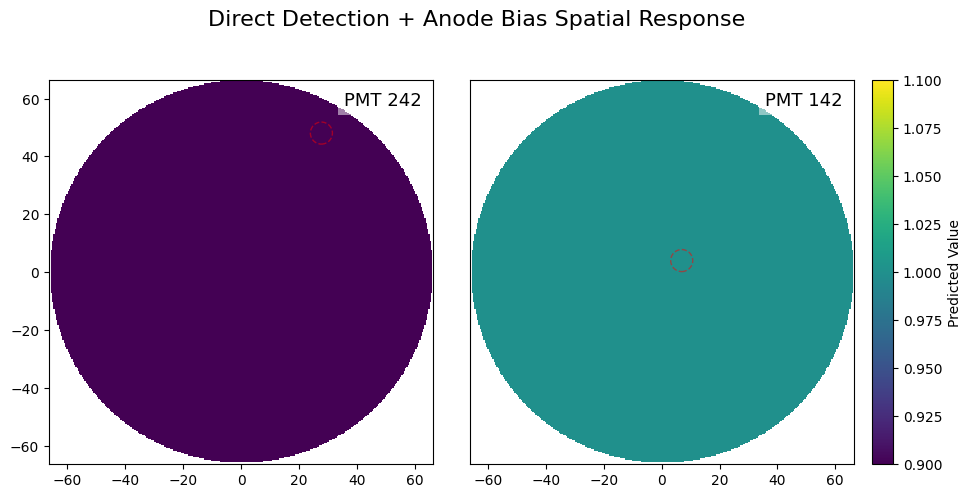

In [96]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

grid = np.linspace(-66.4, 66.4, 300)
pmt_nrs = [242, 142]
pmt_indices = [np.argwhere(np.array(not_dead_pmts) == nr) for nr in pmt_nrs]

X, Y = np.meshgrid(grid, grid)
pos_grid = np.stack([X.flatten(), Y.flatten()], axis=-1)

fig = plt.figure(figsize=(10, 5))
fig.suptitle('Modulation component', fontsize=16)
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.05], wspace=0)

vmin, vmax = None, None
all_predictions = []
for idx, pmt_nr in zip(pmt_indices, pmt_nrs):
    preds = model.get_layer("PatternAdjuster")(pos_grid)# * model.get_layer("PMTDistance_Pattern_Response")(pos_grid)
    preds = preds.numpy()[:, idx].reshape(300, 300)
    preds[np.linalg.norm(pos_grid, axis=-1).reshape(300, 300) > 66.4] = np.nan
    all_predictions.append(preds)

vmin = np.nanmin([np.nanmin(p) for p in all_predictions])
vmax = np.nanmax([np.nanmax(p) for p in all_predictions])

for i, (predictions, pmt_nr) in enumerate(zip(all_predictions, pmt_nrs)):
    ax = plt.subplot(gs[i])
    im = ax.imshow(predictions, extent=(-66.4, 66.4, -66.4, 66.4), origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
    circle = plt.Circle(pmt_pos_top[pmt_nr], 7.62/2, color='r', fill=False, linestyle='--', alpha=0.5)
    ax.text(0.97, 0.97, f'PMT {pmt_nr}', transform=ax.transAxes, ha='right', va='top', fontsize=13, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
    ax.add_artist(circle)
    if i == 1:
        ax.get_yaxis().set_visible(False)

cax = plt.subplot(gs[2])
plt.colorbar(im, cax=cax, label='Predicted Value')

plt.tight_layout(rect=[0, 0, 1, 0.95], h_pad=0) 
plt.show()


In [89]:
# rsidual layer did not fit so just on normal data
# Get model with anodeshadowing bias
pos = np.load(os.path.join(pos_refit_path, "iterative_grid_search_shadowingBias_0.npz"))['arr_0']
model = gen_model(seed=0, starting_model=None, 
                 include_wall = True, include_perp = True, include_anode = False, anode_no_angle= True,
                 multiplication_layers=True, radialLCE=False, monodense=True, large_direct=True, biased_layer=False)
load_weights_from_dict(model,os.path.join(model_path, "Final_weights_0.json") )

model.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
model.get_layer('LossLayer').trainable = True
model.get_layer("Wall_Reflection_Pattern_Response").get_layer("Event_Wall_distance").set_mode('optimize', tol=1e-2, max_iter = 100)

pre_bias = keras.Model(inputs=model.get_layer('xy').input, outputs=model.get_layer("normalization").output)

pre_bias.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))
comp_patterns = pre_bias.predict({'xy':pos[::]},)


residual_no_norm = ((patterns_real/np.sum(patterns_real, axis=-1, keepdims=True)) / comp_patterns )


56191/56191 [==============================] - 450s 8ms/step


In [176]:
residual_subtract = np.abs(patterns_real/np.sum(patterns_real, axis=-1, keepdims=True) - comp_patterns)
np.median(residual_subtract), np.max(residual_subtract)

(0.00044200523, 0.10892849)

In [187]:
comp = np.abs(patterns_real/np.sum(patterns_real, axis=-1, keepdims=True)- comp_patterns)/np.maximum(np.abs(patterns_real/np.sum(patterns_real, axis=-1, keepdims=True)), 1e-10)
np.median(comp)

0.31055084

19.324699592590335 91.5891004562378
85.72469959259034 119.627250289917
50.54410095214844 47.21910018920899
110.00645027160645 15.175450515747073


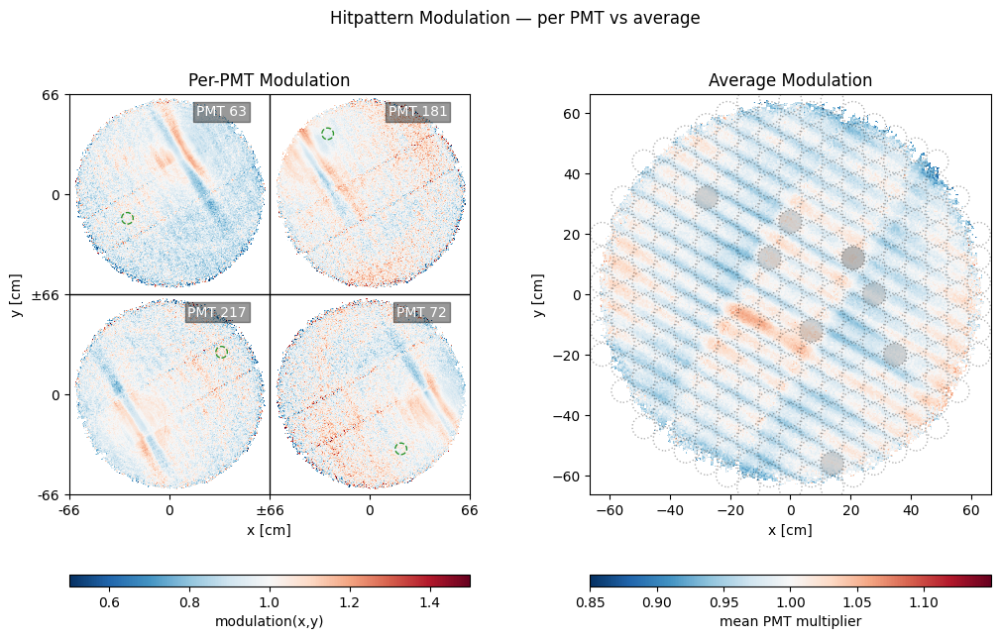

In [102]:
# Teh transpositions are really annoying to deal with - PLOT LABELS WRONG

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, TwoSlopeNorm
from matplotlib.patches import Circle
from scipy.stats import binned_statistic_2d

radius = 66.4

# — assume you already have:
#    pos_cnf: (N_events,2) array of x,y
#    residual_no_norm: (N_events, n_pmts) array
#    grid_N, radius, chs defined as before

grid_N = 300  # adjust for finer/coarser grid
# 1) define your bin edges
r = radius
x_edges = np.linspace(-radius, radius, grid_N+1)
y_edges = np.linspace(-radius, radius, grid_N+1)

# 2) compute 2D binned means for each selected channel
stats = []
chs = [62,173, 209, 71] 

for ch in chs:
    x = pos[:,0]
    y = pos[:,1]
    vals = residual_no_norm[:, np.argwhere(np.array(not_dead_pmts) == ch)[0][0]]
    
    # mean‐bin each cell
    stat, xe, ye, _ = binned_statistic_2d(
        x, y, vals,
        statistic='mean',
        bins=[x_edges, y_edges]
    )
    # stat.shape == (grid_N, grid_N), but X runs along axis‐0, Y along axis‐1,
    # so for imshow we want stat.T
    M = stat.copy()
    
    # mask outside the circle
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    Xc, Yc    = np.meshgrid(x_centers, y_centers, indexing='xy')
    M[(Xc**2 + Yc**2) > radius**2] = np.nan
    
    stats.append(M.T)

# now stats = [M00, M01, M10, M11] exactly as before,
# and you can stitch & plot just like your model‐output version:

M00, M01, M10, M11 = stats
big = np.block([[M00[::1,::1], M01[::1,::1]],
                [M10[::1,::1], M11[::1,::1]]])

# … then run your existing imshow/grid/ticks/cbar code …
# 2) lay out a 1×2 grid of Axes + two cbar slots underneath
fig = plt.figure(figsize=(12,6), constrained_layout=False)
# width_ratios 2:1 so left is twice as wide as right; height_ratios 1:0.1 for maps vs cbars
gs = fig.add_gridspec(
    3, 2,
    width_ratios =[2, 2],
    height_ratios=[0.07, 2, 0.05],
    hspace=0.3, wspace=0.3,
    bottom=0.01,   # leave space for xlabel/ticks
    top=1      # leave space for suptitle
)

ax0 = fig.add_subplot(gs[1, 0])  # stitched per-PMT
ax1 = fig.add_subplot(gs[1, 1])  # average, sharey=ax0
cax0 = fig.add_subplot(gs[2, 0])  # cbar for ax0
cax1 = fig.add_subplot(gs[2, 1])  # cbar for ax1

# MODIFIED: Create divergent colormap centered at 1
all_vals = np.hstack([M.ravel() for M in stats])
all_vals = all_vals[np.isfinite(all_vals)]

# Option 1: Use percentiles but ensure center is at 1
frac = 99.7
p_lo, p_hi = np.nanpercentile(all_vals, [(100-frac)/2, 100-(100-frac)/2])

# Create symmetric range around 1
center = 1.0
max_deviation = 0.5
vmin = center - max_deviation
vmax = center + max_deviation

# Use TwoSlopeNorm for divergent colormap centered at 1
norm = TwoSlopeNorm(vmin=vmin, vcenter=center, vmax=vmax)

# Alternative approach if you want to use specific bounds:
# norm = TwoSlopeNorm(vmin=p_lo, vcenter=1.0, vmax=p_hi)

del all_vals

# MODIFIED: Use divergent colormap (RdBu_r is good for data centered around a value)
im0 = ax0.imshow(
    big.T,
    origin='lower',
    extent=[0, 2*r, 0, 2*r],
    cmap='RdBu_r',  # Red-Blue divergent, reversed so blue=high, red=low
    norm=norm,
    aspect='equal',
)

# draw grid lines at r
ax0.axvline(r, color='k', lw=1)
ax0.axhline(r, color='k', lw=1)

# custom ticks so each quadrant reads [-r,0,r]
ticks = [0, r/2, r, 3*r/2, 2*r,]
labels = [f"{-r:.0f}", "0", f"$\pm${r:.0f}",  "0", f"{r:.0f}"]
ax0.set_xticks(ticks)
ax0.set_xticklabels(labels)
ax0.set_yticks(ticks)
ax0.set_yticklabels(labels)
ax0.set_xlabel('x [cm]')
ax0.set_ylabel('y [cm]')
ax0.set_title('Per-PMT Modulation')

stat, xe, ye, _ = binned_statistic_2d(
        pos[:,0], pos[:,1], np.nanmean(residual_no_norm, axis=1),
        statistic='mean',
        bins=[x_edges, y_edges]
    )

center = 1.0
max_deviation = 0.15
vmin = center - max_deviation
vmax = center + max_deviation

# Use TwoSlopeNorm for divergent colormap centered at 1
norm = TwoSlopeNorm(vmin=vmin, vcenter=center, vmax=vmax)

# MODIFIED: Apply same normalization to the average plot
im1 = ax1.imshow(
    stat.T,
    origin='lower',
    extent=[-r, r, -r, r],
    cmap='RdBu_r',  # Same divergent colormap
    norm=norm,      # Same normalization
    aspect='equal'
)
ax1.set_xlabel('x [cm]')
ax1.set_ylabel('y [cm]')
ax1.set_title('Average Modulation')

# 5) two aligned colorbars
fig.colorbar(im0, cax=cax0, orientation='horizontal',
             label='modulation(x,y)')
fig.colorbar(im1, cax=cax1, orientation='horizontal',
             label='mean PMT multiplier')

quad_locs = [
    (0.25+0.13, 0.75),  # top‐left
    (0.75+0.12, 0.75),  # top‐right
    (0.25+0.12, 0.25),  # bottom‐left
    (0.75+0.13, 0.25),  # bottom‐right
]
quadrant_offsets = [
    (0, radius),      # top-left: (0, r) to (r, 2r)
    (radius, radius),      # top-right: (r, r) to (2r, 2r)  
    (0, 0),      # bottom-left: (0, 0) to (r, r)
    (radius, 0),      # bottom-right: (r, 0) to (2r, r)
]
for i, ch in enumerate(chs):
    # Get the PMT position in original coordinates
    pmt_x = pmt_pos_top[not_dead_pmts[ch], -2]  # x coordinate
    pmt_y = pmt_pos_top[not_dead_pmts[ch], -1]  # y coordinate
    
    # Transform to the shifted coordinate system for this quadrant
    offset_x, offset_y = quadrant_offsets[i]
    quadrant_center_x = offset_x + radius/2
    quadrant_center_y = offset_y + radius/2

    shifted_x = quadrant_center_x + pmt_x  /2
    shifted_y = quadrant_center_y + pmt_y  /2
    print(shifted_x, shifted_y)
    
    # Create circle with appropriate radius (you may need to adjust this)
    circle_radius = 2.0  # Adjust this value based on your PMT size
    circle = plt.Circle((shifted_x, shifted_y), 3  * 2.54 / 4, 
                       color='green', fill=False, alpha=0.8, linestyle='--')
    ax0.add_artist(circle)


for (fx, fy), ch in zip(quad_locs, chs):
    ax0.text(
        fx, fy+0.205,
        f"PMT {not_dead_pmts[ch]}",
        transform = ax0.transAxes,
        ha="center", va="center",
        color="white", fontsize=10,
        bbox=dict(facecolor="black", alpha=0.4, pad=2)
    )

plot_pmt_circles(ax1, pmt_pos_top, dead_pmts+missing_dead_og_indx, alpha=0.3, linestyle=':')
#plot_pmt_indeces(pmt_pos_top[not_dead_pmts], ax1, fontsize=5)
# 6) super‐title
fig.suptitle("Hitpattern Modulation — per PMT vs average")
plt.show()

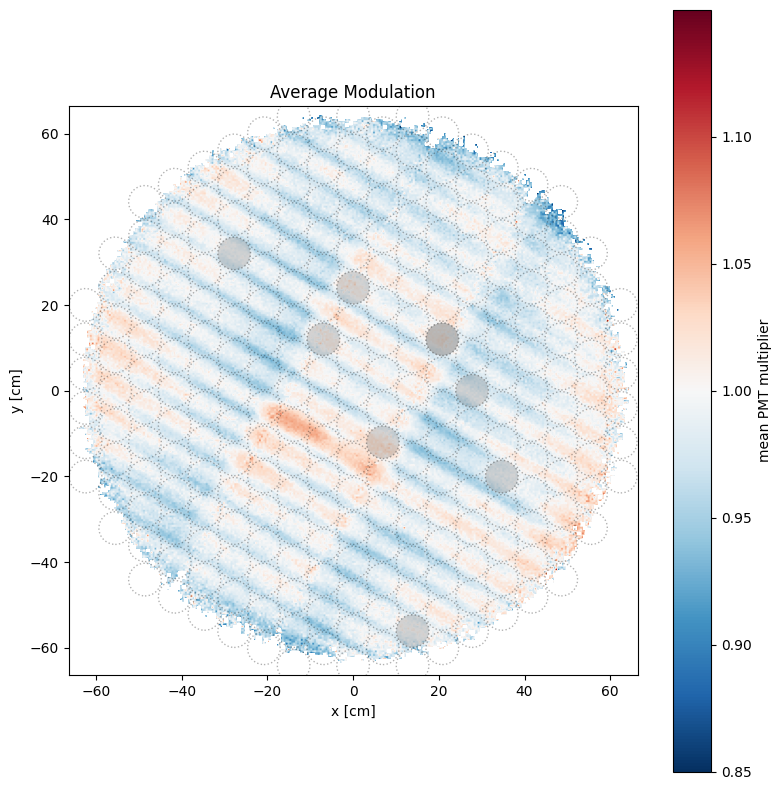

In [104]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from scipy.stats import binned_statistic_2d

radius = 66.4
grid_N = 300

# Define bin edges
x_edges = np.linspace(-radius, radius, grid_N+1)
y_edges = np.linspace(-radius, radius, grid_N+1)

# Calculate average modulation across all PMTs
stat, xe, ye, _ = binned_statistic_2d(
    pos[:,0], pos[:,1], np.nanmean(residual_no_norm, axis=1),
    statistic='mean',
    bins=[x_edges, y_edges]
)

# Set up divergent colormap centered at 1
center = 1.0
max_deviation = 0.15
vmin = center - max_deviation
vmax = center + max_deviation

# Use TwoSlopeNorm for divergent colormap centered at 1
norm = TwoSlopeNorm(vmin=vmin, vcenter=center, vmax=vmax)

# Create single plot
fig, ax = plt.subplots(figsize=(8, 8))

# Plot the average modulation
im = ax.imshow(
    stat.T,
    origin='lower',
    extent=[-radius, radius, -radius, radius],
    cmap='RdBu_r',
    norm=norm,
    aspect='equal'
)

# Add labels and title
ax.set_xlabel('x [cm]')
ax.set_ylabel('y [cm]')
ax.set_title('Average Modulation')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, label='mean PMT multiplier')

# Add PMT circles (if you have the plot_pmt_circles function)
plot_pmt_circles(ax, pmt_pos_top, dead_pmts+missing_dead_og_indx, alpha=0.3, linestyle=':')

plt.tight_layout()
plt.show()

/tmp/ipykernel_459/308797796.py:116: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


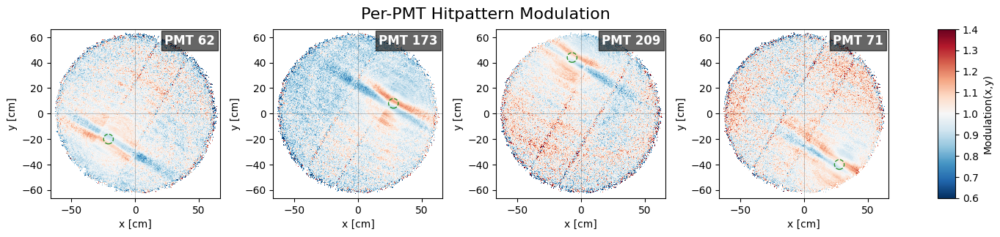

In [105]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, TwoSlopeNorm
from matplotlib.patches import Circle
from scipy.stats import binned_statistic_2d

radius = 66.4

# — assume you already have:
#    pos_cnf: (N_events,2) array of x,y
#    residual_no_norm: (N_events, n_pmts) array
#    grid_N, radius, chs defined as before

grid_N = 300  # adjust for finer/coarser grid
# 1) define your bin edges
r = radius
x_edges = np.linspace(-radius, radius, grid_N+1)
y_edges = np.linspace(-radius, radius, grid_N+1)

# 2) compute 2D binned means for each selected channel
stats = []
chs = [62, 173, 209, 71] 

for ch in chs:
    x = pos[:,0]
    y = pos[:,1]
    vals = residual_no_norm[:, np.argwhere(np.array(not_dead_pmts) == ch)[0][0]]
    
    # mean‐bin each cell
    stat, xe, ye, _ = binned_statistic_2d(
        x, y, vals,
        statistic='mean',
        bins=[x_edges, y_edges]
    )
    # stat.shape == (grid_N, grid_N), but X runs along axis‐0, Y along axis‐1,
    # so for imshow we want stat.T
    M = stat.copy()
    
    # mask outside the circle
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    Xc, Yc    = np.meshgrid(x_centers, y_centers, indexing='xy')
    M[(Xc**2 + Yc**2) > radius**2] = np.nan
    
    stats.append(M.T)

# Create 1x4 subplot layout with colorbar
fig = plt.figure(figsize=(16, 3
                          ))
gs = fig.add_gridspec(1, 5, width_ratios=[1, 1, 1, 1, 0.1], hspace=0.3, wspace=0.3)

# Create 4 subplots in a row
axes = [fig.add_subplot(gs[0, i]) for i in range(4)]
cax = fig.add_subplot(gs[0, 4])  # colorbar axis

# Set up colormap normalization
all_vals = np.hstack([M.ravel() for M in stats])
all_vals = all_vals[np.isfinite(all_vals)]

# Create symmetric range around 1
center = 1.0
max_deviation = 0.4
vmin = center - max_deviation
vmax = center + max_deviation

# Use TwoSlopeNorm for divergent colormap centered at 1
norm = TwoSlopeNorm(vmin=vmin, vcenter=center, vmax=vmax)
del all_vals

# Plot each PMT in its own subplot
for i, (ax, ch, M) in enumerate(zip(axes, chs, stats)):
    
    # Plot the data
    im = ax.imshow(
        M,
        origin='lower',
        extent=[-r, r, -r, r],
        cmap='RdBu_r',
        norm=norm,
        aspect='equal'
    )
    
    # Add PMT circle at correct position
    pmt_x = pmt_pos_top[ch, -2]  # x coordinate
    pmt_y = pmt_pos_top[ch, -1]  # y coordinate
    
    circle = plt.Circle((pmt_x, pmt_y), 3 * 2.54 / 2, 
                       color='green', fill=False, alpha=0.8, linestyle='--')
    ax.add_artist(circle)
    
    # Add PMT number label in top right corner
    ax.text(
        0.97, 0.97,
        f"PMT {ch}",
        transform=ax.transAxes,
        ha="right", va="top",
        color="white", fontsize=12, fontweight='bold',
        bbox=dict(facecolor="black", alpha=0.6, pad=3)
    )
    
    # Set labels and title
    ax.set_xlabel('x [cm]')
    ax.set_ylabel('y [cm]')
    
    # Add grid lines at zero
    ax.axhline(0, color='k', lw=0.5, alpha=0.3)
    ax.axvline(0, color='k', lw=0.5, alpha=0.3)

# Add vertical colorbar on the right
cbar = fig.colorbar(im, cax=cax, orientation='vertical')
cbar.set_label('Modulation(x,y)')

# Add overall title
fig.suptitle("Per-PMT Hitpattern Modulation", fontsize=16)

plt.tight_layout()
plt.show()

/tmp/ipykernel_459/1414599794.py:122: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


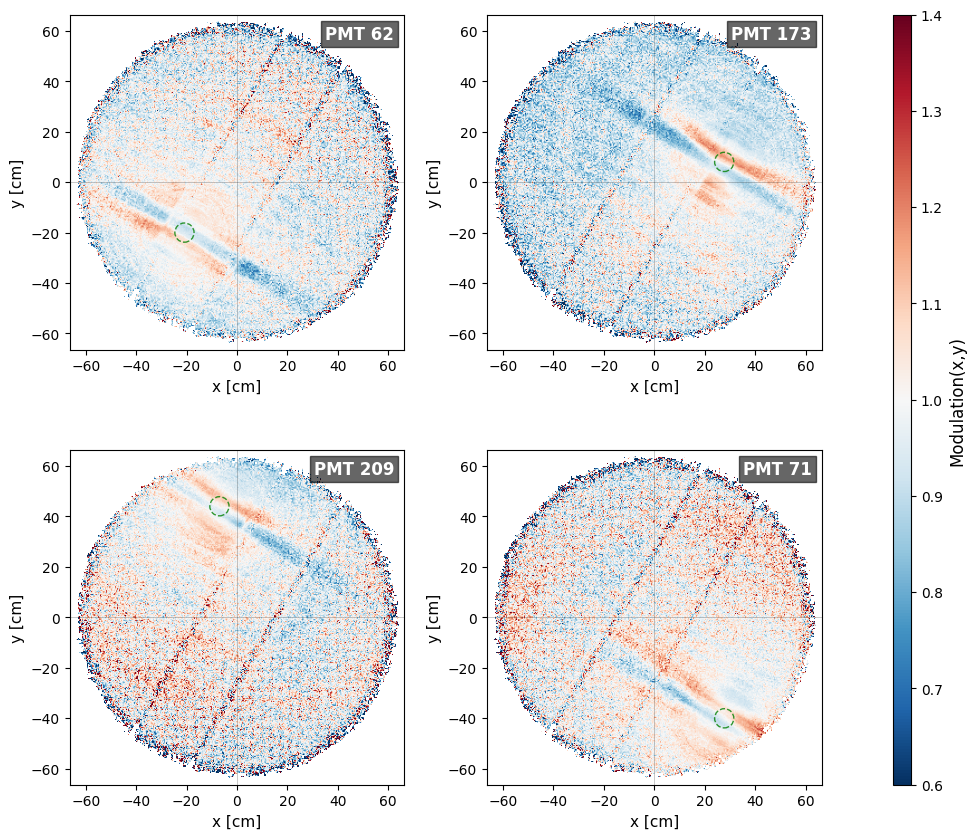

In [108]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, TwoSlopeNorm
from matplotlib.patches import Circle
from scipy.stats import binned_statistic_2d

radius = 66.4
# — assume you already have:
# pos_cnf: (N_events,2) array of x,y
# residual_no_norm: (N_events, n_pmts) array
# grid_N, radius, chs defined as before

grid_N = 300  # adjust for finer/coarser grid

# 1) define your bin edges
r = radius
x_edges = np.linspace(-radius, radius, grid_N+1)
y_edges = np.linspace(-radius, radius, grid_N+1)

# 2) compute 2D binned means for each selected channel
stats = []
chs = [62, 173, 209, 71]

for ch in chs:
    x = pos[:,0]
    y = pos[:,1]
    vals = residual_no_norm[:, np.argwhere(np.array(not_dead_pmts) == ch)[0][0]]
    
    # mean-bin each cell
    stat, xe, ye, _ = binned_statistic_2d(
        x, y, vals,
        statistic='mean',
        bins=[x_edges, y_edges]
    )
    
    # stat.shape == (grid_N, grid_N), but X runs along axis-0, Y along axis-1,
    # so for imshow we want stat.T
    M = stat.copy()
    
    # mask outside the circle
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    Xc, Yc = np.meshgrid(x_centers, y_centers, indexing='xy')
    M[(Xc**2 + Yc**2) > radius**2] = np.nan
    stats.append(M.T)

# Create 2x2 subplot layout with colorbar
fig = plt.figure(figsize=(11, 10))
gs = fig.add_gridspec(2, 3, width_ratios=[1, 1, 0.05], hspace=0.3, wspace=0.25)

# Create 4 subplots in 2x2 grid
axes = [
    fig.add_subplot(gs[0, 0]),  # top-left
    fig.add_subplot(gs[0, 1]),  # top-right
    fig.add_subplot(gs[1, 0]),  # bottom-left
    fig.add_subplot(gs[1, 1])   # bottom-right
]

# Colorbar spans both rows on the right
cax = fig.add_subplot(gs[:, 2])  # colorbar axis spanning both rows

# Set up colormap normalization
all_vals = np.hstack([M.ravel() for M in stats])
all_vals = all_vals[np.isfinite(all_vals)]

# Create symmetric range around 1
center = 1.0
max_deviation = 0.4
vmin = center - max_deviation
vmax = center + max_deviation

# Use TwoSlopeNorm for divergent colormap centered at 1
norm = TwoSlopeNorm(vmin=vmin, vcenter=center, vmax=vmax)
del all_vals

# Plot each PMT in its own subplot
for i, (ax, ch, M) in enumerate(zip(axes, chs, stats)):
    # Plot the data
    im = ax.imshow(
        M,
        origin='lower',
        extent=[-r, r, -r, r],
        cmap='RdBu_r',
        norm=norm,
        aspect='equal'
    )
    
    # Add PMT circle at correct position
    pmt_x = pmt_pos_top[ch, -2]  # x coordinate
    pmt_y = pmt_pos_top[ch, -1]  # y coordinate
    circle = plt.Circle((pmt_x, pmt_y), 3 * 2.54 / 2,
                       color='green', fill=False, alpha=0.8, linestyle='--')
    ax.add_artist(circle)
    
    # Add PMT number label in top right corner
    ax.text(
        0.97, 0.97,
        f"PMT {ch}",
        transform=ax.transAxes,
        ha="right", va="top",
        color="white", fontsize=12, fontweight='bold',
        bbox=dict(facecolor="black", alpha=0.6, pad=3)
    )
    
    # Set labels and title
    ax.set_xlabel('x [cm]', fontsize=11)
    ax.set_ylabel('y [cm]', fontsize=11)
    
    # Add grid lines at zero
    ax.axhline(0, color='k', lw=0.5, alpha=0.3)
    ax.axvline(0, color='k', lw=0.5, alpha=0.3)
    
    # Set tick label size
    ax.tick_params(labelsize=10)

# Add vertical colorbar on the right
cbar = fig.colorbar(im, cax=cax, orientation='vertical')
cbar.set_label('Modulation(x,y)', fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Add overall title
plt.tight_layout()
plt.show()

In [173]:
# Evaluate the new baseline - MC
with open(os.path.join(model_path, "Final_weights_0.json")) as f:
    weights = json.load(f)

std = np.array(weights['LossLayer/GaussianStandardDeviation:0'] )
p_dpe = 0.2
std_gauss = 0.5
def gen_signal(expectation):
    # Poisson
    signal = np.random.poisson(expectation, size=expectation.shape)
    # Binom
    signal += np.random.binomial(n=signal, p=p_dpe, size=expectation.shape)
    # Add noise to signal
    scales = std[np.newaxis, :] * np.sqrt(signal)
    signal = np.random.normal(loc=signal, scale=scales, size=signal.shape)
    return signal

n_events = 10_000
theta = np.random.uniform(0, 2*np.pi, size=(n_events,))
r = np.sqrt(np.random.uniform(0, 1, size=(n_events,))) * 66.4
pos_sim = np.column_stack((r * np.cos(theta), r * np.sin(theta)))
split = 0.7
ns = np.arange(n_events)
np.random.shuffle(ns)
train_split_sim = ns[:int(split*n_events)]
val_split_sim = ns[int(split*n_events):]

expected_tot_photons = np.random.normal(loc=5_000, scale=950, size=(n_events,))

patterns_sim = make_mcMap_model().predict(pos_sim)
patterns_sim = patterns_sim / patterns_sim.sum(axis=-1,keepdims = True) 
patterns_obs = patterns_sim * expected_tot_photons.reshape(-1, 1)
# Add the noise component
patterns_obs = gen_signal(patterns_obs)

313/313 [==============================] - 1s 2ms/step


In [174]:
loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=10, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=10, # x & mu integer subdivisions
                                    name="LossLayer")
loss_layer.set_call_mode("LUT_untrainable_std", return_ratio = True)
input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = loss_layer(input_pattern1, input_pattern2)
loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))
loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
loss_LUT = loss_model.predict({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]},)
print("LUT",np.mean(loss_LUT))
print("LUT median", np.median(np.mean(loss_LUT, axis=-1)))

94/94 [==============================] - 0s 1ms/step
LUT 1.2683524
LUT median 1.2679732


In [18]:
"""

Now we compute a generic Dense Model to compute this - Same as the CNN 

"""
# best positions see plots and tables at end of section 
pos = np.load(os.path.join(pos_refit_path, "iterative_encoder_search_0.npz"))['arr_0']

fin_model = gen_mod_Shenayang()
optimizer = tfa.optimizers.LAMB(learning_rate=1e-3)
fin_model.get_layer("LossLayer").set_call_mode("exact", return_ratio = False)
fin_model.get_layer("LossLayer").trainable = True
fin_model.compile(optimizer=optimizer)
fin_model.fit({'xy': pos[train_split], 'pattern': patterns_real[train_split]},
              None,
              validation_data = ({'xy': pos[val_split], 'pattern': patterns_real[val_split]}, None),
              epochs=10, batch_size=2**8,
              verbose=1)
save_weights_to_dict(fin_model, os.path.join(model_path, 'FinalModelShenyang.json'))

Epoch 1/10
4917/4917 [==============================] - 2157s 439ms/step - loss: 2.0022 - val_loss: 1.9407
Epoch 2/10
4917/4917 [==============================] - 2136s 435ms/step - loss: 1.9315 - val_loss: 1.9301
Epoch 3/10
4917/4917 [==============================] - 2148s 437ms/step - loss: 1.9252 - val_loss: 1.9252
Epoch 4/10
4917/4917 [==============================] - 2148s 437ms/step - loss: 1.9231 - val_loss: 1.9258
Epoch 5/10
4917/4917 [==============================] - ETA: 0s - loss: 1.9222

KeyboardInterrupt: 

In [22]:
"""

And lower learning rate

"""
# best positions see plots and tables at end of section 
pos = np.load(os.path.join(pos_refit_path, "iterative_encoder_search_0.npz"))['arr_0']

fin_model = gen_mod_Shenayang()
fin_model.get_layer("LossLayer").set_call_mode("exact", return_ratio = False)
fin_model.get_layer("LossLayer").trainable = True
load_weights_from_dict(fin_model, os.path.join(model_path, 'FinalModelShenyang.json'))

optimizer = tfa.optimizers.LAMB(learning_rate=1e-4)

fin_model.compile(optimizer=optimizer)
fin_model.fit({'xy': pos[train_split], 'pattern': patterns_real[train_split]},
              None,
              validation_data = ({'xy': pos[val_split], 'pattern': patterns_real[val_split]}, None),
              epochs=2, batch_size=2**8,
              verbose=1)
save_weights_to_dict(fin_model, os.path.join(model_path, 'FinalModelShenyang2.json'))

optimizer.learning_rate.assign(1e-5)

fin_model.compile(optimizer=optimizer)
fin_model.fit({'xy': pos[train_split], 'pattern': patterns_real[train_split]},
              None,
              validation_data = ({'xy': pos[val_split], 'pattern': patterns_real[val_split]}, None),
              epochs=1, batch_size=2**8,
              verbose=1)
save_weights_to_dict(fin_model, os.path.join(model_path, 'FinalModelShenyang3.json'))

Epoch 1/2
4917/4917 [==============================] - 2136s 434ms/step - loss: 1.9190 - val_loss: 1.9198
Epoch 2/2
4917/4917 [==============================] - 2194s 446ms/step - loss: 1.9186 - val_loss: 1.9194


In [20]:
# Evaluate Loss of Refit 
pos = np.load(os.path.join(pos_refit_path, "iterative_encoder_search_0.npz"))['arr_0']
fin_model = gen_mod_Shenayang()
fin_model.get_layer("LossLayer").set_call_mode("LUT_untrainable_std", return_ratio = True)
fin_model.get_layer("LossLayer").trainable = True
load_weights_from_dict(fin_model, os.path.join(model_path, 'FinalModelShenyang3.json'))

optimizer = tfa.optimizers.LAMB(learning_rate=1e-3)
fin_model.compile(optimizer=optimizer)

res = fin_model.predict({'xy':pos_cnf, 'pattern':patterns_real})
print('OG Pos: ', np.mean(res))
bmask = (np.linalg.norm(pos, axis= -1) < 66.4 )
res = fin_model.predict({'xy':pos[bmask], 'pattern':patterns_real[bmask]})
print('Train Pos: ', np.mean(res))


56191/56191 [==============================] - 168s 3ms/step
OG Pos:  1.2980119
56191/56191 [==============================] - 167s 3ms/step
Train Pos:  1.2801956


In [16]:
# Evalaute the baseline loss expected for the final variance distribution 
with open(os.path.join(model_path, "FinalModelShenyang3.json")) as f:
    weights = json.load(f)

std = np.array(weights['LossLayer/GaussianStandardDeviation:0'] )
p_dpe = 0.2
def gen_signal(expectation):
    # Poisson
    signal = np.random.poisson(expectation, size=expectation.shape)
    # Binom
    signal += np.random.binomial(n=signal, p=p_dpe, size=expectation.shape)
    # Add noise to signal
    scales = std[np.newaxis, :] * np.sqrt(signal)
    signal = np.random.normal(loc=signal, scale=scales, size=signal.shape)
    return signal

n_events = 10_000
theta = np.random.uniform(0, 2*np.pi, size=(n_events,))
r = np.sqrt(np.random.uniform(0, 1, size=(n_events,))) * 66.4
pos_sim = np.column_stack((r * np.cos(theta), r * np.sin(theta)))
split = 0.7
ns = np.arange(n_events)
np.random.shuffle(ns)
train_split_sim = ns[:int(split*n_events)]
val_split_sim = ns[int(split*n_events):]

expected_tot_photons = np.random.normal(loc=5_000, scale=950, size=(n_events,))

patterns_sim = make_mcMap_model().predict(pos_sim)
patterns_sim = patterns_sim / patterns_sim.sum(axis=-1,keepdims = True) 
patterns_obs = patterns_sim * expected_tot_photons.reshape(-1, 1)
# Add the noise component
patterns_obs = gen_signal(patterns_obs)
loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=10, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=10, # x & mu integer subdivisions
                                    name="LossLayer")
loss_layer.set_call_mode("LUT_untrainable_std", return_ratio = True)
input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = loss_layer(input_pattern1, input_pattern2)
loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))
loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
loss_LUT = loss_model.predict({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]},)
print("LUT",np.mean(loss_LUT))
print("LUT median", np.median(np.mean(loss_LUT, axis=-1)))

94/94 [==============================] - 0s 1ms/step
LUT 1.2321701
LUT median 1.2285469


In [21]:
# Also trial with fixed variances

with open(os.path.join(model_path, 'Final_weights_0.json')) as f:
    std =  np.array(json.load(f)['LossLayer/GaussianStandardDeviation:0'])

pos = np.load(os.path.join(pos_refit_path, "iterative_encoder_search_0.npz"))['arr_0']

input_pattern = tf.keras.layers.Input(shape=(245,), name='pattern', dtype=tf.float32)
input_x = tf.keras.layers.Input(shape=(2,), name='xy', dtype=tf.float32)

x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
x = AdvCoordTransform(pmt_positions=pmt_pos_top[not_dead_pmts], tpc_r=66.4)(x)

# — Replace each Conv1D(kernel_size=1) with a Dense applied per timestep —
x = tf.keras.layers.Dense(96, activation='relu', name='dense_0')(x)
x = tf.keras.layers.Dense(48, activation='relu', name='dense_1')(x)
x = tf.keras.layers.Dense(24, activation='relu', name='dense_2')(x)
x = tf.keras.layers.Dense(12, activation='relu', name='dense_3')(x)
x = tf.keras.layers.Dense(1,  activation='sigmoid', name='dense_4')(x)

x = tf.keras.layers.Flatten(name='flatten')(x)
x = I0Layer(245, name='i0')(x)
pattern = NormalizationLayer(name='normalization')(x)

loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.05, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=20, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=5, # x & mu integer subdivisions
                                    name="LossLayer",
                                    mle_estimator=None)
loss_layer.set_call_mode("exact", return_ratio = False)
res = loss_layer(pattern,input_pattern)

fin_model = keras.Model(inputs=[input_x, input_pattern], outputs = res)

# We start of with this one 
load_weights_from_dict(fin_model, os.path.join(model_path, "FinalModel3.json"))
fin_model.get_layer('LossLayer').std.assign(std)
fin_model.get_layer('LossLayer').trainable = False

def scheduler(epoch, lr):
    return 0.001 * 0.1**(epoch // 2)

lr_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)

fin_model.compile(tfa.optimizers.LAMB(1e-3))

fin_model.fit({'xy': pos[train_split], 'pattern': patterns_real[train_split]},
              None,
              validation_data = ({'xy': pos[val_split], 'pattern': patterns_real[val_split]}, None),
              epochs=3, batch_size=2**8,
              verbose=1)

save_weights_to_dict(fin_model, os.path.join(model_path, "FinalModelFixedVar.json"))


Epoch 1/3
4917/4917 [==============================] - 1663s 338ms/step - loss: 1.9174 - val_loss: 1.9183
Epoch 2/3
4917/4917 [==============================] - 1694s 345ms/step - loss: 1.9175 - val_loss: 1.9179
Epoch 3/3
4917/4917 [==============================] - 1698s 345ms/step - loss: 1.9178 - val_loss: 1.9183


FileNotFoundError: [Errno 2] No such file or directory: '/Code/ActualThesisWork/models/FinalModelFixedVar.json'

In [26]:
# Evaluate Loss of Refit 
pos = np.load(os.path.join(pos_refit_path, "iterative_encoder_search_0.npz"))['arr_0']

input_pattern = tf.keras.layers.Input(shape=(245,), name='pattern', dtype=tf.float32)
input_x = tf.keras.layers.Input(shape=(2,), name='xy', dtype=tf.float32)

x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
x = AdvCoordTransform(pmt_positions=pmt_pos_top[not_dead_pmts], tpc_r=66.4)(x)

# — Replace each Conv1D(kernel_size=1) with a Dense applied per timestep —
x = tf.keras.layers.Dense(96, activation='relu', name='dense_0')(x)
x = tf.keras.layers.Dense(48, activation='relu', name='dense_1')(x)
x = tf.keras.layers.Dense(24, activation='relu', name='dense_2')(x)
x = tf.keras.layers.Dense(12, activation='relu', name='dense_3')(x)
x = tf.keras.layers.Dense(1,  activation='sigmoid', name='dense_4')(x)

x = tf.keras.layers.Flatten(name='flatten')(x)
x = I0Layer(245, name='i0')(x)
pattern = NormalizationLayer(name='normalization')(x)

loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.05, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=20, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=5, # x & mu integer subdivisions
                                    name="LossLayer",
                                    mle_estimator=None)
loss_layer.set_call_mode("LUT_untrainable_std", return_ratio = True)
res = loss_layer(pattern,input_pattern)

fin_model = keras.Model(inputs=[input_x, input_pattern], outputs = res)
optimizer = tfa.optimizers.LAMB(learning_rate=1e-3)
load_weights_from_dict(fin_model, os.path.join(model_path, "FinalModelFixedVar.json"))
fin_model.compile(optimizer=optimizer)

res = fin_model.predict({'xy':pos_cnf, 'pattern':patterns_real})
print('OG Pos: ', np.mean(res))
res = fin_model.predict({'xy':pos, 'pattern':patterns_real})
print('Train Pos: ', np.mean(res))


56191/56191 [==============================] - 142s 3ms/step
OG Pos:  1.2884425
56191/56191 [==============================] - 139s 2ms/step
Train Pos:  1.2698737


In [23]:
# Residual Plot 
pos = np.load(os.path.join(pos_refit_path, "iterative_encoder_search_0.npz"))['arr_0']

input_pattern = tf.keras.layers.Input(shape=(245,), name='pattern', dtype=tf.float32)
input_x = tf.keras.layers.Input(shape=(2,), name='xy', dtype=tf.float32)

x = tf.keras.layers.RepeatVector(n_alive_pmts, name='repeat_vector')(input_x)
x = AdvCoordTransform(pmt_positions=pmt_pos_top[not_dead_pmts], tpc_r=66.4)(x)

# — Replace each Conv1D(kernel_size=1) with a Dense applied per timestep —
x = tf.keras.layers.Dense(96, activation='relu', name='dense_0')(x)
x = tf.keras.layers.Dense(48, activation='relu', name='dense_1')(x)
x = tf.keras.layers.Dense(24, activation='relu', name='dense_2')(x)
x = tf.keras.layers.Dense(12, activation='relu', name='dense_3')(x)
x = tf.keras.layers.Dense(1,  activation='sigmoid', name='dense_4')(x)

x = tf.keras.layers.Flatten(name='flatten')(x)
x = I0Layer(245, name='i0')(x)
pattern = NormalizationLayer(name='normalization')(x)

loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.05, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=20, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=5, # x & mu integer subdivisions
                                    name="LossLayer",
                                    mle_estimator=None)
loss_layer.set_call_mode("LUT_untrainable_std", return_ratio = True)
res = loss_layer(pattern,input_pattern)

fin_model = keras.Model(inputs=[input_x, input_pattern], outputs = res)
optimizer = tfa.optimizers.LAMB(learning_rate=1e-3)
load_weights_from_dict(fin_model, os.path.join(model_path, "FinalModelFixedVar.json"))
fin_model.compile(optimizer=optimizer)

In [24]:
# rsidual layer did not fit so just on normal data
# Get model with anodeshadowing bias
pre_bias = keras.Model(inputs=fin_model.get_layer('xy').input, outputs=fin_model.get_layer("normalization").output)

pre_bias.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))
comp_patterns = pre_bias.predict({'xy':pos[::]},)

residual_no_norm = ((patterns_real/np.sum(patterns_real, axis=-1, keepdims=True)) / comp_patterns )


56191/56191 [==============================] - 99s 2ms/step


/tmp/ipykernel_631/308797796.py:116: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


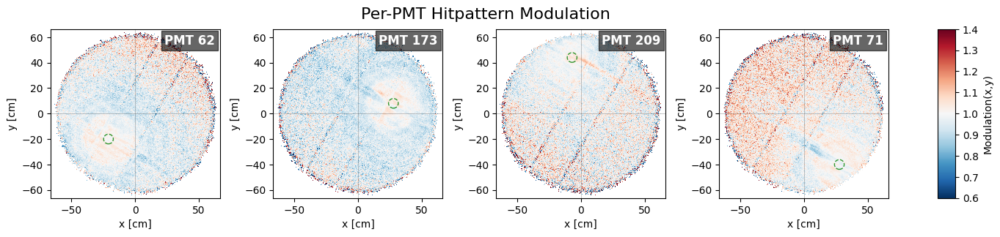

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, TwoSlopeNorm
from matplotlib.patches import Circle
from scipy.stats import binned_statistic_2d

radius = 66.4

# — assume you already have:
#    pos_cnf: (N_events,2) array of x,y
#    residual_no_norm: (N_events, n_pmts) array
#    grid_N, radius, chs defined as before

grid_N = 300  # adjust for finer/coarser grid
# 1) define your bin edges
r = radius
x_edges = np.linspace(-radius, radius, grid_N+1)
y_edges = np.linspace(-radius, radius, grid_N+1)

# 2) compute 2D binned means for each selected channel
stats = []
chs = [62, 173, 209, 71] 

for ch in chs:
    x = pos[:,0]
    y = pos[:,1]
    vals = residual_no_norm[:, np.argwhere(np.array(not_dead_pmts) == ch)[0][0]]
    
    # mean‐bin each cell
    stat, xe, ye, _ = binned_statistic_2d(
        x, y, vals,
        statistic='mean',
        bins=[x_edges, y_edges]
    )
    # stat.shape == (grid_N, grid_N), but X runs along axis‐0, Y along axis‐1,
    # so for imshow we want stat.T
    M = stat.copy()
    
    # mask outside the circle
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    Xc, Yc    = np.meshgrid(x_centers, y_centers, indexing='xy')
    M[(Xc**2 + Yc**2) > radius**2] = np.nan
    
    stats.append(M.T)

# Create 1x4 subplot layout with colorbar
fig = plt.figure(figsize=(16, 3
                          ))
gs = fig.add_gridspec(1, 5, width_ratios=[1, 1, 1, 1, 0.1], hspace=0.3, wspace=0.3)

# Create 4 subplots in a row
axes = [fig.add_subplot(gs[0, i]) for i in range(4)]
cax = fig.add_subplot(gs[0, 4])  # colorbar axis

# Set up colormap normalization
all_vals = np.hstack([M.ravel() for M in stats])
all_vals = all_vals[np.isfinite(all_vals)]

# Create symmetric range around 1
center = 1.0
max_deviation = 0.4
vmin = center - max_deviation
vmax = center + max_deviation

# Use TwoSlopeNorm for divergent colormap centered at 1
norm = TwoSlopeNorm(vmin=vmin, vcenter=center, vmax=vmax)
del all_vals

# Plot each PMT in its own subplot
for i, (ax, ch, M) in enumerate(zip(axes, chs, stats)):
    
    # Plot the data
    im = ax.imshow(
        M,
        origin='lower',
        extent=[-r, r, -r, r],
        cmap='RdBu_r',
        norm=norm,
        aspect='equal'
    )
    
    # Add PMT circle at correct position
    pmt_x = pmt_pos_top[ch, -2]  # x coordinate
    pmt_y = pmt_pos_top[ch, -1]  # y coordinate
    
    circle = plt.Circle((pmt_x, pmt_y), 3 * 2.54 / 2, 
                       color='green', fill=False, alpha=0.8, linestyle='--')
    ax.add_artist(circle)
    
    # Add PMT number label in top right corner
    ax.text(
        0.97, 0.97,
        f"PMT {ch}",
        transform=ax.transAxes,
        ha="right", va="top",
        color="white", fontsize=12, fontweight='bold',
        bbox=dict(facecolor="black", alpha=0.6, pad=3)
    )
    
    # Set labels and title
    ax.set_xlabel('x [cm]')
    ax.set_ylabel('y [cm]')
    
    # Add grid lines at zero
    ax.axhline(0, color='k', lw=0.5, alpha=0.3)
    ax.axvline(0, color='k', lw=0.5, alpha=0.3)

# Add vertical colorbar on the right
cbar = fig.colorbar(im, cax=cax, orientation='vertical')
cbar.set_label('Modulation(x,y)')

# Add overall title
fig.suptitle("Per-PMT Hitpattern Modulation", fontsize=16)

plt.tight_layout()
plt.show()

In [40]:
# Surface Plots
pos = np.load(os.path.join(pos_refit_path, "iterative_encoder_search_0.npz"))['arr_0']
tmp_path = os.path.join(model_path, 'Final_weights_0.json')
model = gen_model(seed=0, starting_model=None, 
                 include_wall = True, include_perp = True, include_anode = False, anode_no_angle= True,
                 multiplication_layers=True, radialLCE=False, monodense=True, large_direct=True)
load_weights_from_dict(model, tmp_path)
model = gen_model(seed=0, starting_model=model, 
                 include_wall = True, include_perp = True, include_anode = False, anode_no_angle= True,
                 multiplication_layers=True, radialLCE=False, monodense=True, large_direct=True)

model.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 xy (InputLayer)             [(None, 2)]                  0         []                            
                                                                                                  
 PMTDistance_Pattern_Respon  (None, 245)                  12737     ['xy[0][0]']                  
 se (Functional)                                                                                  
                                                                                                  
 Wall_Reflection_Pattern_Re  (None, 245)                  4417      ['xy[0][0]']                  
 sponse (Functional)                                                                              
                                                                                           

In [55]:
direct_model = model.get_layer('PMTDistance_Pattern_Response')
direct_model = keras.Model(direct_model.get_layer('Direct_batch_norm').input, direct_model.layers[-2].output)
reflection_model = model.get_layer('Wall_Reflection_Pattern_Response')
reflection_model = keras.Model(reflection_model.get_layer('reflect_batch_norm').input, reflection_model.layers[-1].output)
perp_model = model.get_layer('PerpendicularWire_Pattern_Response')
perp_model = keras.Model(perp_model.get_layer('Perp_batch_norm').input, perp_model.layers[-1].output)

Creating detailed surface plots...


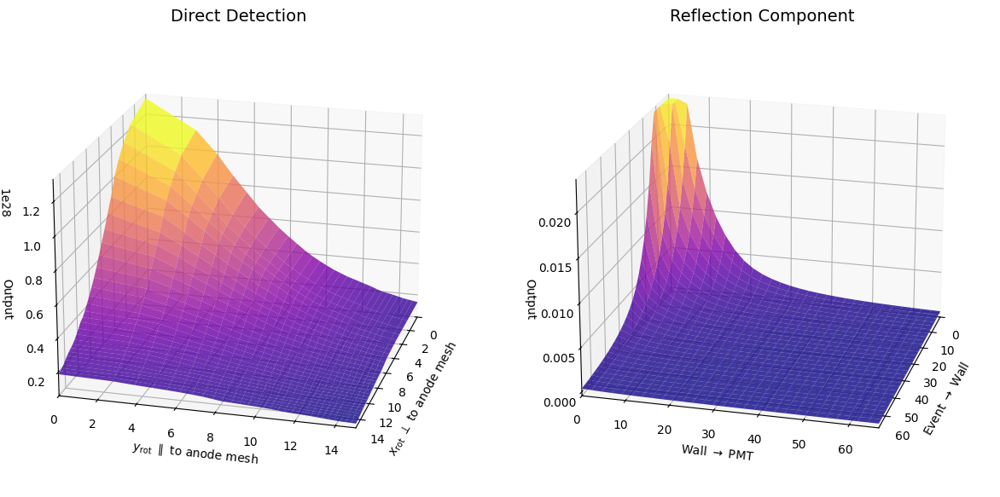

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import tensorflow as tf

def create_surface_plot_2d(model, x_range, y_range, title, x_label="Input 1", y_label="Input 2", resolution=50):
    """
    Create a 2D surface plot for models with 2D input
    """
    # Create meshgrid for input space
    x = np.linspace(x_range[0], x_range[1], resolution)
    y = np.linspace(y_range[0], y_range[1], resolution)
    X, Y = np.meshgrid(x, y)
    
    # Flatten for model prediction
    X_flat = X.flatten()
    Y_flat = Y.flatten()
    
    # Stack inputs and reshape for model (batch_size, 245, 2)
    input_pairs = np.column_stack([X_flat, Y_flat])
    # Repeat the input pairs to match the expected shape (None, 245, 2)
    model_input = np.tile(input_pairs[:, np.newaxis, :], (1, 245, 1))
    
    # Predict
    predictions = model.predict(model_input, verbose=0)
    
    # Take mean across the 245 dimension for visualization
    Z = np.mean(predictions, axis=1).reshape(X.shape)
    
    # Create 3D surface plot
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8, edgecolor='none')
    
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_zlabel('Model Output (mean)')
    ax.set_title(title)
    
    # Add colorbar
    plt.colorbar(surf, shrink=0.5, aspect=5)
    
    # Set viewing angle - responses are maximal at 0,0 so put this in back right
    # azim: rotation around z-axis (0=front, 90=right, 180=back, 270=left)
    # elev: elevation angle (0=horizontal, 90=top view)
    ax.view_init(elev=20, azim=90)  # 45 degrees puts 0,0 corner in back right
    
    plt.tight_layout()
    return fig, ax

def create_line_plot_1d(model, x_range, title, x_label="Input", resolution=100):
    """
    Create a 1D line plot for models with 1D input
    """
    # Create input range
    x = np.linspace(x_range[0], x_range[1], resolution)
    
    # Reshape for model (batch_size, 245, 1)
    model_input = np.tile(x[:, np.newaxis, np.newaxis], (1, 245, 1))
    
    # Predict
    predictions = model.predict(model_input, verbose=0)
    
    # Take mean across the 245 dimension for visualization
    y = np.mean(predictions, axis=1)
    
    # Create plot
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(x, y, 'b-', linewidth=2)
    ax.grid(True, alpha=0.3)
    ax.set_xlabel(x_label)
    ax.set_ylabel('Model Output (mean)')
    ax.set_title(title)
    
    plt.tight_layout()
    return fig, ax

def plot_all_models(direct_model, reflection_model):
    """
    Create surface plots for the direct and reflection models
    """
    print("Creating surface plots for direct and reflection models...")
    
    # Direct model: (None, 245, 2) -> (None, 245)
    # Range: 0 to 15^2 for both inputs
    print("Plotting direct model...")
    direct_max = 15**2
    fig1, ax1 = create_surface_plot_2d(
        direct_model, 
        x_range=(0, direct_max), 
        y_range=(0, direct_max),
        title="Direct Model: PMT Distance Pattern Response",
        x_label="Input 1 (0 to 15²)",
        y_label="Input 2 (0 to 15²)"
    )
    
    # Reflection model: (None, 245, 2) -> (None, 245)
    # Range: 0 to 66.4 for both inputs
    print("Plotting reflection model...")
    reflection_max = 66.4
    fig2, ax2 = create_surface_plot_2d(
        reflection_model,
        x_range=(0, reflection_max),
        y_range=(0, reflection_max),
        title="Reflection Model: Wall Reflection Pattern Response",
        x_label="Input 1 (0 to 66.4)",
        y_label="Input 2 (0 to 66.4)"
    )
    
    plt.show()
    
    return fig1, fig2
def fix_3d_labels(ax, z_label="Output"):
    """Fix common 3D plot label display issues"""
    ax.set_zlabel(z_label)
    ax.zaxis.set_label_coords(-0.5, 0.5)  # Manual positioning
    ax.tick_params(axis='z', which='major', pad=8)  # Padding
    
    # Force visibility
    ax.xaxis.label.set_visible(True)
    ax.yaxis.label.set_visible(True) 
    ax.zaxis.label.set_visible(True)
    
    ax.figure.canvas.draw_idle()  # Force redraw
# Alternative function for more detailed analysis
def create_detailed_surface_plots(direct_model, reflection_model, resolution=30):
    """
    Create more detailed surface plots with contour projections
    """
    print("Creating detailed surface plots...")
    
    # Direct model with contour
    direct_max = 15**2
    x = np.linspace(0, direct_max, resolution)
    y = np.linspace(0, direct_max, resolution)
    X, Y = np.meshgrid(x, y)
    
    input_pairs = np.column_stack([X.flatten(), Y.flatten()])
    model_input = np.tile(input_pairs[:, np.newaxis, :], (1, 245, 1))
    predictions = direct_model.predict(model_input, verbose=0)
    Z_direct = np.mean(predictions, axis=1).reshape(X.shape)
    
    # Create subplot with 3D plots side by side
    fig = plt.figure(figsize=(13, 6),)
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, wspace=0.1)
    
    
    # Direct model 3D
    ax1 = fig.add_subplot(121, projection='3d')
    surf1 = ax1.plot_surface(X**(1/2), Y**(1/2), Z_direct, cmap='plasma', alpha=0.8)
    ax1.set_title('Direct Detection', fontsize=14)
    ax1.set_xlabel(r'$x_{\text{rot}}$ $\perp$ to anode mesh')
    ax1.set_ylabel(r'$y_{\text{rot}}$ $\parallel$ to anode mesh')
    ax1.set_zlabel('Output')
    ax1.set_xlim(0, 15)
    ax1.set_ylim(0, 15)
    ax1.view_init(elev=20, azim=15)  # Set viewing angle
    #fix_3d_labels(ax1, )
    
    # Reflection model
    reflection_max = 66.4
    x_r = np.linspace(0, reflection_max, resolution)
    y_r = np.linspace(0, reflection_max, resolution)
    X_r, Y_r = np.meshgrid(x_r, y_r)
    
    input_pairs_r = np.column_stack([X_r.flatten(), Y_r.flatten()])
    model_input_r = np.tile(input_pairs_r[:, np.newaxis, :], (1, 245, 1))
    predictions_r = reflection_model.predict(model_input_r, verbose=0)
    Z_reflection = np.mean(predictions_r, axis=1).reshape(X_r.shape)
    
    ax2 = fig.add_subplot(122, projection='3d')
    surf2 = ax2.plot_surface(X_r, Y_r, Z_reflection, cmap='plasma', alpha=0.8)
    ax2.set_title('Reflection Component', fontsize=14)
    ax2.set_xlabel(r'Event $\rightarrow$ Wall')
    ax2.set_ylabel(r'Wall $\rightarrow$ PMT')
    ax2.set_zlabel('Output')
    ax2.view_init(elev=20, azim=15)  # Set viewing angle
    ax2.set_xlim(0,66.4)
    ax2.set_ylim(0,66.4)
    
    #plt.tight_layout()
    plt.show()
    
    return fig

detailed_fig = create_detailed_surface_plots(direct_model, reflection_model)





In [91]:
np.finfo('float32')

finfo(resolution=1e-06, min=-3.4028235e+38, max=3.4028235e+38, dtype=float32)

Analyzing peak connectivity...
Found 11 significant peaks


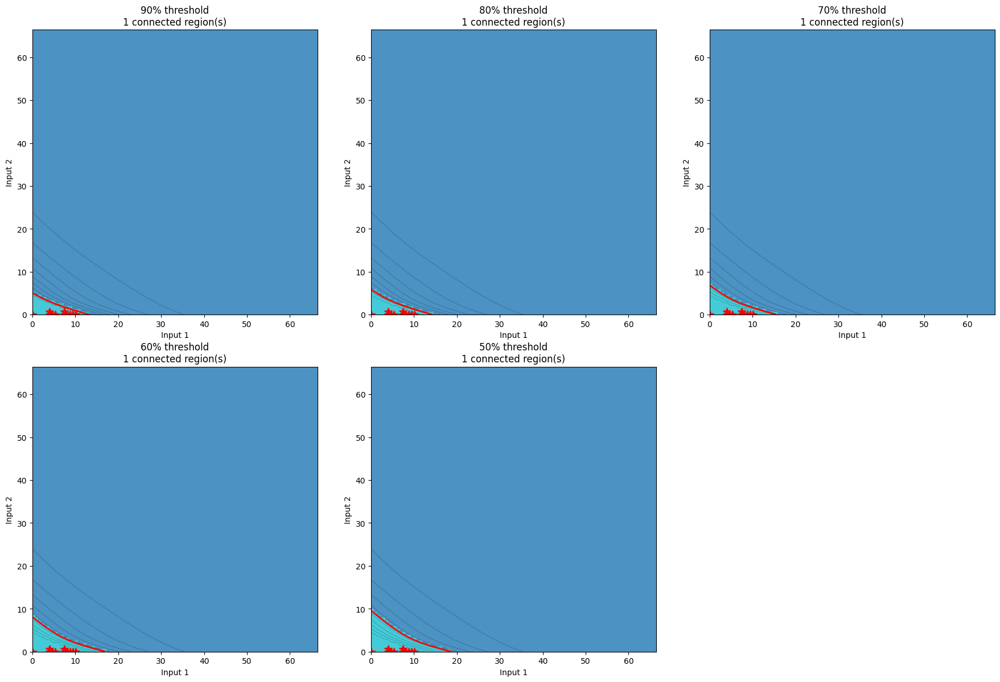


Connectivity Analysis Summary:
At 90% of maximum (0.020804):
  → 1 connected region(s)
  → All peaks are CONNECTED at this level
At 80% of maximum (0.018492):
  → 1 connected region(s)
  → All peaks are CONNECTED at this level
At 70% of maximum (0.016181):
  → 1 connected region(s)
  → All peaks are CONNECTED at this level
At 60% of maximum (0.013869):
  → 1 connected region(s)
  → All peaks are CONNECTED at this level
At 50% of maximum (0.011558):
  → 1 connected region(s)
  → All peaks are CONNECTED at this level

Connectivity Transition:
  → Peaks are connected at all tested thresholds
Searching for saddle points...
Found 122 potential saddle points


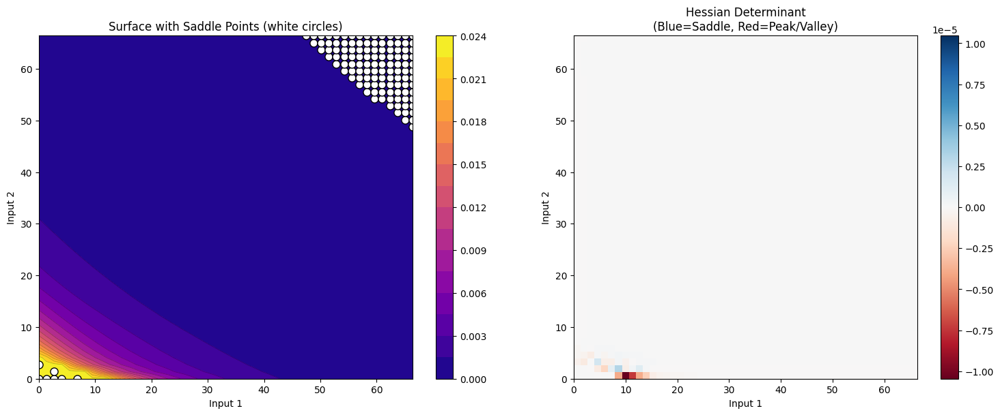

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import tensorflow as tf

def create_surface_plot_2d(model, x_range, y_range, title, x_label="Input 1", y_label="Input 2", resolution=50):
    """
    Create a 2D surface plot for models with 2D input
    """
    # Create meshgrid for input space
    x = np.linspace(x_range[0], x_range[1], resolution)
    y = np.linspace(y_range[0], y_range[1], resolution)
    X, Y = np.meshgrid(x, y)
    
    # Flatten for model prediction
    X_flat = X.flatten()
    Y_flat = Y.flatten()
    
    # Stack inputs and reshape for model (batch_size, 245, 2)
    input_pairs = np.column_stack([X_flat, Y_flat])
    # Repeat the input pairs to match the expected shape (None, 245, 2)
    model_input = np.tile(input_pairs[:, np.newaxis, :], (1, 245, 1))
    
    # Predict
    predictions = model.predict(model_input, verbose=0)
    
    # Take mean across the 245 dimension for visualization
    Z = np.mean(predictions, axis=1).reshape(X.shape)
    
    # Create 3D surface plot
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8, edgecolor='none')
    
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_zlabel('Model Output (mean)')
    ax.set_title(title)
    
    # Add colorbar
    plt.colorbar(surf, shrink=0.5, aspect=5)
    
    # Set viewing angle - responses are maximal at 0,0 so put this in back right
    # azim: rotation around z-axis (0=front, 90=right, 180=back, 270=left)
    # elev: elevation angle (0=horizontal, 90=top view)
    ax.view_init(elev=20, azim=45)  # 45 degrees puts 0,0 corner in back right
    
    plt.tight_layout()
    return fig, ax

def create_line_plot_1d(model, x_range, title, x_label="Input", resolution=100):
    """
    Create a 1D line plot for models with 1D input
    """
    # Create input range
    x = np.linspace(x_range[0], x_range[1], resolution)
    
    # Reshape for model (batch_size, 245, 1)
    model_input = np.tile(x[:, np.newaxis, np.newaxis], (1, 245, 1))
    
    # Predict
    predictions = model.predict(model_input, verbose=0)
    
    # Take mean across the 245 dimension for visualization
    y = np.mean(predictions, axis=1)
    
    # Create plot
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(x, y, 'b-', linewidth=2)
    ax.grid(True, alpha=0.3)
    ax.set_xlabel(x_label)
    ax.set_ylabel('Model Output (mean)')
    ax.set_title(title)
    
    plt.tight_layout()
    return fig, ax

def plot_all_models(direct_model, reflection_model):
    """
    Create surface plots for the direct and reflection models
    """
    print("Creating surface plots for direct and reflection models...")
    
    # Direct model: (None, 245, 2) -> (None, 245)
    # Range: 0 to 15^2 for both inputs
    print("Plotting direct model...")
    direct_max = 15**2
    fig1, ax1 = create_surface_plot_2d(
        direct_model, 
        x_range=(0, direct_max), 
        y_range=(0, direct_max),
        title="Direct Model: PMT Distance Pattern Response",
        x_label="Input 1 (0 to 15²)",
        y_label="Input 2 (0 to 15²)"
    )
    
    # Reflection model: (None, 245, 2) -> (None, 245)
    # Range: 0 to 66.4 for both inputs
    print("Plotting reflection model...")
    reflection_max = 66.4
    fig2, ax2 = create_surface_plot_2d(
        reflection_model,
        x_range=(0, reflection_max),
        y_range=(0, reflection_max),
        title="Reflection Model: Wall Reflection Pattern Response",
        x_label="Input 1 (0 to 66.4)",
        y_label="Input 2 (0 to 66.4)"
    )
    
    plt.show()
    
    return fig1, fig2

# Alternative function for more detailed analysis
def create_detailed_surface_plots(direct_model, reflection_model, resolution=30):
    """
    Create more detailed surface plots with contour projections
    """
    print("Creating detailed surface plots...")
    
    # Direct model with contour
    direct_max = 15**2
    x = np.linspace(0, direct_max, resolution)
    y = np.linspace(0, direct_max, resolution)
    X, Y = np.meshgrid(x, y)
    
    input_pairs = np.column_stack([X.flatten(), Y.flatten()])
    model_input = np.tile(input_pairs[:, np.newaxis, :], (1, 245, 1))
    predictions = direct_model.predict(model_input, verbose=0)
    Z_direct = np.mean(predictions, axis=1).reshape(X.shape)
    
    # Create subplot with 3D plots side by side
    fig = plt.figure(figsize=(16, 6))
    
    # Direct model 3D
    ax1 = fig.add_subplot(121, projection='3d')
    surf1 = ax1.plot_surface(X, Y, Z_direct, cmap='viridis', alpha=0.8)
    ax1.set_title('Direct Model')
    ax1.set_xlabel('Input 1')
    ax1.set_ylabel('Input 2')
    ax1.set_zlabel('Output')
    ax1.view_init(elev=20, azim=45)  # Set viewing angle
    
    # Reflection model
    reflection_max = 66.4
    x_r = np.linspace(0, reflection_max, resolution)
    y_r = np.linspace(0, reflection_max, resolution)
    X_r, Y_r = np.meshgrid(x_r, y_r)
    
    input_pairs_r = np.column_stack([X_r.flatten(), Y_r.flatten()])
    model_input_r = np.tile(input_pairs_r[:, np.newaxis, :], (1, 245, 1))
    predictions_r = reflection_model.predict(model_input_r, verbose=0)
    Z_reflection = np.mean(predictions_r, axis=1).reshape(X_r.shape)
    
    ax2 = fig.add_subplot(122, projection='3d')
    surf2 = ax2.plot_surface(X_r, Y_r, Z_reflection, cmap='plasma', alpha=0.8)
    ax2.set_title('Reflection Model')
    ax2.set_xlabel('Input 1')
    ax2.set_ylabel('Input 2')
    ax2.set_zlabel('Output')
    ax2.view_init(elev=20, azim=45)  # Set viewing angle
    
    plt.tight_layout()
    plt.show()
    
    return fig

# Usage example:
"""
# Assuming you have your models defined:
# direct_model = model.get_layer('PMTDistance_Pattern_Response')
# direct_model = keras.Model(direct_model.get_layer('Direct_batch_norm').input, direct_model.layers[-2].output)
# reflection_model = model.get_layer('Wall_Reflection_Pattern_Response')
# reflection_model = keras.Model(reflection_model.get_layer('reflect_batch_norm').input, reflection_model.layers[-1].output)

# Create all plots
fig1, fig2 = plot_all_models(direct_model, reflection_model)

# Or create detailed plots
detailed_fig = create_detailed_surface_plots(direct_model, reflection_model)
"""

def verify_reflection_peaks(reflection_model, resolution=100):
    """
    Analyze the reflection model surface to identify and verify peaks
    """
    print("Analyzing reflection model for multiple peaks...")
    
    # Create high-resolution grid
    reflection_max = 66.4
    x = np.linspace(0, reflection_max, resolution)
    y = np.linspace(0, reflection_max, resolution)
    X, Y = np.meshgrid(x, y)
    
    # Get predictions
    input_pairs = np.column_stack([X.flatten(), Y.flatten()])
    model_input = np.tile(input_pairs[:, np.newaxis, :], (1, 245, 1))
    predictions = reflection_model.predict(model_input, verbose=0)
    Z = np.mean(predictions, axis=1).reshape(X.shape)
    
    # Find local maxima using scipy if available, otherwise simple approach
    try:
        from scipy.ndimage import maximum_filter
        from scipy.signal import find_peaks
        
        # Find local maxima
        local_maxima = maximum_filter(Z, size=5) == Z
        peak_coords = np.where(local_maxima & (Z > np.max(Z) * 0.1))  # Only peaks > 10% of global max
        
        print(f"Found {len(peak_coords[0])} potential peaks above 10% of maximum")
        
        # Get peak values and locations
        peak_values = Z[peak_coords]
        peak_locations = list(zip(x[peak_coords[1]], y[peak_coords[0]], peak_values))
        
        # Sort by peak value (descending)
        peak_locations.sort(key=lambda p: p[2], reverse=True)
        
        print("\nTop peaks found:")
        for i, (px, py, pval) in enumerate(peak_locations[:10]):  # Show top 10
            print(f"  Peak {i+1}: x={px:.2f}, y={py:.2f}, value={pval:.6f}")
            
    except ImportError:
        print("scipy not available, using simple peak detection...")
        # Simple approach - find global maximum and check surrounding area
        max_idx = np.unravel_index(np.argmax(Z), Z.shape)
        global_max_val = Z[max_idx]
        global_max_x = x[max_idx[1]]
        global_max_y = y[max_idx[0]]
        
        print(f"Global maximum: x={global_max_x:.2f}, y={global_max_y:.2f}, value={global_max_val:.6f}")
    
    # Create detailed visualization
    fig = plt.figure(figsize=(15, 5))
    
    # 3D surface
    ax1 = fig.add_subplot(131, projection='3d')
    surf = ax1.plot_surface(X, Y, Z, cmap='plasma', alpha=0.8)
    ax1.set_title('Reflection Model - 3D Surface')
    ax1.set_xlabel('Input 1')
    ax1.set_ylabel('Input 2')
    ax1.set_zlabel('Output')
    ax1.view_init(elev=30, azim=45)
    
    # Top-down contour view
    ax2 = fig.add_subplot(132)
    contour = ax2.contour(X, Y, Z, levels=20)
    ax2.clabel(contour, inline=True, fontsize=8)
    ax2.set_title('Contour Plot (Top View)')
    ax2.set_xlabel('Input 1')
    ax2.set_ylabel('Input 2')
    ax2.grid(True, alpha=0.3)
    
    # Filled contour for better visualization
    ax3 = fig.add_subplot(133)
    filled_contour = ax3.contourf(X, Y, Z, levels=20, cmap='plasma')
    plt.colorbar(filled_contour, ax=ax3)
    ax3.set_title('Filled Contour Plot')
    ax3.set_xlabel('Input 1')
    ax3.set_ylabel('Input 2')
    
    # Mark potential peaks if scipy is available
    try:
        if len(peak_locations) > 0:
            for i, (px, py, pval) in enumerate(peak_locations[:5]):  # Mark top 5 peaks
                ax2.plot(px, py, 'ro', markersize=8, label=f'Peak {i+1}')
                ax3.plot(px, py, 'wo', markersize=8)
            ax2.legend()
    except:
        pass
    
    plt.tight_layout()
    plt.show()
    
    # Statistical analysis
    print(f"\nSurface statistics:")
    print(f"  Global maximum: {np.max(Z):.6f}")
    print(f"  Global minimum: {np.min(Z):.6f}")
    print(f"  Mean value: {np.mean(Z):.6f}")
    print(f"  Standard deviation: {np.std(Z):.6f}")
    
    return Z, X, Y, fig

def analyze_peak_connectivity(reflection_model, resolution=100, threshold_percentages=[90, 80, 70, 60, 50]):
    """
    Analyze if peaks are connected by examining connectivity at different threshold levels
    """
    print("Analyzing peak connectivity...")
    
    # Get surface data
    reflection_max = 66.4
    x = np.linspace(0, reflection_max, resolution)
    y = np.linspace(0, reflection_max, resolution)
    X, Y = np.meshgrid(x, y)
    
    input_pairs = np.column_stack([X.flatten(), Y.flatten()])
    model_input = np.tile(input_pairs[:, np.newaxis, :], (1, 245, 1))
    predictions = reflection_model.predict(model_input, verbose=0)
    Z = np.mean(predictions, axis=1).reshape(X.shape)
    
    global_max = np.max(Z)
    global_min = np.min(Z)
    
    # Find peaks first
    try:
        from scipy.ndimage import maximum_filter, label
        from scipy.signal import find_peaks
        
        # Find local maxima
        local_maxima = maximum_filter(Z, size=5) == Z
        significant_peaks = local_maxima & (Z > global_max * 0.1)
        peak_coords = np.where(significant_peaks)
        
        print(f"Found {len(peak_coords[0])} significant peaks")
        
        # Analyze connectivity at different threshold levels
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        axes = axes.flatten()
        
        connectivity_results = {}
        
        for i, threshold_pct in enumerate(threshold_percentages):
            threshold = global_max * (threshold_pct / 100)
            
            # Create binary mask of regions above threshold
            above_threshold = Z >= threshold
            
            # Find connected components
            labeled_regions, num_regions = label(above_threshold)
            
            connectivity_results[threshold_pct] = {
                'threshold': threshold,
                'num_regions': num_regions,
                'labeled_regions': labeled_regions
            }
            
            # Plot the connectivity analysis
            if i < len(axes):
                ax = axes[i]
                
                # Show the thresholded regions with different colors
                masked_Z = np.where(above_threshold, labeled_regions, 0)
                im = ax.imshow(masked_Z, extent=[0, reflection_max, 0, reflection_max], 
                              origin='lower', cmap='tab10', alpha=0.8)
                
                # Overlay contours of original surface
                contour = ax.contour(X, Y, Z, levels=10, colors='black', alpha=0.3, linewidths=0.5)
                
                # Mark the threshold level
                ax.contour(X, Y, Z, levels=[threshold], colors='red', linewidths=2)
                
                ax.set_title(f'{threshold_pct}% threshold\n{num_regions} connected region(s)')
                ax.set_xlabel('Input 1')
                ax.set_ylabel('Input 2')
                
                # Mark peak locations
                for peak_y, peak_x in zip(peak_coords[0], peak_coords[1]):
                    if above_threshold[peak_y, peak_x]:  # Only mark peaks above current threshold
                        ax.plot(x[peak_x], y[peak_y], 'r*', markersize=10)
        
        # Remove unused subplots
        for i in range(len(threshold_percentages), len(axes)):
            fig.delaxes(axes[i])
        
        plt.tight_layout()
        plt.show()
        
        # Summary analysis
        print("\nConnectivity Analysis Summary:")
        print("=" * 50)
        
        for threshold_pct in threshold_percentages:
            result = connectivity_results[threshold_pct]
            print(f"At {threshold_pct}% of maximum ({result['threshold']:.6f}):")
            print(f"  → {result['num_regions']} connected region(s)")
            
            if result['num_regions'] == 1:
                print(f"  → All peaks are CONNECTED at this level")
            else:
                print(f"  → Peaks are SEPARATED into {result['num_regions']} distinct regions")
        
        # Find the critical threshold where peaks become connected
        print("\nConnectivity Transition:")
        for i, threshold_pct in enumerate(threshold_percentages[:-1]):
            current_regions = connectivity_results[threshold_pct]['num_regions']
            next_regions = connectivity_results[threshold_percentages[i+1]]['num_regions']
            
            if current_regions > 1 and next_regions == 1:
                print(f"  → Peaks become connected between {threshold_pct}% and {threshold_percentages[i+1]}% thresholds")
                break
        else:
            if connectivity_results[threshold_percentages[-1]]['num_regions'] > 1:
                print(f"  → Peaks remain separated even at {threshold_percentages[-1]}% threshold")
            else:
                print(f"  → Peaks are connected at all tested thresholds")
        
        return connectivity_results, Z, X, Y
        
    except ImportError:
        print("scipy not available - cannot perform detailed connectivity analysis")
        print("Please install scipy for full connectivity analysis: pip install scipy")
        return None, Z, X, Y

def find_saddle_points(reflection_model, resolution=50):
    """
    Find potential saddle points between peaks
    """
    print("Searching for saddle points...")
    
    # Get surface data
    reflection_max = 66.4
    x = np.linspace(0, reflection_max, resolution)
    y = np.linspace(0, reflection_max, resolution)
    X, Y = np.meshgrid(x, y)
    
    input_pairs = np.column_stack([X.flatten(), Y.flatten()])
    model_input = np.tile(input_pairs[:, np.newaxis, :], (1, 245, 1))
    predictions = reflection_model.predict(model_input, verbose=0)
    Z = np.mean(predictions, axis=1).reshape(X.shape)
    
    try:
        # Calculate gradients
        grad_x = np.gradient(Z, axis=1)
        grad_y = np.gradient(Z, axis=0)
        
        # Calculate second derivatives (Hessian)
        grad_xx = np.gradient(grad_x, axis=1)
        grad_yy = np.gradient(grad_y, axis=0)
        grad_xy = np.gradient(grad_x, axis=0)
        
        # Find points where gradient is near zero
        gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
        critical_points = gradient_magnitude < np.percentile(gradient_magnitude, 5)
        
        # Calculate determinant of Hessian at critical points
        hessian_det = grad_xx * grad_yy - grad_xy**2
        
        # Saddle points: critical points with negative Hessian determinant
        saddle_candidates = critical_points & (hessian_det < 0)
        
        saddle_coords = np.where(saddle_candidates)
        
        print(f"Found {len(saddle_coords[0])} potential saddle points")
        
        # Plot results
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        
        # Original surface with saddle points marked
        contour1 = ax1.contourf(X, Y, Z, levels=20, cmap='plasma')
        plt.colorbar(contour1, ax=ax1)
        ax1.contour(X, Y, Z, levels=20, colors='black', alpha=0.3, linewidths=0.5)
        
        # Mark saddle points
        for sy, sx in zip(saddle_coords[0], saddle_coords[1]):
            ax1.plot(x[sx], y[sy], 'wo', markersize=8, markeredgecolor='black')
        
        ax1.set_title('Surface with Saddle Points (white circles)')
        ax1.set_xlabel('Input 1')
        ax1.set_ylabel('Input 2')
        
        # Hessian determinant
        im2 = ax2.imshow(hessian_det, extent=[0, reflection_max, 0, reflection_max], 
                        origin='lower', cmap='RdBu', vmin=-np.abs(hessian_det).max(), 
                        vmax=np.abs(hessian_det).max())
        plt.colorbar(im2, ax=ax2)
        ax2.set_title('Hessian Determinant\n(Blue=Saddle, Red=Peak/Valley)')
        ax2.set_xlabel('Input 1')
        ax2.set_ylabel('Input 2')
        
        plt.tight_layout()
        plt.show()
        
        return saddle_coords, Z, X, Y
        
    except Exception as e:
        print(f"Error in saddle point analysis: {e}")
        return None, Z, X, Y

connectivity_results, Z, X, Y = analyze_peak_connectivity(reflection_model)

# Find saddle points between peaks
saddle_coords, Z, X, Y = find_saddle_points(reflection_model)

### Compute Density Metric + chi^2


/tmp/ipykernel_9647/1184069429.py:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


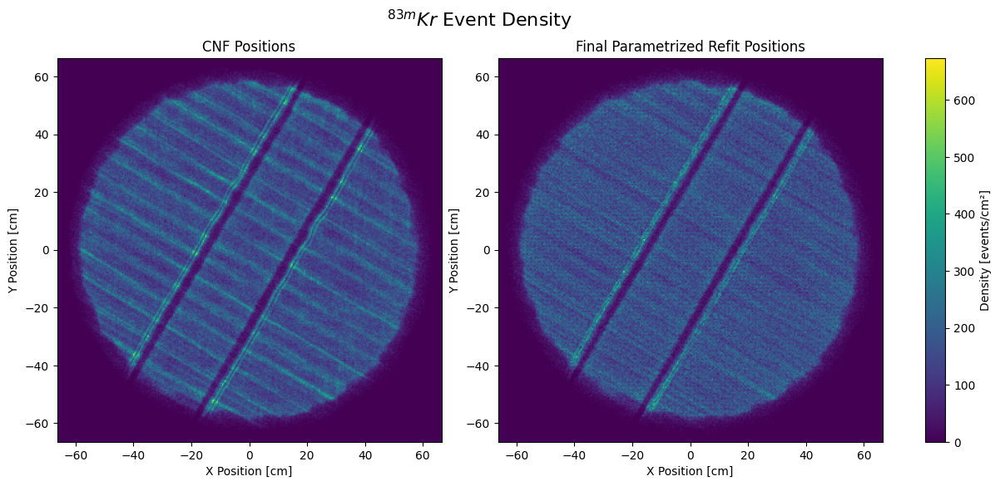

DENSITY CALCULATION VERIFICATION
Total detector radius: 66.4 cm
Number of bins: 300
Bin width: 0.4427 cm
Bin area: 0.195954 cm²

CNF Positions:
  Total events: 1798107
  Max bin count: 125.0
  Max density: 637.91 events/cm²

Final Refit Positions:
  Total events: 1798107
  Max bin count: 132.0
  Max density: 673.63 events/cm²

Shared density range: 0.00 - 673.63 events/cm²

SANITY CHECK - Average density across entire detector:
CNF average density: 129.8164 events/cm²
Refit average density: 129.8164 events/cm²


In [162]:
import numpy as np
import matplotlib.pyplot as plt

def do_density_plot_shared(ax, pos, title='', bins=300, norm=None):
    """Modified density plot function that returns the image object for shared colorbar"""
    radius = 66.4  # Fixed radius
    x_edges = y_edges = np.linspace(-radius, radius, bins)
    hist, xedges, yedges = np.histogram2d(pos[:, 0], pos[:, 1], bins=[x_edges, y_edges])
    
    # Calculate bin area for density units (cm²)
    bin_width = (2 * radius) / bins
    bin_area = bin_width**2
    density = hist / bin_area  # Convert counts to density (events/cm²)
    
    im = ax.imshow(density.T, origin='lower', extent=[-radius, radius, -radius, radius], 
                   cmap='viridis', norm=norm)
    ax.set_xlabel('X Position [cm]')
    ax.set_ylabel('Y Position [cm]')
    ax.set_title(title)
    return im

# Create figure with gridspec for separate colorbar
fig = plt.figure(figsize=(14, 6))
gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.05], wspace=0.1)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
cax = fig.add_subplot(gs[0, 2])

# Calculate shared normalization range
radius = 66.4
bins = 300  # Increased bins
bin_width = (2 * radius) / bins
bin_area = bin_width**2

# Get histograms for both datasets to determine shared scale
x_edges = y_edges = np.linspace(-radius, radius, bins)
hist1, _, _ = np.histogram2d(pos_cnf[:, 0], pos_cnf[:, 1], bins=[x_edges, y_edges])
hist2, _, _ = np.histogram2d(pos[:, 0], pos[:, 1], bins=[x_edges, y_edges])

# Convert to density
density1 = hist1 / bin_area
density2 = hist2 / bin_area

# Find shared normalization
vmin = min(density1.min(), density2.min())
vmax = max(density1.max(), density2.max())
norm = plt.Normalize(vmin=vmin, vmax=vmax)

# Create the plots
im1 = do_density_plot_shared(ax1, pos_cnf, title='CNF Positions', bins=bins, norm=norm)
im2 = do_density_plot_shared(ax2, pos, title='Final Parametrized Refit Positions', bins=bins, norm=norm)

# Add shared colorbar in separate subplot
cbar = fig.colorbar(im2, cax=cax, orientation='vertical')
cbar.set_label('Density [events/cm²]')

# Add overall title
fig.suptitle(r'$^{83m}Kr$ Event Density ', fontsize=16)

plt.tight_layout()
plt.show()

# Print detailed statistics to verify density calculation
print("="*50)
print("DENSITY CALCULATION VERIFICATION")
print("="*50)
print(f"Total detector radius: {radius} cm")
print(f"Number of bins: {bins}")
print(f"Bin width: {bin_width:.4f} cm")
print(f"Bin area: {bin_area:.6f} cm²")
print()
print(f"CNF Positions:")
print(f"  Total events: {len(pos_cnf)}")
print(f"  Max bin count: {hist1.max()}")
print(f"  Max density: {density1.max():.2f} events/cm²")
print()
print(f"Final Refit Positions:")
print(f"  Total events: {len(pos)}")
print(f"  Max bin count: {hist2.max()}")
print(f"  Max density: {density2.max():.2f} events/cm²")
print()
print(f"Shared density range: {vmin:.2f} - {vmax:.2f} events/cm²")

# Sanity check: calculate average density across detector
detector_area = np.pi * radius**2
avg_density_cnf = len(pos_cnf) / detector_area
avg_density_refit = len(pos) / detector_area
print()
print("SANITY CHECK - Average density across entire detector:")
print(f"CNF average density: {avg_density_cnf:.4f} events/cm²")
print(f"Refit average density: {avg_density_refit:.4f} events/cm²")

In [164]:
# Eval Chi2

import numpy as np
import os
import tensorflow as tf

# Define model and position file names
model_names = ['PreLoopRetrainHighRes.json'] + [f"Final_weights_{i}.json" for i in range(3)]
pos_names = ['refit_1_encoder_simul_train.npz'] + [f"iterative_encoder_search_{i}.npz" for i in range(3)]

# Display names for better readability
display_names = [
    'PreLoop Retrain',
    'Final Weights 0', 
    'Final Weights 1',
    'Final Weights 2'
]

print("Starting model evaluation...")
print("="*60)

# Store results
evaluation_results = []

# Backup pos_cnf to ensure we never overwrite it
pos_cnf_backup = pos_cnf.copy()

for i, (model_name, pos_name, display_name) in enumerate(zip(model_names, pos_names, display_names)):
    print(f"\nProcessing {display_name} ({model_name})")
    print("-" * 40)
    
    try:
        # Load model with exact specifications
        print("Loading model...")
        model = gen_model(seed=0, starting_model=None,
                         include_wall=True, include_perp=True, include_anode=False, anode_no_angle=True,
                         multiplication_layers=True, radialLCE=False, monodense=True, large_direct=True, biased_layer=False)
        
        load_weights_from_dict(model, os.path.join(model_path, model_name))
        model.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio=True)
        model.get_layer('LossLayer').trainable = True
        model.get_layer("Wall_Reflection_Pattern_Response").get_layer("Event_Wall_distance").set_mode('optimize', tol=1e-2, max_iter=100)
        
        print("Model loaded successfully!")
        
        # Evaluate on pos_cnf (original reference positions)
        print("Evaluating on pos_cnf...")
        loss_cnf = model.predict({'xy': pos_cnf_backup, 'pattern': patterns_real}, batch_size=2**10)
        mean_loss_cnf = np.nanmean(loss_cnf)
        
        # Load corresponding position file
        print(f"Loading position file: {pos_name}")
        pos_path = os.path.join(pos_refit_path, pos_name)
        pos_refit = np.load(pos_path)['arr_0']
        
        # Evaluate on refit positions
        print("Evaluating on refit positions...")
        loss_refit = model.predict({'xy': pos_refit, 'pattern': patterns_real}, batch_size=2**10)
        mean_loss_refit = np.nanmean(loss_refit)
        
        # Store results
        result = {
            'model_name': model_name,
            'display_name': display_name,
            'pos_file': pos_name,
            'loss_cnf': mean_loss_cnf,
            'loss_refit': mean_loss_refit,
            'improvement': mean_loss_cnf - mean_loss_refit,
            'improvement_pct': ((mean_loss_cnf - mean_loss_refit) / mean_loss_cnf) * 100
        }
        
        evaluation_results.append(result)
        
        # Print results for this model
        print(f"Results for {display_name}:")
        print(f"  Loss on pos_cnf: {mean_loss_cnf:.6f}")
        print(f"  Loss on refit positions: {mean_loss_refit:.6f}")
        print(f"  Improvement: {result['improvement']:.6f}")
        print(f"  Improvement (%): {result['improvement_pct']:.2f}%")
        
        # Clean up model to free memory
        del model
        tf.keras.backend.clear_session()
        
    except FileNotFoundError as e:
        print(f"Error: File not found - {e}")
    except Exception as e:
        print(f"Error processing {model_name}: {e}")
        continue

# Verify pos_cnf was not modified
assert np.array_equal(pos_cnf, pos_cnf_backup), "ERROR: pos_cnf was modified!"
print(f"\n✓ Confirmed: pos_cnf was not modified during evaluation")

print("\n" + "="*60)
print("EVALUATION SUMMARY")
print("="*60)

for result in evaluation_results:
    print(f"\n{result['display_name']}:")
    print(f"  Model: {result['model_name']}")
    print(f"  Position file: {result['pos_file']}")
    print(f"  Loss (CNF): {result['loss_cnf']:.6f}")
    print(f"  Loss (Refit): {result['loss_refit']:.6f}")
    print(f"  Improvement: {result['improvement']:.6f} ({result['improvement_pct']:.2f}%)")

# Generate LaTeX table
print("\n" + "="*60)
print("LATEX TABLE")
print("="*60)

def generate_model_evaluation_latex_table(results):
    """Generate a LaTeX table from the model evaluation results"""
    
    latex_code = r"""\begin{table}[htbp]
\centering
\caption{Model Performance Comparison: Loss Evaluation on CNF vs Refit Positions}
\label{tab:model_evaluation}
\begin{tabular}{lcccc}
\toprule
Model & CNF Loss & Refit Loss & Improvement & Improvement (\%) \\
\midrule
"""
    
    # Table rows
    for result in results:
        model_name = result['display_name'].replace('_', r'\_')
        cnf_loss = f"{result['loss_cnf']:.5f}"
        refit_loss = f"{result['loss_refit']:.5f}"
        improvement = f"{result['improvement']:.5f}"
        improvement_pct = f"{result['improvement_pct']:.2f}"
        
        latex_code += f"{model_name} & {cnf_loss} & {refit_loss} & {improvement} & {improvement_pct} \\\\\n"
    
    latex_code += r"""\bottomrule
\end{tabular}
\end{table}"""
    
    return latex_code

# Generate and print the LaTeX table
if evaluation_results:
    latex_table = generate_model_evaluation_latex_table(evaluation_results)
    print(latex_table)
    
    # Also generate a detailed table with position file info
    print("\n" + "="*40)
    print("DETAILED LATEX TABLE")
    print("="*40)
    
    def generate_detailed_model_latex_table(results):
        """Generate a detailed LaTeX table with position file information"""
        
        latex_code = r"""\begin{table}[htbp]
\centering
\caption{Detailed Model Performance: Loss Evaluation with Position File Information}
\label{tab:detailed_model_evaluation}
\resizebox{\textwidth}{!}{%
\begin{tabular}{lllcccc}
\toprule
Model & Position File & CNF Loss & Refit Loss & Improvement & Improvement (\%) \\
\midrule
"""
        
        for result in results:
            model_name = result['display_name'].replace('_', r'\_')
            pos_file = result['pos_file'].replace('_', r'\_')
            cnf_loss = f"{result['loss_cnf']:.6f}"
            refit_loss = f"{result['loss_refit']:.6f}"
            improvement = f"{result['improvement']:.6f}"
            improvement_pct = f"{result['improvement_pct']:.2f}"
            
            latex_code += f"{model_name} & {pos_file} & {cnf_loss} & {refit_loss} & {improvement} & {improvement_pct} \\\\\n"
        
        latex_code += r"""\bottomrule
\end{tabular}%
}
\end{table}"""
        
        return latex_code
    
    detailed_latex_table = generate_detailed_model_latex_table(evaluation_results)
    print(detailed_latex_table)
    
    print("\nNote: Copy the LaTeX code above and paste it into your LaTeX document.")
    print("Make sure to include \\usepackage{booktabs} in your document preamble.")
    
    # Summary statistics
    print("\n" + "="*40)
    print("SUMMARY STATISTICS")
    print("="*40)
    
    improvements = [r['improvement'] for r in evaluation_results]
    improvement_pcts = [r['improvement_pct'] for r in evaluation_results]
    
    print(f"Average improvement: {np.mean(improvements):.6f}")
    print(f"Best improvement: {np.max(improvements):.6f}")
    print(f"Worst improvement: {np.min(improvements):.6f}")
    print(f"Average improvement (%): {np.mean(improvement_pcts):.2f}%")
    
    best_model = max(evaluation_results, key=lambda x: x['improvement'])
    print(f"Best performing model: {best_model['display_name']} ({best_model['improvement_pct']:.2f}% improvement)")

else:
    print("No successful evaluations to generate LaTeX table.")

print(f"\n✓ Evaluation complete. Total models processed: {len(evaluation_results)}")


Starting model evaluation...

Processing PreLoop Retrain (PreLoopRetrainHighRes.json)
----------------------------------------
Loading model...
Model loaded successfully!
Evaluating on pos_cnf...
1756/1756 [==============================] - 346s 197ms/step
Loading position file: refit_1_encoder_simul_train.npz
Evaluating on refit positions...
1756/1756 [==============================] - 345s 197ms/step
Results for PreLoop Retrain:
  Loss on pos_cnf: 1.279772
  Loss on refit positions: 1.283690
  Improvement: -0.003919
  Improvement (%): -0.31%

Processing Final Weights 0 (Final_weights_0.json)
----------------------------------------
Loading model...
Model loaded successfully!
Evaluating on pos_cnf...
1756/1756 [==============================] - 340s 193ms/step
Loading position file: iterative_encoder_search_0.npz
Evaluating on refit positions...
1756/1756 [==============================] - 342s 195ms/step
Results for Final Weights 0:
  Loss on pos_cnf: 1.237248
  Loss on refit positio

In [25]:
import numpy as np

def apply_rotated_x_mask(events, angle_rad=-np.pi/3, x_min=24, x_max=33):
    rotation_matrix = np.array([
        [np.cos(angle_rad), -np.sin(angle_rad)],
        [np.sin(angle_rad),  np.cos(angle_rad)]
    ])
    rotated = events @ rotation_matrix.T
    mask = (rotated[:, 0] < x_min) | (rotated[:, 0] > x_max)
    return events[mask]


def compute_bin_counts(points, x_bins, y_bins, radius):
    H, xedges, yedges = np.histogram2d(points[:, 0], points[:, 1], bins=[x_bins, y_bins])
    counts = H.flatten()

    # Compute bin centers
    x_centers = 0.5 * (xedges[:-1] + xedges[1:])
    y_centers = 0.5 * (yedges[:-1] + yedges[1:])
    xx, yy = np.meshgrid(x_centers, y_centers, indexing='ij')
    r_centers = np.sqrt(xx**2 + yy**2).flatten()

    # Keep only bins within the circle
    inside_mask = r_centers <= radius
    counts_inside = counts[inside_mask]
    
    return counts_inside

def coefficient_of_variation(counts):
    mean = np.mean(counts)
    std = np.std(counts)
    return std / mean if mean > 0 else 0.0

def shannon_entropy(counts):
    total = np.sum(counts)
    if total == 0:
        return 0.0
    probs = counts / total
    probs = probs[probs > 0]
    return -np.sum(probs * np.log(probs))

def normalized_entropy(counts):
    entropy = shannon_entropy(counts)
    max_entropy = np.log(len(counts))
    return entropy / max_entropy if max_entropy > 0 else 0.0

def gini_coefficient(counts):
    sorted_counts = np.sort(counts)
    n = len(counts)
    cum_counts = np.cumsum(sorted_counts)
    total = cum_counts[-1]
    if total == 0:
        return 0.0
    index = np.arange(1, n + 1)
    return (np.sum((2 * index - n - 1) * sorted_counts)) / (n * total)

def percentage_empty_bins(counts):
    empty = np.sum(counts == 0)
    return empty / len(counts)

def evaluate_homogeneity_metrics(events, radius=66.4, grid_size=20):
    events = apply_rotated_x_mask(events)
    x_bins = np.linspace(-radius, radius, grid_size + 1)
    y_bins = np.linspace(-radius, radius, grid_size + 1)
    
    counts = compute_bin_counts(events, x_bins, y_bins, radius)
    
    cv = coefficient_of_variation(counts)
    entropy = shannon_entropy(counts)
    norm_entropy = normalized_entropy(counts)
    gini = gini_coefficient(counts)
    pct_empty = percentage_empty_bins(counts)
    
    return {
        'coefficient_of_variation': cv,
        'entropy': entropy,
        'normalized_entropy': norm_entropy,
        'gini_coefficient': gini,
        'percentage_empty_bins': pct_empty
    }


def eval_over_bins(pos, grid_sizes = range(10, 600, 5)):

    # Define a range of grid sizes to evaluate
      # From 10 to 50 with step size of 5

    # Initialize lists to store results
    cv_values = []
    entropy_values = []
    norm_entropy_values = []
    gini_values = []
    pct_empty_values = []

    # Evaluate homogeneity metrics for each grid size
    for grid_size in grid_sizes:
        metrics = evaluate_homogeneity_metrics(pos, grid_size=grid_size)
        cv_values.append(metrics['coefficient_of_variation'])
        entropy_values.append(metrics['entropy'])
        norm_entropy_values.append(metrics['normalized_entropy'])
        gini_values.append(metrics['gini_coefficient'])
        pct_empty_values.append(metrics['percentage_empty_bins'])
    return cv_values, entropy_values, norm_entropy_values, gini_values, pct_empty_values

pos_names = ['refit_1_encoder_simul_train.npz'] +["iterative_encoder_search_{}.npz".format(i) for i in range(3)] + ["cnn_encoder.npz"]


In [26]:
def evaluate_homogeneity_metrics_fixed_bins(events, x_bins, y_bins, radius=66.4):
    """
    Evaluate homogeneity metrics using pre-defined bins (same for all datasets)
    """
    events = apply_rotated_x_mask(events)
    counts = compute_bin_counts(events, x_bins, y_bins, radius)
    
    cv = coefficient_of_variation(counts)
    entropy = shannon_entropy(counts)
    norm_entropy = normalized_entropy(counts)
    gini = gini_coefficient(counts)
    pct_empty = percentage_empty_bins(counts)
    
    return {
        'coefficient_of_variation': cv,
        'entropy': entropy,
        'normalized_entropy': norm_entropy,
        'gini_coefficient': gini,
        'percentage_empty_bins': pct_empty,
        'total_events': len(events),
        'total_events_after_mask': len(apply_rotated_x_mask(events))
    }

Using fixed bins: 300x300 grid
Bin width: 0.4427 cm
Total bins in circle: approximately 70686

CNF Original (pos_cnf):
  Total events: 1,642,400
  Events after mask: 1,642,400
  Coefficient of Variation: 0.7295
  Shannon Entropy: 10.8207
  Normalized Entropy: 0.9691
  Gini Coefficient: 0.4102
  Percentage Empty Bins: 17.750%

Run 1 (refit_1_encoder_simul_train.npz):
  Total events: 1,647,237
  Events after mask: 1,647,237
  Coefficient of Variation: 0.6920
  Shannon Entropy: 10.8497
  Normalized Entropy: 0.9717
  Gini Coefficient: 0.3894
  Percentage Empty Bins: 14.669%

Run 2 (iterative_encoder_search_0.npz):
  Total events: 1,647,680
  Events after mask: 1,647,680
  Coefficient of Variation: 0.6793
  Shannon Entropy: 10.8559
  Normalized Entropy: 0.9722
  Gini Coefficient: 0.3816
  Percentage Empty Bins: 14.720%

Run 3 (iterative_encoder_search_1.npz):
  Total events: 1,648,289
  Events after mask: 1,648,289
  Coefficient of Variation: 0.6965
  Shannon Entropy: 10.8483
  Normalized E

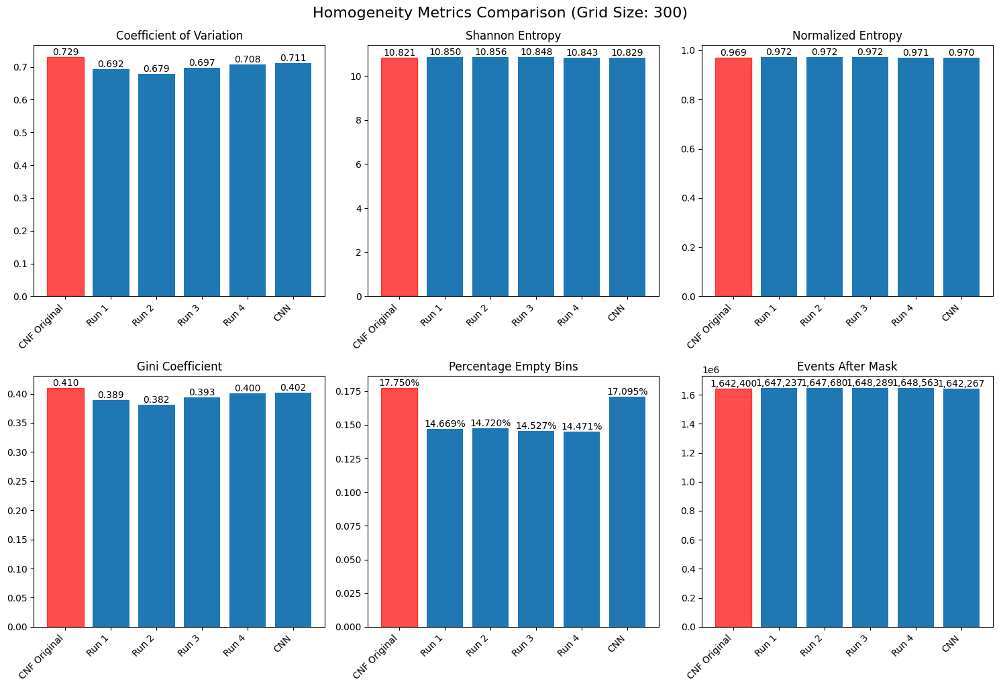


RANKINGS (1 = most homogeneous)

Coefficient of Variation:
  1. Run 2: 0.6793
  2. Run 1: 0.6920
  3. Run 3: 0.6965
  4. Run 4: 0.7080
  5. CNN: 0.7110
  6. CNF Original: 0.7295

Shannon Entropy:
  1. Run 2: 10.8559
  2. Run 1: 10.8497
  3. Run 3: 10.8483
  4. Run 4: 10.8432
  5. CNN: 10.8292
  6. CNF Original: 10.8207

Normalized Entropy:
  1. Run 2: 0.9722
  2. Run 1: 0.9717
  3. Run 3: 0.9715
  4. Run 4: 0.9711
  5. CNN: 0.9698
  6. CNF Original: 0.9691

Gini Coefficient:
  1. Run 2: 0.3816
  2. Run 1: 0.3894
  3. Run 3: 0.3933
  4. Run 4: 0.4002
  5. CNN: 0.4021
  6. CNF Original: 0.4102

Percentage Empty Bins:
  1. Run 4: 0.1447
  2. Run 3: 0.1453
  3. Run 1: 0.1467
  4. Run 2: 0.1472
  5. CNN: 0.1709
  6. CNF Original: 0.1775

IMPROVEMENT ANALYSIS
Improvement over CNF Original:

Run 1:
  CV improvement: 5.13%
  Normalized entropy improvement: 0.27%
  Gini improvement: 5.08%
  Empty bins improvement: 17.36%

Run 2:
  CV improvement: 6.87%
  Normalized entropy improvement: 0.32%
 

In [165]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt

# Your existing functions (assumed to be already defined)
# apply_rotated_x_mask, compute_bin_counts, coefficient_of_variation, etc.

def evaluate_homogeneity_metrics_fixed_bins(events, x_bins, y_bins, radius=66.4):
    """
    Evaluate homogeneity metrics using pre-defined bins (same for all datasets)
    """
    events = apply_rotated_x_mask(events)
    counts = compute_bin_counts(events, x_bins, y_bins, radius)
    
    cv = coefficient_of_variation(counts)
    entropy = shannon_entropy(counts)
    norm_entropy = normalized_entropy(counts)
    gini = gini_coefficient(counts)
    pct_empty = percentage_empty_bins(counts)
    
    return {
        'coefficient_of_variation': cv,
        'entropy': entropy,
        'normalized_entropy': norm_entropy,
        'gini_coefficient': gini,
        'percentage_empty_bins': pct_empty,
        'total_events': len(events),
        'total_events_after_mask': len(apply_rotated_x_mask(events))
    }

# Define position file names
pos_names = ['refit_1_encoder_simul_train.npz'] + \
           [f"iterative_encoder_search_{i}.npz" for i in range(3)] + \
           ["cnn_encoder.npz"]

# Create display names for better readability - INCLUDING CNF Original
display_names = [
    'CNF Original',  # Added for pos_cnf
    'Run 1',
    'Run 2', 
    'Run 3',
    'Run 4',
    'CNN'
]

# Fixed parameters
radius = 66.4
grid_size = 300

# Create fixed bins that will be used for all datasets
x_bins = np.linspace(-radius, radius, grid_size + 1)
y_bins = np.linspace(-radius, radius, grid_size + 1)

print(f"Using fixed bins: {grid_size}x{grid_size} grid")
print(f"Bin width: {(2*radius)/grid_size:.4f} cm")
print(f"Total bins in circle: approximately {np.pi * (grid_size/2)**2:.0f}")
print("="*60)

# Initialize results storage
results = []

# First, evaluate pos_cnf (original positions)
print(f"\nCNF Original (pos_cnf):")
try:
    # Evaluate metrics using fixed bins for pos_cnf
    metrics = evaluate_homogeneity_metrics_fixed_bins(pos_cnf, x_bins, y_bins, radius)
    
    # Add file info
    metrics['file_name'] = 'pos_cnf'
    metrics['display_name'] = 'CNF Original'
    
    results.append(metrics)
    
    # Print results for pos_cnf
    print(f"  Total events: {metrics['total_events']:,}")
    print(f"  Events after mask: {metrics['total_events_after_mask']:,}")
    print(f"  Coefficient of Variation: {metrics['coefficient_of_variation']:.4f}")
    print(f"  Shannon Entropy: {metrics['entropy']:.4f}")
    print(f"  Normalized Entropy: {metrics['normalized_entropy']:.4f}")
    print(f"  Gini Coefficient: {metrics['gini_coefficient']:.4f}")
    print(f"  Percentage Empty Bins: {metrics['percentage_empty_bins']:.3%}")
    
except Exception as e:
    print(f"Error processing pos_cnf: {e}")

# Then evaluate each position file
for pos_name, display_name in zip(pos_names, display_names[1:]):  # Skip first display name (used for pos_cnf)
    try:
        # Load position data
        pos_path = os.path.join(pos_refit_path, pos_name)
        pos = np.load(pos_path)['arr_0']
        
        # Evaluate metrics using fixed bins
        metrics = evaluate_homogeneity_metrics_fixed_bins(pos, x_bins, y_bins, radius)
        
        # Add file info
        metrics['file_name'] = pos_name
        metrics['display_name'] = display_name
        
        results.append(metrics)
        
        # Print results for this file
        print(f"\n{display_name} ({pos_name}):")
        print(f"  Total events: {metrics['total_events']:,}")
        print(f"  Events after mask: {metrics['total_events_after_mask']:,}")
        print(f"  Coefficient of Variation: {metrics['coefficient_of_variation']:.4f}")
        print(f"  Shannon Entropy: {metrics['entropy']:.4f}")
        print(f"  Normalized Entropy: {metrics['normalized_entropy']:.4f}")
        print(f"  Gini Coefficient: {metrics['gini_coefficient']:.4f}")
        print(f"  Percentage Empty Bins: {metrics['percentage_empty_bins']:.3%}")
        
    except FileNotFoundError:
        print(f"Warning: File {pos_name} not found, skipping...")
    except Exception as e:
        print(f"Error processing {pos_name}: {e}")

# Convert to DataFrame for easier analysis
df_results = pd.DataFrame(results)

print("\n" + "="*60)
print("SUMMARY TABLE")
print("="*60)
print(df_results[['display_name', 'coefficient_of_variation', 'normalized_entropy', 
                  'gini_coefficient', 'percentage_empty_bins']].round(4))

# Create comparison plots
if len(results) > 1:
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()
    
    metrics_to_plot = [
        ('coefficient_of_variation', 'Coefficient of Variation'),
        ('entropy', 'Shannon Entropy'),
        ('normalized_entropy', 'Normalized Entropy'),
        ('gini_coefficient', 'Gini Coefficient'),
        ('percentage_empty_bins', 'Percentage Empty Bins'),
        ('total_events_after_mask', 'Events After Mask')
    ]
    
    for i, (metric, title) in enumerate(metrics_to_plot):
        ax = axes[i]
        values = [r[metric] for r in results]
        names = [r['display_name'] for r in results]
        
        bars = ax.bar(range(len(values)), values)
        ax.set_title(title)
        ax.set_xticks(range(len(names)))
        ax.set_xticklabels(names, rotation=45, ha='right')
        
        # Color the first bar (CNF Original) differently
        bars[0].set_color('red')
        bars[0].set_alpha(0.7)
        
        # Add value labels on bars
        for bar, value in zip(bars, values):
            height = bar.get_height()
            if metric == 'percentage_empty_bins':
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{value:.3%}', ha='center', va='bottom')
            elif metric == 'total_events_after_mask':
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{int(value):,}', ha='center', va='bottom')
            else:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{value:.3f}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.suptitle(f'Homogeneity Metrics Comparison (Grid Size: {grid_size})', 
                 fontsize=16, y=1.02)
    plt.show()
    
    # Print ranking for each metric
    print("\n" + "="*60)
    print("RANKINGS (1 = most homogeneous)")
    print("="*60)
    
    for metric, title in metrics_to_plot[:-1]:  # Exclude event count
        if metric == 'percentage_empty_bins':
            # For empty bins, lower is better
            sorted_results = sorted(results, key=lambda x: x[metric])
        elif metric in ['coefficient_of_variation', 'gini_coefficient']:
            # For CV and Gini, lower is better (more homogeneous)
            sorted_results = sorted(results, key=lambda x: x[metric])
        else:
            # For entropy, higher is better (more homogeneous)
            sorted_results = sorted(results, key=lambda x: x[metric], reverse=True)
        
        print(f"\n{title}:")
        for rank, result in enumerate(sorted_results, 1):
            print(f"  {rank}. {result['display_name']}: {result[metric]:.4f}")

print("\n" + "="*60)
print("IMPROVEMENT ANALYSIS")
print("="*60)

# Calculate improvements relative to CNF Original
cnf_metrics = results[0]  # First result is CNF Original
print("Improvement over CNF Original:")
for i, result in enumerate(results[1:], 1):  # Skip CNF Original
    print(f"\n{result['display_name']}:")
    
    cv_improvement = ((cnf_metrics['coefficient_of_variation'] - result['coefficient_of_variation']) / 
                     cnf_metrics['coefficient_of_variation']) * 100
    print(f"  CV improvement: {cv_improvement:.2f}%")
    
    entropy_improvement = ((result['normalized_entropy'] - cnf_metrics['normalized_entropy']) / 
                          cnf_metrics['normalized_entropy']) * 100
    print(f"  Normalized entropy improvement: {entropy_improvement:.2f}%")
    
    gini_improvement = ((cnf_metrics['gini_coefficient'] - result['gini_coefficient']) / 
                       cnf_metrics['gini_coefficient']) * 100
    print(f"  Gini improvement: {gini_improvement:.2f}%")
    
    empty_improvement = ((cnf_metrics['percentage_empty_bins'] - result['percentage_empty_bins']) / 
                        cnf_metrics['percentage_empty_bins']) * 100
    print(f"  Empty bins improvement: {empty_improvement:.2f}%")

print(f"\nNote: All metrics computed using the same {grid_size}x{grid_size} bin grid")
print(f"Bin size: {(2*radius)/grid_size:.4f} cm × {(2*radius)/grid_size:.4f} cm")

# Generate LaTeX table
print("\n" + "="*60)
print("LATEX TABLE")
print("="*60)

def generate_latex_table(results):
    """Generate a LaTeX table from the results"""
    
    # Table header
    latex_code = r"""\begin{table}[htbp]
\centering
\caption{Homogeneity Metrics for Different Reconstruction Methods}
\label{tab:homogeneity_metrics}
\begin{tabular}{lccccc}
\toprule
Method & CV & Norm. Entropy & Gini Coeff. & Empty Bins (\%) & Events \\
\midrule
"""
    
    # Table rows
    for result in results:
        method = result['display_name'].replace('_', r'\_')  # Escape underscores
        cv = f"{result['coefficient_of_variation']:.3f}"
        norm_entropy = f"{result['normalized_entropy']:.3f}"
        gini = f"{result['gini_coefficient']:.3f}"
        empty_bins = f"{result['percentage_empty_bins']*100:.1f}"
        events = f"{result['total_events_after_mask']:,}"
        
        latex_code += f"{method} & {cv} & {norm_entropy} & {gini} & {empty_bins} & {events} \\\\\n"
    
    # Table footer
    latex_code += r"""\bottomrule
\end{tabular}
\end{table}"""
    
    return latex_code

# Generate and print the LaTeX table
latex_table = generate_latex_table(results)
print(latex_table)

# Also generate a more detailed table with all metrics
print("\n" + "="*40)
print("DETAILED LATEX TABLE")
print("="*40)

def generate_detailed_latex_table(results):
    """Generate a detailed LaTeX table with all metrics"""
    
    latex_code = r"""\begin{table}[htbp]
\centering
\caption{Detailed Homogeneity Metrics for Different Reconstruction Methods}
\label{tab:detailed_homogeneity_metrics}
\resizebox{\textwidth}{!}{%
\begin{tabular}{lcccccc}
\toprule
Method & CV & Shannon Entropy & Norm. Entropy & Gini Coeff. & Empty Bins (\%) & Events \\
\midrule
"""
    
    # Table rows
    for result in results:
        method = result['display_name'].replace('_', r'\_')
        cv = f"{result['coefficient_of_variation']:.4f}"
        entropy = f"{result['entropy']:.3f}"
        norm_entropy = f"{result['normalized_entropy']:.4f}"
        gini = f"{result['gini_coefficient']:.4f}"
        empty_bins = f"{result['percentage_empty_bins']*100:.2f}"
        events = f"{result['total_events_after_mask']:,}"
        
        latex_code += f"{method} & {cv} & {entropy} & {norm_entropy} & {gini} & {empty_bins} & {events} \\\\\n"
    
    latex_code += r"""\bottomrule
\end{tabular}%
}
\end{table}"""
    
    return latex_code

detailed_latex_table = generate_detailed_latex_table(results)
print(detailed_latex_table)

# Generate ranking table
print("\n" + "="*40)
print("RANKING LATEX TABLE")
print("="*40)

def generate_ranking_latex_table(results):
    """Generate a LaTeX table showing rankings for each metric"""
    
    latex_code = r"""\begin{table}[htbp]
\centering
\caption{Method Rankings by Homogeneity Metrics (1 = Best)}
\label{tab:homogeneity_rankings}
\begin{tabular}{lccccc}
\toprule
Method & CV Rank & Entropy Rank & Gini Rank & Empty Bins Rank & Overall Score \\
\midrule
"""
    
    # Calculate rankings for each metric
    metrics_info = [
        ('coefficient_of_variation', False),  # Lower is better
        ('normalized_entropy', True),         # Higher is better
        ('gini_coefficient', False),         # Lower is better
        ('percentage_empty_bins', False)     # Lower is better
    ]
    
    # Store rankings for each method
    method_rankings = {result['display_name']: {} for result in results}
    
    for metric, higher_better in metrics_info:
        sorted_results = sorted(results, key=lambda x: x[metric], reverse=higher_better)
        for rank, result in enumerate(sorted_results, 1):
            method_rankings[result['display_name']][metric] = rank
    
    # Calculate overall score (sum of ranks, lower is better)
    for method in method_rankings:
        ranks = list(method_rankings[method].values())
        method_rankings[method]['overall_score'] = sum(ranks)
    
    # Sort by overall score
    sorted_methods = sorted(method_rankings.items(), key=lambda x: x[1]['overall_score'])
    
    for method, rankings in sorted_methods:
        method_clean = method.replace('_', r'\_')
        cv_rank = rankings['coefficient_of_variation']
        entropy_rank = rankings['normalized_entropy']
        gini_rank = rankings['gini_coefficient']
        empty_rank = rankings['percentage_empty_bins']
        overall = rankings['overall_score']
        
        latex_code += f"{method_clean} & {cv_rank} & {entropy_rank} & {gini_rank} & {empty_rank} & {overall} \\\\\n"
    
    latex_code += r"""\bottomrule
\end{tabular}
\end{table}"""
    
    return latex_code

ranking_latex_table = generate_ranking_latex_table(results)
print(ranking_latex_table)

print("\nNote: Copy the LaTeX code above and paste it into your LaTeX document.")
print("Make sure to include \\usepackage{booktabs} in your document preamble for the table lines.")

In [32]:
radius = 66.4
grid_size = 300
print("rLCE Refit")
# Create fixed bins that will be used for all datasets
x_bins = np.linspace(-radius, radius, grid_size + 1)
y_bins = np.linspace(-radius, radius, grid_size + 1)

pos = np.load(os.path.join(pos_refit_path, "rLCE_encoder.npz"))['arr_0']
metrics = evaluate_homogeneity_metrics_fixed_bins(pos, x_bins, y_bins, radius)
metrics

rLCE Refit


{'coefficient_of_variation': 0.6967762365665331,
 'entropy': 10.850913172307278,
 'normalized_entropy': 0.9717788773007238,
 'gini_coefficient': 0.3920553208880146,
 'percentage_empty_bins': 0.14842688999547307,
 'total_events': 1643863,
 'total_events_after_mask': 1643863}

### Real Data CNN Strategy

- Train CNN (Shenyang) on real data

In [56]:
cnn_model = gen_mod_Shenayang()
cnn_model.get_layer("LossLayer").set_call_mode("exact", return_ratio = False)
cnn_model.get_layer("LossLayer").trainable = True

cnn_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate = 0.001))

cnn_model.fit(    {'xy':pos_cnf, 'pattern':patterns_real},
                        None,
                        epochs = 5, batch_size = 2**8, #  14
                        verbose = 1)
save_weights_to_dict(cnn_model, os.path.join(model_path, "CNN_Shenayang_Train.json"))


Epoch 1/5
7024/7024 [==============================] - 2628s 374ms/step - loss: 1.9950
Epoch 2/5
7024/7024 [==============================] - 2562s 365ms/step - loss: 1.9281
Epoch 3/5
7024/7024 [==============================] - 2571s 366ms/step - loss: 1.9241
Epoch 4/5
7024/7024 [==============================] - 2646s 377ms/step - loss: 1.9232
Epoch 5/5
7024/7024 [==============================] - 2735s 389ms/step - loss: 1.9229


In [17]:
# This is done no change expected
cnn_model = gen_mod_Shenayang()
cnn_model.get_layer("LossLayer").set_call_mode("exact", return_ratio = False)
cnn_model.get_layer("LossLayer").trainable = True
load_weights_from_dict(cnn_model, os.path.join(model_path, "CNN_Shenayang_Train.json"))
cnn_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate = 0.0001))

# And train with lr reductio
cnn_model.fit(    {'xy':pos_cnf[train_split], 'pattern':patterns_real[train_split]},
                        None,
                        validation_data = ({'xy':pos_cnf[val_split], 'pattern':patterns_real[val_split]}, None),
                        epochs = 10, batch_size = 2**8, #  14
                        verbose = 1)
save_weights_to_dict(cnn_model, os.path.join(model_path, "CNN_Shenayang_Train1.json"))


Epoch 1/10
4917/4917 [==============================] - 2158s 439ms/step - loss: 1.9200 - val_loss: 1.9203
Epoch 2/10
4917/4917 [==============================] - 2159s 439ms/step - loss: 1.9198 - val_loss: 1.9198
Epoch 3/10
4917/4917 [==============================] - 2160s 439ms/step - loss: 1.9197 - val_loss: 1.9197
Epoch 4/10
4917/4917 [==============================] - 2160s 439ms/step - loss: 1.9197 - val_loss: 1.9196
Epoch 5/10
4917/4917 [==============================] - 2161s 440ms/step - loss: 1.9197 - val_loss: 1.9196
Epoch 6/10
4917/4917 [==============================] - 2160s 439ms/step - loss: 1.9196 - val_loss: 1.9196
Epoch 7/10
4917/4917 [==============================] - 2161s 440ms/step - loss: 1.9196 - val_loss: 1.9196
Epoch 8/10
2822/4917 [================>.............] - ETA: 12:59 - loss: 1.9210

KeyboardInterrupt: 

In [15]:
cnn_model = gen_mod_Shenayang()
cnn_model.get_layer("LossLayer").set_call_mode("exact", return_ratio = False)
load_weights_from_dict(cnn_model, os.path.join(model_path, "CNN_Shenayang_Train1.json"))
cnn_model.get_layer("LossLayer").trainable = True
cnn_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate = 0.00001))

# And train with lr reductio
cnn_model.fit(    {'xy':pos_cnf[train_split], 'pattern':patterns_real[train_split]},
                        None,
                        validation_data=({'xy':pos_cnf[val_split], 'pattern':patterns_real[val_split]}, None),
                        epochs = 5, batch_size = 2**8, #  14
                        verbose = 1)
save_weights_to_dict(cnn_model, os.path.join(model_path, "CNN_Shenayang_Train2.json"))


Epoch 1/5
4917/4917 [==============================] - 2086s 424ms/step - loss: 1.9194 - val_loss: 1.9189
Epoch 2/5
4917/4917 [==============================] - 2070s 421ms/step - loss: 1.9194 - val_loss: 1.9189
Epoch 3/5
4917/4917 [==============================] - 2106s 428ms/step - loss: 1.9193 - val_loss: 1.9189
Epoch 4/5
4917/4917 [==============================] - 2192s 446ms/step - loss: 1.9193 - val_loss: 1.9189
Epoch 5/5
4917/4917 [==============================] - 2125s 432ms/step - loss: 1.9193 - val_loss: 1.9189


In [16]:
cnn_model = gen_mod_Shenayang()
load_weights_from_dict(cnn_model, os.path.join(model_path, "CNN_Shenayang_Train2.json"))
cnn_model.get_layer("LossLayer").set_call_mode("LUT_untrainable_std", return_ratio = True)
cnn_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate = 0.001))
pred = cnn_model.predict({'xy':pos_cnf, 'pattern':patterns_real},)
np.mean(np.mean(pred,axis=-1)), np.median(np.mean(pred,axis=-1)), np.std(np.mean(pred,axis=-1)), np.min(np.mean(pred,axis=-1))

56191/56191 [==============================] - 197s 4ms/step


(1.2376144, 1.2304783, 0.43355232, 0.7398826)

In [17]:
# Do grid Search and encoder

pos = do_grid_search(pos_cnf, patterns_real, cnn_model, min_resolution, start_factor=0, use_mean=True)
np.savez(os.path.join(pos_refit_path, "cnn_grid_search.npz"), pos)
pred = cnn_model.predict({'xy':pos, 'pattern':patterns_real},)
np.mean(np.mean(pred,axis=-1)), np.median(np.mean(pred,axis=-1)), np.std(np.mean(pred,axis=-1)), np.min(np.mean(pred,axis=-1))

56191/56191 [==============================] - 208s 4ms/step
Resolution 1.0 : Factor 0
56191/56191 [==============================] - 204s 4ms/step
Resolution 0.5 : Factor 1
56191/56191 [==============================] - 212s 4ms/step
Resolution 0.25 : Factor 2
56191/56191 [==============================] - 210s 4ms/step
Resolution 0.125 : Factor 3
56191/56191 [==============================] - 214s 4ms/step
Resolution 0.0625 : Factor 4
56191/56191 [==============================] - 219s 4ms/step
Resolution 0.03125 : Factor 5
56191/56191 [==============================] - 204s 4ms/step
Resolution 0.015625 : Factor 6
56191/56191 [==============================] - 207s 4ms/step


(1.2250099, 1.2181065, 0.39228305, 0.7345664)

In [19]:
# Do encoder
pos_ref_model = cnn_model

encoder_model = make_encoder(pos_ref_model, pos, patterns_real)

for layer in encoder_model.layers:
    if layer.name != "embed_pos":
        layer.trainable = False
    else:
        layer.trainable = True

encoder_model.compile(optimizer=tfa.optimizers.LAMB(learning_rate=0.001))


def tmp():
    n_tot = len(pos)
    loss    = tf.reduce_mean(encoder_model.predict(np.arange(n_tot)), axis=-1)
    return loss

base_loss =tmp()

def scheduler(epoch, lr):
    return lr * 0.5

def tmp(encoder_model, positions, loss, min_resolution):
    n_tot = len(positions)
    new_pos = tensorflow.identity(positions)
    print("Starting Likelihood")
    print(tf.math.reduce_mean(loss))
    for i in range(5):
        print("Jagged iter {}".format(i))
        # Random pos shift in range [-1, 1) cm then reshifted to rnge min_resolution*2
        noise_pos = tensorflow.identity(positions) + (np.random.rand(*new_pos.numpy().shape) - 0.5)*2 * (2*min_resolution)
        # Update and fit encoder model positions
        encoder_model.get_layer('embed_pos').set_weights([noise_pos])
        # Compile and fit
        encoder_model.compile(optimizer = keras.optimizers.AdamW(learning_rate=1e-3))

        lr_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
        encoder_model.fit(x = np.arange(n_tot), 
                        epochs = 2, batch_size = 2**8,
                        callbacks=[lr_callback], verbose = 1) 
        noise_pos = encoder_model.get_layer('embed_pos').get_weights()[0]
        # Check result of new pos
        jittered_loss = tf.reduce_mean(encoder_model.predict(np.arange(n_tot)), axis=-1)

        better = jittered_loss < loss
        print("Fraction Better: {}".format(np.sum(better)/len(better)))
        loss =    tensorflow.where(better, jittered_loss, loss) 
        print("New Likelihood")
        print(tf.math.reduce_mean(loss))
        new_pos = tensorflow.where(tensorflow.expand_dims(better, axis=-1), noise_pos, new_pos) 
    
    return new_pos

encoder_pos = tmp(encoder_model, pos, base_loss, min_resolution)
np.savez(os.path.join(pos_refit_path, "cnn_encoder.npz"), encoder_pos)

56191/56191 [==============================] - 200s 4ms/step
Starting Likelihood
tf.Tensor(1.2250098, shape=(), dtype=float32)
Jagged iter 0
Epoch 1/2
7024/7024 [==============================] - 466s 66ms/step - loss: 1.2461 - lr: 5.0000e-04
Epoch 2/2
56191/56191 [==============================] - 181s 3ms/step
Fraction Better: 0.0010839176978900589
New Likelihood
tf.Tensor(1.2250073, shape=(), dtype=float32)
Jagged iter 1
Epoch 1/2
7024/7024 [==============================] - 460s 65ms/step - loss: 1.2461 - lr: 5.0000e-04
Epoch 2/2
56191/56191 [==============================] - 205s 4ms/step
Fraction Better: 0.0008297615214222513
New Likelihood
tf.Tensor(1.2250063, shape=(), dtype=float32)
Jagged iter 2
Epoch 1/2
7024/7024 [==============================] - 446s 63ms/step - loss: 1.2461 - lr: 5.0000e-04
Epoch 2/2
56191/56191 [==============================] - 218s 4ms/step
Fraction Better: 0.0006695930776088408
New Likelihood
tf.Tensor(1.2250057, shape=(), dtype=float32)
Jagged iter 

<Axes: xlabel='X Position', ylabel='Y Position'>

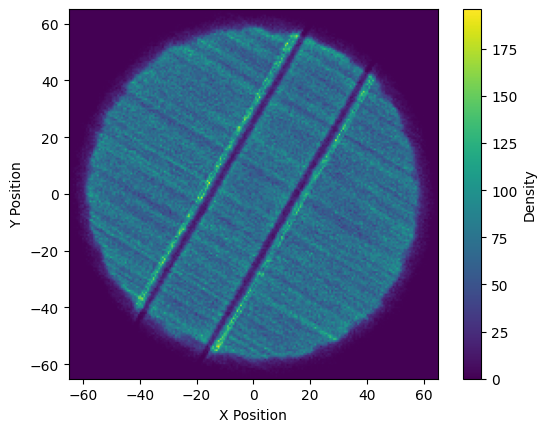

In [20]:
do_density_plot(plt.gca(), encoder_pos,bins=200)

In [30]:
# Quickly evalaute the baseline loss expected for the final variance distribution 
with open(os.path.join(model_path, "CNN_Shenayang_Train2.json")) as f:
    weights = json.load(f)

std = np.array(weights['LossLayer/GaussianStandardDeviation:0'] )
p_dpe = 0.2
std_gauss = 0.5
def gen_signal(expectation):
    # Poisson
    signal = np.random.poisson(expectation, size=expectation.shape)
    # Binom
    signal += np.random.binomial(n=signal, p=p_dpe, size=expectation.shape)
    # Add noise to signal
    scales = std[np.newaxis, :] * np.sqrt(signal)
    signal = np.random.normal(loc=signal, scale=scales, size=signal.shape)
    return signal

n_events = 10_000
theta = np.random.uniform(0, 2*np.pi, size=(n_events,))
r = np.sqrt(np.random.uniform(0, 1, size=(n_events,))) * 66.4
pos_sim = np.column_stack((r * np.cos(theta), r * np.sin(theta)))
split = 0.7
ns = np.arange(n_events)
np.random.shuffle(ns)
train_split_sim = ns[:int(split*n_events)]
val_split_sim = ns[int(split*n_events):]

expected_tot_photons = np.random.normal(loc=5_000, scale=950, size=(n_events,))

patterns_sim = make_mcMap_model().predict(pos_sim)
patterns_sim = patterns_sim / patterns_sim.sum(axis=-1,keepdims = True) 
patterns_obs = patterns_sim * expected_tot_photons.reshape(-1, 1)
# Add the noise component
patterns_obs = gen_signal(patterns_obs)

313/313 [==============================] - 1s 2ms/step


In [31]:
loss_layer = LikelihoodRatio(   n_pmts=n_alive_pmts, 
                                    return_ratio=False,
                                    switching_signal=40, 
                                    n_sigma=5, # Sigma range for Poisson and Binom sums
                                    sigma_min = 0.5, # Minimum std
                                    sigma_max = 1.0, # Maximum std
                                    z=10, # Number of std steps
                                    p_dpe=0.2, 
                                    nan_safe=False, # replaces nan inputs with high loss
                                    nan_safe_value = 1e5, 
                                    m=10, # x & mu integer subdivisions
                                    name="LossLayer")
loss_layer.set_call_mode("LUT_untrainable_std", return_ratio = True)
input_pattern1 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern1', dtype=tf.float32)
input_pattern2 = tf.keras.layers.Input(shape=(n_alive_pmts,), name='pattern2', dtype=tf.float32)
out = loss_layer(input_pattern1, input_pattern2)
loss_model = tf.keras.Model(inputs=(input_pattern1, input_pattern2), outputs=(out))
loss_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001))
loss_LUT = loss_model.predict({'pattern1':patterns_sim[val_split_sim], 'pattern2':patterns_obs[val_split_sim]},)
print("LUT",np.mean(loss_LUT))
print("LUT median", np.median(np.mean(loss_LUT, axis=-1)))

94/94 [==============================] - 0s 2ms/step
LUT 1.2251248
LUT median 1.2213324


## Training with anode mesh including the theta parameter before it was ruled not usable 

- Only remaining Sequential code

In [407]:
test = gen_model(seed=0, starting_model=None, 
                 include_wall = True, include_perp = True, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)

test.get_layer('LossLayer').set_call_mode("exact", return_ratio = True)

test.compile(optimizer=tfa.optimizers.LAMB(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))
test = load_weights_from_dict(test, os.path.join(model_path, "PseudoMCDatTrain.json"))

test.get_layer("PMTDistance_Pattern_Response").trainable = False
test.get_layer("Wall_Reflection_Pattern_Response").trainable = False
test.get_layer("AddReflectionContribution").trainable = False
test.get_layer("i0").trainable = False

test.fit(   {'xy':pos_sim[train_split_sim][::], 'pattern':patterns_obs[train_split_sim][::]},
            None,
            validation_data = ({'xy':pos_sim[val_split_sim], 'pattern':patterns_obs[val_split_sim]}, None),  
            epochs = 100, batch_size = 2**8, #  14
            callbacks=[c1, c2], verbose = 1)

test.load_weights(model_checkpoint_path)


save_weights_to_dict(test, os.path.join(model_path, "PseudoMCDatTrainAnode.json"))

Epoch 1 Begin learning rate = 0.001000
Epoch 1/100
28/28 [==============================] - 23s 731ms/step - loss: 1.2414 - val_loss: 1.1979 - lr: 0.0010
Epoch 2 Begin learning rate = 0.001000
Epoch 2/100
28/28 [==============================] - 20s 706ms/step - loss: 1.2425 - val_loss: 1.1979 - lr: 0.0010
Epoch 3 Begin learning rate = 0.001000
Epoch 3/100
28/28 [==============================] - 20s 708ms/step - loss: 1.2428 - val_loss: 1.1970 - lr: 0.0010
Epoch 4 Begin learning rate = 0.001000
Epoch 4/100
28/28 [==============================] - 20s 708ms/step - loss: 1.2420 - val_loss: 1.1971 - lr: 0.0010
Epoch 5 Begin learning rate = 0.001000
Epoch 5/100
28/28 [==============================] - 20s 705ms/step - loss: 1.2420 - val_loss: 1.1973 - lr: 0.0010
Epoch 6 Begin learning rate = 0.001000
Epoch 6/100
28/28 [==============================] - ETA: 0s - loss: 1.2408Epoch 6 end learning rate = 0.001000
Backtracking to best model before reducting LR

Epoch 00006: ReduceLROnPlateau 

2813/2813 [==============================] - 6s 2ms/step


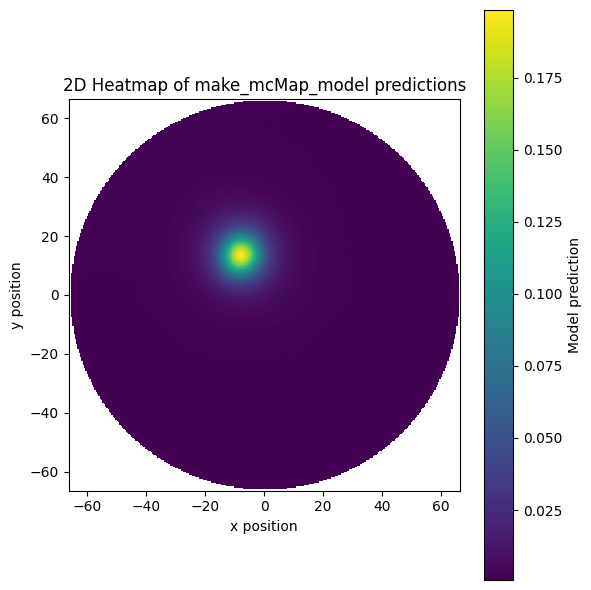

In [ ]:
def tmp(i):
    import numpy as np
    import matplotlib.pyplot as plt

    # 1) Instantiate your MC map model
    model = make_mcMap_model()

    # 2) Define the circle radius and grid resolution
    radius = 66.4
    grid_N = 300  # adjust for finer/coarser grid

    # 3) Create a homogeneous grid over [-radius, radius]²
    x = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    y = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    xg, yg = np.meshgrid(x, y)  # shape [grid_N, grid_N]

    # 4) Flatten positions for prediction
    pos = np.stack([xg.ravel(), yg.ravel()], axis=1)  # shape [grid_N², 2]

    # 5) Predict values on the grid
    vals = model.predict(pos)[:,i]  # returns shape [grid_N²,] or [grid_N², 1]
    vals = vals.ravel().reshape(grid_N, grid_N)

    # 6) Mask out points outside the circle
    mask = (xg**2 + yg**2) > radius**2
    vals[mask] = np.nan

    # 7) Plot the heatmap
    plt.figure(figsize=(6,6))
    im = plt.imshow(
        vals.T, 
        origin='lower',
        extent=[-radius, radius, -radius, radius],
        aspect='equal',
        cmap='viridis'
    )
    cbar = plt.colorbar(im)
    cbar.set_label('Model prediction')
    plt.title('2D Heatmap of make_mcMap_model predictions')
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.tight_layout()
    plt.show()
# PMT under the perpendicular wire parametrization 
tmp(124-3)

In [410]:
# Eval on Real Data
test = gen_model(seed=0, starting_model=None,
                    include_wall = True, include_perp = True, include_anode = True, 
                    multiplication_layers=True, radialLCE=False, monodense=True)
test.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
load_weights_from_dict(test, os.path.join(model_path, "PseudoMCDatTrainAnode.json"))
test.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))
print("CNF Pos")
test.evaluate({'xy':pos_cnf[val_split][::], 'pattern':patterns_real[val_split][::]},
            None,
            batch_size = 2**10, #  14
            verbose = 1)
# Previous : 2.272078275680542

CNF Pos
527/527 [==============================] - 114s 215ms/step - loss: 2.2721


2.272078275680542

In [17]:
# Train on real data

model_checkpoint_path = "/tmp/checkpoint"
c1 = keras.callbacks.ModelCheckpoint(model_checkpoint_path, 
                            save_best_only=True,
                            monitor='val_loss',
                            save_weights_only=True,
                            save_freq="epoch")
c2 = ReduceLRBacktrack( best_path=model_checkpoint_path, 
                        monitor="val_loss",
                        factor=0.2,
                        patience=3,
                        min_lr=1e-10,
                        verbose=1)

test = gen_model(seed=0, starting_model=None, 
                 include_wall = True, include_perp = True, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)

test.get_layer('LossLayer').set_call_mode("exact", return_ratio = True)
load_weights_from_dict(test, os.path.join(model_path, "PseudoMCDatTrain.h5"))

def sched(epoch, lr):
    return 0.01 * (0.1 ** (epoch // 2))

lr_cb = tf.keras.callbacks.LearningRateScheduler(sched)

test.compile(optimizer=tfa.optimizers.LAMB(learning_rate = 0.01))#keras.optimizers.AdamW(learning_rate=0.001))

test.fit(   {'xy':pos_cnf[train_split][::], 'pattern':patterns_real[train_split][::]},
            None,
            validation_data = ({'xy':pos_cnf[val_split], 'pattern':patterns_real[val_split]}, None),  
            epochs = 2*6, batch_size = 2**10, #  14
            callbacks=[lr_cb], verbose = 1)
# 6 runs so 1e-2 * 0.1^6 = 1e-8

save_weights_to_dict(test, os.path.join(model_path, "RetrainExact.json"))

Epoch 1/12
1230/1230 [==============================] - 3505s 3s/step - loss: 1.6874 - val_loss: 1.7955 - lr: 0.0100
Epoch 2/12
1230/1230 [==============================] - 3480s 3s/step - loss: 1.6803 - val_loss: 1.7284 - lr: 0.0100
Epoch 3/12
1230/1230 [==============================] - 3479s 3s/step - loss: 1.6519 - val_loss: 1.6678 - lr: 0.0010
Epoch 4/12
1230/1230 [==============================] - 3480s 3s/step - loss: 1.6486 - val_loss: 1.6682 - lr: 0.0010
Epoch 5/12
1230/1230 [==============================] - 3480s 3s/step - loss: 1.6472 - val_loss: 1.6666 - lr: 1.0000e-04
Epoch 6/12
1230/1230 [==============================] - 3479s 3s/step - loss: 1.6472 - val_loss: 1.6663 - lr: 1.0000e-04
Epoch 7/12
1230/1230 [==============================] - 3479s 3s/step - loss: 1.6468 - val_loss: 1.6662 - lr: 1.0000e-05
Epoch 8/12
1230/1230 [==============================] - 3480s 3s/step - loss: 1.6476 - val_loss: 1.6662 - lr: 1.0000e-05
Epoch 9/12
1230/1230 [==========================

2813/2813 [==============================] - 20s 7ms/step


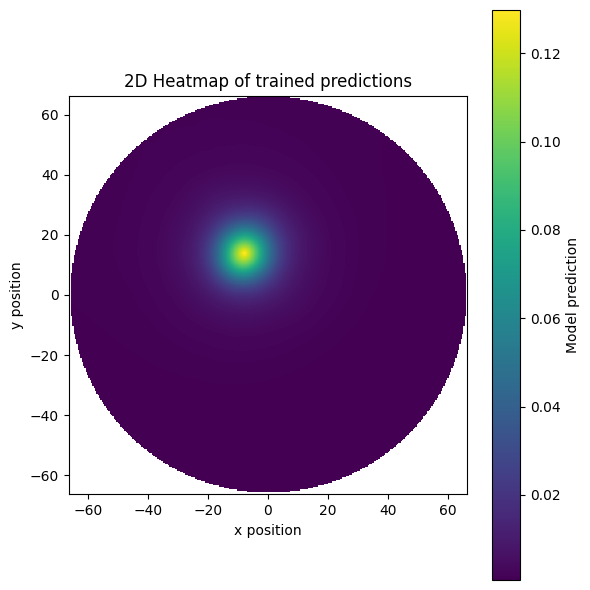

In [20]:
def tmp(i):
    import numpy as np
    import matplotlib.pyplot as plt

    # 1) Instantiate your MC map model
    model = keras.Model(inputs=test.get_layer("xy").input, outputs=test.get_layer("normalization").output)

    # 2) Define the circle radius and grid resolution
    radius = 66.4
    grid_N = 300  # adjust for finer/coarser grid

    # 3) Create a homogeneous grid over [-radius, radius]²
    x = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    y = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    xg, yg = np.meshgrid(x, y)  # shape [grid_N, grid_N]

    # 4) Flatten positions for prediction
    pos = np.stack([xg.ravel(), yg.ravel()], axis=1)  # shape [grid_N², 2]

    # 5) Predict values on the grid
    vals = model.predict(pos)[:,i]  # returns shape [grid_N²,] or [grid_N², 1]
    vals = vals.ravel().reshape(grid_N, grid_N)

    # 6) Mask out points outside the circle
    mask = (xg**2 + yg**2) > radius**2
    vals[mask] = np.nan

    # 7) Plot the heatmap
    plt.figure(figsize=(6,6))
    im = plt.imshow(
        vals.T, 
        origin='lower',
        extent=[-radius, radius, -radius, radius],
        aspect='equal',
        cmap='viridis'
    )
    cbar = plt.colorbar(im)
    cbar.set_label('Model prediction')
    plt.title('2D Heatmap of trained predictions')
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.tight_layout()
    plt.show()
# PMT under the perpendicular wire parametrization 
tmp(124-3)

In [110]:
# Anode mesh still does not predict anything - changed activations, kernel inits and added Dropout 
# Load the trained model without anode and perp and then assign as starting point for new init
test = gen_model(seed=0, starting_model=None,
                 include_wall = True, include_perp = False, include_anode = False, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
load_weights_from_dict(test, os.path.join(model_path, "RetrainExact.json"))
test = gen_model(seed=0, starting_model=test,
                 include_wall = True, include_perp = False, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)

test.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
# Loading wieghts overwrites this apparently
test.get_layer('LossLayer').nan_safe.assign(False)

epochs = 4
bs = 2**8
steps_per_epoch = len(train_split)//(bs)+1
total_steps = epochs * steps_per_epoch
initial_lr = 1e-3
final_lr   = 1e-6
decay_rate = final_lr/initial_lr 

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_lr,
    decay_steps=total_steps,
    decay_rate=decay_rate,
    staircase=False,           # smooth
)

test.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = lr_schedule),
             )#keras.optimizers.AdamW(learning_rate=0.001))
test.get_layer("PMTDistance_Pattern_Response").trainable = False
test.get_layer("Wall_Reflection_Pattern_Response").trainable = False
test.get_layer("AddReflectionContribution").trainable = False
test.get_layer("i0").trainable = False

test.fit(   {'xy':pos_cnf[train_split][::], 'pattern':patterns_real[train_split][::]},
            None,
            validation_data = ({'xy':pos_cnf[val_split], 'pattern':patterns_real[val_split]}, None),  
            epochs = epochs, batch_size = bs, #  14
            callbacks=[], verbose = 1)
        
save_weights_to_dict(test, os.path.join(model_path, "RetrainExactAnode2.json"))

Epoch 1/4
4917/4917 [==============================] - 2198s 446ms/step - loss: 2.0562 - val_loss: 2.0642
Epoch 2/4
4917/4917 [==============================] - 2191s 446ms/step - loss: 2.0539 - val_loss: 1.8802
Epoch 3/4
4917/4917 [==============================] - 2193s 446ms/step - loss: 2.0536 - val_loss: 2.0636
Epoch 4/4
4917/4917 [==============================] - 2243s 456ms/step - loss: 2.0538 - val_loss: 2.0636


1/1 [==============================] - 0s 105ms/step


<Axes: title={'center': 'Retrained Anode'}, xlabel='X position (cm)', ylabel='Y position (cm)'>

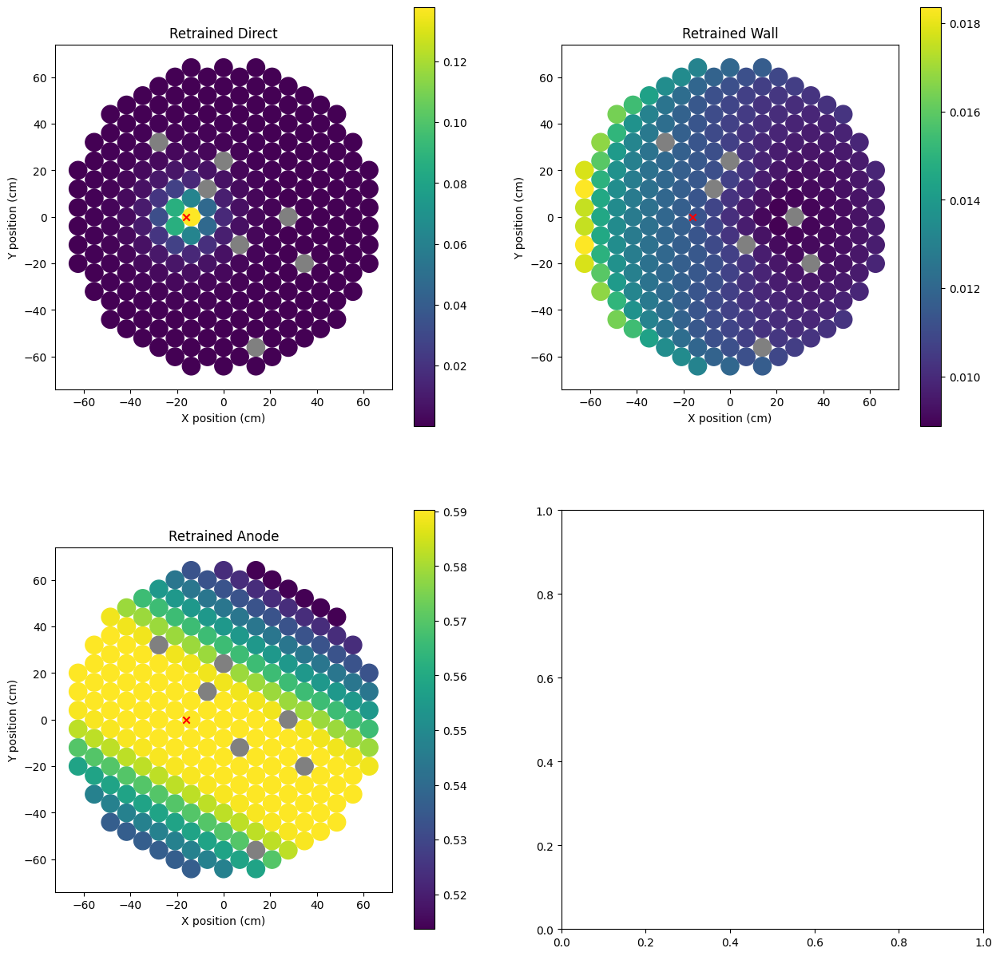

In [117]:
coord = [-16,0]
test = gen_model(seed=0, starting_model=test,
                 include_wall = True, include_perp = False, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
load_weights_from_dict(test, os.path.join(model_path, "RetrainExactAnode2.json"))

fig, ax = plt.subplots(2, 2, figsize=(15, 15))
ax = ax.flatten()
tmp = np.zeros(len(not_dead_pmts)+len(dead_pmts))
tmp[not_dead_pmts] = test.get_layer("PMTDistance_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[0], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Direct")
tmp[not_dead_pmts] = test.get_layer("Wall_Reflection_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[1], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Wall")
tmp[not_dead_pmts] = test.get_layer("Anode_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[2], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Anode")
#tmp[not_dead_pmts] = test.get_layer("PerpendicularWire_Pattern_Response").predict([coord])[0]
#plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[3], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Perp")

2813/2813 [==============================] - 18s 6ms/step


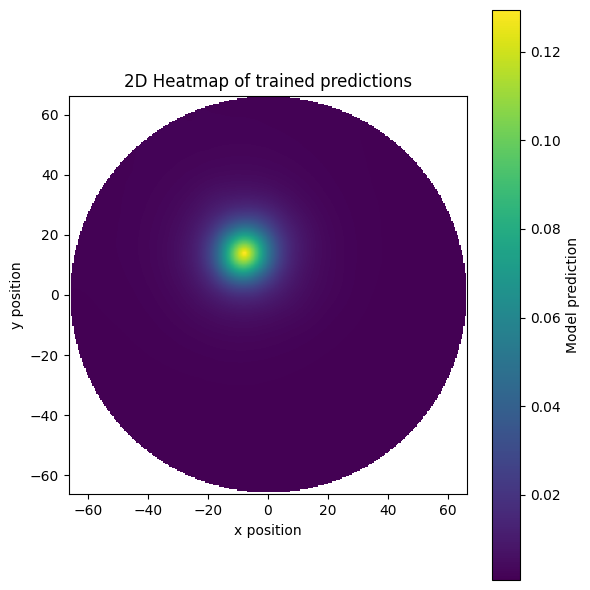

In [118]:
def tmp(i):
    import numpy as np
    import matplotlib.pyplot as plt

    # 1) Instantiate your MC map model
    model = keras.Model(inputs=test.get_layer("xy").input, outputs=test.get_layer("normalization").output)

    # 2) Define the circle radius and grid resolution
    radius = 66.4
    grid_N = 300  # adjust for finer/coarser grid

    # 3) Create a homogeneous grid over [-radius, radius]²
    x = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    y = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    xg, yg = np.meshgrid(x, y)  # shape [grid_N, grid_N]

    # 4) Flatten positions for prediction
    pos = np.stack([xg.ravel(), yg.ravel()], axis=1)  # shape [grid_N², 2]

    # 5) Predict values on the grid
    vals = model.predict(pos)[:,i]  # returns shape [grid_N²,] or [grid_N², 1]
    vals = vals.ravel().reshape(grid_N, grid_N)

    # 6) Mask out points outside the circle
    mask = (xg**2 + yg**2) > radius**2
    vals[mask] = np.nan

    # 7) Plot the heatmap
    plt.figure(figsize=(6,6))
    im = plt.imshow(
        vals.T, 
        origin='lower',
        extent=[-radius, radius, -radius, radius],
        aspect='equal',
        cmap='viridis'
    )
    cbar = plt.colorbar(im)
    cbar.set_label('Model prediction')
    plt.title('2D Heatmap of trained predictions')
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.tight_layout()
    plt.show()
# PMT under the perpendicular wire parametrization 
tmp(124-3)

In [121]:
# Anode mesh still does not predict anything - changed activations, kernel inits and added Dropout 
# Load the trained model without anode and perp and then assign as starting point for new init
test = gen_model(seed=0, starting_model=None,
                 include_wall = True, include_perp = False, include_anode = False, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
load_weights_from_dict(test, os.path.join(model_path, "RetrainExactAnode2.json"))
test = gen_model(seed=0, starting_model=test,
                 include_wall = True, include_perp = True, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)

test.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
# Loading wieghts overwrites this apparently
test.get_layer('LossLayer').nan_safe.assign(False)

epochs = 4
bs = 2**8
steps_per_epoch = len(train_split)//(bs)+1
total_steps = epochs * steps_per_epoch
initial_lr = 1e-3
final_lr   = 1e-7
decay_rate = final_lr/initial_lr 

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_lr,
    decay_steps=total_steps,
    decay_rate=decay_rate,
    staircase=False,           # smooth
)

test.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = lr_schedule),
             )#keras.optimizers.AdamW(learning_rate=0.001))
test.get_layer("PMTDistance_Pattern_Response").trainable = False
test.get_layer("Wall_Reflection_Pattern_Response").trainable = False
test.get_layer("AddReflectionContribution").trainable = False
test.get_layer("i0").trainable = False
test.get_layer("Anode_Pattern_Response").trainable = False

test.fit(   {'xy':pos_cnf[train_split][::], 'pattern':patterns_real[train_split][::]},
            None,
            validation_data = ({'xy':pos_cnf[val_split], 'pattern':patterns_real[val_split]}, None),  
            epochs = epochs, batch_size = bs, #  14
            callbacks=[], verbose = 1)
        
save_weights_to_dict(test, os.path.join(model_path, "RetrainExactPerp1.json"))

Epoch 1/4
4917/4917 [==============================] - 2470s 502ms/step - loss: 2.0575 - val_loss: 2.0674
Epoch 2/4
4917/4917 [==============================] - 2435s 495ms/step - loss: 2.0549 - val_loss: 1.8813
Epoch 3/4
4917/4917 [==============================] - 2435s 495ms/step - loss: 2.0543 - val_loss: 2.0648
Epoch 4/4
4917/4917 [==============================] - 2419s 492ms/step - loss: 2.0546 - val_loss: 2.0648


In [138]:
# Anode mesh still does not predict anything - changed activations, kernel inits and added Dropout 
# Load the trained model without anode and perp and then assign as starting point for new init
test = gen_model(seed=0, starting_model=None,
                 include_wall = True, include_perp = False, include_anode = False, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
load_weights_from_dict(test, os.path.join(model_path, "RetrainExactAnode2.json"))
test = gen_model(seed=0, starting_model=test,
                 include_wall = True, include_perp = True, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)

test.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
# Loading wieghts overwrites this apparently
test.get_layer('LossLayer').nan_safe.assign(False)

epochs = 10
bs = 2**8
steps_per_epoch = len(train_split)//(bs)+1
total_steps = epochs * steps_per_epoch
initial_lr = 1e-3
final_lr   = 1e-7
decay_rate = final_lr/initial_lr 

model_checkpoint_path = "/tmp/checkpoint"
c1 = keras.callbacks.ModelCheckpoint(model_checkpoint_path, 
                            save_best_only=True,
                            monitor='val_loss',
                            save_weights_only=True,
                            save_freq="epoch")

lrs = [1e-3, 1e-4, 1e-5, 1e-6]   
epochs_per_phase = 5
epoch_start = 0

optimizer = tfa.optimizers.LAMB(learning_rate = 1.)

test.compile(optimizer=optimizer,
             )#keras.optimizers.AdamW(learning_rate=0.001))

for lr in lrs:
    # 1) assign new LR on the existing optimizer
    optimizer.learning_rate.assign(lr)
    print(f"Training epochs {epoch_start} → {epoch_start+epochs_per_phase} @ lr={lr:.1e}")

    
    test.fit(   
        {'xy':pos_cnf[train_split][::], 'pattern':patterns_real[train_split][::]},
            None,
            validation_data = ({'xy':pos_cnf[val_split], 'pattern':patterns_real[val_split]}, None),  
            initial_epoch=epoch_start,
            epochs=epoch_start + epochs_per_phase,
            batch_size = bs, #  14
            callbacks=[c1], verbose = 1)

    epoch_start += epochs_per_phase




        
save_weights_to_dict(test, os.path.join(model_path, "RetrainExactPerp1.json"))
# And save the checkpoint 
test.load_weights(model_checkpoint_path)
save_weights_to_dict(test, os.path.join(model_path, "RetrainExactPerp1_callback.json"))



Training epochs 0 → 5 @ lr=1.0e-03
Epoch 1/5
4917/4917 [==============================] - 2372s 482ms/step - loss: 2.0583 - val_loss: 2.0654
Epoch 2/5
4917/4917 [==============================] - 2368s 482ms/step - loss: 2.0539 - val_loss: 1.8807
Epoch 3/5
4917/4917 [==============================] - 2367s 481ms/step - loss: 2.0530 - val_loss: 2.0650
Epoch 4/5
4917/4917 [==============================] - 2368s 482ms/step - loss: 2.0523 - val_loss: 2.0626
Epoch 5/5
4917/4917 [==============================] - 2370s 482ms/step - loss: 2.0513 - val_loss: 2.0628
Training epochs 5 → 10 @ lr=1.0e-04
Epoch 6/10
4917/4917 [==============================] - 2377s 484ms/step - loss: 2.0491 - val_loss: 2.0622
Epoch 7/10
4917/4917 [==============================] - 2375s 483ms/step - loss: 2.0488 - val_loss: 2.0625
Epoch 8/10
4917/4917 [==============================] - 2375s 483ms/step - loss: 2.0482 - val_loss: 2.0620
Epoch 9/10
4917/4917 [==============================] - 2375s 483ms/step - los

In [144]:
test = gen_model(seed=0, starting_model=None,
                 include_wall = True, include_perp = True, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
test.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
test.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))
load_weights_from_dict(test, os.path.join(model_path, "RetrainExactPerp1.json"))
test.evaluate({'xy':pos_cnf, 'pattern':patterns_real},
            None,
            batch_size = 2**6, #  14
            verbose = 1)
test = gen_model(seed=0, starting_model=None,
                 include_wall = True, include_perp = True, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
test.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
load_weights_from_dict(test, os.path.join(model_path, "RetrainExactPerp1_callback.json"))
test.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))
test.evaluate({'xy':pos_cnf, 'pattern':patterns_real},
            None,
            batch_size = 2**6, #  14
            verbose = 1)

28096/28096 [==============================] - 409s 15ms/step - loss: 1.7308


1.7308440208435059

1/1 [==============================] - 0s 107ms/step


<Axes: title={'center': 'Retrained Perp'}, xlabel='X position (cm)', ylabel='Y position (cm)'>

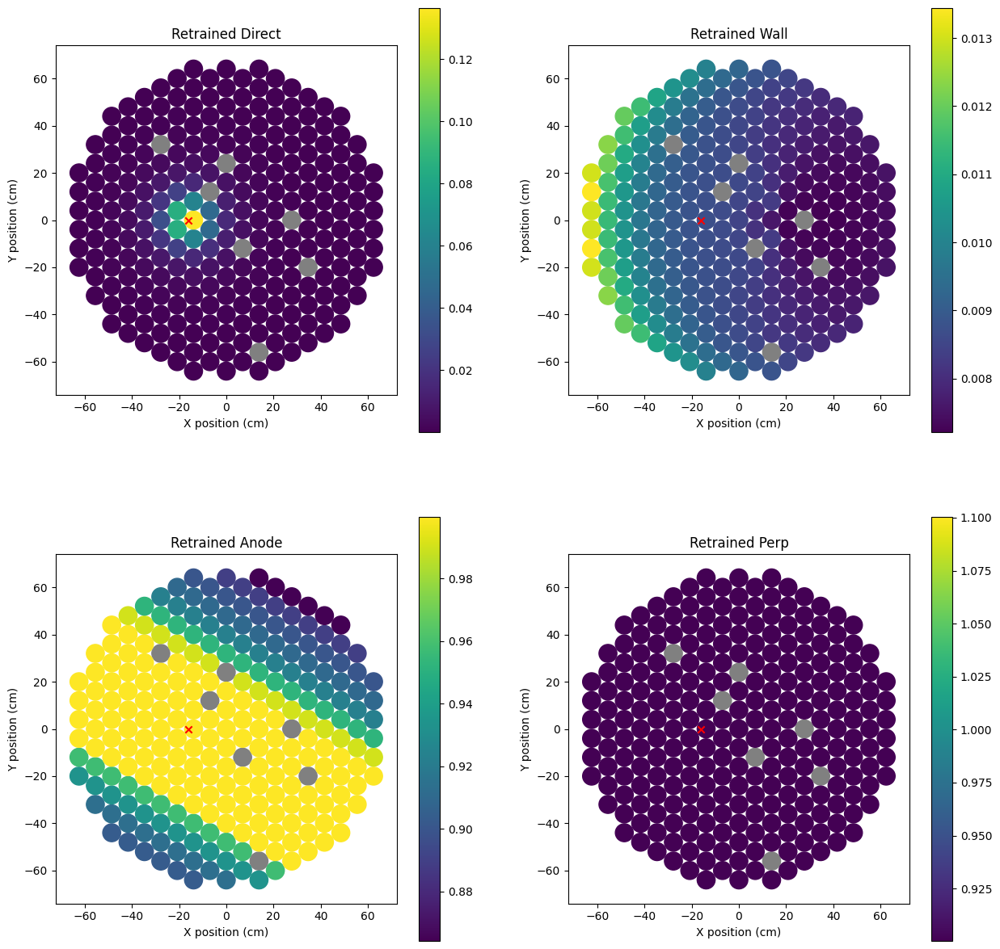

In [147]:
coord = [-16,0]
test = gen_model(seed=0, starting_model=test,
                 include_wall = True, include_perp = True, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
load_weights_from_dict(test, os.path.join(model_path, "RetrainExactPerp1.json"))

fig, ax = plt.subplots(2, 2, figsize=(15, 15))
ax = ax.flatten()
tmp = np.zeros(len(not_dead_pmts)+len(dead_pmts))
tmp[not_dead_pmts] = test.get_layer("PMTDistance_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[0], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Direct")
tmp[not_dead_pmts] = test.get_layer("Wall_Reflection_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[1], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Wall")
tmp[not_dead_pmts] = test.get_layer("Anode_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[2], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Anode")
tmp[not_dead_pmts] = test.get_layer("PerpendicularWire_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[3], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Perp")

2813/2813 [==============================] - 25s 9ms/step


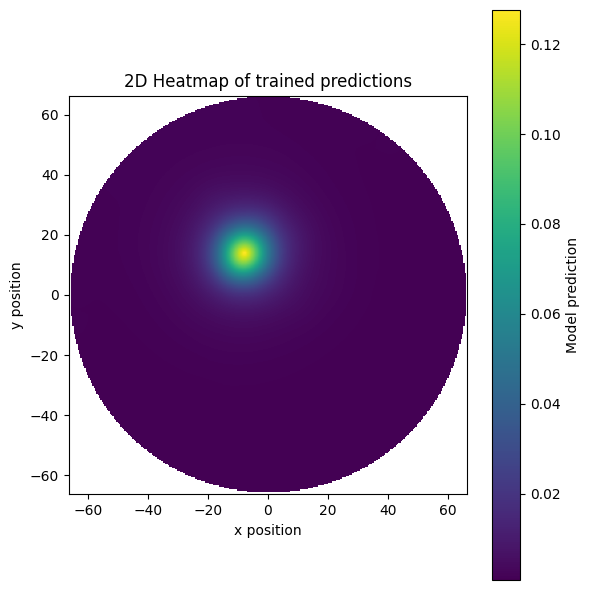

In [148]:
def tmp(i):
    import numpy as np
    import matplotlib.pyplot as plt

    # 1) Instantiate your MC map model
    model = keras.Model(inputs=test.get_layer("xy").input, outputs=test.get_layer("normalization").output)

    # 2) Define the circle radius and grid resolution
    radius = 66.4
    grid_N = 300  # adjust for finer/coarser grid

    # 3) Create a homogeneous grid over [-radius, radius]²
    x = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    y = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    xg, yg = np.meshgrid(x, y)  # shape [grid_N, grid_N]

    # 4) Flatten positions for prediction
    pos = np.stack([xg.ravel(), yg.ravel()], axis=1)  # shape [grid_N², 2]

    # 5) Predict values on the grid
    vals = model.predict(pos)[:,i]  # returns shape [grid_N²,] or [grid_N², 1]
    vals = vals.ravel().reshape(grid_N, grid_N)

    # 6) Mask out points outside the circle
    mask = (xg**2 + yg**2) > radius**2
    vals[mask] = np.nan

    # 7) Plot the heatmap
    plt.figure(figsize=(6,6))
    im = plt.imshow(
        vals.T, 
        origin='lower',
        extent=[-radius, radius, -radius, radius],
        aspect='equal',
        cmap='viridis'
    )
    cbar = plt.colorbar(im)
    cbar.set_label('Model prediction')
    plt.title('2D Heatmap of trained predictions')
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.tight_layout()
    plt.show()
# PMT under the perpendicular wire parametrization 
tmp(124-3)

1/1 [==============================] - 0s 37ms/step


<Axes: title={'center': 'Anode Parametrization'}, xlabel='X position (cm)', ylabel='Y position (cm)'>

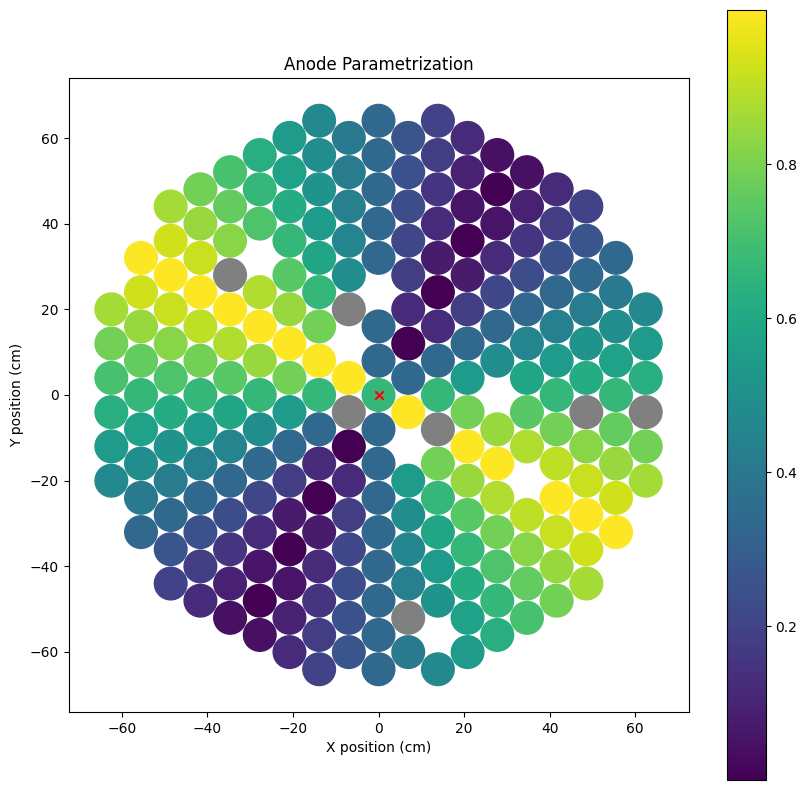

In [226]:
input_xy = tf.keras.layers.Input(shape=(2,), name='xy', dtype=tf.float32)
get_anode_inputs = Anode_Parametrization(pmt_pos=pmt_pos_top[not_dead_pmts], 
                                             pmt_r=7.62 / 2 , 
                                             name='Anode_Parametrization')
model = tf.keras.Model(inputs=input_xy, outputs=get_anode_inputs(input_xy))
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
plot_pmt_response(pmt_pos_top[not_dead_pmts], model.predict(np.array([[0,0]]))[0,:,1], mark_spot=[0,0], title="Anode Parametrization", dead_pmts=dead_pmts)

In [232]:
# Noticed that the anode parametrizations normalization is wrong - No clue how i got that wrong so I removed the normalization and continued
# Anode mesh still does not predict anything - changed activations, kernel inits and added Dropout 
# Load the trained model without anode and perp and then assign as starting point for new init
test = gen_model(seed=0, starting_model=None,
                 include_wall = True, include_perp = False, include_anode = False, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
load_weights_from_dict(test, os.path.join(model_path, "RetrainExactPerp1.json"))
test = gen_model(seed=0, starting_model=test,
                 include_wall = True, include_perp = False, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)

test.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
# Loading wieghts overwrites this apparently
test.get_layer('LossLayer').nan_safe.assign(False)

epochs = 10
bs = 2**6
steps_per_epoch = len(train_split)//(bs)+1
total_steps = epochs * steps_per_epoch
initial_lr = 1e-3
final_lr   = 1e-7
decay_rate = final_lr/initial_lr 

model_checkpoint_path = "/tmp/checkpoint"
c1 = keras.callbacks.ModelCheckpoint(model_checkpoint_path, 
                            save_best_only=True,
                            monitor='val_loss',
                            save_weights_only=True,
                            save_freq="epoch")

lrs = [1e-3]   
epochs_per_phase = 2
epoch_start = 0

for i in test.layers:
    if (i.name != "Anode_Pattern_Response") & (i.name != "i0"):
        i.trainable = False
    else:
        i.trainable = True

optimizer = tf.keras.optimizers.AdamW(learning_rate = 1.)

test.compile(optimizer=optimizer,
             )#keras.optimizers.AdamW(learning_rate=0.001))

for lr in lrs:
    # 1) assign new LR on the existing optimizer
    optimizer.learning_rate.assign(lr)
    print(f"Training epochs {epoch_start} → {epoch_start+epochs_per_phase} @ lr={lr:.1e}")

    test.fit(   
        {'xy':pos_cnf[train_split][::], 'pattern':patterns_real[train_split][::]},
            None,
            validation_data = ({'xy':pos_cnf[val_split][::], 'pattern':patterns_real[val_split][::]}, None),  
            initial_epoch=epoch_start,
            epochs=epoch_start + epochs_per_phase,
            batch_size = bs, #  14
            callbacks=[c1], verbose = 1)

    epoch_start += epochs_per_phase


"""
Unconstrained best: 2.0489 both inputs
Unconstrained best: 2.0462 After fix of mesh input

"""

save_weights_to_dict(test, os.path.join(model_path, "FixedAnode_NoPerp.json"))

Training epochs 0 → 2 @ lr=1.0e-03
Epoch 1/2
19667/19667 [==============================] - 2055s 104ms/step - loss: 2.0469 - val_loss: 1.8785
Epoch 2/2
19667/19667 [==============================] - 2053s 104ms/step - loss: 2.0468 - val_loss: 2.0617


10/10 [==============================] - 0s 1ms/step
(2356, 246, 2)
6.7019e-06 2.015528
4.553459e-07 0.9999991


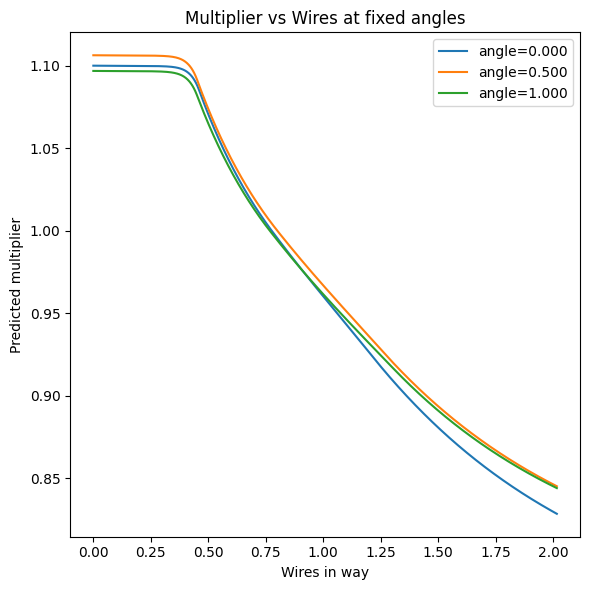

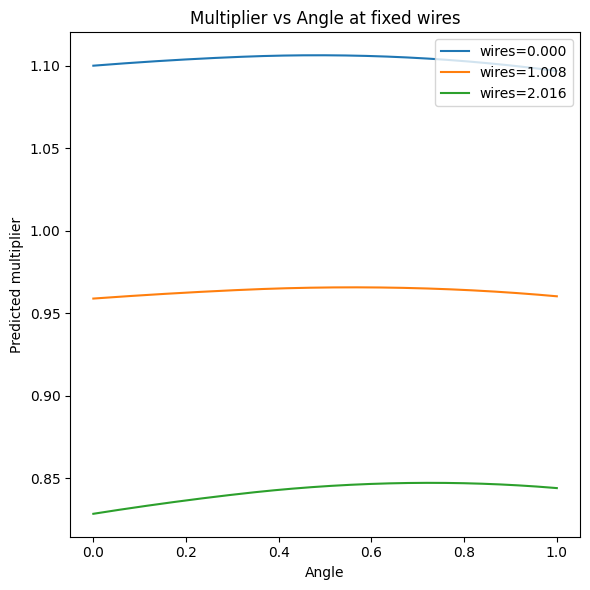

In [233]:
def tmp():
    import numpy as np
    import matplotlib.pyplot as plt
    import tensorflow as tf

    # 1) Extract submodels
    anode_model = test.get_layer("Anode_Pattern_Response")
    param_layer = anode_model.get_layer("Anode_Parametrization")
    param_model = tf.keras.Model(inputs=anode_model.input, outputs=param_layer.output)

    # 2) Utility: forward pass through the MonoDense stack for one PMT
    #    Get weights from MonoDense layers
    dense_model = tf.keras.Model(inputs=anode_model.get_layer("anode_dense_1").input, outputs=anode_model.get_layer("anode_dense_3").output)

    # 3) Sample random (x,y) inside the circle
    np.random.seed(0)
    N0 = 3000
    R  = 66.4
    pos = np.random.uniform(-R, R, size=(N0, 2))
    mask = (pos[:,0]**2 + pos[:,1]**2) <= R**2
    pos = pos[mask]

    # 4) Compute input features for all PMTs
    features = param_model.predict(pos, batch_size=256)  # shape [M, 246, 2]
    print(features.shape)
    # Flatten to [M*246, 2]
    feats_flat = features.reshape(-1, 2)
    wires_all = feats_flat[:, 0]
    angle_all = feats_flat[:, 1]
    print(np.min(wires_all), np.max(wires_all))
    print(np.min(angle_all), np.max(angle_all))

    # 5) Determine min/max and extend range
    w_min, w_max = wires_all.min(), wires_all.max()
    a_min, a_max = angle_all.min(), angle_all.max()

    # 6) Create grids and fixed values (min, mid, max)
    M = 246*4
    w_grid = np.linspace(w_min, w_max, M).reshape(-1, 246)
    a_grid = np.linspace(a_min, a_max, M).reshape(-1, 246)
    w_mid = 0.5 * (w_min + w_max)
    a_mid = 0.5 * (a_min + a_max)
    fixed_wires = [w_min, w_mid, w_max]
    fixed_angles = [a_min, a_mid, a_max]

    # 7) Compute outputs for three fixed angles
    plt.figure(figsize=(6, 6))
    for a_fix in fixed_angles:
        inp = np.stack([w_grid, np.full_like(w_grid, a_fix)], axis=-1)
        out = dense_model(inp)[:,:,0]
        plt.plot(w_grid.flatten(), out.numpy().flatten()+1, label=f"angle={a_fix:.3f}")
    plt.xlabel("Wires in way")
    plt.ylabel("Predicted multiplier")
    plt.title("Multiplier vs Wires at fixed angles")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 8) Compute outputs for three fixed wires
    plt.figure(figsize=(6, 6))
    for w_fix in fixed_wires:
        inp = np.stack([np.full_like(a_grid, w_fix), a_grid], axis=-1)
        out = dense_model(inp)[:,:,0]
        plt.plot(a_grid.flatten(), out.numpy().flatten()+1, label=f"wires={w_fix:.3f}")
    plt.xlabel("Angle")
    plt.ylabel("Predicted multiplier")
    plt.title("Multiplier vs Angle at fixed wires")
    plt.legend()
    plt.tight_layout()
    plt.show()



tmp()

2813/2813 [==============================] - 25s 9ms/step


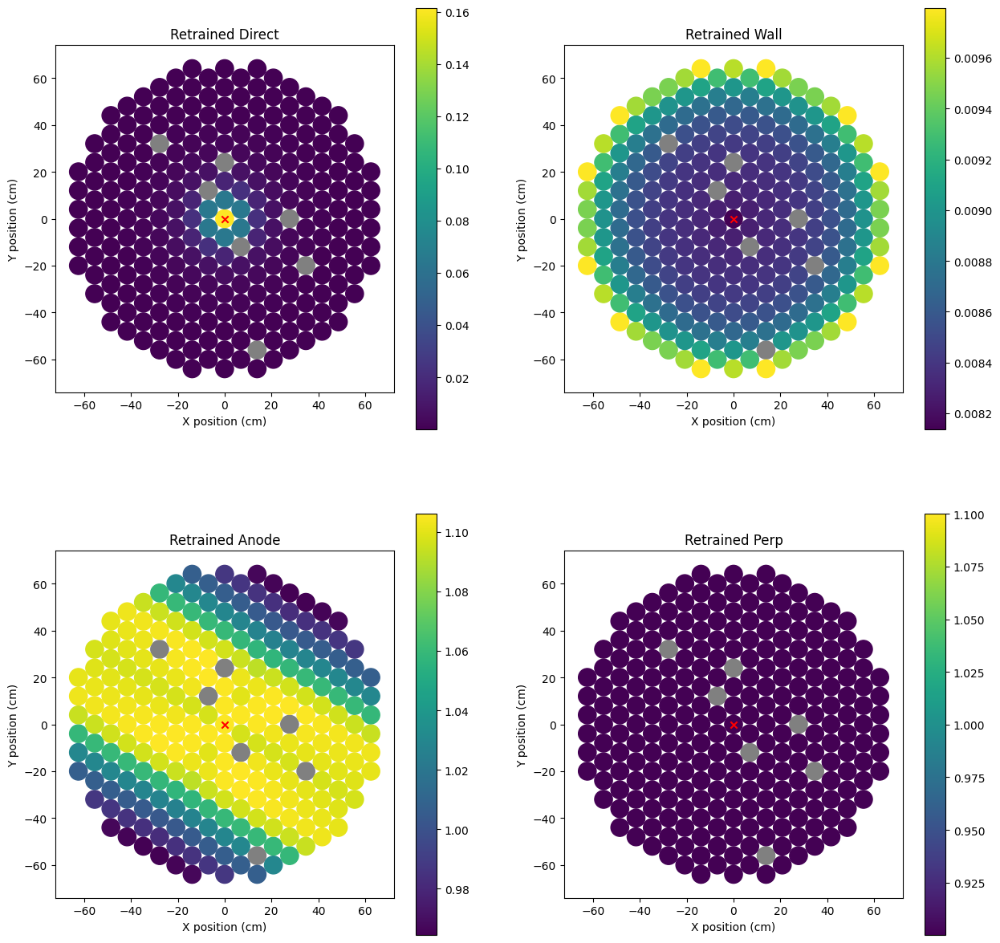

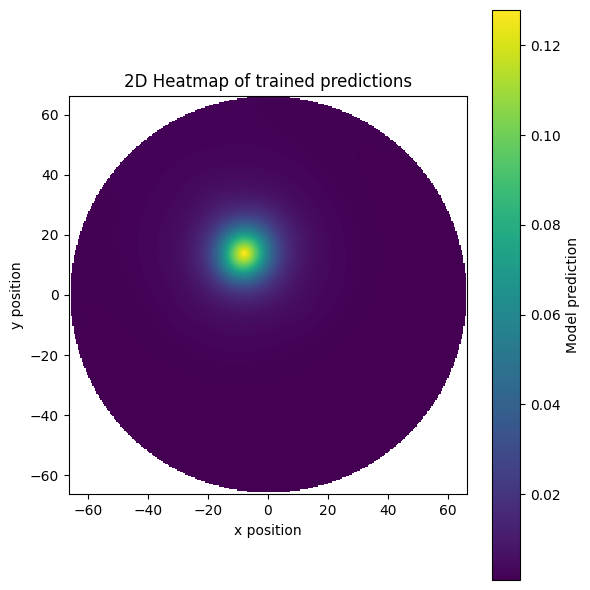

In [234]:
coord = [-0,0]
test = gen_model(seed=0, starting_model=test,
                 include_wall = True, include_perp = True, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
load_weights_from_dict(test, os.path.join(model_path, "FixedAnode_NoPerp.json"))

fig, ax = plt.subplots(2, 2, figsize=(15, 15))
ax = ax.flatten()
tmp = np.zeros(len(not_dead_pmts)+len(dead_pmts))
tmp[not_dead_pmts] = test.get_layer("PMTDistance_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[0], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Direct")
tmp[not_dead_pmts] = test.get_layer("Wall_Reflection_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[1], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Wall")
tmp[not_dead_pmts] = test.get_layer("Anode_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[2], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Anode")
tmp[not_dead_pmts] = test.get_layer("PerpendicularWire_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[3], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Perp")
def tmp(i):
    import numpy as np
    import matplotlib.pyplot as plt

    # 1) Instantiate your MC map model
    model = keras.Model(inputs=test.get_layer("xy").input, outputs=test.get_layer("normalization").output)

    # 2) Define the circle radius and grid resolution
    radius = 66.4
    grid_N = 300  # adjust for finer/coarser grid

    # 3) Create a homogeneous grid over [-radius, radius]²
    x = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    y = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    xg, yg = np.meshgrid(x, y)  # shape [grid_N, grid_N]

    # 4) Flatten positions for prediction
    pos = np.stack([xg.ravel(), yg.ravel()], axis=1)  # shape [grid_N², 2]

    # 5) Predict values on the grid
    vals = model.predict(pos)[:,i]  # returns shape [grid_N²,] or [grid_N², 1]
    vals = vals.ravel().reshape(grid_N, grid_N)

    # 6) Mask out points outside the circle
    mask = (xg**2 + yg**2) > radius**2
    vals[mask] = np.nan

    # 7) Plot the heatmap
    plt.figure(figsize=(6,6))
    im = plt.imshow(
        vals.T, 
        origin='lower',
        extent=[-radius, radius, -radius, radius],
        aspect='equal',
        cmap='viridis'
    )
    cbar = plt.colorbar(im)
    cbar.set_label('Model prediction')
    plt.title('2D Heatmap of trained predictions')
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.tight_layout()
    plt.show()
# PMT under the perpendicular wire parametrization 
tmp(124-3)

In [235]:
# The anode pattern isnt quite clear so first we refit without anode or perp

test = gen_model(seed=0, starting_model=None,
                    include_wall = True, include_perp = False, include_anode = False, 
                    multiplication_layers=True, radialLCE=False, monodense=True)
test.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)

load_weights_from_dict(test, os.path.join(model_path, "FixedAnode_NoPerp.json"))

test.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))

direct_wall_refit_1 =do_grid_search(pos_cnf, patterns_real, test, min_resolution, use_mean=True, start_factor=0)

np.savez(os.path.join(pos_refit_path, "direct_wall_refit_1.npz"), direct_wall_refit_1)

56191/56191 [==============================] - 428s 8ms/step
Resolution 1.0 : Factor 0
56191/56191 [==============================] - 426s 8ms/step
Resolution 0.5 : Factor 1
56191/56191 [==============================] - 423s 8ms/step
Resolution 0.25 : Factor 2
56191/56191 [==============================] - 427s 8ms/step
Resolution 0.125 : Factor 3
56191/56191 [==============================] - 412s 7ms/step
Resolution 0.0625 : Factor 4
56191/56191 [==============================] - 409s 7ms/step
Resolution 0.03125 : Factor 5
56191/56191 [==============================] - 416s 7ms/step
Resolution 0.015625 : Factor 6
56191/56191 [==============================] - 416s 7ms/step


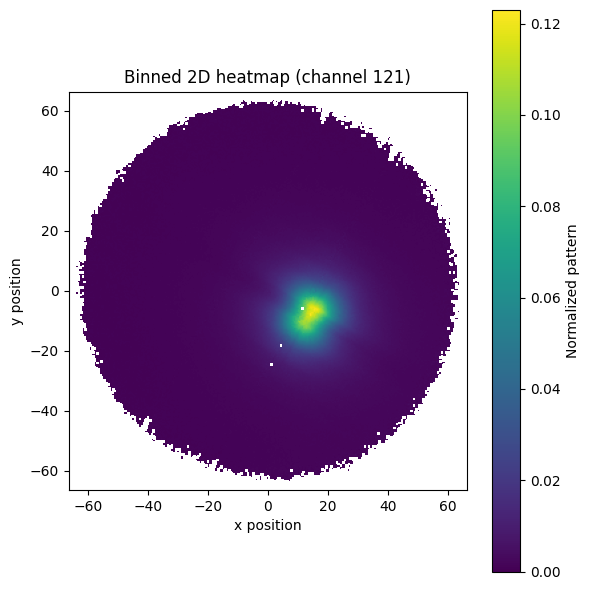

In [245]:
def plot_binned_heatmap(patterns_real, pos_cnf, channel_idx,
                        radius=66.4, grid_N=300):
    
    from scipy.stats import binned_statistic_2d
    import numpy as np
    import matplotlib.pyplot as plt
    # 1) Sum-normalize each pattern (row) along axis=1
    patterns_norm = patterns_real / patterns_real.sum(axis=1, keepdims=True)

    # 2) Extract positions and values for the chosen channel
    x = direct_wall_refit_1[:, 0]
    y = direct_wall_refit_1[:, 1]
    vals = patterns_norm[:, channel_idx]

    # 3) Define bin edges
    x_edges = np.linspace(-radius, radius, grid_N+1, dtype=np.float32)
    y_edges = np.linspace(-radius, radius, grid_N+1, dtype=np.float32)

    # 4) Compute the 2D binned statistic (mean per cell)
    stat, _, _, _ = binned_statistic_2d(
        x, y, vals,
        statistic='mean',
        bins=[x_edges, y_edges]
    )  # stat.shape == (grid_N, grid_N)

    # 5) Mask cells whose center lies outside the circle
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    Xc, Yc   = np.meshgrid(x_centers, y_centers, indexing='xy')
    mask = (Xc**2 + Yc**2) > radius**2
    stat[mask] = np.nan

    # 6) Plot
    plt.figure(figsize=(6,6))
    im = plt.imshow(
        stat.T,  # transpose so x runs left→right
        origin='lower',
        extent=[-radius, radius, -radius, radius],
        aspect='equal',
        cmap='viridis'
    )
    cbar = plt.colorbar(im)
    cbar.set_label('Normalized pattern')
    plt.title(f'Binned 2D heatmap (channel {channel_idx})')
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.tight_layout()
    plt.show()
plot_binned_heatmap(patterns_real, direct_wall_refit_1, 124-3)

In [246]:
test = gen_model(seed=0, starting_model=test,
                 include_wall = True, include_perp = True, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
test.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)
load_weights_from_dict(test, os.path.join(model_path, "FixedAnode_NoPerp.json"))

test.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))

test.evaluate({'xy':pos_cnf[val_split][::], 'pattern':patterns_real[val_split][::]},
            None,
            batch_size = 2**10, #  14
            verbose = 1)
test.evaluate({'xy':direct_wall_refit_1[val_split][::], 'pattern':patterns_real[val_split][::]},
            None,
            batch_size = 2**10, #  14
            verbose = 1)

527/527 [==============================] - 109s 207ms/step - loss: 1.7247


1.7246935367584229

In [247]:
test = gen_model(seed=0, starting_model=None,
                 include_wall = True, include_perp = False, include_anode = False, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
load_weights_from_dict(test, os.path.join(model_path, "FixedAnode_NoPerp.json"))
test = gen_model(seed=0, starting_model=test,
                 include_wall = True, include_perp = False, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)

test.get_layer('LossLayer').set_call_mode("exact", return_ratio = False)
# Loading wieghts overwrites this apparently
test.get_layer('LossLayer').nan_safe.assign(False)

epochs = 10
bs = 2**6
steps_per_epoch = len(train_split)//(bs)+1
total_steps = epochs * steps_per_epoch
initial_lr = 1e-3
final_lr   = 1e-7
decay_rate = final_lr/initial_lr 

model_checkpoint_path = "/tmp/checkpoint"
c1 = keras.callbacks.ModelCheckpoint(model_checkpoint_path, 
                            save_best_only=True,
                            monitor='val_loss',
                            save_weights_only=True,
                            save_freq="epoch")

lrs = [1e-3, 1e-4, 1e-5, 1e-6]   
epochs_per_phase = 3
epoch_start = 0

optimizer = tfa.optimizers.LAMB(learning_rate = 1.)

test.compile(optimizer=optimizer,
             )#keras.optimizers.AdamW(learning_rate=0.001))

for lr in lrs:
    # 1) assign new LR on the existing optimizer
    optimizer.learning_rate.assign(lr)
    print(f"Training epochs {epoch_start} → {epoch_start+epochs_per_phase} @ lr={lr:.1e}")

    test.fit(   
        {'xy':direct_wall_refit_1[train_split][::], 'pattern':patterns_real[train_split][::]},
            None,
            validation_data = ({'xy':direct_wall_refit_1[val_split][::], 'pattern':patterns_real[val_split][::]}, None),  
            initial_epoch=epoch_start,
            epochs=epoch_start + epochs_per_phase,
            batch_size = bs, #  14
            callbacks=[c1], verbose = 1)

    epoch_start += epochs_per_phase


"""
Unconstrained best: 2.0489 both inputs
Unconstrained best: 2.0462 After fix of mesh input

"""

save_weights_to_dict(test, os.path.join(model_path, "NoPerpPostPosRefit1.json"))

Training epochs 0 → 3 @ lr=1.0e-03
Epoch 1/3
19667/19667 [==============================] - 2154s 109ms/step - loss: 2.0470 - val_loss: 1.8846
Epoch 2/3
19667/19667 [==============================] - 2172s 110ms/step - loss: 2.0453 - val_loss: 2.0611
Epoch 3/3
19667/19667 [==============================] - 2182s 111ms/step - loss: 2.0450 - val_loss: 2.0656
Training epochs 3 → 6 @ lr=1.0e-04
Epoch 4/6
19667/19667 [==============================] - 2195s 112ms/step - loss: 2.0422 - val_loss: 1.8765
Epoch 5/6
19667/19667 [==============================] - 2206s 112ms/step - loss: 2.0421 - val_loss: 2.0602
Epoch 6/6
19667/19667 [==============================] - 2214s 113ms/step - loss: 2.0418 - val_loss: 1.8764
Training epochs 6 → 9 @ lr=1.0e-05
Epoch 7/9
19667/19667 [==============================] - 2222s 113ms/step - loss: 2.0416 - val_loss: 1.8764
Epoch 8/9
19667/19667 [==============================] - 2226s 113ms/step - loss: 2.0414 - val_loss: 2.0598
Epoch 9/9
19667/19667 [========

2813/2813 [==============================] - 24s 8ms/step


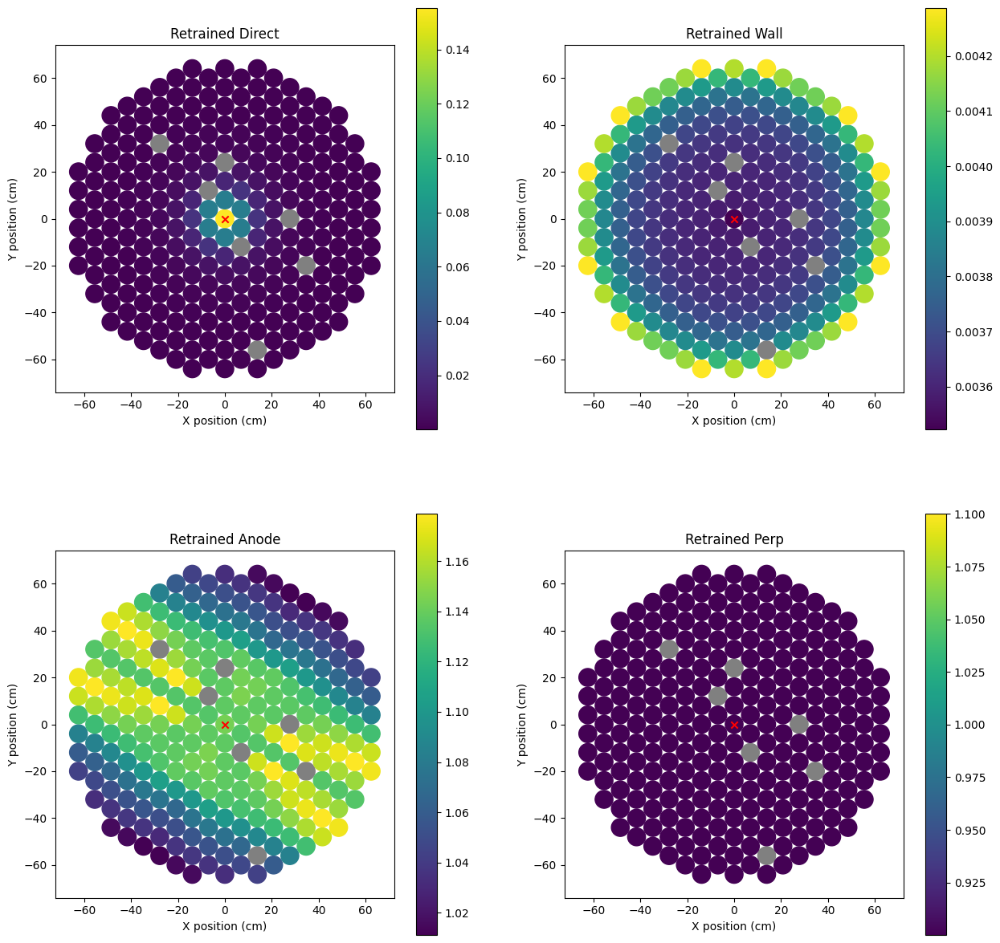

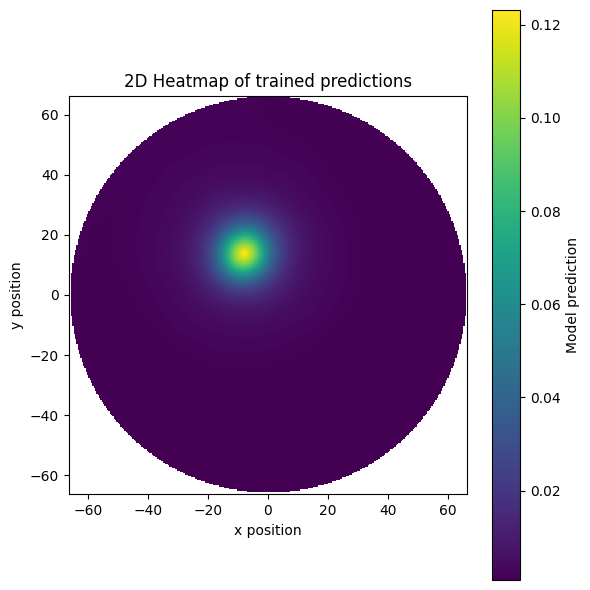

In [248]:
coord = [-0,0]
test = gen_model(seed=0, starting_model=test,
                 include_wall = True, include_perp = True, include_anode = True, 
                 multiplication_layers=True, radialLCE=False, monodense=True)
load_weights_from_dict(test, os.path.join(model_path, "NoPerpPostPosRefit1.json"))

fig, ax = plt.subplots(2, 2, figsize=(15, 15))
ax = ax.flatten()
tmp = np.zeros(len(not_dead_pmts)+len(dead_pmts))
tmp[not_dead_pmts] = test.get_layer("PMTDistance_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[0], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Direct")
tmp[not_dead_pmts] = test.get_layer("Wall_Reflection_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[1], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Wall")
tmp[not_dead_pmts] = test.get_layer("Anode_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[2], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Anode")
tmp[not_dead_pmts] = test.get_layer("PerpendicularWire_Pattern_Response").predict([coord])[0]
plot_pmt_response(pmt_pos=pmt_pos_top, response=tmp, ax=ax[3], mark_spot=coord, dead_pmts=dead_pmts, title="Retrained Perp")
def tmp(i):
    import numpy as np
    import matplotlib.pyplot as plt

    # 1) Instantiate your MC map model
    model = keras.Model(inputs=test.get_layer("xy").input, outputs=test.get_layer("normalization").output)

    # 2) Define the circle radius and grid resolution
    radius = 66.4
    grid_N = 300  # adjust for finer/coarser grid

    # 3) Create a homogeneous grid over [-radius, radius]²
    x = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    y = np.linspace(-radius, radius, grid_N, dtype=np.float32)
    xg, yg = np.meshgrid(x, y)  # shape [grid_N, grid_N]

    # 4) Flatten positions for prediction
    pos = np.stack([xg.ravel(), yg.ravel()], axis=1)  # shape [grid_N², 2]

    # 5) Predict values on the grid
    vals = model.predict(pos)[:,i]  # returns shape [grid_N²,] or [grid_N², 1]
    vals = vals.ravel().reshape(grid_N, grid_N)

    # 6) Mask out points outside the circle
    mask = (xg**2 + yg**2) > radius**2
    vals[mask] = np.nan

    # 7) Plot the heatmap
    plt.figure(figsize=(6,6))
    im = plt.imshow(
        vals.T, 
        origin='lower',
        extent=[-radius, radius, -radius, radius],
        aspect='equal',
        cmap='viridis'
    )
    cbar = plt.colorbar(im)
    cbar.set_label('Model prediction')
    plt.title('2D Heatmap of trained predictions')
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.tight_layout()
    plt.show()
# PMT under the perpendicular wire parametrization 
tmp(124-3)

In [249]:
# The anode pattern isnt quite clear so first we refit without anode or perp

test = gen_model(seed=0, starting_model=None,
                    include_wall = True, include_perp = False, include_anode = True, 
                    multiplication_layers=True, radialLCE=False, monodense=True)
test.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio = True)

load_weights_from_dict(test, os.path.join(model_path, "NoPerpPostPosRefit1.json"))

test.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate = 0.001))#keras.optimizers.AdamW(learning_rate=0.001))

dwa_refit_1 =do_grid_search(pos_cnf, patterns_real, test, min_resolution, use_mean=True, start_factor=0)

np.savez(os.path.join(pos_refit_path, "dwa_refit_1.npz"), dwa_refit_1)

56191/56191 [==============================] - 569s 10ms/step
Resolution 1.0 : Factor 0
56191/56191 [==============================] - 559s 10ms/step
Resolution 0.5 : Factor 1
56191/56191 [==============================] - 553s 10ms/step
Resolution 0.25 : Factor 2
56191/56191 [==============================] - 546s 10ms/step
Resolution 0.125 : Factor 3
56191/56191 [==============================] - 540s 10ms/step
Resolution 0.0625 : Factor 4
56191/56191 [==============================] - 532s 9ms/step
Resolution 0.03125 : Factor 5
56191/56191 [==============================] - 531s 9ms/step
Resolution 0.015625 : Factor 6
56191/56191 [==============================] - 455s 8ms/step


<Axes: title={'center': 'Direct + Wall + Anode Refit'}, xlabel='X Position', ylabel='Y Position'>

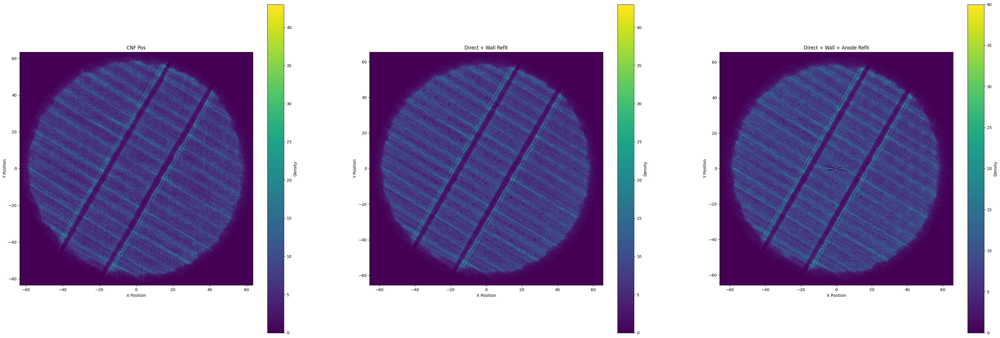

In [256]:
fig, ax = plt.subplots(1,3, figsize=(45, 15)) 

do_density_plot(ax[0], pos_cnf,bins =600, title="CNF Pos")

do_density_plot(ax[1], direct_wall_refit_1,bins =600, title="Direct + Wall Refit")

do_density_plot(ax[2], dwa_refit_1,bins =600, title="Direct + Wall + Anode Refit")

In [266]:
def ripley_L(points, radii, area=None):
    """
    Compute Ripley’s K(r) and L(r) for a 2D point pattern.

    Parameters
    ----------
    points : array_like, shape (n,2)
        The x,y coordinates of your events.
    radii : array_like, shape (m,)
        The distances at which to evaluate K and L.
    area : float, optional
        Total area of your study region. If None, uses the bounding‐box area.

    Returns
    -------
    K : ndarray, shape (m,)
    """
    from sklearn.neighbors import KDTree
    pts = np.asarray(points)
    n   = pts.shape[0]

    # 1) estimate area if needed
    if area is None:
        x0, y0 = pts.min(axis=0)
        x1, y1 = pts.max(axis=0)
        area = (x1 - x0) * (y1 - y0)

    # 2) build the tree (O(n log n))
    tree = KDTree(pts, leaf_size=40)

    # 3) for each r, count neighbors within r for all points
    K = np.empty(len(radii), dtype=float)
    for i, r in enumerate(radii):
        # count_including_self = array of length n
        counts = tree.query_radius(pts, r=r, count_only=True)
        # subtract self‐match
        sum_pairs = counts.sum() - n
        # Ripley’s K:
        K[i] = area * sum_pairs / (n * (n - 1))

    # 4) L‐function
    L = np.sqrt(K / np.pi)
    return L
# 1.5 min per
print("CNF Ripley stat diam PMT ", ripley_L(pos_cnf, [7.62 / 2])[0])
print("First Refit Ripley stat diam PMT ", ripley_L(direct_wall_refit_1, [7.62 / 2])[0])
print("Second Refit Ripley stat diam PMT ", ripley_L(dwa_refit_1, [7.62 / 2])[0])


CNF Ripley stat diam PMT  4.560920631799986
First Refit Ripley stat diam PMT  4.677122861242526
Second Refit Ripley stat diam PMT  4.6944459079099365


In [ ]:
"""
Write on Thesis up until Results should be completed soon as possible

Solve the length of wire in way problem

Set up test case for varying all layers (not Perp) alongside the positions 

Ripley metrics

"""

In [239]:
import numpy as np
import os

# 1) sample N points uniformly in circle
def sample_circle(N, R):
    θ = np.random.uniform(0, 2*np.pi, size=N)
    r = np.sqrt(np.random.uniform(0,1, size=N)) * R
    x = r * np.cos(θ)
    y = r * np.sin(θ)
    return np.stack([x, y], axis=1)  # shape (N,2)

# parameters
tpc_R     = 66.4
N_events  = 1000

# 2) build & load your full model exactly as before
test = gen_model(
    seed=0, starting_model=None,
    include_wall=True, include_perp=True, include_anode=True,
    multiplication_layers=True, radialLCE=False, monodense=True
)
test.get_layer('LossLayer').set_call_mode("LUT_untrainable_std", return_ratio=True)
load_weights_from_dict(
    test,
    os.path.join(model_path, "RetrainExactPerp1.json")
)

# 3) pick the sub‐model layers
layers = [
    "PMTDistance_Pattern_Response",
    "Wall_Reflection_Pattern_Response",
    "PerpendicularWire_Pattern_Response",
    "Anode_Pattern_Response",
]

coords = sample_circle(N_events, tpc_R)

# 4) collect predictions
preds = {}
for lname in layers:
    out = test.get_layer(lname).predict([coords], batch_size=256)[0]  # shape (N_events, n_pmts)
    preds[lname] = out

# 5) check which submodels actually vary across the disk
for lname, out in preds.items():
    # compare every row to the first
    if not np.allclose(out, out[0], atol=1e-6):
        print(f"{lname:<30} → varies across events")
    else:
        print(f"{lname:<30} → constant")


4/4 [==============================] - 0s 6ms/step
PMTDistance_Pattern_Response   → varies across events
Wall_Reflection_Pattern_Response → varies across events
PerpendicularWire_Pattern_Response → constant
Anode_Pattern_Response         → constant
